In [1]:
%%capture

%load_ext autoreload
%autoreload 2
%matplotlib inline
%load_ext tfl_training_anomaly_detection

In [2]:
%presentation_style

In [3]:
%%capture

%set_random_seed 12

In [4]:
%load_latex_macros


$\newcommand{\vect}[1]{{\mathbf{\boldsymbol{#1}} }}$
$\newcommand{\amax}{{\text{argmax}}}$
$\newcommand{\P}{{\mathbb{P}}}$
$\newcommand{\E}{{\mathbb{E}}}$
$\newcommand{\R}{{\mathbb{R}}}$
$\newcommand{\Z}{{\mathbb{Z}}}$
$\newcommand{\N}{{\mathbb{N}}}$
$\newcommand{\C}{{\mathbb{C}}}$
$\newcommand{\abs}[1]{{ \left| #1 \right| }}$
$\newcommand{\simpl}[1]{{\Delta^{#1} }}$


# Anomaly Detection via Reconstruction Error
<img src="_static/images/aai_presentation_first_slide.svg" alt="Snow" style="width:100%;">

In [5]:
import ipywidgets as widgets
import itertools as it
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px


from ipywidgets import interact
from sklearn.metrics import roc_auc_score, average_precision_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelBinarizer
from sklearn.ensemble import IsolationForest
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.neighbors import KernelDensity
from tensorflow import keras
from tqdm import tqdm

from tfl_training_anomaly_detection.exercise_tools import (
    evaluate, 
    get_kdd_data, 
    get_house_prices_data, 
    create_distributions, 
    contamination, 
    perform_rkde_experiment, 
    get_mnist_data
)
from tfl_training_anomaly_detection.vae import VAE, build_decoder_mnist, build_encoder_minst, build_contaminated_minst

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (5, 5)


# Anomaly Detection via Reconstruction Error
**Idea:** Embed the data into low dimensional space and reconstruct it again.
			Good embedding of nominal data $\Rightarrow$ high reconstruction error indicates anomaly.

**Autoencoder:**
- Parametric family of encoders: $f_\phi: \mathbb{R}^d \to \mathbb{R}^{\text{low}}$
- Parametric family of decoders: $g_\theta: \mathbb{R}^{\text{low}} \to \mathbb{R}^{d}$
- Reconstruction error of $(f_\phi, g_\theta)$ on $x$: $|x - g_\theta(f_\phi(x))|$
- Given data set $D$, find $\phi,\theta$ that minimize $\sum_{x\in D} L(|x- g_\theta(f_\phi(x))|) $
  for some loss function $L$.


# Visualization
<center>
<img src="_static/images/autoencoder.png" align="center" width="400">
    Autoencoder Schema
</center>

## Neural Networks
Neural networks are very well suited for finding low dimensional representations of data. Hence they are a popular choice for the encoder and the decoder.


**Artificial Neuron with $N$ inputs:** $y = \sigma\left(\sum_i^N w_i X_i + b\right)$

- $\sigma$: nonlinear activation-function (applied component wise).
- $b$ bias


<table style="background-color:#FFFFFF;">
    <tr>
        <td style="background-color:#FFFFFF;"><img src="_static/images/neuron.png" width="200"></td>
        <td style="background-color:#FFFFFF;"><img src="_static/images/activations.png"  width="200"></td>
    </tr>
    <tr>
        <td colspan="2" style="background-color:#FFFFFF;"><center>Isolation depth of nominal point and anomaly</center></td>
    </tr>
</table>

# Neural Networks

Neural networks combine many artificial neurons into a complex network. These networks are usually organized in layers
where the result of each layer is the input for the next layer. Some commonly used layers are:

<center>
<img src="_static/images/nn_layers.png" align="center" width="600">
</center>

## Variational Autoencoders
An important extension of autoencoders that relates the idea to density estimation.
More precisely, we define a generative model for our data using latent variables and combine the maximum likelihood
estimation of the parameters with a simultaneous posterior estimation of the latents through amortized stochastic
variational inference. We use a decoder network to transform the latent variables into the data distribution, and an
encoder network to compute the posterior distribution of the latents given the data.

**Definition:**


The model uses an observed variable $X$ (the data) and a latent variable $Z$ (the defining features of $X$). We assume
both $P(Z)$ and $P(X\mid Z)$ to be normally distributed. More precisely

- $P(Z) = \mathcal{N}(0, I)$
- $P(X\mid Z) = \mathcal{N}(\mu_\phi(Z), I)$

where $\mu_\phi$ is a neural network parametrized with $\phi$.
We use variational inference to perform posterior inference on $Z$ given $X$. We assume that the distribution $P(Z\mid X)$
to be relatively well approximated by a Gaussian and use the posterior approximation:
- $q(X\mid Z) = \mathcal{N}(\mu_\psi(X), \sigma_\psi(X))$

$\mu_\psi$ and $\sigma_\psi$ are neural networks parameterized with $\psi$



<center>
<img src="_static/images/vae_schema.png" align="center" width="600">
</center>

Given a data set $D$ we minimize the (amortized) Kullback-Leibler divergence between our posterior approximation and the
true posterior:
\begin{align*}
  D_{KL}(q(z\mid x),p(z\mid x)) &= E_{x\sim X, z\sim q(Z\mid x)}\left[\log\left(\frac{q(z \mid x)}{p(z \mid X)}\right)\right] \\
    &= E_{x\sim X, z\sim q(Z\mid X)}\left[\log\left(\frac{q(z \mid x)}{\frac{p(x \mid z)p(z)}{p(x)}}\right)\right] \\
    &= E_{x\sim X, z\sim q(Z\mid x)}\left[\log\left(\frac{q(z \mid x)}{p(x \mid z)p(z)}\right) + \log(p(x))\right] \\
    &= E_{x\sim X, z\sim q(Z\mid x)}\left[\log\left(\frac{q(z \mid x)}{p(x \mid z)p(z)}\right)\right]  + E_{x\sim X}[\log(p(x))]\\
\end{align*}

Now we can define

\begin{align*}
    \mathrm{ELBO}(q(z\mid x),p(z\mid x)) &:= E_{x\sim X}[\log(p(x))] - D_{KL}(q(z\mid x),p(z\mid x)) \\
        &= -E_{x\sim X, z\sim q(Z\mid x)}\left[\log\left(\frac{q(z \mid x)}{p(x \mid z)p(z)}\right)\right]
\end{align*}

Note that we can evaluate the expression inside the expectation of the final RHS of the
equation and we can obtain unbiased estmates of the expectation via sampling.
Let us further try to understand the ELBO as an optimization objective. On one hand, maximizing the ELBO with respect to the parameters in $q$ is equivalent to
minimizing the KL divergence between $p$ and $q$. On the other hand, maximizing the ELBO with
respect to the parameters in $p$ can be understood as raising a lower bound for the likelihood of the
generative model $p(x)$. Hence, the optimization tries to find an encoder and a decoder pair such that
it simultaneously provides a good generative explanation of the data and a good approximation of the posterior
distribution of the latent variables.

# Exercise

# The MNIST Data Set
MNIST is one of the most iconic data sets in the history of machine learning.
It contains 70000 samples of $28\times 28$ grayscale images of handwritten digits.
Because of its moderate complexity and good visualizability it is well suited to study the behavior of machine learning
algorithms in higher dimensional spaces.

While originally created for classification (optical character recognition), we can build an anomaly detection data set
by corrupting some of the images.


# Pre-processing
We first need to obtain the MNIST data set and prepare an anomaly detection set from it.
Note that the data set is n row vector format.
Therefore, we work with $28\times 28 = 784$ dimensional data points.

## Load MNIST Data Set

In [6]:
mnist = get_mnist_data()

data = mnist['data']
print('data.shape: {}'.format(data.shape))
target = mnist['target'].astype(int)

data.shape: (70000, 784)


## Build contaminated Data Sets
We prepared a function that does the job for us.
It corrupts a prescribed portion of the data by introducing a rotation, noise or a blackout of some part of the image.

First, we need to transform the data into image format.

In [7]:
X = data.reshape(-1, 28, 28, 1)/255

### Train/Test-Split
We will only corrupt the test set, hence we will perform the train-test split beforehand.
We separate a relatively small test set so that we can use as much as possible from the data to obtain high quality
representations.

In [8]:
test_size = .1
X_train, X_test, target_train, target_test = train_test_split(X, target, test_size=test_size)

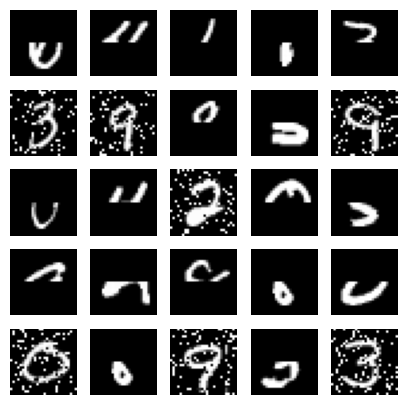

In [9]:
X_test, y_test = build_contaminated_minst(X_test)

# Visualize contamination
anomalies = X_test[y_test != 0]
selection = np.random.choice(len(anomalies), 25)

fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(5, 5))
for img, ax in zip(anomalies[selection], axes.flatten()):
    ax.imshow(img, 'gray')
    ax.axis('off')
plt.show()

# Autoencoder
Let us finally train an autoencoder model. We replicate the model given in the
[Keras documentation](https://keras.io/examples/generative/vae/) and apply it in a synthetic outlier detection scenario
based on MNIST.

in the vae package we provide the implementation of the VAE. Please take a look into the source code to see how
the minimization of the KL divergence is implemented.

## Create Model

In [10]:
latent_dim = 3
vae = VAE(decoder=build_decoder_mnist(latent_dim=latent_dim), encoder=build_encoder_minst(latent_dim=latent_dim))

In [11]:
## Inspect model architecture
vae.encoder.summary()


Model: "encoder"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_2 (InputLayer)        [(None, 28, 28, 1)]          0         []                            


 conv2d (Conv2D)             (None, 14, 14, 32)           320       ['input_2[0][0]']             


 conv2d_1 (Conv2D)           (None, 7, 7, 64)             18496     ['conv2d[0][0]']              


 flatten (Flatten)           (None, 3136)                 0         ['conv2d_1[0][0]']            


 dense_1 (Dense)             (None, 16)                   50192     ['flatten[0][0]']             


 z_mean (Dense)              (None, 3)                    51        ['dense_1[0][0]']             


 z_log_var (Dense)           (None, 3)                    51        ['dense_1[0][0]']             


 sampling (Sampling)         (None, 3)                    0         ['z_mean[0][0]',              


                                                                     'z_log_var[0][0]']           


Total params: 69110 (269.96 KB)


Trainable params: 69110 (269.96 KB)


Non-trainable params: 0 (0.00 Byte)


__________________________________________________________________________________________________


In [12]:
## Inspect model architecture
vae.decoder.summary()


Model: "decoder"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 3)]               0         


 dense (Dense)               (None, 3136)              12544     


 reshape (Reshape)           (None, 7, 7, 64)          0         


 conv2d_transpose (Conv2DTr  (None, 14, 14, 64)        36928     


 anspose)                                                        


 conv2d_transpose_1 (Conv2D  (None, 28, 28, 32)        18464     


 Transpose)                                                      


 conv2d_transpose_2 (Conv2D  (None, 28, 28, 1)         289       


 Transpose)                                                      


Total params: 68225 (266.50 KB)


Trainable params: 68225 (266.50 KB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [13]:
# train model
n_epochs = 30

vae.compile(optimizer=keras.optimizers.Adam(learning_rate=.001))
history = vae.fit(X_train, epochs=n_epochs, batch_size=128)

Epoch 1/30


  1/493 [..............................] - ETA: 5:00 - loss: 89.0940 - reconstruction_loss: 89.0870 - kl_loss: 0.0070

  4/493 [..............................] - ETA: 12s - loss: 88.8129 - reconstruction_loss: 88.5588 - kl_loss: 0.0061 

  7/493 [..............................] - ETA: 12s - loss: 88.5792 - reconstruction_loss: 88.1084 - kl_loss: 0.0039

  9/493 [..............................] - ETA: 12s - loss: 88.4164 - reconstruction_loss: 87.7536 - kl_loss: 0.0030

 12/493 [..............................] - ETA: 11s - loss: 88.1352 - reconstruction_loss: 87.0242 - kl_loss: 0.0023

 15/493 [..............................] - ETA: 11s - loss: 87.7778 - reconstruction_loss: 85.9637 - kl_loss: 0.0019

 18/493 [>.............................] - ETA: 11s - loss: 87.3219 - reconstruction_loss: 84.5184 - kl_loss: 0.0018

 21/493 [>.............................] - ETA: 11s - loss: 86.7400 - reconstruction_loss: 82.5683 - kl_loss: 0.0025

 24/493 [>.............................] - ETA: 11s - loss: 86.0201 - reconstruction_loss: 80.1309 - kl_loss: 0.0058

 27/493 [>.............................] - ETA: 11s - loss: 85.1727 - reconstruction_loss: 77.4828 - kl_loss: 0.0181

 30/493 [>.............................] - ETA: 11s - loss: 84.2367 - reconstruction_loss: 74.9570 - kl_loss: 0.0413

 33/493 [=>............................] - ETA: 10s - loss: 83.2634 - reconstruction_loss: 72.7558 - kl_loss: 0.0507

 36/493 [=>............................] - ETA: 10s - loss: 82.2789 - reconstruction_loss: 70.7793 - kl_loss: 0.0508

 39/493 [=>............................] - ETA: 10s - loss: 81.3005 - reconstruction_loss: 68.8876 - kl_loss: 0.0485

 42/493 [=>............................] - ETA: 10s - loss: 80.3323 - reconstruction_loss: 67.1336 - kl_loss: 0.0458

 45/493 [=>............................] - ETA: 10s - loss: 79.3820 - reconstruction_loss: 65.4719 - kl_loss: 0.0434

 48/493 [=>............................] - ETA: 10s - loss: 78.4517 - reconstruction_loss: 63.9449 - kl_loss: 0.0413

 51/493 [==>...........................] - ETA: 10s - loss: 77.5455 - reconstruction_loss: 62.5500 - kl_loss: 0.0396

 54/493 [==>...........................] - ETA: 10s - loss: 76.6655 - reconstruction_loss: 61.2223 - kl_loss: 0.0384

 57/493 [==>...........................] - ETA: 10s - loss: 75.8113 - reconstruction_loss: 59.9826 - kl_loss: 0.0378

 60/493 [==>...........................] - ETA: 10s - loss: 74.9839 - reconstruction_loss: 58.8615 - kl_loss: 0.0378

 63/493 [==>...........................] - ETA: 10s - loss: 74.1843 - reconstruction_loss: 57.7978 - kl_loss: 0.0381

 66/493 [===>..........................] - ETA: 9s - loss: 73.4124 - reconstruction_loss: 56.8465 - kl_loss: 0.0383 

 68/493 [===>..........................] - ETA: 9s - loss: 72.9128 - reconstruction_loss: 56.2332 - kl_loss: 0.0383

 71/493 [===>..........................] - ETA: 9s - loss: 72.1852 - reconstruction_loss: 55.3750 - kl_loss: 0.0382

 74/493 [===>..........................] - ETA: 9s - loss: 71.4831 - reconstruction_loss: 54.5610 - kl_loss: 0.0379

 77/493 [===>..........................] - ETA: 9s - loss: 70.8058 - reconstruction_loss: 53.8190 - kl_loss: 0.0375

 80/493 [===>..........................] - ETA: 9s - loss: 70.1523 - reconstruction_loss: 53.1205 - kl_loss: 0.0370

 83/493 [====>.........................] - ETA: 9s - loss: 69.5225 - reconstruction_loss: 52.4830 - kl_loss: 0.0365

 86/493 [====>.........................] - ETA: 9s - loss: 68.9149 - reconstruction_loss: 51.8510 - kl_loss: 0.0361

 89/493 [====>.........................] - ETA: 9s - loss: 68.3282 - reconstruction_loss: 51.2876 - kl_loss: 0.0356

 92/493 [====>.........................] - ETA: 9s - loss: 67.7623 - reconstruction_loss: 50.7664 - kl_loss: 0.0350

 95/493 [====>.........................] - ETA: 9s - loss: 67.2166 - reconstruction_loss: 50.2983 - kl_loss: 0.0345

 98/493 [====>.........................] - ETA: 9s - loss: 66.6902 - reconstruction_loss: 49.8315 - kl_loss: 0.0339

101/493 [=====>........................] - ETA: 9s - loss: 66.1821 - reconstruction_loss: 49.4103 - kl_loss: 0.0333

104/493 [=====>........................] - ETA: 9s - loss: 65.6912 - reconstruction_loss: 48.9944 - kl_loss: 0.0326

107/493 [=====>........................] - ETA: 9s - loss: 65.2165 - reconstruction_loss: 48.5968 - kl_loss: 0.0320

110/493 [=====>........................] - ETA: 8s - loss: 64.7573 - reconstruction_loss: 48.2220 - kl_loss: 0.0313

113/493 [=====>........................] - ETA: 8s - loss: 64.3128 - reconstruction_loss: 47.8600 - kl_loss: 0.0305

116/493 [======>.......................] - ETA: 8s - loss: 63.8823 - reconstruction_loss: 47.5316 - kl_loss: 0.0298

119/493 [======>.......................] - ETA: 8s - loss: 63.4656 - reconstruction_loss: 47.2212 - kl_loss: 0.0291

122/493 [======>.......................] - ETA: 8s - loss: 63.0617 - reconstruction_loss: 46.9078 - kl_loss: 0.0285

125/493 [======>.......................] - ETA: 8s - loss: 62.6701 - reconstruction_loss: 46.6232 - kl_loss: 0.0279

128/493 [======>.......................] - ETA: 8s - loss: 62.2902 - reconstruction_loss: 46.3335 - kl_loss: 0.0273

131/493 [======>.......................] - ETA: 8s - loss: 61.9210 - reconstruction_loss: 46.0523 - kl_loss: 0.0267

134/493 [=======>......................] - ETA: 8s - loss: 61.5623 - reconstruction_loss: 45.7905 - kl_loss: 0.0261

137/493 [=======>......................] - ETA: 8s - loss: 61.2139 - reconstruction_loss: 45.5420 - kl_loss: 0.0256

140/493 [=======>......................] - ETA: 8s - loss: 60.8754 - reconstruction_loss: 45.3195 - kl_loss: 0.0251

143/493 [=======>......................] - ETA: 8s - loss: 60.5464 - reconstruction_loss: 45.0854 - kl_loss: 0.0246

145/493 [=======>......................] - ETA: 8s - loss: 60.3319 - reconstruction_loss: 44.9290 - kl_loss: 0.0243

148/493 [========>.....................] - ETA: 8s - loss: 60.0173 - reconstruction_loss: 44.7120 - kl_loss: 0.0239

151/493 [========>.....................] - ETA: 7s - loss: 59.7110 - reconstruction_loss: 44.5171 - kl_loss: 0.0234

154/493 [========>.....................] - ETA: 7s - loss: 59.4129 - reconstruction_loss: 44.3170 - kl_loss: 0.0230

157/493 [========>.....................] - ETA: 7s - loss: 59.1225 - reconstruction_loss: 44.1337 - kl_loss: 0.0227

159/493 [========>.....................] - ETA: 7s - loss: 58.9331 - reconstruction_loss: 44.0179 - kl_loss: 0.0224

161/493 [========>.....................] - ETA: 7s - loss: 58.7470 - reconstruction_loss: 43.9000 - kl_loss: 0.0222

164/493 [========>.....................] - ETA: 7s - loss: 58.4737 - reconstruction_loss: 43.7289 - kl_loss: 0.0219

167/493 [=========>....................] - ETA: 7s - loss: 58.2072 - reconstruction_loss: 43.5573 - kl_loss: 0.0216

170/493 [=========>....................] - ETA: 7s - loss: 57.9469 - reconstruction_loss: 43.3833 - kl_loss: 0.0213

173/493 [=========>....................] - ETA: 7s - loss: 57.6929 - reconstruction_loss: 43.2211 - kl_loss: 0.0210

176/493 [=========>....................] - ETA: 7s - loss: 57.4448 - reconstruction_loss: 43.0635 - kl_loss: 0.0207

179/493 [=========>....................] - ETA: 7s - loss: 57.2025 - reconstruction_loss: 42.9195 - kl_loss: 0.0204

182/493 [==========>...................] - ETA: 7s - loss: 56.9659 - reconstruction_loss: 42.7858 - kl_loss: 0.0201

185/493 [==========>...................] - ETA: 7s - loss: 56.7349 - reconstruction_loss: 42.6529 - kl_loss: 0.0198

188/493 [==========>...................] - ETA: 7s - loss: 56.5090 - reconstruction_loss: 42.5107 - kl_loss: 0.0195

190/493 [==========>...................] - ETA: 7s - loss: 56.3612 - reconstruction_loss: 42.4255 - kl_loss: 0.0193

193/493 [==========>...................] - ETA: 7s - loss: 56.1435 - reconstruction_loss: 42.2907 - kl_loss: 0.0190

196/493 [==========>...................] - ETA: 6s - loss: 55.9305 - reconstruction_loss: 42.1700 - kl_loss: 0.0187

199/493 [===========>..................] - ETA: 6s - loss: 55.7219 - reconstruction_loss: 42.0278 - kl_loss: 0.0185

202/493 [===========>..................] - ETA: 6s - loss: 55.5175 - reconstruction_loss: 41.8947 - kl_loss: 0.0182

205/493 [===========>..................] - ETA: 6s - loss: 55.3172 - reconstruction_loss: 41.7728 - kl_loss: 0.0180

208/493 [===========>..................] - ETA: 6s - loss: 55.1210 - reconstruction_loss: 41.6602 - kl_loss: 0.0177

211/493 [===========>..................] - ETA: 6s - loss: 54.9288 - reconstruction_loss: 41.5455 - kl_loss: 0.0175

214/493 [============>.................] - ETA: 6s - loss: 54.7404 - reconstruction_loss: 41.4357 - kl_loss: 0.0173

217/493 [============>.................] - ETA: 6s - loss: 54.5557 - reconstruction_loss: 41.3291 - kl_loss: 0.0170

220/493 [============>.................] - ETA: 6s - loss: 54.3747 - reconstruction_loss: 41.2275 - kl_loss: 0.0168

223/493 [============>.................] - ETA: 6s - loss: 54.1971 - reconstruction_loss: 41.1289 - kl_loss: 0.0166

226/493 [============>.................] - ETA: 6s - loss: 54.0231 - reconstruction_loss: 41.0348 - kl_loss: 0.0164

229/493 [============>.................] - ETA: 6s - loss: 53.8523 - reconstruction_loss: 40.9380 - kl_loss: 0.0162

232/493 [=============>................] - ETA: 6s - loss: 53.6847 - reconstruction_loss: 40.8495 - kl_loss: 0.0160

235/493 [=============>................] - ETA: 6s - loss: 53.5203 - reconstruction_loss: 40.7588 - kl_loss: 0.0158

238/493 [=============>................] - ETA: 5s - loss: 53.3589 - reconstruction_loss: 40.6692 - kl_loss: 0.0156

241/493 [=============>................] - ETA: 5s - loss: 53.2004 - reconstruction_loss: 40.5837 - kl_loss: 0.0154

244/493 [=============>................] - ETA: 5s - loss: 53.0448 - reconstruction_loss: 40.5039 - kl_loss: 0.0153

246/493 [=============>................] - ETA: 5s - loss: 52.9427 - reconstruction_loss: 40.4536 - kl_loss: 0.0152

249/493 [==============>...............] - ETA: 5s - loss: 52.7918 - reconstruction_loss: 40.3762 - kl_loss: 0.0150

252/493 [==============>...............] - ETA: 5s - loss: 52.6435 - reconstruction_loss: 40.2986 - kl_loss: 0.0148

255/493 [==============>...............] - ETA: 5s - loss: 52.4978 - reconstruction_loss: 40.2196 - kl_loss: 0.0147

258/493 [==============>...............] - ETA: 5s - loss: 52.3546 - reconstruction_loss: 40.1427 - kl_loss: 0.0145

261/493 [==============>...............] - ETA: 5s - loss: 52.2139 - reconstruction_loss: 40.0788 - kl_loss: 0.0143

264/493 [===============>..............] - ETA: 5s - loss: 52.0756 - reconstruction_loss: 40.0080 - kl_loss: 0.0142

267/493 [===============>..............] - ETA: 5s - loss: 51.9397 - reconstruction_loss: 39.9408 - kl_loss: 0.0140

270/493 [===============>..............] - ETA: 5s - loss: 51.8060 - reconstruction_loss: 39.8714 - kl_loss: 0.0139

273/493 [===============>..............] - ETA: 5s - loss: 51.6746 - reconstruction_loss: 39.8145 - kl_loss: 0.0137

276/493 [===============>..............] - ETA: 5s - loss: 51.5453 - reconstruction_loss: 39.7525 - kl_loss: 0.0136

279/493 [===============>..............] - ETA: 5s - loss: 51.4182 - reconstruction_loss: 39.6870 - kl_loss: 0.0135

282/493 [================>.............] - ETA: 4s - loss: 51.2932 - reconstruction_loss: 39.6342 - kl_loss: 0.0133

285/493 [================>.............] - ETA: 4s - loss: 51.1702 - reconstruction_loss: 39.5742 - kl_loss: 0.0132

288/493 [================>.............] - ETA: 4s - loss: 51.0491 - reconstruction_loss: 39.5149 - kl_loss: 0.0131

291/493 [================>.............] - ETA: 4s - loss: 50.9300 - reconstruction_loss: 39.4591 - kl_loss: 0.0129

294/493 [================>.............] - ETA: 4s - loss: 50.8126 - reconstruction_loss: 39.4038 - kl_loss: 0.0128

297/493 [=================>............] - ETA: 4s - loss: 50.6971 - reconstruction_loss: 39.3473 - kl_loss: 0.0127

300/493 [=================>............] - ETA: 4s - loss: 50.5834 - reconstruction_loss: 39.2927 - kl_loss: 0.0126

303/493 [=================>............] - ETA: 4s - loss: 50.4714 - reconstruction_loss: 39.2372 - kl_loss: 0.0125

306/493 [=================>............] - ETA: 4s - loss: 50.3610 - reconstruction_loss: 39.1792 - kl_loss: 0.0123

309/493 [=================>............] - ETA: 4s - loss: 50.2522 - reconstruction_loss: 39.1301 - kl_loss: 0.0122

312/493 [=================>............] - ETA: 4s - loss: 50.1451 - reconstruction_loss: 39.0823 - kl_loss: 0.0121

315/493 [==================>...........] - ETA: 4s - loss: 50.0396 - reconstruction_loss: 39.0403 - kl_loss: 0.0120

318/493 [==================>...........] - ETA: 4s - loss: 49.9356 - reconstruction_loss: 38.9875 - kl_loss: 0.0119

321/493 [==================>...........] - ETA: 4s - loss: 49.8331 - reconstruction_loss: 38.9374 - kl_loss: 0.0118

323/493 [==================>...........] - ETA: 3s - loss: 49.7656 - reconstruction_loss: 38.9051 - kl_loss: 0.0117

326/493 [==================>...........] - ETA: 3s - loss: 49.6655 - reconstruction_loss: 38.8667 - kl_loss: 0.0116

329/493 [===================>..........] - ETA: 3s - loss: 49.5669 - reconstruction_loss: 38.8223 - kl_loss: 0.0115

332/493 [===================>..........] - ETA: 3s - loss: 49.4696 - reconstruction_loss: 38.7787 - kl_loss: 0.0114

334/493 [===================>..........] - ETA: 3s - loss: 49.4056 - reconstruction_loss: 38.7516 - kl_loss: 0.0114

337/493 [===================>..........] - ETA: 3s - loss: 49.3106 - reconstruction_loss: 38.7044 - kl_loss: 0.0113

340/493 [===================>..........] - ETA: 3s - loss: 49.2168 - reconstruction_loss: 38.6591 - kl_loss: 0.0112

343/493 [===================>..........] - ETA: 3s - loss: 49.1243 - reconstruction_loss: 38.6197 - kl_loss: 0.0111

346/493 [====================>.........] - ETA: 3s - loss: 49.0332 - reconstruction_loss: 38.5873 - kl_loss: 0.0110

349/493 [====================>.........] - ETA: 3s - loss: 48.9432 - reconstruction_loss: 38.5463 - kl_loss: 0.0109

352/493 [====================>.........] - ETA: 3s - loss: 48.8545 - reconstruction_loss: 38.5042 - kl_loss: 0.0108

355/493 [====================>.........] - ETA: 3s - loss: 48.7668 - reconstruction_loss: 38.4612 - kl_loss: 0.0107

358/493 [====================>.........] - ETA: 3s - loss: 48.6803 - reconstruction_loss: 38.4194 - kl_loss: 0.0106

361/493 [====================>.........] - ETA: 3s - loss: 48.5950 - reconstruction_loss: 38.3886 - kl_loss: 0.0106

363/493 [=====================>........] - ETA: 3s - loss: 48.5387 - reconstruction_loss: 38.3645 - kl_loss: 0.0105

365/493 [=====================>........] - ETA: 3s - loss: 48.4829 - reconstruction_loss: 38.3380 - kl_loss: 0.0105

367/493 [=====================>........] - ETA: 2s - loss: 48.4276 - reconstruction_loss: 38.3129 - kl_loss: 0.0104

370/493 [=====================>........] - ETA: 2s - loss: 48.3455 - reconstruction_loss: 38.2809 - kl_loss: 0.0103

373/493 [=====================>........] - ETA: 2s - loss: 48.2645 - reconstruction_loss: 38.2478 - kl_loss: 0.0102

376/493 [=====================>........] - ETA: 2s - loss: 48.1844 - reconstruction_loss: 38.2133 - kl_loss: 0.0102

379/493 [======================>.......] - ETA: 2s - loss: 48.1054 - reconstruction_loss: 38.1773 - kl_loss: 0.0101

382/493 [======================>.......] - ETA: 2s - loss: 48.0273 - reconstruction_loss: 38.1460 - kl_loss: 0.0100

385/493 [======================>.......] - ETA: 2s - loss: 47.9502 - reconstruction_loss: 38.1109 - kl_loss: 0.0099

388/493 [======================>.......] - ETA: 2s - loss: 47.8741 - reconstruction_loss: 38.0762 - kl_loss: 0.0099

391/493 [======================>.......] - ETA: 2s - loss: 47.7988 - reconstruction_loss: 38.0370 - kl_loss: 0.0098

394/493 [======================>.......] - ETA: 2s - loss: 47.7243 - reconstruction_loss: 38.0031 - kl_loss: 0.0097

397/493 [=======================>......] - ETA: 2s - loss: 47.6508 - reconstruction_loss: 37.9722 - kl_loss: 0.0097

400/493 [=======================>......] - ETA: 2s - loss: 47.5781 - reconstruction_loss: 37.9364 - kl_loss: 0.0096

403/493 [=======================>......] - ETA: 2s - loss: 47.5062 - reconstruction_loss: 37.9012 - kl_loss: 0.0095

406/493 [=======================>......] - ETA: 2s - loss: 47.4352 - reconstruction_loss: 37.8749 - kl_loss: 0.0094

409/493 [=======================>......] - ETA: 1s - loss: 47.3649 - reconstruction_loss: 37.8408 - kl_loss: 0.0094

412/493 [========================>.....] - ETA: 1s - loss: 47.2955 - reconstruction_loss: 37.8141 - kl_loss: 0.0093

415/493 [========================>.....] - ETA: 1s - loss: 47.2269 - reconstruction_loss: 37.7856 - kl_loss: 0.0093

418/493 [========================>.....] - ETA: 1s - loss: 47.1591 - reconstruction_loss: 37.7632 - kl_loss: 0.0092

420/493 [========================>.....] - ETA: 1s - loss: 47.1143 - reconstruction_loss: 37.7437 - kl_loss: 0.0091

422/493 [========================>.....] - ETA: 1s - loss: 47.0699 - reconstruction_loss: 37.7255 - kl_loss: 0.0091

424/493 [========================>.....] - ETA: 1s - loss: 47.0258 - reconstruction_loss: 37.7063 - kl_loss: 0.0091

427/493 [========================>.....] - ETA: 1s - loss: 46.9603 - reconstruction_loss: 37.6807 - kl_loss: 0.0090

430/493 [=========================>....] - ETA: 1s - loss: 46.8955 - reconstruction_loss: 37.6546 - kl_loss: 0.0089

433/493 [=========================>....] - ETA: 1s - loss: 46.8314 - reconstruction_loss: 37.6269 - kl_loss: 0.0089

436/493 [=========================>....] - ETA: 1s - loss: 46.7679 - reconstruction_loss: 37.5970 - kl_loss: 0.0088

439/493 [=========================>....] - ETA: 1s - loss: 46.7052 - reconstruction_loss: 37.5660 - kl_loss: 0.0088

442/493 [=========================>....] - ETA: 1s - loss: 46.6431 - reconstruction_loss: 37.5405 - kl_loss: 0.0087

445/493 [==========================>...] - ETA: 1s - loss: 46.5817 - reconstruction_loss: 37.5150 - kl_loss: 0.0087

448/493 [==========================>...] - ETA: 1s - loss: 46.5209 - reconstruction_loss: 37.4903 - kl_loss: 0.0086

451/493 [==========================>...] - ETA: 0s - loss: 46.4608 - reconstruction_loss: 37.4647 - kl_loss: 0.0085

453/493 [==========================>...] - ETA: 0s - loss: 46.4211 - reconstruction_loss: 37.4472 - kl_loss: 0.0085

455/493 [==========================>...] - ETA: 0s - loss: 46.3816 - reconstruction_loss: 37.4309 - kl_loss: 0.0085

457/493 [==========================>...] - ETA: 0s - loss: 46.3424 - reconstruction_loss: 37.4156 - kl_loss: 0.0084

459/493 [==========================>...] - ETA: 0s - loss: 46.3035 - reconstruction_loss: 37.4027 - kl_loss: 0.0084

461/493 [===========================>..] - ETA: 0s - loss: 46.2649 - reconstruction_loss: 37.3856 - kl_loss: 0.0084

463/493 [===========================>..] - ETA: 0s - loss: 46.2265 - reconstruction_loss: 37.3678 - kl_loss: 0.0083

465/493 [===========================>..] - ETA: 0s - loss: 46.1884 - reconstruction_loss: 37.3497 - kl_loss: 0.0083

468/493 [===========================>..] - ETA: 0s - loss: 46.1317 - reconstruction_loss: 37.3274 - kl_loss: 0.0083

471/493 [===========================>..] - ETA: 0s - loss: 46.0756 - reconstruction_loss: 37.3044 - kl_loss: 0.0082

474/493 [===========================>..] - ETA: 0s - loss: 46.0200 - reconstruction_loss: 37.2820 - kl_loss: 0.0082

477/493 [============================>.] - ETA: 0s - loss: 45.9650 - reconstruction_loss: 37.2602 - kl_loss: 0.0081

480/493 [============================>.] - ETA: 0s - loss: 45.9106 - reconstruction_loss: 37.2398 - kl_loss: 0.0081

483/493 [============================>.] - ETA: 0s - loss: 45.8567 - reconstruction_loss: 37.2158 - kl_loss: 0.0080

486/493 [============================>.] - ETA: 0s - loss: 45.8033 - reconstruction_loss: 37.1923 - kl_loss: 0.0080

489/493 [============================>.] - ETA: 0s - loss: 45.7504 - reconstruction_loss: 37.1710 - kl_loss: 0.0079

492/493 [============================>.] - ETA: 0s - loss: 45.6981 - reconstruction_loss: 37.1604 - kl_loss: 0.0079

493/493 [==============================] - 12s 24ms/step - loss: 45.6633 - reconstruction_loss: 37.0972 - kl_loss: 0.0079


Epoch 2/30


  1/493 [..............................] - ETA: 11s - loss: 32.9937 - reconstruction_loss: 32.9933 - kl_loss: 3.9726e-04

  4/493 [..............................] - ETA: 11s - loss: 33.3117 - reconstruction_loss: 33.4629 - kl_loss: 3.9693e-04

  7/493 [..............................] - ETA: 11s - loss: 33.4026 - reconstruction_loss: 33.5859 - kl_loss: 3.9580e-04

 10/493 [..............................] - ETA: 11s - loss: 33.4476 - reconstruction_loss: 33.5376 - kl_loss: 3.9412e-04

 12/493 [..............................] - ETA: 11s - loss: 33.4772 - reconstruction_loss: 33.6332 - kl_loss: 3.9324e-04

 15/493 [..............................] - ETA: 11s - loss: 33.4951 - reconstruction_loss: 33.5882 - kl_loss: 3.9240e-04

 18/493 [>.............................] - ETA: 11s - loss: 33.5228 - reconstruction_loss: 33.6488 - kl_loss: 3.9188e-04

 21/493 [>.............................] - ETA: 11s - loss: 33.5535 - reconstruction_loss: 33.7667 - kl_loss: 3.9184e-04

 24/493 [>.............................] - ETA: 11s - loss: 33.5760 - reconstruction_loss: 33.7053 - kl_loss: 3.9209e-04

 27/493 [>.............................] - ETA: 11s - loss: 33.5870 - reconstruction_loss: 33.6700 - kl_loss: 3.9225e-04

 30/493 [>.............................] - ETA: 10s - loss: 33.6009 - reconstruction_loss: 33.7395 - kl_loss: 3.9233e-04

 33/493 [=>............................] - ETA: 10s - loss: 33.6177 - reconstruction_loss: 33.8106 - kl_loss: 3.9251e-04

 36/493 [=>............................] - ETA: 10s - loss: 33.6339 - reconstruction_loss: 33.7945 - kl_loss: 3.9288e-04

 39/493 [=>............................] - ETA: 10s - loss: 33.6500 - reconstruction_loss: 33.8345 - kl_loss: 3.9333e-04

 42/493 [=>............................] - ETA: 10s - loss: 33.6621 - reconstruction_loss: 33.7969 - kl_loss: 3.9365e-04

 45/493 [=>............................] - ETA: 10s - loss: 33.6729 - reconstruction_loss: 33.8293 - kl_loss: 3.9386e-04

 48/493 [=>............................] - ETA: 10s - loss: 33.6821 - reconstruction_loss: 33.8218 - kl_loss: 3.9407e-04

 51/493 [==>...........................] - ETA: 10s - loss: 33.6905 - reconstruction_loss: 33.8196 - kl_loss: 3.9433e-04

 54/493 [==>...........................] - ETA: 10s - loss: 33.6975 - reconstruction_loss: 33.8091 - kl_loss: 3.9464e-04

 57/493 [==>...........................] - ETA: 10s - loss: 33.7017 - reconstruction_loss: 33.7667 - kl_loss: 3.9497e-04

 60/493 [==>...........................] - ETA: 10s - loss: 33.7049 - reconstruction_loss: 33.7555 - kl_loss: 3.9525e-04

 63/493 [==>...........................] - ETA: 10s - loss: 33.7069 - reconstruction_loss: 33.7361 - kl_loss: 3.9546e-04

 66/493 [===>..........................] - ETA: 9s - loss: 33.7089 - reconstruction_loss: 33.7475 - kl_loss: 3.9559e-04 

 69/493 [===>..........................] - ETA: 9s - loss: 33.7102 - reconstruction_loss: 33.7462 - kl_loss: 3.9565e-04

 72/493 [===>..........................] - ETA: 9s - loss: 33.7118 - reconstruction_loss: 33.7531 - kl_loss: 3.9568e-04

 75/493 [===>..........................] - ETA: 9s - loss: 33.7130 - reconstruction_loss: 33.7368 - kl_loss: 3.9573e-04

 78/493 [===>..........................] - ETA: 9s - loss: 33.7148 - reconstruction_loss: 33.7735 - kl_loss: 3.9582e-04

 81/493 [===>..........................] - ETA: 9s - loss: 33.7171 - reconstruction_loss: 33.7792 - kl_loss: 3.9598e-04

 84/493 [====>.........................] - ETA: 9s - loss: 33.7184 - reconstruction_loss: 33.7419 - kl_loss: 3.9613e-04

 87/493 [====>.........................] - ETA: 9s - loss: 33.7192 - reconstruction_loss: 33.7416 - kl_loss: 3.9619e-04

 90/493 [====>.........................] - ETA: 9s - loss: 33.7201 - reconstruction_loss: 33.7466 - kl_loss: 3.9624e-04

 93/493 [====>.........................] - ETA: 9s - loss: 33.7211 - reconstruction_loss: 33.7598 - kl_loss: 3.9641e-04

 96/493 [====>.........................] - ETA: 9s - loss: 33.7225 - reconstruction_loss: 33.7654 - kl_loss: 3.9669e-04

 99/493 [=====>........................] - ETA: 9s - loss: 33.7238 - reconstruction_loss: 33.7617 - kl_loss: 3.9702e-04

102/493 [=====>........................] - ETA: 9s - loss: 33.7246 - reconstruction_loss: 33.7477 - kl_loss: 3.9734e-04

105/493 [=====>........................] - ETA: 9s - loss: 33.7253 - reconstruction_loss: 33.7476 - kl_loss: 3.9764e-04

108/493 [=====>........................] - ETA: 8s - loss: 33.7258 - reconstruction_loss: 33.7528 - kl_loss: 3.9795e-04

111/493 [=====>........................] - ETA: 8s - loss: 33.7264 - reconstruction_loss: 33.7430 - kl_loss: 3.9827e-04

114/493 [=====>........................] - ETA: 8s - loss: 33.7265 - reconstruction_loss: 33.7215 - kl_loss: 3.9860e-04

117/493 [======>.......................] - ETA: 8s - loss: 33.7266 - reconstruction_loss: 33.7342 - kl_loss: 3.9889e-04

120/493 [======>.......................] - ETA: 8s - loss: 33.7267 - reconstruction_loss: 33.7240 - kl_loss: 3.9911e-04

122/493 [======>.......................] - ETA: 8s - loss: 33.7267 - reconstruction_loss: 33.7227 - kl_loss: 3.9920e-04

125/493 [======>.......................] - ETA: 8s - loss: 33.7265 - reconstruction_loss: 33.7146 - kl_loss: 3.9924e-04

128/493 [======>.......................] - ETA: 8s - loss: 33.7262 - reconstruction_loss: 33.7142 - kl_loss: 3.9917e-04

131/493 [======>.......................] - ETA: 8s - loss: 33.7262 - reconstruction_loss: 33.7261 - kl_loss: 3.9905e-04

134/493 [=======>......................] - ETA: 8s - loss: 33.7263 - reconstruction_loss: 33.7333 - kl_loss: 3.9896e-04

137/493 [=======>......................] - ETA: 8s - loss: 33.7265 - reconstruction_loss: 33.7348 - kl_loss: 3.9890e-04

139/493 [=======>......................] - ETA: 8s - loss: 33.7267 - reconstruction_loss: 33.7323 - kl_loss: 3.9887e-04

142/493 [=======>......................] - ETA: 8s - loss: 33.7269 - reconstruction_loss: 33.7350 - kl_loss: 3.9881e-04

145/493 [=======>......................] - ETA: 8s - loss: 33.7271 - reconstruction_loss: 33.7341 - kl_loss: 3.9872e-04

148/493 [========>.....................] - ETA: 8s - loss: 33.7273 - reconstruction_loss: 33.7335 - kl_loss: 3.9862e-04

151/493 [========>.....................] - ETA: 8s - loss: 33.7273 - reconstruction_loss: 33.7270 - kl_loss: 3.9854e-04

154/493 [========>.....................] - ETA: 7s - loss: 33.7274 - reconstruction_loss: 33.7307 - kl_loss: 3.9845e-04

157/493 [========>.....................] - ETA: 7s - loss: 33.7276 - reconstruction_loss: 33.7369 - kl_loss: 3.9835e-04

160/493 [========>.....................] - ETA: 7s - loss: 33.7277 - reconstruction_loss: 33.7346 - kl_loss: 3.9823e-04

163/493 [========>.....................] - ETA: 7s - loss: 33.7278 - reconstruction_loss: 33.7279 - kl_loss: 3.9808e-04

166/493 [=========>....................] - ETA: 7s - loss: 33.7277 - reconstruction_loss: 33.7269 - kl_loss: 3.9791e-04

169/493 [=========>....................] - ETA: 7s - loss: 33.7277 - reconstruction_loss: 33.7301 - kl_loss: 3.9772e-04

172/493 [=========>....................] - ETA: 7s - loss: 33.7277 - reconstruction_loss: 33.7267 - kl_loss: 3.9753e-04

175/493 [=========>....................] - ETA: 7s - loss: 33.7277 - reconstruction_loss: 33.7207 - kl_loss: 3.9735e-04

178/493 [=========>....................] - ETA: 7s - loss: 33.7276 - reconstruction_loss: 33.7215 - kl_loss: 3.9717e-04

181/493 [==========>...................] - ETA: 7s - loss: 33.7274 - reconstruction_loss: 33.7143 - kl_loss: 3.9695e-04

184/493 [==========>...................] - ETA: 7s - loss: 33.7271 - reconstruction_loss: 33.7144 - kl_loss: 3.9670e-04

187/493 [==========>...................] - ETA: 7s - loss: 33.7270 - reconstruction_loss: 33.7157 - kl_loss: 3.9643e-04

190/493 [==========>...................] - ETA: 7s - loss: 33.7268 - reconstruction_loss: 33.7119 - kl_loss: 3.9615e-04

193/493 [==========>...................] - ETA: 7s - loss: 33.7265 - reconstruction_loss: 33.7042 - kl_loss: 3.9583e-04

196/493 [==========>...................] - ETA: 6s - loss: 33.7261 - reconstruction_loss: 33.7049 - kl_loss: 3.9548e-04

199/493 [===========>..................] - ETA: 6s - loss: 33.7258 - reconstruction_loss: 33.7022 - kl_loss: 3.9510e-04

202/493 [===========>..................] - ETA: 6s - loss: 33.7255 - reconstruction_loss: 33.7017 - kl_loss: 3.9472e-04

205/493 [===========>..................] - ETA: 6s - loss: 33.7252 - reconstruction_loss: 33.7022 - kl_loss: 3.9437e-04

208/493 [===========>..................] - ETA: 6s - loss: 33.7248 - reconstruction_loss: 33.6989 - kl_loss: 3.9403e-04

211/493 [===========>..................] - ETA: 6s - loss: 33.7245 - reconstruction_loss: 33.7043 - kl_loss: 3.9368e-04

214/493 [============>.................] - ETA: 6s - loss: 33.7243 - reconstruction_loss: 33.7091 - kl_loss: 3.9333e-04

217/493 [============>.................] - ETA: 6s - loss: 33.7241 - reconstruction_loss: 33.7024 - kl_loss: 3.9297e-04

220/493 [============>.................] - ETA: 6s - loss: 33.7239 - reconstruction_loss: 33.7092 - kl_loss: 3.9260e-04

223/493 [============>.................] - ETA: 6s - loss: 33.7238 - reconstruction_loss: 33.7258 - kl_loss: 3.9223e-04

226/493 [============>.................] - ETA: 6s - loss: 33.7238 - reconstruction_loss: 33.7228 - kl_loss: 3.9188e-04

229/493 [============>.................] - ETA: 6s - loss: 33.7239 - reconstruction_loss: 33.7339 - kl_loss: 3.9152e-04

232/493 [=============>................] - ETA: 6s - loss: 33.7240 - reconstruction_loss: 33.7296 - kl_loss: 3.9114e-04

235/493 [=============>................] - ETA: 6s - loss: 33.7241 - reconstruction_loss: 33.7362 - kl_loss: 3.9076e-04

238/493 [=============>................] - ETA: 5s - loss: 33.7243 - reconstruction_loss: 33.7351 - kl_loss: 3.9039e-04

241/493 [=============>................] - ETA: 5s - loss: 33.7245 - reconstruction_loss: 33.7372 - kl_loss: 3.9001e-04

244/493 [=============>................] - ETA: 5s - loss: 33.7247 - reconstruction_loss: 33.7379 - kl_loss: 3.8964e-04

247/493 [==============>...............] - ETA: 5s - loss: 33.7248 - reconstruction_loss: 33.7420 - kl_loss: 3.8926e-04

250/493 [==============>...............] - ETA: 5s - loss: 33.7252 - reconstruction_loss: 33.7525 - kl_loss: 3.8888e-04

253/493 [==============>...............] - ETA: 5s - loss: 33.7255 - reconstruction_loss: 33.7557 - kl_loss: 3.8849e-04

256/493 [==============>...............] - ETA: 5s - loss: 33.7258 - reconstruction_loss: 33.7537 - kl_loss: 3.8809e-04

259/493 [==============>...............] - ETA: 5s - loss: 33.7262 - reconstruction_loss: 33.7480 - kl_loss: 3.8767e-04

262/493 [==============>...............] - ETA: 5s - loss: 33.7264 - reconstruction_loss: 33.7478 - kl_loss: 3.8725e-04

265/493 [===============>..............] - ETA: 5s - loss: 33.7267 - reconstruction_loss: 33.7456 - kl_loss: 3.8684e-04

268/493 [===============>..............] - ETA: 5s - loss: 33.7269 - reconstruction_loss: 33.7458 - kl_loss: 3.8643e-04

271/493 [===============>..............] - ETA: 5s - loss: 33.7270 - reconstruction_loss: 33.7438 - kl_loss: 3.8601e-04

274/493 [===============>..............] - ETA: 5s - loss: 33.7272 - reconstruction_loss: 33.7447 - kl_loss: 3.8558e-04

277/493 [===============>..............] - ETA: 5s - loss: 33.7274 - reconstruction_loss: 33.7450 - kl_loss: 3.8514e-04

280/493 [================>.............] - ETA: 4s - loss: 33.7276 - reconstruction_loss: 33.7469 - kl_loss: 3.8470e-04

283/493 [================>.............] - ETA: 4s - loss: 33.7278 - reconstruction_loss: 33.7423 - kl_loss: 3.8427e-04

286/493 [================>.............] - ETA: 4s - loss: 33.7279 - reconstruction_loss: 33.7373 - kl_loss: 3.8385e-04

289/493 [================>.............] - ETA: 4s - loss: 33.7280 - reconstruction_loss: 33.7307 - kl_loss: 3.8342e-04

292/493 [================>.............] - ETA: 4s - loss: 33.7280 - reconstruction_loss: 33.7267 - kl_loss: 3.8302e-04

295/493 [================>.............] - ETA: 4s - loss: 33.7280 - reconstruction_loss: 33.7266 - kl_loss: 3.8265e-04

298/493 [=================>............] - ETA: 4s - loss: 33.7280 - reconstruction_loss: 33.7338 - kl_loss: 3.8230e-04

301/493 [=================>............] - ETA: 4s - loss: 33.7281 - reconstruction_loss: 33.7337 - kl_loss: 3.8197e-04

304/493 [=================>............] - ETA: 4s - loss: 33.7282 - reconstruction_loss: 33.7357 - kl_loss: 3.8162e-04

307/493 [=================>............] - ETA: 4s - loss: 33.7282 - reconstruction_loss: 33.7343 - kl_loss: 3.8127e-04

310/493 [=================>............] - ETA: 4s - loss: 33.7282 - reconstruction_loss: 33.7284 - kl_loss: 3.8092e-04

313/493 [==================>...........] - ETA: 4s - loss: 33.7283 - reconstruction_loss: 33.7357 - kl_loss: 3.8057e-04

316/493 [==================>...........] - ETA: 4s - loss: 33.7284 - reconstruction_loss: 33.7348 - kl_loss: 3.8023e-04

319/493 [==================>...........] - ETA: 4s - loss: 33.7285 - reconstruction_loss: 33.7373 - kl_loss: 3.7989e-04

322/493 [==================>...........] - ETA: 4s - loss: 33.7285 - reconstruction_loss: 33.7311 - kl_loss: 3.7954e-04

325/493 [==================>...........] - ETA: 3s - loss: 33.7286 - reconstruction_loss: 33.7371 - kl_loss: 3.7917e-04

328/493 [==================>...........] - ETA: 3s - loss: 33.7287 - reconstruction_loss: 33.7382 - kl_loss: 3.7880e-04

331/493 [===================>..........] - ETA: 3s - loss: 33.7287 - reconstruction_loss: 33.7350 - kl_loss: 3.7844e-04

334/493 [===================>..........] - ETA: 3s - loss: 33.7288 - reconstruction_loss: 33.7351 - kl_loss: 3.7807e-04

337/493 [===================>..........] - ETA: 3s - loss: 33.7288 - reconstruction_loss: 33.7304 - kl_loss: 3.7769e-04

340/493 [===================>..........] - ETA: 3s - loss: 33.7288 - reconstruction_loss: 33.7268 - kl_loss: 3.7730e-04

343/493 [===================>..........] - ETA: 3s - loss: 33.7288 - reconstruction_loss: 33.7238 - kl_loss: 3.7690e-04

346/493 [====================>.........] - ETA: 3s - loss: 33.7287 - reconstruction_loss: 33.7220 - kl_loss: 3.7651e-04

349/493 [====================>.........] - ETA: 3s - loss: 33.7287 - reconstruction_loss: 33.7234 - kl_loss: 3.7612e-04

352/493 [====================>.........] - ETA: 3s - loss: 33.7287 - reconstruction_loss: 33.7240 - kl_loss: 3.7572e-04

355/493 [====================>.........] - ETA: 3s - loss: 33.7286 - reconstruction_loss: 33.7256 - kl_loss: 3.7532e-04

358/493 [====================>.........] - ETA: 3s - loss: 33.7286 - reconstruction_loss: 33.7260 - kl_loss: 3.7490e-04

361/493 [====================>.........] - ETA: 3s - loss: 33.7286 - reconstruction_loss: 33.7219 - kl_loss: 3.7448e-04

364/493 [=====================>........] - ETA: 3s - loss: 33.7285 - reconstruction_loss: 33.7204 - kl_loss: 3.7405e-04

367/493 [=====================>........] - ETA: 2s - loss: 33.7284 - reconstruction_loss: 33.7171 - kl_loss: 3.7361e-04

370/493 [=====================>........] - ETA: 2s - loss: 33.7284 - reconstruction_loss: 33.7162 - kl_loss: 3.7317e-04

373/493 [=====================>........] - ETA: 2s - loss: 33.7283 - reconstruction_loss: 33.7178 - kl_loss: 3.7272e-04

375/493 [=====================>........] - ETA: 2s - loss: 33.7282 - reconstruction_loss: 33.7121 - kl_loss: 3.7241e-04

377/493 [=====================>........] - ETA: 2s - loss: 33.7281 - reconstruction_loss: 33.7109 - kl_loss: 3.7210e-04

379/493 [======================>.......] - ETA: 2s - loss: 33.7280 - reconstruction_loss: 33.7129 - kl_loss: 3.7179e-04

381/493 [======================>.......] - ETA: 2s - loss: 33.7280 - reconstruction_loss: 33.7141 - kl_loss: 3.7148e-04

383/493 [======================>.......] - ETA: 2s - loss: 33.7279 - reconstruction_loss: 33.7134 - kl_loss: 3.7117e-04

385/493 [======================>.......] - ETA: 2s - loss: 33.7278 - reconstruction_loss: 33.7103 - kl_loss: 3.7086e-04

388/493 [======================>.......] - ETA: 2s - loss: 33.7277 - reconstruction_loss: 33.7086 - kl_loss: 3.7040e-04

389/493 [======================>.......] - ETA: 2s - loss: 33.7276 - reconstruction_loss: 33.7071 - kl_loss: 3.7025e-04

391/493 [======================>.......] - ETA: 2s - loss: 33.7275 - reconstruction_loss: 33.7049 - kl_loss: 3.6994e-04

393/493 [======================>.......] - ETA: 2s - loss: 33.7274 - reconstruction_loss: 33.7038 - kl_loss: 3.6963e-04

395/493 [=======================>......] - ETA: 2s - loss: 33.7272 - reconstruction_loss: 33.6982 - kl_loss: 3.6932e-04

397/493 [=======================>......] - ETA: 2s - loss: 33.7271 - reconstruction_loss: 33.6959 - kl_loss: 3.6900e-04

400/493 [=======================>......] - ETA: 2s - loss: 33.7269 - reconstruction_loss: 33.6963 - kl_loss: 3.6853e-04

402/493 [=======================>......] - ETA: 2s - loss: 33.7267 - reconstruction_loss: 33.6931 - kl_loss: 3.6822e-04

405/493 [=======================>......] - ETA: 2s - loss: 33.7264 - reconstruction_loss: 33.6926 - kl_loss: 3.6775e-04

408/493 [=======================>......] - ETA: 2s - loss: 33.7262 - reconstruction_loss: 33.6955 - kl_loss: 3.6727e-04

411/493 [========================>.....] - ETA: 1s - loss: 33.7260 - reconstruction_loss: 33.6986 - kl_loss: 3.6681e-04

414/493 [========================>.....] - ETA: 1s - loss: 33.7258 - reconstruction_loss: 33.6930 - kl_loss: 3.6634e-04

417/493 [========================>.....] - ETA: 1s - loss: 33.7255 - reconstruction_loss: 33.6886 - kl_loss: 3.6587e-04

420/493 [========================>.....] - ETA: 1s - loss: 33.7253 - reconstruction_loss: 33.6906 - kl_loss: 3.6541e-04

423/493 [========================>.....] - ETA: 1s - loss: 33.7250 - reconstruction_loss: 33.6864 - kl_loss: 3.6495e-04

426/493 [========================>.....] - ETA: 1s - loss: 33.7247 - reconstruction_loss: 33.6893 - kl_loss: 3.6450e-04

429/493 [=========================>....] - ETA: 1s - loss: 33.7245 - reconstruction_loss: 33.6891 - kl_loss: 3.6404e-04

432/493 [=========================>....] - ETA: 1s - loss: 33.7243 - reconstruction_loss: 33.6911 - kl_loss: 3.6358e-04

435/493 [=========================>....] - ETA: 1s - loss: 33.7240 - reconstruction_loss: 33.6904 - kl_loss: 3.6312e-04

438/493 [=========================>....] - ETA: 1s - loss: 33.7238 - reconstruction_loss: 33.6934 - kl_loss: 3.6266e-04

440/493 [=========================>....] - ETA: 1s - loss: 33.7237 - reconstruction_loss: 33.6910 - kl_loss: 3.6235e-04

443/493 [=========================>....] - ETA: 1s - loss: 33.7235 - reconstruction_loss: 33.6938 - kl_loss: 3.6189e-04

446/493 [==========================>...] - ETA: 1s - loss: 33.7233 - reconstruction_loss: 33.6942 - kl_loss: 3.6143e-04

449/493 [==========================>...] - ETA: 1s - loss: 33.7231 - reconstruction_loss: 33.6930 - kl_loss: 3.6096e-04

452/493 [==========================>...] - ETA: 0s - loss: 33.7229 - reconstruction_loss: 33.6967 - kl_loss: 3.6048e-04

455/493 [==========================>...] - ETA: 0s - loss: 33.7227 - reconstruction_loss: 33.6942 - kl_loss: 3.5999e-04

458/493 [==========================>...] - ETA: 0s - loss: 33.7225 - reconstruction_loss: 33.6904 - kl_loss: 3.5949e-04

461/493 [===========================>..] - ETA: 0s - loss: 33.7223 - reconstruction_loss: 33.6907 - kl_loss: 3.5899e-04

464/493 [===========================>..] - ETA: 0s - loss: 33.7221 - reconstruction_loss: 33.6902 - kl_loss: 3.5848e-04

467/493 [===========================>..] - ETA: 0s - loss: 33.7219 - reconstruction_loss: 33.6903 - kl_loss: 3.5798e-04

470/493 [===========================>..] - ETA: 0s - loss: 33.7217 - reconstruction_loss: 33.6907 - kl_loss: 3.5748e-04

473/493 [===========================>..] - ETA: 0s - loss: 33.7215 - reconstruction_loss: 33.6895 - kl_loss: 3.5697e-04

476/493 [===========================>..] - ETA: 0s - loss: 33.7213 - reconstruction_loss: 33.6836 - kl_loss: 3.5645e-04

479/493 [============================>.] - ETA: 0s - loss: 33.7210 - reconstruction_loss: 33.6862 - kl_loss: 3.5592e-04

482/493 [============================>.] - ETA: 0s - loss: 33.7208 - reconstruction_loss: 33.6918 - kl_loss: 3.5539e-04

485/493 [============================>.] - ETA: 0s - loss: 33.7207 - reconstruction_loss: 33.6925 - kl_loss: 3.5487e-04

488/493 [============================>.] - ETA: 0s - loss: 33.7205 - reconstruction_loss: 33.6934 - kl_loss: 3.5436e-04

491/493 [============================>.] - ETA: 0s - loss: 33.7203 - reconstruction_loss: 33.6944 - kl_loss: 3.5383e-04

493/493 [==============================] - 12s 24ms/step - loss: 33.7199 - reconstruction_loss: 33.6361 - kl_loss: 3.5348e-04


Epoch 3/30


  1/493 [..............................] - ETA: 11s - loss: 33.2371 - reconstruction_loss: 33.2369 - kl_loss: 2.6700e-04

  4/493 [..............................] - ETA: 11s - loss: 33.4768 - reconstruction_loss: 33.6586 - kl_loss: 2.6664e-04

  7/493 [..............................] - ETA: 11s - loss: 33.5125 - reconstruction_loss: 33.4338 - kl_loss: 2.6673e-04

 10/493 [..............................] - ETA: 11s - loss: 33.4904 - reconstruction_loss: 33.4046 - kl_loss: 2.6678e-04

 13/493 [..............................] - ETA: 11s - loss: 33.4511 - reconstruction_loss: 33.2686 - kl_loss: 2.6660e-04

 16/493 [..............................] - ETA: 11s - loss: 33.4204 - reconstruction_loss: 33.3494 - kl_loss: 2.6610e-04

 19/493 [>.............................] - ETA: 11s - loss: 33.4156 - reconstruction_loss: 33.4135 - kl_loss: 2.6556e-04

 22/493 [>.............................] - ETA: 11s - loss: 33.4133 - reconstruction_loss: 33.3811 - kl_loss: 2.6501e-04

 25/493 [>.............................] - ETA: 11s - loss: 33.4165 - reconstruction_loss: 33.4888 - kl_loss: 2.6434e-04

 28/493 [>.............................] - ETA: 10s - loss: 33.4263 - reconstruction_loss: 33.5246 - kl_loss: 2.6355e-04

 31/493 [>.............................] - ETA: 10s - loss: 33.4371 - reconstruction_loss: 33.5334 - kl_loss: 2.6273e-04

 33/493 [=>............................] - ETA: 10s - loss: 33.4414 - reconstruction_loss: 33.4926 - kl_loss: 2.6220e-04

 36/493 [=>............................] - ETA: 10s - loss: 33.4420 - reconstruction_loss: 33.4441 - kl_loss: 2.6137e-04

 39/493 [=>............................] - ETA: 10s - loss: 33.4411 - reconstruction_loss: 33.4080 - kl_loss: 2.6054e-04

 42/493 [=>............................] - ETA: 10s - loss: 33.4397 - reconstruction_loss: 33.4415 - kl_loss: 2.5973e-04

 45/493 [=>............................] - ETA: 10s - loss: 33.4401 - reconstruction_loss: 33.4503 - kl_loss: 2.5895e-04

 48/493 [=>............................] - ETA: 10s - loss: 33.4422 - reconstruction_loss: 33.4918 - kl_loss: 2.5818e-04

 51/493 [==>...........................] - ETA: 10s - loss: 33.4447 - reconstruction_loss: 33.4971 - kl_loss: 2.5742e-04

 54/493 [==>...........................] - ETA: 10s - loss: 33.4483 - reconstruction_loss: 33.4987 - kl_loss: 2.5662e-04

 57/493 [==>...........................] - ETA: 10s - loss: 33.4505 - reconstruction_loss: 33.4690 - kl_loss: 2.5583e-04

 60/493 [==>...........................] - ETA: 10s - loss: 33.4522 - reconstruction_loss: 33.4909 - kl_loss: 2.5509e-04

 63/493 [==>...........................] - ETA: 10s - loss: 33.4545 - reconstruction_loss: 33.5006 - kl_loss: 2.5444e-04

 66/493 [===>..........................] - ETA: 10s - loss: 33.4573 - reconstruction_loss: 33.5083 - kl_loss: 2.5389e-04

 69/493 [===>..........................] - ETA: 10s - loss: 33.4602 - reconstruction_loss: 33.5326 - kl_loss: 2.5341e-04

 72/493 [===>..........................] - ETA: 9s - loss: 33.4631 - reconstruction_loss: 33.5263 - kl_loss: 2.5295e-04 

 75/493 [===>..........................] - ETA: 9s - loss: 33.4663 - reconstruction_loss: 33.5464 - kl_loss: 2.5250e-04

 78/493 [===>..........................] - ETA: 9s - loss: 33.4698 - reconstruction_loss: 33.5650 - kl_loss: 2.5208e-04

 81/493 [===>..........................] - ETA: 9s - loss: 33.4737 - reconstruction_loss: 33.5770 - kl_loss: 2.5171e-04

 84/493 [====>.........................] - ETA: 9s - loss: 33.4769 - reconstruction_loss: 33.5594 - kl_loss: 2.5138e-04

 86/493 [====>.........................] - ETA: 9s - loss: 33.4790 - reconstruction_loss: 33.5722 - kl_loss: 2.5119e-04

 89/493 [====>.........................] - ETA: 9s - loss: 33.4820 - reconstruction_loss: 33.5667 - kl_loss: 2.5093e-04

 92/493 [====>.........................] - ETA: 9s - loss: 33.4847 - reconstruction_loss: 33.5653 - kl_loss: 2.5067e-04

 95/493 [====>.........................] - ETA: 9s - loss: 33.4876 - reconstruction_loss: 33.5784 - kl_loss: 2.5039e-04

 98/493 [====>.........................] - ETA: 9s - loss: 33.4904 - reconstruction_loss: 33.5752 - kl_loss: 2.5012e-04

100/493 [=====>........................] - ETA: 9s - loss: 33.4919 - reconstruction_loss: 33.5702 - kl_loss: 2.4994e-04

102/493 [=====>........................] - ETA: 9s - loss: 33.4932 - reconstruction_loss: 33.5475 - kl_loss: 2.4974e-04

105/493 [=====>........................] - ETA: 9s - loss: 33.4948 - reconstruction_loss: 33.5477 - kl_loss: 2.4940e-04

107/493 [=====>........................] - ETA: 9s - loss: 33.4959 - reconstruction_loss: 33.5549 - kl_loss: 2.4916e-04

109/493 [=====>........................] - ETA: 9s - loss: 33.4969 - reconstruction_loss: 33.5537 - kl_loss: 2.4892e-04

112/493 [=====>........................] - ETA: 9s - loss: 33.4985 - reconstruction_loss: 33.5445 - kl_loss: 2.4856e-04

115/493 [=====>........................] - ETA: 9s - loss: 33.4998 - reconstruction_loss: 33.5536 - kl_loss: 2.4816e-04

118/493 [======>.......................] - ETA: 9s - loss: 33.5014 - reconstruction_loss: 33.5658 - kl_loss: 2.4774e-04

121/493 [======>.......................] - ETA: 8s - loss: 33.5030 - reconstruction_loss: 33.5682 - kl_loss: 2.4730e-04

124/493 [======>.......................] - ETA: 8s - loss: 33.5046 - reconstruction_loss: 33.5643 - kl_loss: 2.4686e-04

127/493 [======>.......................] - ETA: 8s - loss: 33.5059 - reconstruction_loss: 33.5589 - kl_loss: 2.4642e-04

130/493 [======>.......................] - ETA: 8s - loss: 33.5070 - reconstruction_loss: 33.5540 - kl_loss: 2.4599e-04

133/493 [=======>......................] - ETA: 8s - loss: 33.5080 - reconstruction_loss: 33.5576 - kl_loss: 2.4557e-04

136/493 [=======>......................] - ETA: 8s - loss: 33.5091 - reconstruction_loss: 33.5536 - kl_loss: 2.4517e-04

139/493 [=======>......................] - ETA: 8s - loss: 33.5100 - reconstruction_loss: 33.5485 - kl_loss: 2.4477e-04

142/493 [=======>......................] - ETA: 8s - loss: 33.5109 - reconstruction_loss: 33.5584 - kl_loss: 2.4435e-04

145/493 [=======>......................] - ETA: 8s - loss: 33.5119 - reconstruction_loss: 33.5603 - kl_loss: 2.4394e-04

148/493 [========>.....................] - ETA: 8s - loss: 33.5129 - reconstruction_loss: 33.5609 - kl_loss: 2.4355e-04

151/493 [========>.....................] - ETA: 8s - loss: 33.5140 - reconstruction_loss: 33.5742 - kl_loss: 2.4316e-04

154/493 [========>.....................] - ETA: 8s - loss: 33.5151 - reconstruction_loss: 33.5770 - kl_loss: 2.4277e-04

156/493 [========>.....................] - ETA: 8s - loss: 33.5160 - reconstruction_loss: 33.5830 - kl_loss: 2.4251e-04

159/493 [========>.....................] - ETA: 8s - loss: 33.5172 - reconstruction_loss: 33.5803 - kl_loss: 2.4212e-04

162/493 [========>.....................] - ETA: 7s - loss: 33.5181 - reconstruction_loss: 33.5674 - kl_loss: 2.4172e-04

165/493 [=========>....................] - ETA: 7s - loss: 33.5191 - reconstruction_loss: 33.5668 - kl_loss: 2.4132e-04

168/493 [=========>....................] - ETA: 7s - loss: 33.5201 - reconstruction_loss: 33.5749 - kl_loss: 2.4091e-04

171/493 [=========>....................] - ETA: 7s - loss: 33.5212 - reconstruction_loss: 33.5874 - kl_loss: 2.4050e-04

174/493 [=========>....................] - ETA: 7s - loss: 33.5224 - reconstruction_loss: 33.5843 - kl_loss: 2.4008e-04

177/493 [=========>....................] - ETA: 7s - loss: 33.5235 - reconstruction_loss: 33.5921 - kl_loss: 2.3964e-04

180/493 [=========>....................] - ETA: 7s - loss: 33.5247 - reconstruction_loss: 33.5916 - kl_loss: 2.3917e-04

183/493 [==========>...................] - ETA: 7s - loss: 33.5258 - reconstruction_loss: 33.5899 - kl_loss: 2.3871e-04

186/493 [==========>...................] - ETA: 7s - loss: 33.5268 - reconstruction_loss: 33.5876 - kl_loss: 2.3827e-04

189/493 [==========>...................] - ETA: 7s - loss: 33.5277 - reconstruction_loss: 33.5801 - kl_loss: 2.3784e-04

192/493 [==========>...................] - ETA: 7s - loss: 33.5286 - reconstruction_loss: 33.5848 - kl_loss: 2.3743e-04

195/493 [==========>...................] - ETA: 7s - loss: 33.5295 - reconstruction_loss: 33.5883 - kl_loss: 2.3702e-04

198/493 [===========>..................] - ETA: 7s - loss: 33.5303 - reconstruction_loss: 33.5871 - kl_loss: 2.3661e-04

201/493 [===========>..................] - ETA: 7s - loss: 33.5313 - reconstruction_loss: 33.5914 - kl_loss: 2.3618e-04

204/493 [===========>..................] - ETA: 6s - loss: 33.5322 - reconstruction_loss: 33.5982 - kl_loss: 2.3575e-04

207/493 [===========>..................] - ETA: 6s - loss: 33.5332 - reconstruction_loss: 33.5959 - kl_loss: 2.3532e-04

210/493 [===========>..................] - ETA: 6s - loss: 33.5341 - reconstruction_loss: 33.5958 - kl_loss: 2.3488e-04

213/493 [===========>..................] - ETA: 6s - loss: 33.5350 - reconstruction_loss: 33.5930 - kl_loss: 2.3445e-04

216/493 [============>.................] - ETA: 6s - loss: 33.5358 - reconstruction_loss: 33.5937 - kl_loss: 2.3403e-04

218/493 [============>.................] - ETA: 6s - loss: 33.5364 - reconstruction_loss: 33.6036 - kl_loss: 2.3375e-04

221/493 [============>.................] - ETA: 6s - loss: 33.5373 - reconstruction_loss: 33.6056 - kl_loss: 2.3333e-04

223/493 [============>.................] - ETA: 6s - loss: 33.5379 - reconstruction_loss: 33.6063 - kl_loss: 2.3305e-04

226/493 [============>.................] - ETA: 6s - loss: 33.5389 - reconstruction_loss: 33.6071 - kl_loss: 2.3261e-04

229/493 [============>.................] - ETA: 6s - loss: 33.5398 - reconstruction_loss: 33.6062 - kl_loss: 2.3216e-04

232/493 [=============>................] - ETA: 6s - loss: 33.5406 - reconstruction_loss: 33.6059 - kl_loss: 2.3171e-04

235/493 [=============>................] - ETA: 6s - loss: 33.5414 - reconstruction_loss: 33.6026 - kl_loss: 2.3128e-04

238/493 [=============>................] - ETA: 6s - loss: 33.5423 - reconstruction_loss: 33.6072 - kl_loss: 2.3087e-04

241/493 [=============>................] - ETA: 6s - loss: 33.5431 - reconstruction_loss: 33.6106 - kl_loss: 2.3048e-04

244/493 [=============>................] - ETA: 5s - loss: 33.5440 - reconstruction_loss: 33.6209 - kl_loss: 2.3010e-04

247/493 [==============>...............] - ETA: 5s - loss: 33.5449 - reconstruction_loss: 33.6155 - kl_loss: 2.2973e-04

250/493 [==============>...............] - ETA: 5s - loss: 33.5457 - reconstruction_loss: 33.6121 - kl_loss: 2.2936e-04

253/493 [==============>...............] - ETA: 5s - loss: 33.5465 - reconstruction_loss: 33.6133 - kl_loss: 2.2898e-04

256/493 [==============>...............] - ETA: 5s - loss: 33.5474 - reconstruction_loss: 33.6177 - kl_loss: 2.2861e-04

259/493 [==============>...............] - ETA: 5s - loss: 33.5482 - reconstruction_loss: 33.6247 - kl_loss: 2.2825e-04

262/493 [==============>...............] - ETA: 5s - loss: 33.5491 - reconstruction_loss: 33.6199 - kl_loss: 2.2790e-04

265/493 [===============>..............] - ETA: 5s - loss: 33.5498 - reconstruction_loss: 33.6129 - kl_loss: 2.2754e-04

268/493 [===============>..............] - ETA: 5s - loss: 33.5506 - reconstruction_loss: 33.6153 - kl_loss: 2.2717e-04

271/493 [===============>..............] - ETA: 5s - loss: 33.5514 - reconstruction_loss: 33.6334 - kl_loss: 2.2680e-04

274/493 [===============>..............] - ETA: 5s - loss: 33.5523 - reconstruction_loss: 33.6336 - kl_loss: 2.2646e-04

277/493 [===============>..............] - ETA: 5s - loss: 33.5533 - reconstruction_loss: 33.6419 - kl_loss: 2.2615e-04

279/493 [===============>..............] - ETA: 5s - loss: 33.5539 - reconstruction_loss: 33.6461 - kl_loss: 2.2596e-04

282/493 [================>.............] - ETA: 5s - loss: 33.5549 - reconstruction_loss: 33.6460 - kl_loss: 2.2566e-04

285/493 [================>.............] - ETA: 4s - loss: 33.5559 - reconstruction_loss: 33.6435 - kl_loss: 2.2537e-04

288/493 [================>.............] - ETA: 4s - loss: 33.5568 - reconstruction_loss: 33.6439 - kl_loss: 2.2510e-04

290/493 [================>.............] - ETA: 4s - loss: 33.5574 - reconstruction_loss: 33.6437 - kl_loss: 2.2493e-04

293/493 [================>.............] - ETA: 4s - loss: 33.5583 - reconstruction_loss: 33.6466 - kl_loss: 2.2468e-04

296/493 [=================>............] - ETA: 4s - loss: 33.5592 - reconstruction_loss: 33.6417 - kl_loss: 2.2443e-04

299/493 [=================>............] - ETA: 4s - loss: 33.5600 - reconstruction_loss: 33.6401 - kl_loss: 2.2418e-04

301/493 [=================>............] - ETA: 4s - loss: 33.5605 - reconstruction_loss: 33.6425 - kl_loss: 2.2401e-04

304/493 [=================>............] - ETA: 4s - loss: 33.5614 - reconstruction_loss: 33.6510 - kl_loss: 2.2375e-04

307/493 [=================>............] - ETA: 4s - loss: 33.5622 - reconstruction_loss: 33.6507 - kl_loss: 2.2350e-04

310/493 [=================>............] - ETA: 4s - loss: 33.5631 - reconstruction_loss: 33.6476 - kl_loss: 2.2323e-04

313/493 [==================>...........] - ETA: 4s - loss: 33.5639 - reconstruction_loss: 33.6441 - kl_loss: 2.2295e-04

316/493 [==================>...........] - ETA: 4s - loss: 33.5646 - reconstruction_loss: 33.6408 - kl_loss: 2.2267e-04

319/493 [==================>...........] - ETA: 4s - loss: 33.5654 - reconstruction_loss: 33.6434 - kl_loss: 2.2238e-04

321/493 [==================>...........] - ETA: 4s - loss: 33.5659 - reconstruction_loss: 33.6461 - kl_loss: 2.2220e-04

324/493 [==================>...........] - ETA: 4s - loss: 33.5666 - reconstruction_loss: 33.6463 - kl_loss: 2.2193e-04

327/493 [==================>...........] - ETA: 3s - loss: 33.5674 - reconstruction_loss: 33.6483 - kl_loss: 2.2165e-04

330/493 [===================>..........] - ETA: 3s - loss: 33.5681 - reconstruction_loss: 33.6430 - kl_loss: 2.2137e-04

333/493 [===================>..........] - ETA: 3s - loss: 33.5688 - reconstruction_loss: 33.6425 - kl_loss: 2.2107e-04

335/493 [===================>..........] - ETA: 3s - loss: 33.5692 - reconstruction_loss: 33.6405 - kl_loss: 2.2087e-04

337/493 [===================>..........] - ETA: 3s - loss: 33.5696 - reconstruction_loss: 33.6410 - kl_loss: 2.2067e-04

340/493 [===================>..........] - ETA: 3s - loss: 33.5702 - reconstruction_loss: 33.6396 - kl_loss: 2.2037e-04

343/493 [===================>..........] - ETA: 3s - loss: 33.5708 - reconstruction_loss: 33.6400 - kl_loss: 2.2007e-04

346/493 [====================>.........] - ETA: 3s - loss: 33.5715 - reconstruction_loss: 33.6435 - kl_loss: 2.1977e-04

349/493 [====================>.........] - ETA: 3s - loss: 33.5721 - reconstruction_loss: 33.6453 - kl_loss: 2.1949e-04

352/493 [====================>.........] - ETA: 3s - loss: 33.5727 - reconstruction_loss: 33.6463 - kl_loss: 2.1922e-04

355/493 [====================>.........] - ETA: 3s - loss: 33.5734 - reconstruction_loss: 33.6504 - kl_loss: 2.1895e-04

358/493 [====================>.........] - ETA: 3s - loss: 33.5740 - reconstruction_loss: 33.6514 - kl_loss: 2.1869e-04

361/493 [====================>.........] - ETA: 3s - loss: 33.5747 - reconstruction_loss: 33.6519 - kl_loss: 2.1842e-04

364/493 [=====================>........] - ETA: 3s - loss: 33.5753 - reconstruction_loss: 33.6516 - kl_loss: 2.1815e-04

367/493 [=====================>........] - ETA: 3s - loss: 33.5759 - reconstruction_loss: 33.6517 - kl_loss: 2.1787e-04

370/493 [=====================>........] - ETA: 2s - loss: 33.5766 - reconstruction_loss: 33.6518 - kl_loss: 2.1760e-04

373/493 [=====================>........] - ETA: 2s - loss: 33.5772 - reconstruction_loss: 33.6512 - kl_loss: 2.1733e-04

375/493 [=====================>........] - ETA: 2s - loss: 33.5776 - reconstruction_loss: 33.6511 - kl_loss: 2.1716e-04

378/493 [======================>.......] - ETA: 2s - loss: 33.5782 - reconstruction_loss: 33.6528 - kl_loss: 2.1690e-04

381/493 [======================>.......] - ETA: 2s - loss: 33.5788 - reconstruction_loss: 33.6532 - kl_loss: 2.1665e-04

384/493 [======================>.......] - ETA: 2s - loss: 33.5793 - reconstruction_loss: 33.6535 - kl_loss: 2.1639e-04

387/493 [======================>.......] - ETA: 2s - loss: 33.5799 - reconstruction_loss: 33.6544 - kl_loss: 2.1612e-04

390/493 [======================>.......] - ETA: 2s - loss: 33.5805 - reconstruction_loss: 33.6528 - kl_loss: 2.1585e-04

393/493 [======================>.......] - ETA: 2s - loss: 33.5810 - reconstruction_loss: 33.6526 - kl_loss: 2.1558e-04

396/493 [=======================>......] - ETA: 2s - loss: 33.5816 - reconstruction_loss: 33.6532 - kl_loss: 2.1530e-04

399/493 [=======================>......] - ETA: 2s - loss: 33.5821 - reconstruction_loss: 33.6522 - kl_loss: 2.1504e-04

402/493 [=======================>......] - ETA: 2s - loss: 33.5827 - reconstruction_loss: 33.6540 - kl_loss: 2.1478e-04

405/493 [=======================>......] - ETA: 2s - loss: 33.5832 - reconstruction_loss: 33.6528 - kl_loss: 2.1453e-04

408/493 [=======================>......] - ETA: 2s - loss: 33.5837 - reconstruction_loss: 33.6545 - kl_loss: 2.1429e-04

411/493 [========================>.....] - ETA: 1s - loss: 33.5843 - reconstruction_loss: 33.6583 - kl_loss: 2.1404e-04

414/493 [========================>.....] - ETA: 1s - loss: 33.5848 - reconstruction_loss: 33.6544 - kl_loss: 2.1380e-04

417/493 [========================>.....] - ETA: 1s - loss: 33.5853 - reconstruction_loss: 33.6528 - kl_loss: 2.1354e-04

420/493 [========================>.....] - ETA: 1s - loss: 33.5857 - reconstruction_loss: 33.6508 - kl_loss: 2.1328e-04

423/493 [========================>.....] - ETA: 1s - loss: 33.5862 - reconstruction_loss: 33.6510 - kl_loss: 2.1302e-04

426/493 [========================>.....] - ETA: 1s - loss: 33.5867 - reconstruction_loss: 33.6533 - kl_loss: 2.1276e-04

429/493 [=========================>....] - ETA: 1s - loss: 33.5871 - reconstruction_loss: 33.6513 - kl_loss: 2.1249e-04

432/493 [=========================>....] - ETA: 1s - loss: 33.5876 - reconstruction_loss: 33.6505 - kl_loss: 2.1221e-04

435/493 [=========================>....] - ETA: 1s - loss: 33.5880 - reconstruction_loss: 33.6530 - kl_loss: 2.1192e-04

438/493 [=========================>....] - ETA: 1s - loss: 33.5885 - reconstruction_loss: 33.6507 - kl_loss: 2.1162e-04

441/493 [=========================>....] - ETA: 1s - loss: 33.5889 - reconstruction_loss: 33.6503 - kl_loss: 2.1131e-04

444/493 [==========================>...] - ETA: 1s - loss: 33.5893 - reconstruction_loss: 33.6500 - kl_loss: 2.1099e-04

447/493 [==========================>...] - ETA: 1s - loss: 33.5897 - reconstruction_loss: 33.6561 - kl_loss: 2.1066e-04

450/493 [==========================>...] - ETA: 1s - loss: 33.5902 - reconstruction_loss: 33.6586 - kl_loss: 2.1033e-04

453/493 [==========================>...] - ETA: 0s - loss: 33.5906 - reconstruction_loss: 33.6581 - kl_loss: 2.0999e-04

456/493 [==========================>...] - ETA: 0s - loss: 33.5911 - reconstruction_loss: 33.6601 - kl_loss: 2.0965e-04

459/493 [==========================>...] - ETA: 0s - loss: 33.5915 - reconstruction_loss: 33.6611 - kl_loss: 2.0930e-04

461/493 [===========================>..] - ETA: 0s - loss: 33.5918 - reconstruction_loss: 33.6594 - kl_loss: 2.0907e-04

464/493 [===========================>..] - ETA: 0s - loss: 33.5923 - reconstruction_loss: 33.6610 - kl_loss: 2.0872e-04

467/493 [===========================>..] - ETA: 0s - loss: 33.5927 - reconstruction_loss: 33.6636 - kl_loss: 2.0838e-04

470/493 [===========================>..] - ETA: 0s - loss: 33.5932 - reconstruction_loss: 33.6613 - kl_loss: 2.0804e-04

473/493 [===========================>..] - ETA: 0s - loss: 33.5936 - reconstruction_loss: 33.6623 - kl_loss: 2.0769e-04

476/493 [===========================>..] - ETA: 0s - loss: 33.5941 - reconstruction_loss: 33.6638 - kl_loss: 2.0734e-04

479/493 [============================>.] - ETA: 0s - loss: 33.5945 - reconstruction_loss: 33.6614 - kl_loss: 2.0699e-04

482/493 [============================>.] - ETA: 0s - loss: 33.5949 - reconstruction_loss: 33.6643 - kl_loss: 2.0663e-04

485/493 [============================>.] - ETA: 0s - loss: 33.5954 - reconstruction_loss: 33.6644 - kl_loss: 2.0627e-04

488/493 [============================>.] - ETA: 0s - loss: 33.5958 - reconstruction_loss: 33.6609 - kl_loss: 2.0590e-04

491/493 [============================>.] - ETA: 0s - loss: 33.5962 - reconstruction_loss: 33.6578 - kl_loss: 2.0554e-04

493/493 [==============================] - 12s 24ms/step - loss: 33.5963 - reconstruction_loss: 33.6036 - kl_loss: 2.0530e-04


Epoch 4/30


  1/493 [..............................] - ETA: 12s - loss: 34.1135 - reconstruction_loss: 34.1133 - kl_loss: 1.4648e-04

  4/493 [..............................] - ETA: 11s - loss: 33.9896 - reconstruction_loss: 33.8733 - kl_loss: 1.4652e-04

  7/493 [..............................] - ETA: 11s - loss: 33.8414 - reconstruction_loss: 33.5514 - kl_loss: 1.4645e-04

 10/493 [..............................] - ETA: 11s - loss: 33.7531 - reconstruction_loss: 33.5598 - kl_loss: 1.4621e-04

 13/493 [..............................] - ETA: 11s - loss: 33.7194 - reconstruction_loss: 33.6241 - kl_loss: 1.4596e-04

 16/493 [..............................] - ETA: 11s - loss: 33.7104 - reconstruction_loss: 33.6952 - kl_loss: 1.4571e-04

 19/493 [>.............................] - ETA: 11s - loss: 33.7070 - reconstruction_loss: 33.6949 - kl_loss: 1.4549e-04

 22/493 [>.............................] - ETA: 11s - loss: 33.7040 - reconstruction_loss: 33.7060 - kl_loss: 1.4529e-04

 25/493 [>.............................] - ETA: 10s - loss: 33.7022 - reconstruction_loss: 33.6898 - kl_loss: 1.4510e-04

 28/493 [>.............................] - ETA: 10s - loss: 33.6943 - reconstruction_loss: 33.6079 - kl_loss: 1.4497e-04

 31/493 [>.............................] - ETA: 10s - loss: 33.6843 - reconstruction_loss: 33.5910 - kl_loss: 1.4489e-04

 34/493 [=>............................] - ETA: 10s - loss: 33.6723 - reconstruction_loss: 33.5302 - kl_loss: 1.4482e-04

 36/493 [=>............................] - ETA: 10s - loss: 33.6636 - reconstruction_loss: 33.5160 - kl_loss: 1.4476e-04

 38/493 [=>............................] - ETA: 10s - loss: 33.6571 - reconstruction_loss: 33.5480 - kl_loss: 1.4469e-04

 41/493 [=>............................] - ETA: 10s - loss: 33.6479 - reconstruction_loss: 33.5529 - kl_loss: 1.4457e-04

 43/493 [=>............................] - ETA: 10s - loss: 33.6430 - reconstruction_loss: 33.5411 - kl_loss: 1.4446e-04

 45/493 [=>............................] - ETA: 10s - loss: 33.6375 - reconstruction_loss: 33.5316 - kl_loss: 1.4431e-04

 48/493 [=>............................] - ETA: 10s - loss: 33.6310 - reconstruction_loss: 33.5542 - kl_loss: 1.4400e-04

 51/493 [==>...........................] - ETA: 10s - loss: 33.6264 - reconstruction_loss: 33.5409 - kl_loss: 1.4362e-04

 53/493 [==>...........................] - ETA: 10s - loss: 33.6240 - reconstruction_loss: 33.5688 - kl_loss: 1.4335e-04

 56/493 [==>...........................] - ETA: 10s - loss: 33.6213 - reconstruction_loss: 33.5905 - kl_loss: 1.4293e-04

 59/493 [==>...........................] - ETA: 10s - loss: 33.6201 - reconstruction_loss: 33.5995 - kl_loss: 1.4252e-04

 62/493 [==>...........................] - ETA: 10s - loss: 33.6194 - reconstruction_loss: 33.6126 - kl_loss: 1.4212e-04

 65/493 [==>...........................] - ETA: 10s - loss: 33.6190 - reconstruction_loss: 33.6162 - kl_loss: 1.4174e-04

 67/493 [===>..........................] - ETA: 10s - loss: 33.6186 - reconstruction_loss: 33.5993 - kl_loss: 1.4148e-04

 70/493 [===>..........................] - ETA: 10s - loss: 33.6171 - reconstruction_loss: 33.5758 - kl_loss: 1.4108e-04

 73/493 [===>..........................] - ETA: 10s - loss: 33.6153 - reconstruction_loss: 33.5825 - kl_loss: 1.4066e-04

 76/493 [===>..........................] - ETA: 10s - loss: 33.6138 - reconstruction_loss: 33.5808 - kl_loss: 1.4026e-04

 79/493 [===>..........................] - ETA: 10s - loss: 33.6121 - reconstruction_loss: 33.5625 - kl_loss: 1.3990e-04

 82/493 [===>..........................] - ETA: 9s - loss: 33.6108 - reconstruction_loss: 33.5839 - kl_loss: 1.3955e-04 

 85/493 [====>.........................] - ETA: 9s - loss: 33.6102 - reconstruction_loss: 33.5887 - kl_loss: 1.3919e-04

 88/493 [====>.........................] - ETA: 9s - loss: 33.6104 - reconstruction_loss: 33.6295 - kl_loss: 1.3882e-04

 91/493 [====>.........................] - ETA: 9s - loss: 33.6106 - reconstruction_loss: 33.6152 - kl_loss: 1.3845e-04

 94/493 [====>.........................] - ETA: 9s - loss: 33.6106 - reconstruction_loss: 33.6078 - kl_loss: 1.3806e-04

 97/493 [====>.........................] - ETA: 9s - loss: 33.6105 - reconstruction_loss: 33.6133 - kl_loss: 1.3764e-04

 99/493 [=====>........................] - ETA: 9s - loss: 33.6106 - reconstruction_loss: 33.6099 - kl_loss: 1.3735e-04

102/493 [=====>........................] - ETA: 9s - loss: 33.6104 - reconstruction_loss: 33.5996 - kl_loss: 1.3691e-04

105/493 [=====>........................] - ETA: 9s - loss: 33.6101 - reconstruction_loss: 33.5981 - kl_loss: 1.3645e-04

108/493 [=====>........................] - ETA: 9s - loss: 33.6099 - reconstruction_loss: 33.6060 - kl_loss: 1.3600e-04

111/493 [=====>........................] - ETA: 9s - loss: 33.6098 - reconstruction_loss: 33.6116 - kl_loss: 1.3557e-04

114/493 [=====>........................] - ETA: 9s - loss: 33.6095 - reconstruction_loss: 33.5919 - kl_loss: 1.3514e-04

117/493 [======>.......................] - ETA: 9s - loss: 33.6087 - reconstruction_loss: 33.5786 - kl_loss: 1.3470e-04

120/493 [======>.......................] - ETA: 9s - loss: 33.6077 - reconstruction_loss: 33.5724 - kl_loss: 1.3425e-04

123/493 [======>.......................] - ETA: 8s - loss: 33.6070 - reconstruction_loss: 33.5773 - kl_loss: 1.3382e-04

126/493 [======>.......................] - ETA: 8s - loss: 33.6064 - reconstruction_loss: 33.5870 - kl_loss: 1.3341e-04

129/493 [======>.......................] - ETA: 8s - loss: 33.6062 - reconstruction_loss: 33.6023 - kl_loss: 1.3301e-04

132/493 [=======>......................] - ETA: 8s - loss: 33.6060 - reconstruction_loss: 33.5948 - kl_loss: 1.3262e-04

135/493 [=======>......................] - ETA: 8s - loss: 33.6056 - reconstruction_loss: 33.5865 - kl_loss: 1.3225e-04

138/493 [=======>......................] - ETA: 8s - loss: 33.6050 - reconstruction_loss: 33.5746 - kl_loss: 1.3188e-04

141/493 [=======>......................] - ETA: 8s - loss: 33.6042 - reconstruction_loss: 33.5675 - kl_loss: 1.3154e-04

144/493 [=======>......................] - ETA: 8s - loss: 33.6033 - reconstruction_loss: 33.5568 - kl_loss: 1.3122e-04

147/493 [=======>......................] - ETA: 8s - loss: 33.6023 - reconstruction_loss: 33.5550 - kl_loss: 1.3093e-04

150/493 [========>.....................] - ETA: 8s - loss: 33.6015 - reconstruction_loss: 33.5661 - kl_loss: 1.3065e-04

153/493 [========>.....................] - ETA: 8s - loss: 33.6010 - reconstruction_loss: 33.5777 - kl_loss: 1.3036e-04

156/493 [========>.....................] - ETA: 8s - loss: 33.6008 - reconstruction_loss: 33.5909 - kl_loss: 1.3006e-04

159/493 [========>.....................] - ETA: 8s - loss: 33.6006 - reconstruction_loss: 33.5872 - kl_loss: 1.2975e-04

161/493 [========>.....................] - ETA: 8s - loss: 33.6003 - reconstruction_loss: 33.5809 - kl_loss: 1.2953e-04

163/493 [========>.....................] - ETA: 8s - loss: 33.6001 - reconstruction_loss: 33.5771 - kl_loss: 1.2931e-04

166/493 [=========>....................] - ETA: 7s - loss: 33.5997 - reconstruction_loss: 33.5783 - kl_loss: 1.2899e-04

169/493 [=========>....................] - ETA: 7s - loss: 33.5993 - reconstruction_loss: 33.5813 - kl_loss: 1.2869e-04

172/493 [=========>....................] - ETA: 7s - loss: 33.5991 - reconstruction_loss: 33.5895 - kl_loss: 1.2840e-04

175/493 [=========>....................] - ETA: 7s - loss: 33.5989 - reconstruction_loss: 33.5872 - kl_loss: 1.2812e-04

178/493 [=========>....................] - ETA: 7s - loss: 33.5986 - reconstruction_loss: 33.5796 - kl_loss: 1.2784e-04

181/493 [==========>...................] - ETA: 7s - loss: 33.5983 - reconstruction_loss: 33.5752 - kl_loss: 1.2755e-04

184/493 [==========>...................] - ETA: 7s - loss: 33.5980 - reconstruction_loss: 33.5789 - kl_loss: 1.2726e-04

187/493 [==========>...................] - ETA: 7s - loss: 33.5977 - reconstruction_loss: 33.5873 - kl_loss: 1.2698e-04

190/493 [==========>...................] - ETA: 7s - loss: 33.5975 - reconstruction_loss: 33.5782 - kl_loss: 1.2669e-04

192/493 [==========>...................] - ETA: 7s - loss: 33.5973 - reconstruction_loss: 33.5809 - kl_loss: 1.2649e-04

195/493 [==========>...................] - ETA: 7s - loss: 33.5970 - reconstruction_loss: 33.5802 - kl_loss: 1.2617e-04

198/493 [===========>..................] - ETA: 7s - loss: 33.5969 - reconstruction_loss: 33.5929 - kl_loss: 1.2585e-04

201/493 [===========>..................] - ETA: 7s - loss: 33.5967 - reconstruction_loss: 33.5818 - kl_loss: 1.2554e-04

204/493 [===========>..................] - ETA: 7s - loss: 33.5964 - reconstruction_loss: 33.5770 - kl_loss: 1.2524e-04

207/493 [===========>..................] - ETA: 6s - loss: 33.5962 - reconstruction_loss: 33.5806 - kl_loss: 1.2494e-04

210/493 [===========>..................] - ETA: 6s - loss: 33.5961 - reconstruction_loss: 33.5810 - kl_loss: 1.2464e-04

213/493 [===========>..................] - ETA: 6s - loss: 33.5960 - reconstruction_loss: 33.5898 - kl_loss: 1.2435e-04

216/493 [============>.................] - ETA: 6s - loss: 33.5959 - reconstruction_loss: 33.5909 - kl_loss: 1.2406e-04

219/493 [============>.................] - ETA: 6s - loss: 33.5958 - reconstruction_loss: 33.5925 - kl_loss: 1.2378e-04

221/493 [============>.................] - ETA: 6s - loss: 33.5958 - reconstruction_loss: 33.5863 - kl_loss: 1.2359e-04

223/493 [============>.................] - ETA: 6s - loss: 33.5957 - reconstruction_loss: 33.5894 - kl_loss: 1.2340e-04

226/493 [============>.................] - ETA: 6s - loss: 33.5957 - reconstruction_loss: 33.5987 - kl_loss: 1.2313e-04

228/493 [============>.................] - ETA: 6s - loss: 33.5957 - reconstruction_loss: 33.5984 - kl_loss: 1.2294e-04

231/493 [=============>................] - ETA: 6s - loss: 33.5958 - reconstruction_loss: 33.6008 - kl_loss: 1.2267e-04

234/493 [=============>................] - ETA: 6s - loss: 33.5959 - reconstruction_loss: 33.6051 - kl_loss: 1.2241e-04

237/493 [=============>................] - ETA: 6s - loss: 33.5959 - reconstruction_loss: 33.6038 - kl_loss: 1.2214e-04

240/493 [=============>................] - ETA: 6s - loss: 33.5960 - reconstruction_loss: 33.6052 - kl_loss: 1.2187e-04

243/493 [=============>................] - ETA: 6s - loss: 33.5961 - reconstruction_loss: 33.6068 - kl_loss: 1.2162e-04

246/493 [=============>................] - ETA: 5s - loss: 33.5963 - reconstruction_loss: 33.6098 - kl_loss: 1.2139e-04

249/493 [==============>...............] - ETA: 5s - loss: 33.5965 - reconstruction_loss: 33.6178 - kl_loss: 1.2116e-04

252/493 [==============>...............] - ETA: 5s - loss: 33.5968 - reconstruction_loss: 33.6192 - kl_loss: 1.2095e-04

255/493 [==============>...............] - ETA: 5s - loss: 33.5971 - reconstruction_loss: 33.6234 - kl_loss: 1.2074e-04

257/493 [==============>...............] - ETA: 5s - loss: 33.5973 - reconstruction_loss: 33.6254 - kl_loss: 1.2061e-04

259/493 [==============>...............] - ETA: 5s - loss: 33.5975 - reconstruction_loss: 33.6211 - kl_loss: 1.2047e-04

261/493 [==============>...............] - ETA: 5s - loss: 33.5976 - reconstruction_loss: 33.6209 - kl_loss: 1.2034e-04

262/493 [==============>...............] - ETA: 5s - loss: 33.5977 - reconstruction_loss: 33.6160 - kl_loss: 1.2027e-04

264/493 [===============>..............] - ETA: 5s - loss: 33.5978 - reconstruction_loss: 33.6139 - kl_loss: 1.2014e-04

266/493 [===============>..............] - ETA: 5s - loss: 33.5979 - reconstruction_loss: 33.6105 - kl_loss: 1.2001e-04

268/493 [===============>..............] - ETA: 5s - loss: 33.5980 - reconstruction_loss: 33.6069 - kl_loss: 1.1988e-04

270/493 [===============>..............] - ETA: 5s - loss: 33.5981 - reconstruction_loss: 33.6048 - kl_loss: 1.1975e-04

272/493 [===============>..............] - ETA: 5s - loss: 33.5982 - reconstruction_loss: 33.6098 - kl_loss: 1.1963e-04

274/493 [===============>..............] - ETA: 5s - loss: 33.5983 - reconstruction_loss: 33.6092 - kl_loss: 1.1950e-04

276/493 [===============>..............] - ETA: 5s - loss: 33.5984 - reconstruction_loss: 33.6201 - kl_loss: 1.1936e-04

278/493 [===============>..............] - ETA: 5s - loss: 33.5985 - reconstruction_loss: 33.6196 - kl_loss: 1.1922e-04

281/493 [================>.............] - ETA: 5s - loss: 33.5988 - reconstruction_loss: 33.6243 - kl_loss: 1.1901e-04

283/493 [================>.............] - ETA: 5s - loss: 33.5990 - reconstruction_loss: 33.6282 - kl_loss: 1.1887e-04

286/493 [================>.............] - ETA: 5s - loss: 33.5993 - reconstruction_loss: 33.6251 - kl_loss: 1.1865e-04

289/493 [================>.............] - ETA: 5s - loss: 33.5995 - reconstruction_loss: 33.6239 - kl_loss: 1.1845e-04

292/493 [================>.............] - ETA: 5s - loss: 33.5998 - reconstruction_loss: 33.6241 - kl_loss: 1.1826e-04

295/493 [================>.............] - ETA: 4s - loss: 33.6001 - reconstruction_loss: 33.6282 - kl_loss: 1.1807e-04

298/493 [=================>............] - ETA: 4s - loss: 33.6004 - reconstruction_loss: 33.6286 - kl_loss: 1.1790e-04

300/493 [=================>............] - ETA: 4s - loss: 33.6006 - reconstruction_loss: 33.6336 - kl_loss: 1.1778e-04

302/493 [=================>............] - ETA: 4s - loss: 33.6008 - reconstruction_loss: 33.6347 - kl_loss: 1.1765e-04

305/493 [=================>............] - ETA: 4s - loss: 33.6011 - reconstruction_loss: 33.6309 - kl_loss: 1.1746e-04

307/493 [=================>............] - ETA: 4s - loss: 33.6013 - reconstruction_loss: 33.6345 - kl_loss: 1.1733e-04

309/493 [=================>............] - ETA: 4s - loss: 33.6015 - reconstruction_loss: 33.6390 - kl_loss: 1.1719e-04

312/493 [=================>............] - ETA: 4s - loss: 33.6019 - reconstruction_loss: 33.6389 - kl_loss: 1.1698e-04

315/493 [==================>...........] - ETA: 4s - loss: 33.6023 - reconstruction_loss: 33.6407 - kl_loss: 1.1677e-04

318/493 [==================>...........] - ETA: 4s - loss: 33.6026 - reconstruction_loss: 33.6379 - kl_loss: 1.1655e-04

321/493 [==================>...........] - ETA: 4s - loss: 33.6030 - reconstruction_loss: 33.6403 - kl_loss: 1.1633e-04

324/493 [==================>...........] - ETA: 4s - loss: 33.6033 - reconstruction_loss: 33.6363 - kl_loss: 1.1611e-04

327/493 [==================>...........] - ETA: 4s - loss: 33.6036 - reconstruction_loss: 33.6351 - kl_loss: 1.1589e-04

330/493 [===================>..........] - ETA: 4s - loss: 33.6039 - reconstruction_loss: 33.6339 - kl_loss: 1.1568e-04

333/493 [===================>..........] - ETA: 3s - loss: 33.6042 - reconstruction_loss: 33.6347 - kl_loss: 1.1546e-04

336/493 [===================>..........] - ETA: 3s - loss: 33.6045 - reconstruction_loss: 33.6374 - kl_loss: 1.1524e-04

338/493 [===================>..........] - ETA: 3s - loss: 33.6046 - reconstruction_loss: 33.6345 - kl_loss: 1.1509e-04

341/493 [===================>..........] - ETA: 3s - loss: 33.6049 - reconstruction_loss: 33.6344 - kl_loss: 1.1487e-04

344/493 [===================>..........] - ETA: 3s - loss: 33.6051 - reconstruction_loss: 33.6355 - kl_loss: 1.1465e-04

346/493 [====================>.........] - ETA: 3s - loss: 33.6053 - reconstruction_loss: 33.6357 - kl_loss: 1.1449e-04

348/493 [====================>.........] - ETA: 3s - loss: 33.6055 - reconstruction_loss: 33.6369 - kl_loss: 1.1434e-04

351/493 [====================>.........] - ETA: 3s - loss: 33.6058 - reconstruction_loss: 33.6376 - kl_loss: 1.1409e-04

354/493 [====================>.........] - ETA: 3s - loss: 33.6060 - reconstruction_loss: 33.6366 - kl_loss: 1.1384e-04

357/493 [====================>.........] - ETA: 3s - loss: 33.6063 - reconstruction_loss: 33.6373 - kl_loss: 1.1357e-04

359/493 [====================>.........] - ETA: 3s - loss: 33.6065 - reconstruction_loss: 33.6386 - kl_loss: 1.1340e-04

362/493 [=====================>........] - ETA: 3s - loss: 33.6068 - reconstruction_loss: 33.6398 - kl_loss: 1.1313e-04

365/493 [=====================>........] - ETA: 3s - loss: 33.6070 - reconstruction_loss: 33.6390 - kl_loss: 1.1286e-04

368/493 [=====================>........] - ETA: 3s - loss: 33.6073 - reconstruction_loss: 33.6353 - kl_loss: 1.1258e-04

371/493 [=====================>........] - ETA: 3s - loss: 33.6075 - reconstruction_loss: 33.6351 - kl_loss: 1.1231e-04

374/493 [=====================>........] - ETA: 2s - loss: 33.6077 - reconstruction_loss: 33.6339 - kl_loss: 1.1203e-04

377/493 [=====================>........] - ETA: 2s - loss: 33.6079 - reconstruction_loss: 33.6320 - kl_loss: 1.1175e-04

380/493 [======================>.......] - ETA: 2s - loss: 33.6081 - reconstruction_loss: 33.6304 - kl_loss: 1.1147e-04

382/493 [======================>.......] - ETA: 2s - loss: 33.6082 - reconstruction_loss: 33.6336 - kl_loss: 1.1128e-04

385/493 [======================>.......] - ETA: 2s - loss: 33.6085 - reconstruction_loss: 33.6378 - kl_loss: 1.1100e-04

388/493 [======================>.......] - ETA: 2s - loss: 33.6087 - reconstruction_loss: 33.6328 - kl_loss: 1.1072e-04

391/493 [======================>.......] - ETA: 2s - loss: 33.6089 - reconstruction_loss: 33.6325 - kl_loss: 1.1044e-04

394/493 [======================>.......] - ETA: 2s - loss: 33.6090 - reconstruction_loss: 33.6314 - kl_loss: 1.1015e-04

397/493 [=======================>......] - ETA: 2s - loss: 33.6092 - reconstruction_loss: 33.6317 - kl_loss: 1.0988e-04

400/493 [=======================>......] - ETA: 2s - loss: 33.6094 - reconstruction_loss: 33.6326 - kl_loss: 1.0960e-04

403/493 [=======================>......] - ETA: 2s - loss: 33.6096 - reconstruction_loss: 33.6329 - kl_loss: 1.0934e-04

406/493 [=======================>......] - ETA: 2s - loss: 33.6098 - reconstruction_loss: 33.6336 - kl_loss: 1.0908e-04

409/493 [=======================>......] - ETA: 2s - loss: 33.6099 - reconstruction_loss: 33.6353 - kl_loss: 1.0883e-04

412/493 [========================>.....] - ETA: 2s - loss: 33.6101 - reconstruction_loss: 33.6364 - kl_loss: 1.0861e-04

415/493 [========================>.....] - ETA: 1s - loss: 33.6103 - reconstruction_loss: 33.6370 - kl_loss: 1.0841e-04

418/493 [========================>.....] - ETA: 1s - loss: 33.6105 - reconstruction_loss: 33.6368 - kl_loss: 1.0823e-04

421/493 [========================>.....] - ETA: 1s - loss: 33.6107 - reconstruction_loss: 33.6411 - kl_loss: 1.0806e-04

424/493 [========================>.....] - ETA: 1s - loss: 33.6110 - reconstruction_loss: 33.6432 - kl_loss: 1.0790e-04

427/493 [========================>.....] - ETA: 1s - loss: 33.6112 - reconstruction_loss: 33.6437 - kl_loss: 1.0775e-04

430/493 [=========================>....] - ETA: 1s - loss: 33.6114 - reconstruction_loss: 33.6467 - kl_loss: 1.0761e-04

433/493 [=========================>....] - ETA: 1s - loss: 33.6117 - reconstruction_loss: 33.6456 - kl_loss: 1.0747e-04

436/493 [=========================>....] - ETA: 1s - loss: 33.6119 - reconstruction_loss: 33.6462 - kl_loss: 1.0734e-04

439/493 [=========================>....] - ETA: 1s - loss: 33.6121 - reconstruction_loss: 33.6439 - kl_loss: 1.0721e-04

442/493 [=========================>....] - ETA: 1s - loss: 33.6124 - reconstruction_loss: 33.6490 - kl_loss: 1.0708e-04

445/493 [==========================>...] - ETA: 1s - loss: 33.6126 - reconstruction_loss: 33.6502 - kl_loss: 1.0695e-04

448/493 [==========================>...] - ETA: 1s - loss: 33.6129 - reconstruction_loss: 33.6497 - kl_loss: 1.0681e-04

451/493 [==========================>...] - ETA: 1s - loss: 33.6131 - reconstruction_loss: 33.6513 - kl_loss: 1.0667e-04

454/493 [==========================>...] - ETA: 0s - loss: 33.6134 - reconstruction_loss: 33.6542 - kl_loss: 1.0654e-04

457/493 [==========================>...] - ETA: 0s - loss: 33.6137 - reconstruction_loss: 33.6534 - kl_loss: 1.0641e-04

460/493 [==========================>...] - ETA: 0s - loss: 33.6139 - reconstruction_loss: 33.6544 - kl_loss: 1.0629e-04

463/493 [===========================>..] - ETA: 0s - loss: 33.6142 - reconstruction_loss: 33.6512 - kl_loss: 1.0616e-04

466/493 [===========================>..] - ETA: 0s - loss: 33.6144 - reconstruction_loss: 33.6553 - kl_loss: 1.0605e-04

468/493 [===========================>..] - ETA: 0s - loss: 33.6146 - reconstruction_loss: 33.6559 - kl_loss: 1.0597e-04

471/493 [===========================>..] - ETA: 0s - loss: 33.6149 - reconstruction_loss: 33.6571 - kl_loss: 1.0585e-04

474/493 [===========================>..] - ETA: 0s - loss: 33.6151 - reconstruction_loss: 33.6559 - kl_loss: 1.0573e-04

477/493 [============================>.] - ETA: 0s - loss: 33.6154 - reconstruction_loss: 33.6538 - kl_loss: 1.0561e-04

480/493 [============================>.] - ETA: 0s - loss: 33.6156 - reconstruction_loss: 33.6507 - kl_loss: 1.0548e-04

483/493 [============================>.] - ETA: 0s - loss: 33.6158 - reconstruction_loss: 33.6499 - kl_loss: 1.0536e-04

486/493 [============================>.] - ETA: 0s - loss: 33.6160 - reconstruction_loss: 33.6524 - kl_loss: 1.0524e-04

489/493 [============================>.] - ETA: 0s - loss: 33.6162 - reconstruction_loss: 33.6510 - kl_loss: 1.0512e-04

491/493 [============================>.] - ETA: 0s - loss: 33.6164 - reconstruction_loss: 33.6487 - kl_loss: 1.0504e-04

493/493 [==============================] - 12s 25ms/step - loss: 33.6163 - reconstruction_loss: 33.5939 - kl_loss: 1.0495e-04


Epoch 5/30


  1/493 [..............................] - ETA: 11s - loss: 34.0290 - reconstruction_loss: 34.0289 - kl_loss: 8.2821e-05

  4/493 [..............................] - ETA: 11s - loss: 33.6079 - reconstruction_loss: 33.5114 - kl_loss: 8.2038e-05

  6/493 [..............................] - ETA: 12s - loss: 33.5075 - reconstruction_loss: 33.3563 - kl_loss: 8.1658e-05

  9/493 [..............................] - ETA: 12s - loss: 33.5876 - reconstruction_loss: 33.8589 - kl_loss: 8.1417e-05

 12/493 [..............................] - ETA: 11s - loss: 33.6455 - reconstruction_loss: 33.8025 - kl_loss: 8.1648e-05

 15/493 [..............................] - ETA: 11s - loss: 33.6893 - reconstruction_loss: 33.8718 - kl_loss: 8.1809e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.7138 - reconstruction_loss: 33.8252 - kl_loss: 8.1706e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.7241 - reconstruction_loss: 33.7618 - kl_loss: 8.1309e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.7365 - reconstruction_loss: 33.8645 - kl_loss: 8.0664e-05

 26/493 [>.............................] - ETA: 11s - loss: 33.7424 - reconstruction_loss: 33.8035 - kl_loss: 8.0204e-05

 29/493 [>.............................] - ETA: 11s - loss: 33.7421 - reconstruction_loss: 33.7236 - kl_loss: 7.9574e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.7404 - reconstruction_loss: 33.7296 - kl_loss: 7.9208e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.7373 - reconstruction_loss: 33.6844 - kl_loss: 7.8753e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.7307 - reconstruction_loss: 33.6372 - kl_loss: 7.8421e-05

 40/493 [=>............................] - ETA: 11s - loss: 33.7243 - reconstruction_loss: 33.6572 - kl_loss: 7.8173e-05

 43/493 [=>............................] - ETA: 10s - loss: 33.7176 - reconstruction_loss: 33.6139 - kl_loss: 7.7943e-05

 46/493 [=>............................] - ETA: 10s - loss: 33.7122 - reconstruction_loss: 33.6437 - kl_loss: 7.7696e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.7083 - reconstruction_loss: 33.6041 - kl_loss: 7.7545e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.7046 - reconstruction_loss: 33.6634 - kl_loss: 7.7318e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.7012 - reconstruction_loss: 33.6421 - kl_loss: 7.7134e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.6983 - reconstruction_loss: 33.6522 - kl_loss: 7.6983e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.6948 - reconstruction_loss: 33.6272 - kl_loss: 7.6846e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.6919 - reconstruction_loss: 33.6454 - kl_loss: 7.6707e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.6897 - reconstruction_loss: 33.6509 - kl_loss: 7.6569e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.6870 - reconstruction_loss: 33.6191 - kl_loss: 7.6427e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.6836 - reconstruction_loss: 33.6156 - kl_loss: 7.6284e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.6810 - reconstruction_loss: 33.6284 - kl_loss: 7.6166e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.6799 - reconstruction_loss: 33.6436 - kl_loss: 7.6110e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.6784 - reconstruction_loss: 33.6368 - kl_loss: 7.6032e-05

 83/493 [====>.........................] - ETA: 9s - loss: 33.6768 - reconstruction_loss: 33.6230 - kl_loss: 7.5946e-05 

 86/493 [====>.........................] - ETA: 9s - loss: 33.6747 - reconstruction_loss: 33.6188 - kl_loss: 7.5833e-05

 89/493 [====>.........................] - ETA: 9s - loss: 33.6725 - reconstruction_loss: 33.6066 - kl_loss: 7.5706e-05

 92/493 [====>.........................] - ETA: 9s - loss: 33.6707 - reconstruction_loss: 33.6169 - kl_loss: 7.5587e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6695 - reconstruction_loss: 33.6131 - kl_loss: 7.5517e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.6676 - reconstruction_loss: 33.6138 - kl_loss: 7.5422e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6660 - reconstruction_loss: 33.6072 - kl_loss: 7.5336e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6641 - reconstruction_loss: 33.5962 - kl_loss: 7.5263e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.6624 - reconstruction_loss: 33.6101 - kl_loss: 7.5209e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.6607 - reconstruction_loss: 33.5980 - kl_loss: 7.5207e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6594 - reconstruction_loss: 33.6133 - kl_loss: 7.5259e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.6584 - reconstruction_loss: 33.6293 - kl_loss: 7.5357e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.6579 - reconstruction_loss: 33.6226 - kl_loss: 7.5432e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.6569 - reconstruction_loss: 33.6270 - kl_loss: 7.5541e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6563 - reconstruction_loss: 33.6332 - kl_loss: 7.5651e-05

126/493 [======>.......................] - ETA: 8s - loss: 33.6555 - reconstruction_loss: 33.6236 - kl_loss: 7.5765e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.6547 - reconstruction_loss: 33.6174 - kl_loss: 7.5876e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6541 - reconstruction_loss: 33.6320 - kl_loss: 7.5971e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6535 - reconstruction_loss: 33.6218 - kl_loss: 7.6075e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6529 - reconstruction_loss: 33.6252 - kl_loss: 7.6181e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.6528 - reconstruction_loss: 33.6421 - kl_loss: 7.6252e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6525 - reconstruction_loss: 33.6446 - kl_loss: 7.6371e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.6524 - reconstruction_loss: 33.6433 - kl_loss: 7.6457e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.6521 - reconstruction_loss: 33.6402 - kl_loss: 7.6581e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6518 - reconstruction_loss: 33.6328 - kl_loss: 7.6683e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.6514 - reconstruction_loss: 33.6307 - kl_loss: 7.6767e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.6509 - reconstruction_loss: 33.6305 - kl_loss: 7.6847e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6506 - reconstruction_loss: 33.6350 - kl_loss: 7.6930e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6503 - reconstruction_loss: 33.6349 - kl_loss: 7.7029e-05

166/493 [=========>....................] - ETA: 7s - loss: 33.6500 - reconstruction_loss: 33.6329 - kl_loss: 7.7141e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.6499 - reconstruction_loss: 33.6479 - kl_loss: 7.7262e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.6498 - reconstruction_loss: 33.6522 - kl_loss: 7.7391e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.6500 - reconstruction_loss: 33.6567 - kl_loss: 7.7540e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6500 - reconstruction_loss: 33.6558 - kl_loss: 7.7658e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.6502 - reconstruction_loss: 33.6630 - kl_loss: 7.7852e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.6505 - reconstruction_loss: 33.6664 - kl_loss: 7.8051e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.6506 - reconstruction_loss: 33.6595 - kl_loss: 7.8225e-05

188/493 [==========>...................] - ETA: 7s - loss: 33.6507 - reconstruction_loss: 33.6563 - kl_loss: 7.8320e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.6508 - reconstruction_loss: 33.6551 - kl_loss: 7.8437e-05

194/493 [==========>...................] - ETA: 7s - loss: 33.6507 - reconstruction_loss: 33.6437 - kl_loss: 7.8531e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6507 - reconstruction_loss: 33.6460 - kl_loss: 7.8609e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.6506 - reconstruction_loss: 33.6527 - kl_loss: 7.8666e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6507 - reconstruction_loss: 33.6582 - kl_loss: 7.8701e-05

206/493 [===========>..................] - ETA: 6s - loss: 33.6508 - reconstruction_loss: 33.6538 - kl_loss: 7.8717e-05

209/493 [===========>..................] - ETA: 6s - loss: 33.6509 - reconstruction_loss: 33.6546 - kl_loss: 7.8719e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.6508 - reconstruction_loss: 33.6526 - kl_loss: 7.8709e-05

215/493 [============>.................] - ETA: 6s - loss: 33.6508 - reconstruction_loss: 33.6438 - kl_loss: 7.8692e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6507 - reconstruction_loss: 33.6434 - kl_loss: 7.8670e-05

221/493 [============>.................] - ETA: 6s - loss: 33.6507 - reconstruction_loss: 33.6460 - kl_loss: 7.8650e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6505 - reconstruction_loss: 33.6370 - kl_loss: 7.8631e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6504 - reconstruction_loss: 33.6467 - kl_loss: 7.8597e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6503 - reconstruction_loss: 33.6452 - kl_loss: 7.8577e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6502 - reconstruction_loss: 33.6389 - kl_loss: 7.8559e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6501 - reconstruction_loss: 33.6351 - kl_loss: 7.8540e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6499 - reconstruction_loss: 33.6343 - kl_loss: 7.8532e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6497 - reconstruction_loss: 33.6344 - kl_loss: 7.8527e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6494 - reconstruction_loss: 33.6265 - kl_loss: 7.8532e-05

246/493 [=============>................] - ETA: 5s - loss: 33.6491 - reconstruction_loss: 33.6244 - kl_loss: 7.8550e-05

249/493 [==============>...............] - ETA: 5s - loss: 33.6488 - reconstruction_loss: 33.6278 - kl_loss: 7.8579e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6486 - reconstruction_loss: 33.6259 - kl_loss: 7.8622e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.6484 - reconstruction_loss: 33.6328 - kl_loss: 7.8655e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.6482 - reconstruction_loss: 33.6292 - kl_loss: 7.8720e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6479 - reconstruction_loss: 33.6216 - kl_loss: 7.8799e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6477 - reconstruction_loss: 33.6249 - kl_loss: 7.8883e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6474 - reconstruction_loss: 33.6265 - kl_loss: 7.8981e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6471 - reconstruction_loss: 33.6237 - kl_loss: 7.9090e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6469 - reconstruction_loss: 33.6280 - kl_loss: 7.9201e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6467 - reconstruction_loss: 33.6265 - kl_loss: 7.9306e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.6465 - reconstruction_loss: 33.6255 - kl_loss: 7.9403e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6463 - reconstruction_loss: 33.6268 - kl_loss: 7.9496e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6461 - reconstruction_loss: 33.6274 - kl_loss: 7.9600e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6460 - reconstruction_loss: 33.6304 - kl_loss: 7.9674e-05

289/493 [================>.............] - ETA: 4s - loss: 33.6458 - reconstruction_loss: 33.6258 - kl_loss: 7.9788e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6456 - reconstruction_loss: 33.6260 - kl_loss: 7.9905e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6454 - reconstruction_loss: 33.6237 - kl_loss: 8.0028e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6452 - reconstruction_loss: 33.6229 - kl_loss: 8.0151e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6449 - reconstruction_loss: 33.6122 - kl_loss: 8.0268e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6446 - reconstruction_loss: 33.6153 - kl_loss: 8.0372e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6443 - reconstruction_loss: 33.6194 - kl_loss: 8.0469e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6441 - reconstruction_loss: 33.6187 - kl_loss: 8.0565e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6439 - reconstruction_loss: 33.6228 - kl_loss: 8.0650e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6437 - reconstruction_loss: 33.6231 - kl_loss: 8.0700e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6435 - reconstruction_loss: 33.6221 - kl_loss: 8.0767e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6433 - reconstruction_loss: 33.6216 - kl_loss: 8.0827e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6432 - reconstruction_loss: 33.6252 - kl_loss: 8.0864e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6431 - reconstruction_loss: 33.6256 - kl_loss: 8.0917e-05

329/493 [===================>..........] - ETA: 3s - loss: 33.6429 - reconstruction_loss: 33.6249 - kl_loss: 8.0956e-05

332/493 [===================>..........] - ETA: 3s - loss: 33.6427 - reconstruction_loss: 33.6243 - kl_loss: 8.0977e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6426 - reconstruction_loss: 33.6279 - kl_loss: 8.0982e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6425 - reconstruction_loss: 33.6265 - kl_loss: 8.0978e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6423 - reconstruction_loss: 33.6232 - kl_loss: 8.0965e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6422 - reconstruction_loss: 33.6295 - kl_loss: 8.0944e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6421 - reconstruction_loss: 33.6375 - kl_loss: 8.0921e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6420 - reconstruction_loss: 33.6358 - kl_loss: 8.0898e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6420 - reconstruction_loss: 33.6330 - kl_loss: 8.0879e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6419 - reconstruction_loss: 33.6374 - kl_loss: 8.0844e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6419 - reconstruction_loss: 33.6406 - kl_loss: 8.0799e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6419 - reconstruction_loss: 33.6414 - kl_loss: 8.0743e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6419 - reconstruction_loss: 33.6388 - kl_loss: 8.0674e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6419 - reconstruction_loss: 33.6390 - kl_loss: 8.0591e-05

370/493 [=====================>........] - ETA: 2s - loss: 33.6418 - reconstruction_loss: 33.6401 - kl_loss: 8.0499e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6441 - kl_loss: 8.0405e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6417 - kl_loss: 8.0314e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6432 - kl_loss: 8.0227e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6442 - kl_loss: 8.0142e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6421 - kl_loss: 8.0060e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6413 - kl_loss: 8.0009e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6416 - kl_loss: 7.9935e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6415 - kl_loss: 7.9864e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6433 - kl_loss: 7.9795e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6421 - kl_loss: 7.9728e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6425 - kl_loss: 7.9680e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6411 - kl_loss: 7.9607e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6419 - reconstruction_loss: 33.6430 - kl_loss: 7.9532e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6420 - reconstruction_loss: 33.6479 - kl_loss: 7.9456e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6427 - kl_loss: 7.9383e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6444 - kl_loss: 7.9307e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6437 - kl_loss: 7.9227e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6396 - kl_loss: 7.9175e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6419 - kl_loss: 7.9098e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6460 - kl_loss: 7.9023e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6419 - kl_loss: 7.8952e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6390 - kl_loss: 7.8880e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6412 - kl_loss: 7.8810e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6375 - kl_loss: 7.8742e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6420 - reconstruction_loss: 33.6381 - kl_loss: 7.8675e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6419 - reconstruction_loss: 33.6376 - kl_loss: 7.8606e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6419 - reconstruction_loss: 33.6373 - kl_loss: 7.8537e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6419 - reconstruction_loss: 33.6391 - kl_loss: 7.8491e-05

453/493 [==========================>...] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6430 - kl_loss: 7.8427e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6436 - kl_loss: 7.8366e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6453 - kl_loss: 7.8312e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6422 - kl_loss: 7.8280e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6413 - kl_loss: 7.8233e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6418 - kl_loss: 7.8184e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6436 - kl_loss: 7.8130e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6419 - reconstruction_loss: 33.6460 - kl_loss: 7.8068e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6420 - reconstruction_loss: 33.6458 - kl_loss: 7.7998e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6420 - reconstruction_loss: 33.6437 - kl_loss: 7.7949e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6420 - reconstruction_loss: 33.6463 - kl_loss: 7.7875e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6420 - reconstruction_loss: 33.6482 - kl_loss: 7.7797e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6421 - reconstruction_loss: 33.6441 - kl_loss: 7.7744e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6421 - reconstruction_loss: 33.6444 - kl_loss: 7.7659e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6421 - reconstruction_loss: 33.6478 - kl_loss: 7.7570e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.6419 - reconstruction_loss: 33.5932 - kl_loss: 7.7540e-05


Epoch 6/30


  1/493 [..............................] - ETA: 11s - loss: 32.9275 - reconstruction_loss: 32.9275 - kl_loss: 6.2704e-05

  4/493 [..............................] - ETA: 11s - loss: 33.3345 - reconstruction_loss: 33.6144 - kl_loss: 6.2637e-05

  7/493 [..............................] - ETA: 11s - loss: 33.4141 - reconstruction_loss: 33.5876 - kl_loss: 6.2691e-05

 10/493 [..............................] - ETA: 11s - loss: 33.4456 - reconstruction_loss: 33.4787 - kl_loss: 6.2704e-05

 13/493 [..............................] - ETA: 11s - loss: 33.4484 - reconstruction_loss: 33.4630 - kl_loss: 6.2688e-05

 16/493 [..............................] - ETA: 11s - loss: 33.4584 - reconstruction_loss: 33.4790 - kl_loss: 6.2749e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.4653 - reconstruction_loss: 33.5362 - kl_loss: 6.2864e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.4750 - reconstruction_loss: 33.5504 - kl_loss: 6.2899e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.4888 - reconstruction_loss: 33.5819 - kl_loss: 6.2796e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.4933 - reconstruction_loss: 33.5088 - kl_loss: 6.2626e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.5015 - reconstruction_loss: 33.6017 - kl_loss: 6.2431e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.5093 - reconstruction_loss: 33.6299 - kl_loss: 6.2302e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.5187 - reconstruction_loss: 33.6304 - kl_loss: 6.2122e-05

 39/493 [=>............................] - ETA: 10s - loss: 33.5285 - reconstruction_loss: 33.6452 - kl_loss: 6.1907e-05

 42/493 [=>............................] - ETA: 10s - loss: 33.5353 - reconstruction_loss: 33.6064 - kl_loss: 6.1631e-05

 45/493 [=>............................] - ETA: 10s - loss: 33.5404 - reconstruction_loss: 33.6046 - kl_loss: 6.1309e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.5452 - reconstruction_loss: 33.6041 - kl_loss: 6.1026e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.5485 - reconstruction_loss: 33.6053 - kl_loss: 6.0810e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.5529 - reconstruction_loss: 33.6383 - kl_loss: 6.0622e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.5565 - reconstruction_loss: 33.6255 - kl_loss: 6.0417e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.5586 - reconstruction_loss: 33.5823 - kl_loss: 6.0193e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.5600 - reconstruction_loss: 33.5903 - kl_loss: 5.9967e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.5618 - reconstruction_loss: 33.6015 - kl_loss: 5.9762e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.5633 - reconstruction_loss: 33.5844 - kl_loss: 5.9590e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.5650 - reconstruction_loss: 33.6127 - kl_loss: 5.9415e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.5671 - reconstruction_loss: 33.6141 - kl_loss: 5.9221e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.5684 - reconstruction_loss: 33.6160 - kl_loss: 5.9085e-05

 79/493 [===>..........................] - ETA: 9s - loss: 33.5693 - reconstruction_loss: 33.6006 - kl_loss: 5.8936e-05 

 82/493 [===>..........................] - ETA: 9s - loss: 33.5708 - reconstruction_loss: 33.6122 - kl_loss: 5.8679e-05

 85/493 [====>.........................] - ETA: 9s - loss: 33.5717 - reconstruction_loss: 33.5879 - kl_loss: 5.8401e-05

 88/493 [====>.........................] - ETA: 9s - loss: 33.5726 - reconstruction_loss: 33.6064 - kl_loss: 5.8107e-05

 91/493 [====>.........................] - ETA: 9s - loss: 33.5742 - reconstruction_loss: 33.6270 - kl_loss: 5.7826e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.5757 - reconstruction_loss: 33.6111 - kl_loss: 5.7557e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.5767 - reconstruction_loss: 33.6065 - kl_loss: 5.7271e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.5775 - reconstruction_loss: 33.6001 - kl_loss: 5.6968e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.5782 - reconstruction_loss: 33.6012 - kl_loss: 5.6660e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.5789 - reconstruction_loss: 33.6029 - kl_loss: 5.6385e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.5793 - reconstruction_loss: 33.5934 - kl_loss: 5.6172e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.5797 - reconstruction_loss: 33.5961 - kl_loss: 5.6038e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.5797 - reconstruction_loss: 33.5680 - kl_loss: 5.5974e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.5795 - reconstruction_loss: 33.5637 - kl_loss: 5.5965e-05

121/493 [======>.......................] - ETA: 8s - loss: 33.5795 - reconstruction_loss: 33.5815 - kl_loss: 5.5990e-05

124/493 [======>.......................] - ETA: 8s - loss: 33.5797 - reconstruction_loss: 33.5885 - kl_loss: 5.6026e-05

127/493 [======>.......................] - ETA: 8s - loss: 33.5800 - reconstruction_loss: 33.5931 - kl_loss: 5.6065e-05

130/493 [======>.......................] - ETA: 8s - loss: 33.5805 - reconstruction_loss: 33.5973 - kl_loss: 5.6113e-05

133/493 [=======>......................] - ETA: 8s - loss: 33.5808 - reconstruction_loss: 33.5968 - kl_loss: 5.6194e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.5811 - reconstruction_loss: 33.6063 - kl_loss: 5.6273e-05

137/493 [=======>......................] - ETA: 8s - loss: 33.5815 - reconstruction_loss: 33.6068 - kl_loss: 5.6377e-05

139/493 [=======>......................] - ETA: 8s - loss: 33.5819 - reconstruction_loss: 33.6053 - kl_loss: 5.6519e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.5823 - reconstruction_loss: 33.6109 - kl_loss: 5.6715e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.5826 - reconstruction_loss: 33.6066 - kl_loss: 5.6957e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.5830 - reconstruction_loss: 33.6096 - kl_loss: 5.7221e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5832 - reconstruction_loss: 33.6122 - kl_loss: 5.7353e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.5835 - reconstruction_loss: 33.6048 - kl_loss: 5.7601e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.5839 - reconstruction_loss: 33.6093 - kl_loss: 5.7823e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.5842 - reconstruction_loss: 33.6044 - kl_loss: 5.8021e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.5844 - reconstruction_loss: 33.6064 - kl_loss: 5.8193e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.5848 - reconstruction_loss: 33.6074 - kl_loss: 5.8346e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.5850 - reconstruction_loss: 33.5944 - kl_loss: 5.8536e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.5853 - reconstruction_loss: 33.6073 - kl_loss: 5.8645e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.5854 - reconstruction_loss: 33.5936 - kl_loss: 5.8750e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.5856 - reconstruction_loss: 33.5947 - kl_loss: 5.8895e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.5857 - reconstruction_loss: 33.5961 - kl_loss: 5.8982e-05

171/493 [=========>....................] - ETA: 8s - loss: 33.5860 - reconstruction_loss: 33.5953 - kl_loss: 5.9104e-05

174/493 [=========>....................] - ETA: 8s - loss: 33.5863 - reconstruction_loss: 33.6079 - kl_loss: 5.9208e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.5868 - reconstruction_loss: 33.6151 - kl_loss: 5.9318e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.5872 - reconstruction_loss: 33.6177 - kl_loss: 5.9440e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.5878 - reconstruction_loss: 33.6204 - kl_loss: 5.9559e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.5883 - reconstruction_loss: 33.6205 - kl_loss: 5.9674e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.5888 - reconstruction_loss: 33.6155 - kl_loss: 5.9787e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.5893 - reconstruction_loss: 33.6175 - kl_loss: 5.9885e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.5896 - reconstruction_loss: 33.6071 - kl_loss: 5.9973e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.5899 - reconstruction_loss: 33.6100 - kl_loss: 6.0046e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.5901 - reconstruction_loss: 33.6087 - kl_loss: 6.0113e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.5904 - reconstruction_loss: 33.6075 - kl_loss: 6.0171e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.5907 - reconstruction_loss: 33.6070 - kl_loss: 6.0222e-05

210/493 [===========>..................] - ETA: 7s - loss: 33.5909 - reconstruction_loss: 33.6076 - kl_loss: 6.0269e-05

213/493 [===========>..................] - ETA: 7s - loss: 33.5911 - reconstruction_loss: 33.6088 - kl_loss: 6.0306e-05

216/493 [============>.................] - ETA: 6s - loss: 33.5915 - reconstruction_loss: 33.6143 - kl_loss: 6.0330e-05

219/493 [============>.................] - ETA: 6s - loss: 33.5918 - reconstruction_loss: 33.6142 - kl_loss: 6.0341e-05

222/493 [============>.................] - ETA: 6s - loss: 33.5921 - reconstruction_loss: 33.6138 - kl_loss: 6.0342e-05

225/493 [============>.................] - ETA: 6s - loss: 33.5924 - reconstruction_loss: 33.6163 - kl_loss: 6.0336e-05

228/493 [============>.................] - ETA: 6s - loss: 33.5927 - reconstruction_loss: 33.6128 - kl_loss: 6.0322e-05

231/493 [=============>................] - ETA: 6s - loss: 33.5929 - reconstruction_loss: 33.6077 - kl_loss: 6.0304e-05

234/493 [=============>................] - ETA: 6s - loss: 33.5931 - reconstruction_loss: 33.6129 - kl_loss: 6.0282e-05

237/493 [=============>................] - ETA: 6s - loss: 33.5934 - reconstruction_loss: 33.6177 - kl_loss: 6.0249e-05

239/493 [=============>................] - ETA: 6s - loss: 33.5936 - reconstruction_loss: 33.6180 - kl_loss: 6.0217e-05

242/493 [=============>................] - ETA: 6s - loss: 33.5940 - reconstruction_loss: 33.6262 - kl_loss: 6.0158e-05

245/493 [=============>................] - ETA: 6s - loss: 33.5943 - reconstruction_loss: 33.6268 - kl_loss: 6.0092e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.5947 - reconstruction_loss: 33.6246 - kl_loss: 6.0024e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.5951 - reconstruction_loss: 33.6219 - kl_loss: 5.9952e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.5954 - reconstruction_loss: 33.6200 - kl_loss: 5.9878e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.5957 - reconstruction_loss: 33.6186 - kl_loss: 5.9806e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.5960 - reconstruction_loss: 33.6199 - kl_loss: 5.9731e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.5962 - reconstruction_loss: 33.6200 - kl_loss: 5.9653e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.5965 - reconstruction_loss: 33.6204 - kl_loss: 5.9575e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.5968 - reconstruction_loss: 33.6242 - kl_loss: 5.9503e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.5970 - reconstruction_loss: 33.6183 - kl_loss: 5.9436e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.5972 - reconstruction_loss: 33.6125 - kl_loss: 5.9366e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.5974 - reconstruction_loss: 33.6103 - kl_loss: 5.9299e-05

281/493 [================>.............] - ETA: 5s - loss: 33.5975 - reconstruction_loss: 33.6030 - kl_loss: 5.9237e-05

284/493 [================>.............] - ETA: 5s - loss: 33.5976 - reconstruction_loss: 33.6104 - kl_loss: 5.9180e-05

287/493 [================>.............] - ETA: 5s - loss: 33.5977 - reconstruction_loss: 33.6147 - kl_loss: 5.9138e-05

290/493 [================>.............] - ETA: 5s - loss: 33.5979 - reconstruction_loss: 33.6156 - kl_loss: 5.9094e-05

293/493 [================>.............] - ETA: 4s - loss: 33.5981 - reconstruction_loss: 33.6206 - kl_loss: 5.9039e-05

296/493 [=================>............] - ETA: 4s - loss: 33.5983 - reconstruction_loss: 33.6131 - kl_loss: 5.8986e-05

299/493 [=================>............] - ETA: 4s - loss: 33.5985 - reconstruction_loss: 33.6144 - kl_loss: 5.8933e-05

302/493 [=================>............] - ETA: 4s - loss: 33.5986 - reconstruction_loss: 33.6113 - kl_loss: 5.8890e-05

305/493 [=================>............] - ETA: 4s - loss: 33.5987 - reconstruction_loss: 33.6038 - kl_loss: 5.8855e-05

308/493 [=================>............] - ETA: 4s - loss: 33.5988 - reconstruction_loss: 33.6031 - kl_loss: 5.8828e-05

311/493 [=================>............] - ETA: 4s - loss: 33.5988 - reconstruction_loss: 33.6028 - kl_loss: 5.8812e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.5988 - reconstruction_loss: 33.6033 - kl_loss: 5.8801e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.5989 - reconstruction_loss: 33.6017 - kl_loss: 5.8791e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.5989 - reconstruction_loss: 33.6045 - kl_loss: 5.8780e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.5990 - reconstruction_loss: 33.6100 - kl_loss: 5.8762e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.5991 - reconstruction_loss: 33.6128 - kl_loss: 5.8746e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.5992 - reconstruction_loss: 33.6127 - kl_loss: 5.8718e-05

331/493 [===================>..........] - ETA: 3s - loss: 33.5993 - reconstruction_loss: 33.6112 - kl_loss: 5.8697e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.5995 - reconstruction_loss: 33.6156 - kl_loss: 5.8682e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.5996 - reconstruction_loss: 33.6183 - kl_loss: 5.8669e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.5997 - reconstruction_loss: 33.6198 - kl_loss: 5.8664e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.5999 - reconstruction_loss: 33.6191 - kl_loss: 5.8665e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.6001 - reconstruction_loss: 33.6212 - kl_loss: 5.8673e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6003 - reconstruction_loss: 33.6210 - kl_loss: 5.8689e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6004 - reconstruction_loss: 33.6214 - kl_loss: 5.8704e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6005 - reconstruction_loss: 33.6136 - kl_loss: 5.8727e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6006 - reconstruction_loss: 33.6131 - kl_loss: 5.8742e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.6007 - reconstruction_loss: 33.6113 - kl_loss: 5.8750e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6008 - reconstruction_loss: 33.6143 - kl_loss: 5.8757e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6010 - reconstruction_loss: 33.6181 - kl_loss: 5.8768e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6011 - reconstruction_loss: 33.6181 - kl_loss: 5.8781e-05

371/493 [=====================>........] - ETA: 2s - loss: 33.6013 - reconstruction_loss: 33.6194 - kl_loss: 5.8799e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6014 - reconstruction_loss: 33.6219 - kl_loss: 5.8830e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6016 - reconstruction_loss: 33.6218 - kl_loss: 5.8873e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6017 - reconstruction_loss: 33.6213 - kl_loss: 5.8929e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6019 - reconstruction_loss: 33.6210 - kl_loss: 5.8995e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6021 - reconstruction_loss: 33.6295 - kl_loss: 5.9082e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6023 - reconstruction_loss: 33.6299 - kl_loss: 5.9208e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6025 - reconstruction_loss: 33.6319 - kl_loss: 5.9348e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6028 - reconstruction_loss: 33.6315 - kl_loss: 5.9492e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6030 - reconstruction_loss: 33.6304 - kl_loss: 5.9644e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6032 - reconstruction_loss: 33.6270 - kl_loss: 5.9800e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6033 - reconstruction_loss: 33.6261 - kl_loss: 5.9943e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6035 - reconstruction_loss: 33.6302 - kl_loss: 6.0074e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6037 - reconstruction_loss: 33.6274 - kl_loss: 6.0203e-05

412/493 [========================>.....] - ETA: 1s - loss: 33.6038 - reconstruction_loss: 33.6285 - kl_loss: 6.0286e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6039 - reconstruction_loss: 33.6300 - kl_loss: 6.0367e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6041 - reconstruction_loss: 33.6283 - kl_loss: 6.0445e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6042 - reconstruction_loss: 33.6232 - kl_loss: 6.0560e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6043 - reconstruction_loss: 33.6247 - kl_loss: 6.0635e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6045 - reconstruction_loss: 33.6305 - kl_loss: 6.0732e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6047 - reconstruction_loss: 33.6308 - kl_loss: 6.0814e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6049 - reconstruction_loss: 33.6332 - kl_loss: 6.0893e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6050 - reconstruction_loss: 33.6297 - kl_loss: 6.0945e-05

435/493 [=========================>....] - ETA: 1s - loss: 33.6051 - reconstruction_loss: 33.6302 - kl_loss: 6.1028e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6053 - reconstruction_loss: 33.6323 - kl_loss: 6.1085e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6054 - reconstruction_loss: 33.6287 - kl_loss: 6.1178e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6056 - reconstruction_loss: 33.6302 - kl_loss: 6.1284e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6058 - reconstruction_loss: 33.6315 - kl_loss: 6.1397e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6059 - reconstruction_loss: 33.6301 - kl_loss: 6.1511e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6061 - reconstruction_loss: 33.6285 - kl_loss: 6.1621e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6062 - reconstruction_loss: 33.6270 - kl_loss: 6.1728e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6064 - reconstruction_loss: 33.6312 - kl_loss: 6.1830e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6066 - reconstruction_loss: 33.6325 - kl_loss: 6.1925e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6067 - reconstruction_loss: 33.6338 - kl_loss: 6.2012e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6069 - reconstruction_loss: 33.6361 - kl_loss: 6.2092e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6071 - reconstruction_loss: 33.6354 - kl_loss: 6.2171e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6073 - reconstruction_loss: 33.6329 - kl_loss: 6.2247e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6074 - reconstruction_loss: 33.6344 - kl_loss: 6.2320e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6076 - reconstruction_loss: 33.6321 - kl_loss: 6.2387e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6078 - reconstruction_loss: 33.6350 - kl_loss: 6.2446e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6079 - reconstruction_loss: 33.6343 - kl_loss: 6.2497e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6081 - reconstruction_loss: 33.6384 - kl_loss: 6.2543e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6083 - reconstruction_loss: 33.6413 - kl_loss: 6.2585e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.6083 - reconstruction_loss: 33.5874 - kl_loss: 6.2611e-05


Epoch 7/30


  1/493 [..............................] - ETA: 13s - loss: 34.4396 - reconstruction_loss: 34.4395 - kl_loss: 6.8843e-05

  3/493 [..............................] - ETA: 13s - loss: 34.0748 - reconstruction_loss: 33.7611 - kl_loss: 6.8615e-05

  5/493 [..............................] - ETA: 12s - loss: 34.0163 - reconstruction_loss: 33.9668 - kl_loss: 6.8432e-05

  8/493 [..............................] - ETA: 12s - loss: 33.8831 - reconstruction_loss: 33.6148 - kl_loss: 6.8031e-05

 11/493 [..............................] - ETA: 12s - loss: 33.8277 - reconstruction_loss: 33.7875 - kl_loss: 6.7586e-05

 14/493 [..............................] - ETA: 11s - loss: 33.7942 - reconstruction_loss: 33.6473 - kl_loss: 6.7319e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.7762 - reconstruction_loss: 33.7102 - kl_loss: 6.7113e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.7732 - reconstruction_loss: 33.7452 - kl_loss: 6.6960e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.7686 - reconstruction_loss: 33.7226 - kl_loss: 6.6685e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.7595 - reconstruction_loss: 33.7007 - kl_loss: 6.6351e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.7557 - reconstruction_loss: 33.6955 - kl_loss: 6.6130e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.7527 - reconstruction_loss: 33.7313 - kl_loss: 6.5844e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.7519 - reconstruction_loss: 33.7360 - kl_loss: 6.5657e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.7469 - reconstruction_loss: 33.6863 - kl_loss: 6.5467e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.7414 - reconstruction_loss: 33.6541 - kl_loss: 6.5201e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.7355 - reconstruction_loss: 33.6540 - kl_loss: 6.4841e-05

 45/493 [=>............................] - ETA: 10s - loss: 33.7308 - reconstruction_loss: 33.6951 - kl_loss: 6.4478e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.7293 - reconstruction_loss: 33.7157 - kl_loss: 6.4138e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.7280 - reconstruction_loss: 33.7153 - kl_loss: 6.3808e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.7274 - reconstruction_loss: 33.7076 - kl_loss: 6.3608e-05

 56/493 [==>...........................] - ETA: 10s - loss: 33.7263 - reconstruction_loss: 33.6956 - kl_loss: 6.3335e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.7246 - reconstruction_loss: 33.6970 - kl_loss: 6.3100e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.7238 - reconstruction_loss: 33.7131 - kl_loss: 6.2866e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.7235 - reconstruction_loss: 33.7242 - kl_loss: 6.2610e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.7234 - reconstruction_loss: 33.7174 - kl_loss: 6.2316e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.7229 - reconstruction_loss: 33.6992 - kl_loss: 6.1962e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.7220 - reconstruction_loss: 33.7024 - kl_loss: 6.1589e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.7220 - reconstruction_loss: 33.7256 - kl_loss: 6.1219e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.7224 - reconstruction_loss: 33.7478 - kl_loss: 6.0988e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.7231 - reconstruction_loss: 33.7391 - kl_loss: 6.0659e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.7240 - reconstruction_loss: 33.7515 - kl_loss: 6.0342e-05

 87/493 [====>.........................] - ETA: 9s - loss: 33.7244 - reconstruction_loss: 33.7369 - kl_loss: 6.0130e-05 

 90/493 [====>.........................] - ETA: 9s - loss: 33.7243 - reconstruction_loss: 33.7162 - kl_loss: 5.9799e-05

 92/493 [====>.........................] - ETA: 9s - loss: 33.7242 - reconstruction_loss: 33.7157 - kl_loss: 5.9580e-05

 95/493 [====>.........................] - ETA: 9s - loss: 33.7238 - reconstruction_loss: 33.7098 - kl_loss: 5.9272e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.7234 - reconstruction_loss: 33.7095 - kl_loss: 5.9010e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.7231 - reconstruction_loss: 33.7192 - kl_loss: 5.8789e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.7231 - reconstruction_loss: 33.7156 - kl_loss: 5.8606e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.7227 - reconstruction_loss: 33.7087 - kl_loss: 5.8444e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.7223 - reconstruction_loss: 33.6944 - kl_loss: 5.8339e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.7215 - reconstruction_loss: 33.6905 - kl_loss: 5.8196e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.7207 - reconstruction_loss: 33.6912 - kl_loss: 5.8072e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.7198 - reconstruction_loss: 33.6848 - kl_loss: 5.7950e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.7190 - reconstruction_loss: 33.6912 - kl_loss: 5.7822e-05

124/493 [======>.......................] - ETA: 9s - loss: 33.7182 - reconstruction_loss: 33.6820 - kl_loss: 5.7672e-05

127/493 [======>.......................] - ETA: 8s - loss: 33.7172 - reconstruction_loss: 33.6740 - kl_loss: 5.7486e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.7165 - reconstruction_loss: 33.6702 - kl_loss: 5.7357e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.7156 - reconstruction_loss: 33.6832 - kl_loss: 5.7167e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.7148 - reconstruction_loss: 33.6795 - kl_loss: 5.6983e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.7141 - reconstruction_loss: 33.6798 - kl_loss: 5.6815e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.7137 - reconstruction_loss: 33.6878 - kl_loss: 5.6715e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.7130 - reconstruction_loss: 33.6818 - kl_loss: 5.6576e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.7124 - reconstruction_loss: 33.6870 - kl_loss: 5.6440e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.7120 - reconstruction_loss: 33.6920 - kl_loss: 5.6308e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.7116 - reconstruction_loss: 33.6954 - kl_loss: 5.6184e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.7111 - reconstruction_loss: 33.6826 - kl_loss: 5.6071e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.7108 - reconstruction_loss: 33.6856 - kl_loss: 5.6006e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.7105 - reconstruction_loss: 33.6774 - kl_loss: 5.5951e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.7098 - reconstruction_loss: 33.6739 - kl_loss: 5.5886e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.7092 - reconstruction_loss: 33.6783 - kl_loss: 5.5819e-05

168/493 [=========>....................] - ETA: 7s - loss: 33.7085 - reconstruction_loss: 33.6639 - kl_loss: 5.5740e-05

170/493 [=========>....................] - ETA: 7s - loss: 33.7080 - reconstruction_loss: 33.6624 - kl_loss: 5.5679e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.7075 - reconstruction_loss: 33.6677 - kl_loss: 5.5615e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.7070 - reconstruction_loss: 33.6643 - kl_loss: 5.5556e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.7062 - reconstruction_loss: 33.6572 - kl_loss: 5.5465e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.7056 - reconstruction_loss: 33.6517 - kl_loss: 5.5402e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.7049 - reconstruction_loss: 33.6524 - kl_loss: 5.5333e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.7044 - reconstruction_loss: 33.6552 - kl_loss: 5.5259e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.7035 - reconstruction_loss: 33.6479 - kl_loss: 5.5143e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.7027 - reconstruction_loss: 33.6559 - kl_loss: 5.5023e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.7020 - reconstruction_loss: 33.6603 - kl_loss: 5.4912e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.7014 - reconstruction_loss: 33.6593 - kl_loss: 5.4822e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.7007 - reconstruction_loss: 33.6520 - kl_loss: 5.4762e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.7002 - reconstruction_loss: 33.6527 - kl_loss: 5.4735e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6994 - reconstruction_loss: 33.6484 - kl_loss: 5.4707e-05

206/493 [===========>..................] - ETA: 7s - loss: 33.6987 - reconstruction_loss: 33.6518 - kl_loss: 5.4685e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.6983 - reconstruction_loss: 33.6557 - kl_loss: 5.4673e-05

210/493 [===========>..................] - ETA: 6s - loss: 33.6980 - reconstruction_loss: 33.6648 - kl_loss: 5.4660e-05

213/493 [===========>..................] - ETA: 6s - loss: 33.6976 - reconstruction_loss: 33.6641 - kl_loss: 5.4641e-05

216/493 [============>.................] - ETA: 6s - loss: 33.6970 - reconstruction_loss: 33.6543 - kl_loss: 5.4630e-05

219/493 [============>.................] - ETA: 6s - loss: 33.6965 - reconstruction_loss: 33.6589 - kl_loss: 5.4632e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6960 - reconstruction_loss: 33.6596 - kl_loss: 5.4620e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6955 - reconstruction_loss: 33.6607 - kl_loss: 5.4599e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6952 - reconstruction_loss: 33.6576 - kl_loss: 5.4578e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6948 - reconstruction_loss: 33.6603 - kl_loss: 5.4552e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6946 - reconstruction_loss: 33.6644 - kl_loss: 5.4524e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6942 - reconstruction_loss: 33.6664 - kl_loss: 5.4488e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6939 - reconstruction_loss: 33.6640 - kl_loss: 5.4464e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6935 - reconstruction_loss: 33.6658 - kl_loss: 5.4447e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6932 - reconstruction_loss: 33.6736 - kl_loss: 5.4438e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6930 - reconstruction_loss: 33.6714 - kl_loss: 5.4430e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6929 - reconstruction_loss: 33.6788 - kl_loss: 5.4422e-05

251/493 [==============>...............] - ETA: 5s - loss: 33.6926 - reconstruction_loss: 33.6699 - kl_loss: 5.4406e-05

253/493 [==============>...............] - ETA: 5s - loss: 33.6925 - reconstruction_loss: 33.6736 - kl_loss: 5.4393e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.6923 - reconstruction_loss: 33.6691 - kl_loss: 5.4378e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.6921 - reconstruction_loss: 33.6708 - kl_loss: 5.4366e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6919 - reconstruction_loss: 33.6726 - kl_loss: 5.4363e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6916 - reconstruction_loss: 33.6667 - kl_loss: 5.4370e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6913 - reconstruction_loss: 33.6630 - kl_loss: 5.4368e-05

268/493 [===============>..............] - ETA: 5s - loss: 33.6911 - reconstruction_loss: 33.6635 - kl_loss: 5.4364e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6908 - reconstruction_loss: 33.6640 - kl_loss: 5.4357e-05

274/493 [===============>..............] - ETA: 5s - loss: 33.6905 - reconstruction_loss: 33.6609 - kl_loss: 5.4357e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6902 - reconstruction_loss: 33.6655 - kl_loss: 5.4366e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6899 - reconstruction_loss: 33.6537 - kl_loss: 5.4385e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6896 - reconstruction_loss: 33.6571 - kl_loss: 5.4407e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6894 - reconstruction_loss: 33.6605 - kl_loss: 5.4429e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6891 - reconstruction_loss: 33.6621 - kl_loss: 5.4455e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6889 - reconstruction_loss: 33.6594 - kl_loss: 5.4474e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6886 - reconstruction_loss: 33.6583 - kl_loss: 5.4506e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6883 - reconstruction_loss: 33.6569 - kl_loss: 5.4539e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6881 - reconstruction_loss: 33.6656 - kl_loss: 5.4562e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6880 - reconstruction_loss: 33.6669 - kl_loss: 5.4587e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6878 - reconstruction_loss: 33.6675 - kl_loss: 5.4627e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6877 - reconstruction_loss: 33.6684 - kl_loss: 5.4649e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6876 - reconstruction_loss: 33.6699 - kl_loss: 5.4667e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6874 - reconstruction_loss: 33.6699 - kl_loss: 5.4690e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6872 - reconstruction_loss: 33.6724 - kl_loss: 5.4708e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.6872 - reconstruction_loss: 33.6750 - kl_loss: 5.4719e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6871 - reconstruction_loss: 33.6760 - kl_loss: 5.4733e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6870 - reconstruction_loss: 33.6746 - kl_loss: 5.4748e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6869 - reconstruction_loss: 33.6711 - kl_loss: 5.4768e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6868 - reconstruction_loss: 33.6793 - kl_loss: 5.4801e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6867 - reconstruction_loss: 33.6767 - kl_loss: 5.4831e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.6866 - reconstruction_loss: 33.6781 - kl_loss: 5.4852e-05

332/493 [===================>..........] - ETA: 3s - loss: 33.6866 - reconstruction_loss: 33.6773 - kl_loss: 5.4860e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.6865 - reconstruction_loss: 33.6747 - kl_loss: 5.4861e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.6864 - reconstruction_loss: 33.6754 - kl_loss: 5.4859e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6863 - reconstruction_loss: 33.6718 - kl_loss: 5.4843e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6861 - reconstruction_loss: 33.6721 - kl_loss: 5.4815e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6860 - reconstruction_loss: 33.6682 - kl_loss: 5.4777e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6858 - reconstruction_loss: 33.6653 - kl_loss: 5.4740e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6857 - reconstruction_loss: 33.6673 - kl_loss: 5.4726e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6856 - reconstruction_loss: 33.6636 - kl_loss: 5.4725e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6854 - reconstruction_loss: 33.6616 - kl_loss: 5.4757e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6852 - reconstruction_loss: 33.6626 - kl_loss: 5.4818e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6850 - reconstruction_loss: 33.6620 - kl_loss: 5.4861e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6849 - reconstruction_loss: 33.6622 - kl_loss: 5.4897e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6848 - reconstruction_loss: 33.6585 - kl_loss: 5.4921e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6846 - reconstruction_loss: 33.6596 - kl_loss: 5.4935e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6845 - reconstruction_loss: 33.6560 - kl_loss: 5.4944e-05

372/493 [=====================>........] - ETA: 2s - loss: 33.6843 - reconstruction_loss: 33.6540 - kl_loss: 5.4947e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6842 - reconstruction_loss: 33.6595 - kl_loss: 5.4945e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6841 - reconstruction_loss: 33.6621 - kl_loss: 5.4938e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6839 - reconstruction_loss: 33.6635 - kl_loss: 5.4916e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6837 - reconstruction_loss: 33.6648 - kl_loss: 5.4884e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6836 - reconstruction_loss: 33.6653 - kl_loss: 5.4860e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6835 - reconstruction_loss: 33.6635 - kl_loss: 5.4832e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6834 - reconstruction_loss: 33.6630 - kl_loss: 5.4790e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6833 - reconstruction_loss: 33.6629 - kl_loss: 5.4768e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6831 - reconstruction_loss: 33.6623 - kl_loss: 5.4739e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6829 - reconstruction_loss: 33.6558 - kl_loss: 5.4708e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6827 - reconstruction_loss: 33.6562 - kl_loss: 5.4674e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6826 - reconstruction_loss: 33.6530 - kl_loss: 5.4653e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6823 - reconstruction_loss: 33.6493 - kl_loss: 5.4625e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6822 - reconstruction_loss: 33.6462 - kl_loss: 5.4609e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6819 - reconstruction_loss: 33.6449 - kl_loss: 5.4588e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.6816 - reconstruction_loss: 33.6417 - kl_loss: 5.4565e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6814 - reconstruction_loss: 33.6458 - kl_loss: 5.4544e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6812 - reconstruction_loss: 33.6425 - kl_loss: 5.4519e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6810 - reconstruction_loss: 33.6414 - kl_loss: 5.4492e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6809 - reconstruction_loss: 33.6433 - kl_loss: 5.4464e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6806 - reconstruction_loss: 33.6387 - kl_loss: 5.4418e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6804 - reconstruction_loss: 33.6381 - kl_loss: 5.4387e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6802 - reconstruction_loss: 33.6404 - kl_loss: 5.4359e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6800 - reconstruction_loss: 33.6400 - kl_loss: 5.4334e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6798 - reconstruction_loss: 33.6404 - kl_loss: 5.4316e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6796 - reconstruction_loss: 33.6369 - kl_loss: 5.4305e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6793 - reconstruction_loss: 33.6352 - kl_loss: 5.4297e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6791 - reconstruction_loss: 33.6362 - kl_loss: 5.4299e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6788 - reconstruction_loss: 33.6311 - kl_loss: 5.4324e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6785 - reconstruction_loss: 33.6293 - kl_loss: 5.4373e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6782 - reconstruction_loss: 33.6312 - kl_loss: 5.4441e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6779 - reconstruction_loss: 33.6336 - kl_loss: 5.4516e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6776 - reconstruction_loss: 33.6346 - kl_loss: 5.4591e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6774 - reconstruction_loss: 33.6367 - kl_loss: 5.4637e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6772 - reconstruction_loss: 33.6355 - kl_loss: 5.4677e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6770 - reconstruction_loss: 33.6346 - kl_loss: 5.4710e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6768 - reconstruction_loss: 33.6335 - kl_loss: 5.4735e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6767 - reconstruction_loss: 33.6384 - kl_loss: 5.4751e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6764 - reconstruction_loss: 33.6363 - kl_loss: 5.4770e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6763 - reconstruction_loss: 33.6371 - kl_loss: 5.4774e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6761 - reconstruction_loss: 33.6359 - kl_loss: 5.4770e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6758 - reconstruction_loss: 33.6317 - kl_loss: 5.4745e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6756 - reconstruction_loss: 33.6321 - kl_loss: 5.4718e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6754 - reconstruction_loss: 33.6356 - kl_loss: 5.4675e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6751 - reconstruction_loss: 33.6386 - kl_loss: 5.4631e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6749 - reconstruction_loss: 33.6411 - kl_loss: 5.4586e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6747 - reconstruction_loss: 33.6416 - kl_loss: 5.4536e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6746 - reconstruction_loss: 33.6446 - kl_loss: 5.4500e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6745 - reconstruction_loss: 33.6450 - kl_loss: 5.4459e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6741 - reconstruction_loss: 33.5896 - kl_loss: 5.4438e-05


Epoch 8/30


  1/493 [..............................] - ETA: 15s - loss: 33.3199 - reconstruction_loss: 33.3199 - kl_loss: 4.3541e-05

  2/493 [..............................] - ETA: 27s - loss: 33.4652 - reconstruction_loss: 33.6104 - kl_loss: 4.3377e-05

  4/493 [..............................] - ETA: 17s - loss: 33.3457 - reconstruction_loss: 33.1490 - kl_loss: 4.2982e-05

  6/493 [..............................] - ETA: 16s - loss: 33.2688 - reconstruction_loss: 33.1968 - kl_loss: 4.2622e-05

  8/493 [..............................] - ETA: 16s - loss: 33.2553 - reconstruction_loss: 33.2950 - kl_loss: 4.2252e-05

 10/493 [..............................] - ETA: 16s - loss: 33.2905 - reconstruction_loss: 33.4501 - kl_loss: 4.1851e-05

 12/493 [..............................] - ETA: 16s - loss: 33.3136 - reconstruction_loss: 33.4362 - kl_loss: 4.1480e-05

 14/493 [..............................] - ETA: 16s - loss: 33.3315 - reconstruction_loss: 33.4431 - kl_loss: 4.1148e-05

 17/493 [>.............................] - ETA: 15s - loss: 33.3657 - reconstruction_loss: 33.4914 - kl_loss: 4.0782e-05

 19/493 [>.............................] - ETA: 15s - loss: 33.3783 - reconstruction_loss: 33.4871 - kl_loss: 4.0619e-05

 22/493 [>.............................] - ETA: 14s - loss: 33.3861 - reconstruction_loss: 33.4527 - kl_loss: 4.0546e-05

 25/493 [>.............................] - ETA: 13s - loss: 33.4004 - reconstruction_loss: 33.5189 - kl_loss: 4.0649e-05

 28/493 [>.............................] - ETA: 13s - loss: 33.4167 - reconstruction_loss: 33.5858 - kl_loss: 4.0797e-05

 31/493 [>.............................] - ETA: 13s - loss: 33.4339 - reconstruction_loss: 33.5909 - kl_loss: 4.0849e-05

 34/493 [=>............................] - ETA: 12s - loss: 33.4492 - reconstruction_loss: 33.6365 - kl_loss: 4.0691e-05

 37/493 [=>............................] - ETA: 12s - loss: 33.4654 - reconstruction_loss: 33.6432 - kl_loss: 4.0442e-05

 39/493 [=>............................] - ETA: 12s - loss: 33.4733 - reconstruction_loss: 33.6120 - kl_loss: 4.0270e-05

 41/493 [=>............................] - ETA: 12s - loss: 33.4804 - reconstruction_loss: 33.6371 - kl_loss: 4.0060e-05

 44/493 [=>............................] - ETA: 12s - loss: 33.4896 - reconstruction_loss: 33.6196 - kl_loss: 3.9702e-05

 47/493 [=>............................] - ETA: 12s - loss: 33.4961 - reconstruction_loss: 33.5988 - kl_loss: 3.9312e-05

 50/493 [==>...........................] - ETA: 12s - loss: 33.5023 - reconstruction_loss: 33.5944 - kl_loss: 3.8961e-05

 53/493 [==>...........................] - ETA: 11s - loss: 33.5070 - reconstruction_loss: 33.5706 - kl_loss: 3.8683e-05

 55/493 [==>...........................] - ETA: 11s - loss: 33.5098 - reconstruction_loss: 33.5973 - kl_loss: 3.8519e-05

 58/493 [==>...........................] - ETA: 11s - loss: 33.5143 - reconstruction_loss: 33.6010 - kl_loss: 3.8324e-05

 61/493 [==>...........................] - ETA: 11s - loss: 33.5184 - reconstruction_loss: 33.5984 - kl_loss: 3.8164e-05

 64/493 [==>...........................] - ETA: 11s - loss: 33.5221 - reconstruction_loss: 33.5975 - kl_loss: 3.7999e-05

 67/493 [===>..........................] - ETA: 11s - loss: 33.5242 - reconstruction_loss: 33.5583 - kl_loss: 3.7815e-05

 70/493 [===>..........................] - ETA: 11s - loss: 33.5259 - reconstruction_loss: 33.5647 - kl_loss: 3.7662e-05

 73/493 [===>..........................] - ETA: 11s - loss: 33.5280 - reconstruction_loss: 33.5753 - kl_loss: 3.7554e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.5303 - reconstruction_loss: 33.5958 - kl_loss: 3.7521e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.5325 - reconstruction_loss: 33.5870 - kl_loss: 3.7572e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.5340 - reconstruction_loss: 33.5892 - kl_loss: 3.7648e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.5348 - reconstruction_loss: 33.5691 - kl_loss: 3.7762e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.5357 - reconstruction_loss: 33.5659 - kl_loss: 3.7979e-05

 89/493 [====>.........................] - ETA: 10s - loss: 33.5365 - reconstruction_loss: 33.5460 - kl_loss: 3.8153e-05

 92/493 [====>.........................] - ETA: 10s - loss: 33.5368 - reconstruction_loss: 33.5472 - kl_loss: 3.8304e-05

 95/493 [====>.........................] - ETA: 10s - loss: 33.5369 - reconstruction_loss: 33.5427 - kl_loss: 3.8455e-05

 98/493 [====>.........................] - ETA: 10s - loss: 33.5375 - reconstruction_loss: 33.5616 - kl_loss: 3.8609e-05

101/493 [=====>........................] - ETA: 10s - loss: 33.5382 - reconstruction_loss: 33.5675 - kl_loss: 3.8753e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.5393 - reconstruction_loss: 33.5791 - kl_loss: 3.8907e-05 

107/493 [=====>........................] - ETA: 9s - loss: 33.5403 - reconstruction_loss: 33.5819 - kl_loss: 3.9089e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.5412 - reconstruction_loss: 33.5668 - kl_loss: 3.9288e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.5423 - reconstruction_loss: 33.5816 - kl_loss: 3.9478e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.5435 - reconstruction_loss: 33.5851 - kl_loss: 3.9649e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.5445 - reconstruction_loss: 33.5894 - kl_loss: 3.9810e-05

122/493 [======>.......................] - ETA: 9s - loss: 33.5455 - reconstruction_loss: 33.5921 - kl_loss: 3.9990e-05

125/493 [======>.......................] - ETA: 9s - loss: 33.5470 - reconstruction_loss: 33.6160 - kl_loss: 4.0158e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.5485 - reconstruction_loss: 33.6124 - kl_loss: 4.0281e-05

131/493 [======>.......................] - ETA: 9s - loss: 33.5500 - reconstruction_loss: 33.6147 - kl_loss: 4.0402e-05

134/493 [=======>......................] - ETA: 9s - loss: 33.5514 - reconstruction_loss: 33.6046 - kl_loss: 4.0549e-05

137/493 [=======>......................] - ETA: 8s - loss: 33.5527 - reconstruction_loss: 33.6107 - kl_loss: 4.0696e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.5539 - reconstruction_loss: 33.6114 - kl_loss: 4.0799e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.5551 - reconstruction_loss: 33.6163 - kl_loss: 4.0861e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5563 - reconstruction_loss: 33.6108 - kl_loss: 4.0901e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.5575 - reconstruction_loss: 33.6133 - kl_loss: 4.0929e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.5586 - reconstruction_loss: 33.6093 - kl_loss: 4.0943e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.5596 - reconstruction_loss: 33.6114 - kl_loss: 4.0948e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.5608 - reconstruction_loss: 33.6202 - kl_loss: 4.0963e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.5619 - reconstruction_loss: 33.6234 - kl_loss: 4.0993e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.5626 - reconstruction_loss: 33.6179 - kl_loss: 4.1016e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.5636 - reconstruction_loss: 33.6111 - kl_loss: 4.1049e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.5641 - reconstruction_loss: 33.6128 - kl_loss: 4.1076e-05

170/493 [=========>....................] - ETA: 8s - loss: 33.5648 - reconstruction_loss: 33.6179 - kl_loss: 4.1108e-05

172/493 [=========>....................] - ETA: 8s - loss: 33.5654 - reconstruction_loss: 33.6205 - kl_loss: 4.1145e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.5663 - reconstruction_loss: 33.6163 - kl_loss: 4.1200e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.5672 - reconstruction_loss: 33.6120 - kl_loss: 4.1238e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.5680 - reconstruction_loss: 33.6158 - kl_loss: 4.1242e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.5688 - reconstruction_loss: 33.6178 - kl_loss: 4.1225e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.5695 - reconstruction_loss: 33.6163 - kl_loss: 4.1200e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.5700 - reconstruction_loss: 33.6193 - kl_loss: 4.1181e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.5705 - reconstruction_loss: 33.6152 - kl_loss: 4.1167e-05

194/493 [==========>...................] - ETA: 7s - loss: 33.5711 - reconstruction_loss: 33.6112 - kl_loss: 4.1154e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.5717 - reconstruction_loss: 33.6044 - kl_loss: 4.1159e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.5721 - reconstruction_loss: 33.5996 - kl_loss: 4.1191e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.5726 - reconstruction_loss: 33.6014 - kl_loss: 4.1246e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.5729 - reconstruction_loss: 33.6102 - kl_loss: 4.1300e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.5734 - reconstruction_loss: 33.6045 - kl_loss: 4.1400e-05

211/493 [===========>..................] - ETA: 7s - loss: 33.5739 - reconstruction_loss: 33.6105 - kl_loss: 4.1501e-05

214/493 [============>.................] - ETA: 6s - loss: 33.5745 - reconstruction_loss: 33.6199 - kl_loss: 4.1588e-05

216/493 [============>.................] - ETA: 6s - loss: 33.5749 - reconstruction_loss: 33.6165 - kl_loss: 4.1636e-05

219/493 [============>.................] - ETA: 6s - loss: 33.5754 - reconstruction_loss: 33.6147 - kl_loss: 4.1701e-05

222/493 [============>.................] - ETA: 6s - loss: 33.5758 - reconstruction_loss: 33.6067 - kl_loss: 4.1756e-05

225/493 [============>.................] - ETA: 6s - loss: 33.5763 - reconstruction_loss: 33.6055 - kl_loss: 4.1807e-05

228/493 [============>.................] - ETA: 6s - loss: 33.5767 - reconstruction_loss: 33.6143 - kl_loss: 4.1855e-05

231/493 [=============>................] - ETA: 6s - loss: 33.5772 - reconstruction_loss: 33.6185 - kl_loss: 4.1887e-05

234/493 [=============>................] - ETA: 6s - loss: 33.5778 - reconstruction_loss: 33.6199 - kl_loss: 4.1907e-05

237/493 [=============>................] - ETA: 6s - loss: 33.5784 - reconstruction_loss: 33.6224 - kl_loss: 4.1925e-05

240/493 [=============>................] - ETA: 6s - loss: 33.5790 - reconstruction_loss: 33.6257 - kl_loss: 4.1957e-05

243/493 [=============>................] - ETA: 6s - loss: 33.5795 - reconstruction_loss: 33.6254 - kl_loss: 4.2010e-05

246/493 [=============>................] - ETA: 6s - loss: 33.5800 - reconstruction_loss: 33.6179 - kl_loss: 4.2078e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.5805 - reconstruction_loss: 33.6183 - kl_loss: 4.2166e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.5809 - reconstruction_loss: 33.6180 - kl_loss: 4.2258e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.5813 - reconstruction_loss: 33.6131 - kl_loss: 4.2324e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.5817 - reconstruction_loss: 33.6137 - kl_loss: 4.2370e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.5819 - reconstruction_loss: 33.6165 - kl_loss: 4.2397e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.5822 - reconstruction_loss: 33.6151 - kl_loss: 4.2420e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.5825 - reconstruction_loss: 33.6161 - kl_loss: 4.2436e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.5827 - reconstruction_loss: 33.6123 - kl_loss: 4.2447e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.5831 - reconstruction_loss: 33.6157 - kl_loss: 4.2451e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.5834 - reconstruction_loss: 33.6145 - kl_loss: 4.2446e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.5838 - reconstruction_loss: 33.6117 - kl_loss: 4.2430e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.5840 - reconstruction_loss: 33.6098 - kl_loss: 4.2420e-05

280/493 [================>.............] - ETA: 5s - loss: 33.5843 - reconstruction_loss: 33.6190 - kl_loss: 4.2432e-05

283/493 [================>.............] - ETA: 5s - loss: 33.5847 - reconstruction_loss: 33.6243 - kl_loss: 4.2453e-05

286/493 [================>.............] - ETA: 5s - loss: 33.5851 - reconstruction_loss: 33.6254 - kl_loss: 4.2495e-05

289/493 [================>.............] - ETA: 5s - loss: 33.5855 - reconstruction_loss: 33.6239 - kl_loss: 4.2548e-05

291/493 [================>.............] - ETA: 5s - loss: 33.5858 - reconstruction_loss: 33.6272 - kl_loss: 4.2583e-05

294/493 [================>.............] - ETA: 4s - loss: 33.5862 - reconstruction_loss: 33.6316 - kl_loss: 4.2643e-05

296/493 [=================>............] - ETA: 4s - loss: 33.5865 - reconstruction_loss: 33.6313 - kl_loss: 4.2685e-05

299/493 [=================>............] - ETA: 4s - loss: 33.5870 - reconstruction_loss: 33.6324 - kl_loss: 4.2740e-05

301/493 [=================>............] - ETA: 4s - loss: 33.5873 - reconstruction_loss: 33.6296 - kl_loss: 4.2760e-05

304/493 [=================>............] - ETA: 4s - loss: 33.5877 - reconstruction_loss: 33.6285 - kl_loss: 4.2771e-05

306/493 [=================>............] - ETA: 4s - loss: 33.5880 - reconstruction_loss: 33.6290 - kl_loss: 4.2775e-05

309/493 [=================>............] - ETA: 4s - loss: 33.5884 - reconstruction_loss: 33.6315 - kl_loss: 4.2792e-05

312/493 [=================>............] - ETA: 4s - loss: 33.5888 - reconstruction_loss: 33.6348 - kl_loss: 4.2838e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.5892 - reconstruction_loss: 33.6344 - kl_loss: 4.2905e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.5895 - reconstruction_loss: 33.6377 - kl_loss: 4.2952e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.5899 - reconstruction_loss: 33.6383 - kl_loss: 4.2996e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.5903 - reconstruction_loss: 33.6389 - kl_loss: 4.3052e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.5907 - reconstruction_loss: 33.6360 - kl_loss: 4.3100e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.5911 - reconstruction_loss: 33.6338 - kl_loss: 4.3141e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.5914 - reconstruction_loss: 33.6315 - kl_loss: 4.3162e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.5916 - reconstruction_loss: 33.6333 - kl_loss: 4.3179e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.5920 - reconstruction_loss: 33.6401 - kl_loss: 4.3203e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.5923 - reconstruction_loss: 33.6391 - kl_loss: 4.3231e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.5927 - reconstruction_loss: 33.6396 - kl_loss: 4.3288e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.5930 - reconstruction_loss: 33.6383 - kl_loss: 4.3333e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.5934 - reconstruction_loss: 33.6423 - kl_loss: 4.3399e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.5938 - reconstruction_loss: 33.6410 - kl_loss: 4.3449e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.5943 - reconstruction_loss: 33.6414 - kl_loss: 4.3480e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.5947 - reconstruction_loss: 33.6426 - kl_loss: 4.3497e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.5950 - reconstruction_loss: 33.6383 - kl_loss: 4.3512e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.5954 - reconstruction_loss: 33.6347 - kl_loss: 4.3531e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.5957 - reconstruction_loss: 33.6367 - kl_loss: 4.3545e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.5959 - reconstruction_loss: 33.6365 - kl_loss: 4.3551e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.5963 - reconstruction_loss: 33.6369 - kl_loss: 4.3556e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.5966 - reconstruction_loss: 33.6361 - kl_loss: 4.3556e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.5968 - reconstruction_loss: 33.6355 - kl_loss: 4.3556e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.5970 - reconstruction_loss: 33.6303 - kl_loss: 4.3559e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.5971 - reconstruction_loss: 33.6273 - kl_loss: 4.3565e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.5974 - reconstruction_loss: 33.6284 - kl_loss: 4.3575e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.5976 - reconstruction_loss: 33.6293 - kl_loss: 4.3585e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.5979 - reconstruction_loss: 33.6328 - kl_loss: 4.3593e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.5981 - reconstruction_loss: 33.6350 - kl_loss: 4.3600e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.5983 - reconstruction_loss: 33.6336 - kl_loss: 4.3607e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.5985 - reconstruction_loss: 33.6322 - kl_loss: 4.3607e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.5987 - reconstruction_loss: 33.6344 - kl_loss: 4.3604e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.5990 - reconstruction_loss: 33.6350 - kl_loss: 4.3602e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.5992 - reconstruction_loss: 33.6367 - kl_loss: 4.3603e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.5995 - reconstruction_loss: 33.6348 - kl_loss: 4.3607e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.5997 - reconstruction_loss: 33.6299 - kl_loss: 4.3606e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.5999 - reconstruction_loss: 33.6278 - kl_loss: 4.3591e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.6001 - reconstruction_loss: 33.6248 - kl_loss: 4.3565e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6003 - reconstruction_loss: 33.6275 - kl_loss: 4.3542e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6004 - reconstruction_loss: 33.6313 - kl_loss: 4.3516e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6006 - reconstruction_loss: 33.6312 - kl_loss: 4.3477e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6008 - reconstruction_loss: 33.6312 - kl_loss: 4.3437e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6011 - reconstruction_loss: 33.6340 - kl_loss: 4.3395e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6013 - reconstruction_loss: 33.6314 - kl_loss: 4.3364e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6014 - reconstruction_loss: 33.6325 - kl_loss: 4.3350e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6016 - reconstruction_loss: 33.6277 - kl_loss: 4.3336e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6018 - reconstruction_loss: 33.6289 - kl_loss: 4.3316e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6020 - reconstruction_loss: 33.6315 - kl_loss: 4.3284e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6022 - reconstruction_loss: 33.6335 - kl_loss: 4.3239e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6024 - reconstruction_loss: 33.6315 - kl_loss: 4.3192e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6026 - reconstruction_loss: 33.6297 - kl_loss: 4.3142e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6028 - reconstruction_loss: 33.6303 - kl_loss: 4.3085e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6030 - reconstruction_loss: 33.6327 - kl_loss: 4.3022e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6031 - reconstruction_loss: 33.6320 - kl_loss: 4.2978e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6032 - reconstruction_loss: 33.6345 - kl_loss: 4.2931e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6035 - reconstruction_loss: 33.6398 - kl_loss: 4.2859e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6036 - reconstruction_loss: 33.6428 - kl_loss: 4.2811e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6039 - reconstruction_loss: 33.6374 - kl_loss: 4.2739e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6041 - reconstruction_loss: 33.6386 - kl_loss: 4.2668e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6043 - reconstruction_loss: 33.6382 - kl_loss: 4.2603e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6045 - reconstruction_loss: 33.6413 - kl_loss: 4.2543e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6047 - reconstruction_loss: 33.6421 - kl_loss: 4.2505e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6049 - reconstruction_loss: 33.6413 - kl_loss: 4.2445e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6050 - reconstruction_loss: 33.6420 - kl_loss: 4.2401e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6053 - reconstruction_loss: 33.6411 - kl_loss: 4.2332e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6055 - reconstruction_loss: 33.6427 - kl_loss: 4.2260e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6057 - reconstruction_loss: 33.6433 - kl_loss: 4.2214e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6057 - reconstruction_loss: 33.5872 - kl_loss: 4.2172e-05


Epoch 9/30


  1/493 [..............................] - ETA: 12s - loss: 32.6326 - reconstruction_loss: 32.6326 - kl_loss: 3.2008e-05

  4/493 [..............................] - ETA: 11s - loss: 33.0762 - reconstruction_loss: 33.3430 - kl_loss: 3.1404e-05

  6/493 [..............................] - ETA: 12s - loss: 33.2303 - reconstruction_loss: 33.5525 - kl_loss: 3.0816e-05

  9/493 [..............................] - ETA: 12s - loss: 33.3267 - reconstruction_loss: 33.6370 - kl_loss: 3.0071e-05

 11/493 [..............................] - ETA: 12s - loss: 33.3746 - reconstruction_loss: 33.5958 - kl_loss: 2.9629e-05

 14/493 [..............................] - ETA: 11s - loss: 33.4282 - reconstruction_loss: 33.6587 - kl_loss: 2.9142e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.4654 - reconstruction_loss: 33.6834 - kl_loss: 2.8822e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.4903 - reconstruction_loss: 33.6191 - kl_loss: 2.8662e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.5056 - reconstruction_loss: 33.6124 - kl_loss: 2.8552e-05

 26/493 [>.............................] - ETA: 11s - loss: 33.5172 - reconstruction_loss: 33.6176 - kl_loss: 2.8466e-05

 29/493 [>.............................] - ETA: 11s - loss: 33.5297 - reconstruction_loss: 33.6475 - kl_loss: 2.8563e-05

 32/493 [>.............................] - ETA: 11s - loss: 33.5431 - reconstruction_loss: 33.6879 - kl_loss: 2.8894e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.5558 - reconstruction_loss: 33.6919 - kl_loss: 2.9407e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.5622 - reconstruction_loss: 33.6740 - kl_loss: 2.9767e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.5685 - reconstruction_loss: 33.6859 - kl_loss: 3.0135e-05

 41/493 [=>............................] - ETA: 11s - loss: 33.5738 - reconstruction_loss: 33.6699 - kl_loss: 3.0452e-05

 44/493 [=>............................] - ETA: 11s - loss: 33.5800 - reconstruction_loss: 33.6693 - kl_loss: 3.0802e-05

 47/493 [=>............................] - ETA: 10s - loss: 33.5853 - reconstruction_loss: 33.6549 - kl_loss: 3.1027e-05

 49/493 [=>............................] - ETA: 10s - loss: 33.5883 - reconstruction_loss: 33.6573 - kl_loss: 3.1098e-05

 52/493 [==>...........................] - ETA: 10s - loss: 33.5927 - reconstruction_loss: 33.6632 - kl_loss: 3.1138e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.5969 - reconstruction_loss: 33.6702 - kl_loss: 3.1138e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.5996 - reconstruction_loss: 33.6594 - kl_loss: 3.1180e-05

 61/493 [==>...........................] - ETA: 10s - loss: 33.6026 - reconstruction_loss: 33.6593 - kl_loss: 3.1286e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.6037 - reconstruction_loss: 33.6315 - kl_loss: 3.1384e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.6051 - reconstruction_loss: 33.6362 - kl_loss: 3.1583e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.6058 - reconstruction_loss: 33.6275 - kl_loss: 3.1729e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.6061 - reconstruction_loss: 33.6050 - kl_loss: 3.1961e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.6062 - reconstruction_loss: 33.6068 - kl_loss: 3.2195e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.6062 - reconstruction_loss: 33.6092 - kl_loss: 3.2353e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.6059 - reconstruction_loss: 33.5893 - kl_loss: 3.2561e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.6052 - reconstruction_loss: 33.5761 - kl_loss: 3.2731e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.6049 - reconstruction_loss: 33.6007 - kl_loss: 3.2899e-05

 88/493 [====>.........................] - ETA: 9s - loss: 33.6046 - reconstruction_loss: 33.6030 - kl_loss: 3.3080e-05 

 90/493 [====>.........................] - ETA: 9s - loss: 33.6044 - reconstruction_loss: 33.5922 - kl_loss: 3.3199e-05

 93/493 [====>.........................] - ETA: 9s - loss: 33.6041 - reconstruction_loss: 33.5937 - kl_loss: 3.3358e-05

 96/493 [====>.........................] - ETA: 9s - loss: 33.6043 - reconstruction_loss: 33.6260 - kl_loss: 3.3484e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.6048 - reconstruction_loss: 33.6329 - kl_loss: 3.3546e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.6057 - reconstruction_loss: 33.6291 - kl_loss: 3.3607e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.6062 - reconstruction_loss: 33.6183 - kl_loss: 3.3654e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.6068 - reconstruction_loss: 33.6265 - kl_loss: 3.3713e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.6078 - reconstruction_loss: 33.6484 - kl_loss: 3.3803e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6087 - reconstruction_loss: 33.6628 - kl_loss: 3.3887e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.6104 - reconstruction_loss: 33.6773 - kl_loss: 3.4036e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.6120 - reconstruction_loss: 33.6748 - kl_loss: 3.4202e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.6133 - reconstruction_loss: 33.6582 - kl_loss: 3.4344e-05

124/493 [======>.......................] - ETA: 9s - loss: 33.6146 - reconstruction_loss: 33.6692 - kl_loss: 3.4447e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.6155 - reconstruction_loss: 33.6693 - kl_loss: 3.4508e-05

128/493 [======>.......................] - ETA: 8s - loss: 33.6162 - reconstruction_loss: 33.6656 - kl_loss: 3.4566e-05

130/493 [======>.......................] - ETA: 8s - loss: 33.6172 - reconstruction_loss: 33.6777 - kl_loss: 3.4624e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6181 - reconstruction_loss: 33.6787 - kl_loss: 3.4680e-05

134/493 [=======>......................] - ETA: 8s - loss: 33.6190 - reconstruction_loss: 33.6760 - kl_loss: 3.4735e-05

136/493 [=======>......................] - ETA: 8s - loss: 33.6198 - reconstruction_loss: 33.6721 - kl_loss: 3.4774e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6205 - reconstruction_loss: 33.6642 - kl_loss: 3.4776e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6213 - reconstruction_loss: 33.6553 - kl_loss: 3.4743e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6218 - reconstruction_loss: 33.6626 - kl_loss: 3.4731e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.6228 - reconstruction_loss: 33.6625 - kl_loss: 3.4765e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.6235 - reconstruction_loss: 33.6597 - kl_loss: 3.4838e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6240 - reconstruction_loss: 33.6564 - kl_loss: 3.4885e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6244 - reconstruction_loss: 33.6545 - kl_loss: 3.4931e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6249 - reconstruction_loss: 33.6425 - kl_loss: 3.5018e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6250 - reconstruction_loss: 33.6271 - kl_loss: 3.5096e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6250 - reconstruction_loss: 33.6250 - kl_loss: 3.5182e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6250 - reconstruction_loss: 33.6197 - kl_loss: 3.5274e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.6249 - reconstruction_loss: 33.6171 - kl_loss: 3.5361e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.6249 - reconstruction_loss: 33.6226 - kl_loss: 3.5440e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.6249 - reconstruction_loss: 33.6305 - kl_loss: 3.5522e-05

170/493 [=========>....................] - ETA: 8s - loss: 33.6250 - reconstruction_loss: 33.6272 - kl_loss: 3.5603e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.6250 - reconstruction_loss: 33.6267 - kl_loss: 3.5675e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6251 - reconstruction_loss: 33.6316 - kl_loss: 3.5735e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6252 - reconstruction_loss: 33.6367 - kl_loss: 3.5811e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6253 - reconstruction_loss: 33.6362 - kl_loss: 3.5862e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6257 - reconstruction_loss: 33.6487 - kl_loss: 3.5935e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6259 - reconstruction_loss: 33.6511 - kl_loss: 3.5981e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6263 - reconstruction_loss: 33.6521 - kl_loss: 3.6024e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6266 - reconstruction_loss: 33.6471 - kl_loss: 3.6027e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6268 - reconstruction_loss: 33.6493 - kl_loss: 3.6018e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6271 - reconstruction_loss: 33.6389 - kl_loss: 3.6011e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6273 - reconstruction_loss: 33.6371 - kl_loss: 3.5996e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6275 - reconstruction_loss: 33.6410 - kl_loss: 3.5972e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6277 - reconstruction_loss: 33.6420 - kl_loss: 3.5962e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6279 - reconstruction_loss: 33.6463 - kl_loss: 3.5960e-05

210/493 [===========>..................] - ETA: 7s - loss: 33.6284 - reconstruction_loss: 33.6609 - kl_loss: 3.5959e-05

213/493 [===========>..................] - ETA: 6s - loss: 33.6289 - reconstruction_loss: 33.6678 - kl_loss: 3.5961e-05

215/493 [============>.................] - ETA: 6s - loss: 33.6292 - reconstruction_loss: 33.6686 - kl_loss: 3.5966e-05

217/493 [============>.................] - ETA: 6s - loss: 33.6296 - reconstruction_loss: 33.6717 - kl_loss: 3.5968e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6302 - reconstruction_loss: 33.6773 - kl_loss: 3.5973e-05

223/493 [============>.................] - ETA: 6s - loss: 33.6309 - reconstruction_loss: 33.6787 - kl_loss: 3.5987e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6315 - reconstruction_loss: 33.6783 - kl_loss: 3.6004e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6321 - reconstruction_loss: 33.6824 - kl_loss: 3.6026e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6328 - reconstruction_loss: 33.6860 - kl_loss: 3.6051e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6332 - reconstruction_loss: 33.6858 - kl_loss: 3.6063e-05

236/493 [=============>................] - ETA: 6s - loss: 33.6337 - reconstruction_loss: 33.6884 - kl_loss: 3.6068e-05

239/493 [=============>................] - ETA: 6s - loss: 33.6344 - reconstruction_loss: 33.6865 - kl_loss: 3.6055e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6350 - reconstruction_loss: 33.6784 - kl_loss: 3.6019e-05

244/493 [=============>................] - ETA: 6s - loss: 33.6353 - reconstruction_loss: 33.6719 - kl_loss: 3.5992e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6356 - reconstruction_loss: 33.6680 - kl_loss: 3.5968e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6358 - reconstruction_loss: 33.6647 - kl_loss: 3.5941e-05

250/493 [==============>...............] - ETA: 6s - loss: 33.6360 - reconstruction_loss: 33.6614 - kl_loss: 3.5907e-05

253/493 [==============>...............] - ETA: 5s - loss: 33.6363 - reconstruction_loss: 33.6655 - kl_loss: 3.5839e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.6366 - reconstruction_loss: 33.6671 - kl_loss: 3.5779e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6368 - reconstruction_loss: 33.6597 - kl_loss: 3.5699e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6370 - reconstruction_loss: 33.6588 - kl_loss: 3.5666e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6372 - reconstruction_loss: 33.6524 - kl_loss: 3.5634e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6373 - reconstruction_loss: 33.6497 - kl_loss: 3.5607e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6374 - reconstruction_loss: 33.6511 - kl_loss: 3.5574e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6376 - reconstruction_loss: 33.6459 - kl_loss: 3.5531e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6376 - reconstruction_loss: 33.6422 - kl_loss: 3.5515e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6376 - reconstruction_loss: 33.6325 - kl_loss: 3.5500e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.6375 - reconstruction_loss: 33.6319 - kl_loss: 3.5503e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6374 - reconstruction_loss: 33.6317 - kl_loss: 3.5534e-05

283/493 [================>.............] - ETA: 5s - loss: 33.6373 - reconstruction_loss: 33.6231 - kl_loss: 3.5567e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6372 - reconstruction_loss: 33.6229 - kl_loss: 3.5626e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6370 - reconstruction_loss: 33.6183 - kl_loss: 3.5699e-05

292/493 [================>.............] - ETA: 5s - loss: 33.6368 - reconstruction_loss: 33.6201 - kl_loss: 3.5790e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6367 - reconstruction_loss: 33.6185 - kl_loss: 3.5890e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6365 - reconstruction_loss: 33.6209 - kl_loss: 3.5989e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6364 - reconstruction_loss: 33.6261 - kl_loss: 3.6072e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6363 - reconstruction_loss: 33.6341 - kl_loss: 3.6136e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6363 - reconstruction_loss: 33.6331 - kl_loss: 3.6200e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6363 - reconstruction_loss: 33.6385 - kl_loss: 3.6265e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6363 - reconstruction_loss: 33.6420 - kl_loss: 3.6319e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6364 - reconstruction_loss: 33.6439 - kl_loss: 3.6419e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6364 - reconstruction_loss: 33.6442 - kl_loss: 3.6539e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6365 - reconstruction_loss: 33.6451 - kl_loss: 3.6620e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6365 - reconstruction_loss: 33.6464 - kl_loss: 3.6696e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6366 - reconstruction_loss: 33.6434 - kl_loss: 3.6769e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6366 - reconstruction_loss: 33.6444 - kl_loss: 3.6838e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.6368 - reconstruction_loss: 33.6519 - kl_loss: 3.6931e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.6369 - reconstruction_loss: 33.6539 - kl_loss: 3.7008e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.6370 - reconstruction_loss: 33.6511 - kl_loss: 3.7053e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6371 - reconstruction_loss: 33.6514 - kl_loss: 3.7102e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6372 - reconstruction_loss: 33.6530 - kl_loss: 3.7204e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6373 - reconstruction_loss: 33.6543 - kl_loss: 3.7295e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6374 - reconstruction_loss: 33.6535 - kl_loss: 3.7459e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6375 - reconstruction_loss: 33.6509 - kl_loss: 3.7581e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6376 - reconstruction_loss: 33.6507 - kl_loss: 3.7706e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6377 - reconstruction_loss: 33.6486 - kl_loss: 3.7828e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6377 - reconstruction_loss: 33.6470 - kl_loss: 3.7947e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6378 - reconstruction_loss: 33.6490 - kl_loss: 3.8065e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6378 - reconstruction_loss: 33.6490 - kl_loss: 3.8182e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6452 - kl_loss: 3.8290e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6401 - kl_loss: 3.8386e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6367 - kl_loss: 3.8471e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6353 - kl_loss: 3.8548e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6435 - kl_loss: 3.8622e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6379 - reconstruction_loss: 33.6432 - kl_loss: 3.8699e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6380 - reconstruction_loss: 33.6457 - kl_loss: 3.8771e-05

373/493 [=====================>........] - ETA: 3s - loss: 33.6381 - reconstruction_loss: 33.6503 - kl_loss: 3.8865e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6382 - reconstruction_loss: 33.6532 - kl_loss: 3.8942e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6383 - reconstruction_loss: 33.6556 - kl_loss: 3.8983e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6383 - reconstruction_loss: 33.6554 - kl_loss: 3.9016e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6385 - reconstruction_loss: 33.6528 - kl_loss: 3.9056e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6386 - reconstruction_loss: 33.6548 - kl_loss: 3.9074e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6387 - reconstruction_loss: 33.6534 - kl_loss: 3.9091e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6388 - reconstruction_loss: 33.6576 - kl_loss: 3.9092e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6389 - reconstruction_loss: 33.6525 - kl_loss: 3.9089e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6389 - reconstruction_loss: 33.6491 - kl_loss: 3.9083e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6390 - reconstruction_loss: 33.6442 - kl_loss: 3.9069e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6390 - reconstruction_loss: 33.6408 - kl_loss: 3.9052e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6390 - reconstruction_loss: 33.6416 - kl_loss: 3.9028e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6390 - reconstruction_loss: 33.6403 - kl_loss: 3.9012e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6391 - reconstruction_loss: 33.6416 - kl_loss: 3.8997e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6391 - reconstruction_loss: 33.6442 - kl_loss: 3.8982e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6391 - reconstruction_loss: 33.6471 - kl_loss: 3.8969e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6427 - kl_loss: 3.8955e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6449 - kl_loss: 3.8939e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6424 - kl_loss: 3.8918e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6419 - kl_loss: 3.8903e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6339 - kl_loss: 3.8873e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6392 - reconstruction_loss: 33.6342 - kl_loss: 3.8834e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6391 - reconstruction_loss: 33.6291 - kl_loss: 3.8787e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6391 - reconstruction_loss: 33.6297 - kl_loss: 3.8752e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6390 - reconstruction_loss: 33.6302 - kl_loss: 3.8704e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6390 - reconstruction_loss: 33.6327 - kl_loss: 3.8675e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6389 - reconstruction_loss: 33.6301 - kl_loss: 3.8631e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6389 - reconstruction_loss: 33.6328 - kl_loss: 3.8586e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6388 - reconstruction_loss: 33.6337 - kl_loss: 3.8536e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6388 - reconstruction_loss: 33.6363 - kl_loss: 3.8480e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6388 - reconstruction_loss: 33.6379 - kl_loss: 3.8425e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6388 - reconstruction_loss: 33.6384 - kl_loss: 3.8368e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6388 - reconstruction_loss: 33.6401 - kl_loss: 3.8310e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6388 - reconstruction_loss: 33.6434 - kl_loss: 3.8251e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6388 - reconstruction_loss: 33.6471 - kl_loss: 3.8215e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6389 - reconstruction_loss: 33.6451 - kl_loss: 3.8170e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6389 - reconstruction_loss: 33.6448 - kl_loss: 3.8147e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6389 - reconstruction_loss: 33.6437 - kl_loss: 3.8128e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6390 - reconstruction_loss: 33.6455 - kl_loss: 3.8116e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6390 - reconstruction_loss: 33.6440 - kl_loss: 3.8096e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6390 - reconstruction_loss: 33.6448 - kl_loss: 3.8080e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6391 - reconstruction_loss: 33.6438 - kl_loss: 3.8068e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6391 - reconstruction_loss: 33.6447 - kl_loss: 3.8058e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6391 - reconstruction_loss: 33.6461 - kl_loss: 3.8049e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6391 - reconstruction_loss: 33.6439 - kl_loss: 3.8039e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6391 - reconstruction_loss: 33.6431 - kl_loss: 3.8030e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6389 - reconstruction_loss: 33.5861 - kl_loss: 3.8024e-05


Epoch 10/30


  1/493 [..............................] - ETA: 12s - loss: 32.6134 - reconstruction_loss: 32.6133 - kl_loss: 3.6597e-05

  4/493 [..............................] - ETA: 12s - loss: 32.8909 - reconstruction_loss: 33.2616 - kl_loss: 3.6277e-05

  7/493 [..............................] - ETA: 12s - loss: 33.1092 - reconstruction_loss: 33.3686 - kl_loss: 3.6103e-05

  9/493 [..............................] - ETA: 12s - loss: 33.1694 - reconstruction_loss: 33.3574 - kl_loss: 3.6193e-05

 11/493 [..............................] - ETA: 12s - loss: 33.1892 - reconstruction_loss: 33.3208 - kl_loss: 3.6275e-05

 14/493 [..............................] - ETA: 12s - loss: 33.1986 - reconstruction_loss: 33.1943 - kl_loss: 3.6308e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.2126 - reconstruction_loss: 33.2998 - kl_loss: 3.6296e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.2264 - reconstruction_loss: 33.3380 - kl_loss: 3.6343e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.2406 - reconstruction_loss: 33.3930 - kl_loss: 3.6411e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.2591 - reconstruction_loss: 33.4837 - kl_loss: 3.6494e-05

 26/493 [>.............................] - ETA: 11s - loss: 33.2860 - reconstruction_loss: 33.5038 - kl_loss: 3.6688e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.2982 - reconstruction_loss: 33.4449 - kl_loss: 3.6856e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.3170 - reconstruction_loss: 33.5227 - kl_loss: 3.7103e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.3367 - reconstruction_loss: 33.5405 - kl_loss: 3.7167e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.3492 - reconstruction_loss: 33.5696 - kl_loss: 3.7106e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.3639 - reconstruction_loss: 33.5457 - kl_loss: 3.6883e-05

 41/493 [=>............................] - ETA: 11s - loss: 33.3733 - reconstruction_loss: 33.5569 - kl_loss: 3.6671e-05

 43/493 [=>............................] - ETA: 11s - loss: 33.3813 - reconstruction_loss: 33.5397 - kl_loss: 3.6443e-05

 45/493 [=>............................] - ETA: 11s - loss: 33.3889 - reconstruction_loss: 33.5492 - kl_loss: 3.6199e-05

 48/493 [=>............................] - ETA: 11s - loss: 33.3988 - reconstruction_loss: 33.5564 - kl_loss: 3.5796e-05

 51/493 [==>...........................] - ETA: 11s - loss: 33.4080 - reconstruction_loss: 33.5447 - kl_loss: 3.5402e-05

 54/493 [==>...........................] - ETA: 11s - loss: 33.4165 - reconstruction_loss: 33.5737 - kl_loss: 3.5060e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.4253 - reconstruction_loss: 33.5778 - kl_loss: 3.4803e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.4330 - reconstruction_loss: 33.5825 - kl_loss: 3.4608e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.4372 - reconstruction_loss: 33.5562 - kl_loss: 3.4508e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.4411 - reconstruction_loss: 33.5613 - kl_loss: 3.4425e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.4469 - reconstruction_loss: 33.5765 - kl_loss: 3.4310e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.4526 - reconstruction_loss: 33.5723 - kl_loss: 3.4219e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.4560 - reconstruction_loss: 33.5718 - kl_loss: 3.4168e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.4590 - reconstruction_loss: 33.5554 - kl_loss: 3.4103e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.4633 - reconstruction_loss: 33.5716 - kl_loss: 3.3970e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.4672 - reconstruction_loss: 33.5703 - kl_loss: 3.3836e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.4710 - reconstruction_loss: 33.5732 - kl_loss: 3.3769e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.4742 - reconstruction_loss: 33.5591 - kl_loss: 3.3780e-05

 89/493 [====>.........................] - ETA: 10s - loss: 33.4771 - reconstruction_loss: 33.5609 - kl_loss: 3.3833e-05

 91/493 [====>.........................] - ETA: 10s - loss: 33.4786 - reconstruction_loss: 33.5400 - kl_loss: 3.3900e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.4808 - reconstruction_loss: 33.5454 - kl_loss: 3.4094e-05 

 97/493 [====>.........................] - ETA: 9s - loss: 33.4827 - reconstruction_loss: 33.5331 - kl_loss: 3.4396e-05

 99/493 [=====>........................] - ETA: 9s - loss: 33.4837 - reconstruction_loss: 33.5310 - kl_loss: 3.4642e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.4844 - reconstruction_loss: 33.5231 - kl_loss: 3.4910e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.4857 - reconstruction_loss: 33.5304 - kl_loss: 3.5282e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.4868 - reconstruction_loss: 33.5235 - kl_loss: 3.5570e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.4880 - reconstruction_loss: 33.5388 - kl_loss: 3.5787e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.4896 - reconstruction_loss: 33.5455 - kl_loss: 3.5963e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.4907 - reconstruction_loss: 33.5526 - kl_loss: 3.6088e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.4927 - reconstruction_loss: 33.5696 - kl_loss: 3.6328e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.4941 - reconstruction_loss: 33.5775 - kl_loss: 3.6537e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.4963 - reconstruction_loss: 33.5899 - kl_loss: 3.6935e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.4986 - reconstruction_loss: 33.5938 - kl_loss: 3.7417e-05

129/493 [======>.......................] - ETA: 9s - loss: 33.5008 - reconstruction_loss: 33.5931 - kl_loss: 3.7951e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.5029 - reconstruction_loss: 33.5954 - kl_loss: 3.8496e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.5050 - reconstruction_loss: 33.5966 - kl_loss: 3.9009e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.5068 - reconstruction_loss: 33.5926 - kl_loss: 3.9473e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.5081 - reconstruction_loss: 33.6021 - kl_loss: 3.9759e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.5101 - reconstruction_loss: 33.6053 - kl_loss: 4.0156e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5122 - reconstruction_loss: 33.6123 - kl_loss: 4.0512e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.5135 - reconstruction_loss: 33.6059 - kl_loss: 4.0712e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.5151 - reconstruction_loss: 33.5912 - kl_loss: 4.0960e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.5161 - reconstruction_loss: 33.5904 - kl_loss: 4.1090e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.5170 - reconstruction_loss: 33.5950 - kl_loss: 4.1195e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.5184 - reconstruction_loss: 33.5850 - kl_loss: 4.1338e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.5197 - reconstruction_loss: 33.5899 - kl_loss: 4.1457e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.5206 - reconstruction_loss: 33.5957 - kl_loss: 4.1503e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.5216 - reconstruction_loss: 33.6033 - kl_loss: 4.1528e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.5226 - reconstruction_loss: 33.6042 - kl_loss: 4.1542e-05

169/493 [=========>....................] - ETA: 8s - loss: 33.5235 - reconstruction_loss: 33.5961 - kl_loss: 4.1547e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.5249 - reconstruction_loss: 33.6089 - kl_loss: 4.1550e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.5262 - reconstruction_loss: 33.5999 - kl_loss: 4.1547e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.5270 - reconstruction_loss: 33.5967 - kl_loss: 4.1549e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.5278 - reconstruction_loss: 33.5950 - kl_loss: 4.1550e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.5286 - reconstruction_loss: 33.5997 - kl_loss: 4.1554e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.5297 - reconstruction_loss: 33.5951 - kl_loss: 4.1559e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.5309 - reconstruction_loss: 33.6066 - kl_loss: 4.1567e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.5321 - reconstruction_loss: 33.6086 - kl_loss: 4.1587e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.5332 - reconstruction_loss: 33.6006 - kl_loss: 4.1586e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.5343 - reconstruction_loss: 33.6001 - kl_loss: 4.1549e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.5349 - reconstruction_loss: 33.5994 - kl_loss: 4.1502e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.5360 - reconstruction_loss: 33.6054 - kl_loss: 4.1403e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.5370 - reconstruction_loss: 33.6015 - kl_loss: 4.1272e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.5380 - reconstruction_loss: 33.6101 - kl_loss: 4.1116e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.5387 - reconstruction_loss: 33.6051 - kl_loss: 4.1002e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.5395 - reconstruction_loss: 33.5976 - kl_loss: 4.0822e-05

215/493 [============>.................] - ETA: 6s - loss: 33.5405 - reconstruction_loss: 33.6065 - kl_loss: 4.0648e-05

218/493 [============>.................] - ETA: 6s - loss: 33.5413 - reconstruction_loss: 33.6032 - kl_loss: 4.0491e-05

221/493 [============>.................] - ETA: 6s - loss: 33.5422 - reconstruction_loss: 33.6005 - kl_loss: 4.0366e-05

224/493 [============>.................] - ETA: 6s - loss: 33.5429 - reconstruction_loss: 33.5961 - kl_loss: 4.0292e-05

227/493 [============>.................] - ETA: 6s - loss: 33.5436 - reconstruction_loss: 33.5908 - kl_loss: 4.0253e-05

230/493 [============>.................] - ETA: 6s - loss: 33.5442 - reconstruction_loss: 33.5946 - kl_loss: 4.0208e-05

233/493 [=============>................] - ETA: 6s - loss: 33.5449 - reconstruction_loss: 33.5962 - kl_loss: 4.0149e-05

236/493 [=============>................] - ETA: 6s - loss: 33.5455 - reconstruction_loss: 33.5950 - kl_loss: 4.0075e-05

238/493 [=============>................] - ETA: 6s - loss: 33.5459 - reconstruction_loss: 33.5939 - kl_loss: 4.0012e-05

241/493 [=============>................] - ETA: 6s - loss: 33.5466 - reconstruction_loss: 33.5953 - kl_loss: 3.9907e-05

244/493 [=============>................] - ETA: 6s - loss: 33.5472 - reconstruction_loss: 33.6050 - kl_loss: 3.9806e-05

246/493 [=============>................] - ETA: 6s - loss: 33.5477 - reconstruction_loss: 33.6076 - kl_loss: 3.9750e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.5485 - reconstruction_loss: 33.6105 - kl_loss: 3.9674e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.5493 - reconstruction_loss: 33.6175 - kl_loss: 3.9597e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.5498 - reconstruction_loss: 33.6178 - kl_loss: 3.9550e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.5504 - reconstruction_loss: 33.6207 - kl_loss: 3.9514e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.5512 - reconstruction_loss: 33.6189 - kl_loss: 3.9490e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.5520 - reconstruction_loss: 33.6190 - kl_loss: 3.9482e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.5525 - reconstruction_loss: 33.6190 - kl_loss: 3.9477e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.5532 - reconstruction_loss: 33.6148 - kl_loss: 3.9456e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.5539 - reconstruction_loss: 33.6115 - kl_loss: 3.9394e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.5545 - reconstruction_loss: 33.6154 - kl_loss: 3.9304e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.5551 - reconstruction_loss: 33.6066 - kl_loss: 3.9221e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.5556 - reconstruction_loss: 33.6017 - kl_loss: 3.9182e-05

282/493 [================>.............] - ETA: 5s - loss: 33.5562 - reconstruction_loss: 33.6089 - kl_loss: 3.9209e-05

285/493 [================>.............] - ETA: 5s - loss: 33.5568 - reconstruction_loss: 33.6133 - kl_loss: 3.9284e-05

288/493 [================>.............] - ETA: 5s - loss: 33.5574 - reconstruction_loss: 33.6189 - kl_loss: 3.9377e-05

291/493 [================>.............] - ETA: 4s - loss: 33.5580 - reconstruction_loss: 33.6214 - kl_loss: 3.9472e-05

294/493 [================>.............] - ETA: 4s - loss: 33.5587 - reconstruction_loss: 33.6237 - kl_loss: 3.9560e-05

297/493 [=================>............] - ETA: 4s - loss: 33.5594 - reconstruction_loss: 33.6258 - kl_loss: 3.9630e-05

300/493 [=================>............] - ETA: 4s - loss: 33.5600 - reconstruction_loss: 33.6256 - kl_loss: 3.9701e-05

302/493 [=================>............] - ETA: 4s - loss: 33.5605 - reconstruction_loss: 33.6276 - kl_loss: 3.9754e-05

305/493 [=================>............] - ETA: 4s - loss: 33.5611 - reconstruction_loss: 33.6189 - kl_loss: 3.9841e-05

308/493 [=================>............] - ETA: 4s - loss: 33.5616 - reconstruction_loss: 33.6196 - kl_loss: 3.9903e-05

311/493 [=================>............] - ETA: 4s - loss: 33.5622 - reconstruction_loss: 33.6161 - kl_loss: 3.9935e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.5627 - reconstruction_loss: 33.6111 - kl_loss: 3.9937e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.5630 - reconstruction_loss: 33.6160 - kl_loss: 3.9926e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.5635 - reconstruction_loss: 33.6149 - kl_loss: 3.9908e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.5638 - reconstruction_loss: 33.6175 - kl_loss: 3.9896e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.5643 - reconstruction_loss: 33.6170 - kl_loss: 3.9878e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.5648 - reconstruction_loss: 33.6216 - kl_loss: 3.9865e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.5651 - reconstruction_loss: 33.6214 - kl_loss: 3.9863e-05

331/493 [===================>..........] - ETA: 4s - loss: 33.5655 - reconstruction_loss: 33.6256 - kl_loss: 3.9864e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.5658 - reconstruction_loss: 33.6188 - kl_loss: 3.9865e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.5663 - reconstruction_loss: 33.6232 - kl_loss: 3.9854e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.5667 - reconstruction_loss: 33.6224 - kl_loss: 3.9839e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.5671 - reconstruction_loss: 33.6180 - kl_loss: 3.9823e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.5674 - reconstruction_loss: 33.6167 - kl_loss: 3.9821e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.5677 - reconstruction_loss: 33.6175 - kl_loss: 3.9821e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.5682 - reconstruction_loss: 33.6223 - kl_loss: 3.9826e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.5686 - reconstruction_loss: 33.6269 - kl_loss: 3.9843e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.5691 - reconstruction_loss: 33.6273 - kl_loss: 3.9865e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.5695 - reconstruction_loss: 33.6273 - kl_loss: 3.9877e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.5700 - reconstruction_loss: 33.6297 - kl_loss: 3.9890e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.5705 - reconstruction_loss: 33.6317 - kl_loss: 3.9897e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.5710 - reconstruction_loss: 33.6363 - kl_loss: 3.9897e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.5714 - reconstruction_loss: 33.6380 - kl_loss: 3.9892e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.5719 - reconstruction_loss: 33.6348 - kl_loss: 3.9871e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.5724 - reconstruction_loss: 33.6367 - kl_loss: 3.9830e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.5729 - reconstruction_loss: 33.6347 - kl_loss: 3.9776e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.5734 - reconstruction_loss: 33.6351 - kl_loss: 3.9716e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.5737 - reconstruction_loss: 33.6365 - kl_loss: 3.9668e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.5742 - reconstruction_loss: 33.6358 - kl_loss: 3.9582e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.5747 - reconstruction_loss: 33.6331 - kl_loss: 3.9476e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.5750 - reconstruction_loss: 33.6353 - kl_loss: 3.9399e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.5754 - reconstruction_loss: 33.6337 - kl_loss: 3.9292e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.5758 - reconstruction_loss: 33.6310 - kl_loss: 3.9197e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.5763 - reconstruction_loss: 33.6330 - kl_loss: 3.9118e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.5767 - reconstruction_loss: 33.6282 - kl_loss: 3.9059e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.5769 - reconstruction_loss: 33.6303 - kl_loss: 3.9030e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.5773 - reconstruction_loss: 33.6302 - kl_loss: 3.8998e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.5776 - reconstruction_loss: 33.6341 - kl_loss: 3.8980e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.5780 - reconstruction_loss: 33.6348 - kl_loss: 3.8952e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.5783 - reconstruction_loss: 33.6339 - kl_loss: 3.8933e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.5787 - reconstruction_loss: 33.6323 - kl_loss: 3.8908e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.5791 - reconstruction_loss: 33.6278 - kl_loss: 3.8879e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.5793 - reconstruction_loss: 33.6253 - kl_loss: 3.8857e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.5795 - reconstruction_loss: 33.6252 - kl_loss: 3.8832e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.5797 - reconstruction_loss: 33.6293 - kl_loss: 3.8800e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.5800 - reconstruction_loss: 33.6294 - kl_loss: 3.8764e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.5803 - reconstruction_loss: 33.6315 - kl_loss: 3.8727e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.5806 - reconstruction_loss: 33.6319 - kl_loss: 3.8717e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.5808 - reconstruction_loss: 33.6309 - kl_loss: 3.8717e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.5810 - reconstruction_loss: 33.6310 - kl_loss: 3.8722e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.5814 - reconstruction_loss: 33.6287 - kl_loss: 3.8735e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.5817 - reconstruction_loss: 33.6321 - kl_loss: 3.8742e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.5819 - reconstruction_loss: 33.6336 - kl_loss: 3.8754e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.5823 - reconstruction_loss: 33.6435 - kl_loss: 3.8789e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.5827 - reconstruction_loss: 33.6440 - kl_loss: 3.8847e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.5830 - reconstruction_loss: 33.6425 - kl_loss: 3.8881e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.5834 - reconstruction_loss: 33.6460 - kl_loss: 3.8908e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.5838 - reconstruction_loss: 33.6463 - kl_loss: 3.8935e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.5841 - reconstruction_loss: 33.6458 - kl_loss: 3.8955e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.5845 - reconstruction_loss: 33.6492 - kl_loss: 3.8984e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.5848 - reconstruction_loss: 33.6467 - kl_loss: 3.8993e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.5852 - reconstruction_loss: 33.6445 - kl_loss: 3.8985e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.5855 - reconstruction_loss: 33.6429 - kl_loss: 3.8970e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.5859 - reconstruction_loss: 33.6444 - kl_loss: 3.8941e-05

477/493 [============================>.] - ETA: 0s - loss: 33.5863 - reconstruction_loss: 33.6444 - kl_loss: 3.8890e-05

479/493 [============================>.] - ETA: 0s - loss: 33.5865 - reconstruction_loss: 33.6447 - kl_loss: 3.8851e-05

482/493 [============================>.] - ETA: 0s - loss: 33.5869 - reconstruction_loss: 33.6435 - kl_loss: 3.8797e-05

485/493 [============================>.] - ETA: 0s - loss: 33.5872 - reconstruction_loss: 33.6427 - kl_loss: 3.8753e-05

487/493 [============================>.] - ETA: 0s - loss: 33.5874 - reconstruction_loss: 33.6427 - kl_loss: 3.8725e-05

490/493 [============================>.] - ETA: 0s - loss: 33.5878 - reconstruction_loss: 33.6421 - kl_loss: 3.8690e-05

493/493 [==============================] - ETA: 0s - loss: 33.5880 - reconstruction_loss: 33.5863 - kl_loss: 3.8647e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.5880 - reconstruction_loss: 33.5863 - kl_loss: 3.8647e-05


Epoch 11/30


  1/493 [..............................] - ETA: 13s - loss: 33.2127 - reconstruction_loss: 33.2127 - kl_loss: 3.0488e-05

  3/493 [..............................] - ETA: 12s - loss: 33.4398 - reconstruction_loss: 33.5287 - kl_loss: 3.0279e-05

  6/493 [..............................] - ETA: 12s - loss: 33.5875 - reconstruction_loss: 33.8405 - kl_loss: 3.0602e-05

  8/493 [..............................] - ETA: 12s - loss: 33.6563 - reconstruction_loss: 33.8109 - kl_loss: 3.1941e-05

 10/493 [..............................] - ETA: 12s - loss: 33.6730 - reconstruction_loss: 33.6883 - kl_loss: 3.4091e-05

 13/493 [..............................] - ETA: 11s - loss: 33.6538 - reconstruction_loss: 33.5681 - kl_loss: 3.7377e-05

 15/493 [..............................] - ETA: 12s - loss: 33.6495 - reconstruction_loss: 33.6486 - kl_loss: 3.9289e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.6484 - reconstruction_loss: 33.5907 - kl_loss: 4.2005e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.6388 - reconstruction_loss: 33.5968 - kl_loss: 4.4441e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.6402 - reconstruction_loss: 33.6759 - kl_loss: 4.5744e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.6377 - reconstruction_loss: 33.6122 - kl_loss: 4.6747e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.6326 - reconstruction_loss: 33.5800 - kl_loss: 4.7864e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.6262 - reconstruction_loss: 33.5823 - kl_loss: 4.8567e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.6244 - reconstruction_loss: 33.6048 - kl_loss: 4.8782e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.6229 - reconstruction_loss: 33.5981 - kl_loss: 4.8902e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.6228 - reconstruction_loss: 33.6309 - kl_loss: 4.8793e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.6228 - reconstruction_loss: 33.6245 - kl_loss: 4.8488e-05

 44/493 [=>............................] - ETA: 11s - loss: 33.6233 - reconstruction_loss: 33.6386 - kl_loss: 4.8236e-05

 46/493 [=>............................] - ETA: 11s - loss: 33.6237 - reconstruction_loss: 33.6211 - kl_loss: 4.7975e-05

 48/493 [=>............................] - ETA: 11s - loss: 33.6232 - reconstruction_loss: 33.6145 - kl_loss: 4.7716e-05

 51/493 [==>...........................] - ETA: 11s - loss: 33.6232 - reconstruction_loss: 33.6385 - kl_loss: 4.7326e-05

 53/493 [==>...........................] - ETA: 11s - loss: 33.6237 - reconstruction_loss: 33.6380 - kl_loss: 4.7091e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.6242 - reconstruction_loss: 33.6402 - kl_loss: 4.6877e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.6246 - reconstruction_loss: 33.6456 - kl_loss: 4.6660e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.6249 - reconstruction_loss: 33.6116 - kl_loss: 4.6254e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.6238 - reconstruction_loss: 33.5946 - kl_loss: 4.5747e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.6214 - reconstruction_loss: 33.5672 - kl_loss: 4.5186e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.6199 - reconstruction_loss: 33.5672 - kl_loss: 4.4784e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.6181 - reconstruction_loss: 33.5608 - kl_loss: 4.4373e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.6165 - reconstruction_loss: 33.5662 - kl_loss: 4.3970e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.6152 - reconstruction_loss: 33.5874 - kl_loss: 4.3442e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.6149 - reconstruction_loss: 33.6026 - kl_loss: 4.3165e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.6148 - reconstruction_loss: 33.6044 - kl_loss: 4.2955e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.6148 - reconstruction_loss: 33.6162 - kl_loss: 4.2737e-05

 84/493 [====>.........................] - ETA: 10s - loss: 33.6145 - reconstruction_loss: 33.5966 - kl_loss: 4.2644e-05

 87/493 [====>.........................] - ETA: 10s - loss: 33.6139 - reconstruction_loss: 33.5991 - kl_loss: 4.2515e-05

 90/493 [====>.........................] - ETA: 10s - loss: 33.6131 - reconstruction_loss: 33.5825 - kl_loss: 4.2331e-05

 93/493 [====>.........................] - ETA: 10s - loss: 33.6122 - reconstruction_loss: 33.5850 - kl_loss: 4.2091e-05

 95/493 [====>.........................] - ETA: 9s - loss: 33.6119 - reconstruction_loss: 33.6078 - kl_loss: 4.1916e-05 

 98/493 [====>.........................] - ETA: 9s - loss: 33.6118 - reconstruction_loss: 33.6069 - kl_loss: 4.1665e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.6122 - reconstruction_loss: 33.6298 - kl_loss: 4.1397e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.6127 - reconstruction_loss: 33.6306 - kl_loss: 4.1111e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.6129 - reconstruction_loss: 33.6230 - kl_loss: 4.0755e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.6129 - reconstruction_loss: 33.6044 - kl_loss: 4.0353e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.6126 - reconstruction_loss: 33.6041 - kl_loss: 3.9971e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.6124 - reconstruction_loss: 33.6014 - kl_loss: 3.9637e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.6122 - reconstruction_loss: 33.6011 - kl_loss: 3.9361e-05

122/493 [======>.......................] - ETA: 9s - loss: 33.6123 - reconstruction_loss: 33.6137 - kl_loss: 3.9186e-05

125/493 [======>.......................] - ETA: 9s - loss: 33.6121 - reconstruction_loss: 33.5987 - kl_loss: 3.9084e-05

127/493 [======>.......................] - ETA: 9s - loss: 33.6119 - reconstruction_loss: 33.6010 - kl_loss: 3.9049e-05

129/493 [======>.......................] - ETA: 9s - loss: 33.6117 - reconstruction_loss: 33.5983 - kl_loss: 3.9044e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6114 - reconstruction_loss: 33.6010 - kl_loss: 3.9032e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6111 - reconstruction_loss: 33.6006 - kl_loss: 3.8931e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6111 - reconstruction_loss: 33.6113 - kl_loss: 3.8723e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6112 - reconstruction_loss: 33.6207 - kl_loss: 3.8444e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6114 - reconstruction_loss: 33.6253 - kl_loss: 3.8241e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.6116 - reconstruction_loss: 33.6244 - kl_loss: 3.8031e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.6117 - reconstruction_loss: 33.6193 - kl_loss: 3.7715e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6120 - reconstruction_loss: 33.6208 - kl_loss: 3.7450e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6121 - reconstruction_loss: 33.6247 - kl_loss: 3.7311e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6124 - reconstruction_loss: 33.6247 - kl_loss: 3.7179e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6125 - reconstruction_loss: 33.6224 - kl_loss: 3.7121e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6127 - reconstruction_loss: 33.6202 - kl_loss: 3.7075e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6129 - reconstruction_loss: 33.6282 - kl_loss: 3.6994e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6131 - reconstruction_loss: 33.6228 - kl_loss: 3.6919e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.6132 - reconstruction_loss: 33.6243 - kl_loss: 3.6842e-05

170/493 [=========>....................] - ETA: 8s - loss: 33.6134 - reconstruction_loss: 33.6254 - kl_loss: 3.6719e-05

172/493 [=========>....................] - ETA: 8s - loss: 33.6137 - reconstruction_loss: 33.6422 - kl_loss: 3.6642e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6140 - reconstruction_loss: 33.6438 - kl_loss: 3.6577e-05

176/493 [=========>....................] - ETA: 7s - loss: 33.6143 - reconstruction_loss: 33.6351 - kl_loss: 3.6515e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6147 - reconstruction_loss: 33.6373 - kl_loss: 3.6417e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6151 - reconstruction_loss: 33.6371 - kl_loss: 3.6338e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.6154 - reconstruction_loss: 33.6336 - kl_loss: 3.6277e-05

188/493 [==========>...................] - ETA: 7s - loss: 33.6157 - reconstruction_loss: 33.6347 - kl_loss: 3.6220e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6160 - reconstruction_loss: 33.6415 - kl_loss: 3.6188e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.6165 - reconstruction_loss: 33.6501 - kl_loss: 3.6157e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.6168 - reconstruction_loss: 33.6358 - kl_loss: 3.6114e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6170 - reconstruction_loss: 33.6270 - kl_loss: 3.6023e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6171 - reconstruction_loss: 33.6218 - kl_loss: 3.5945e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6171 - reconstruction_loss: 33.6169 - kl_loss: 3.5863e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.6170 - reconstruction_loss: 33.6075 - kl_loss: 3.5779e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6168 - reconstruction_loss: 33.5977 - kl_loss: 3.5698e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.6167 - reconstruction_loss: 33.6004 - kl_loss: 3.5627e-05

211/493 [===========>..................] - ETA: 7s - loss: 33.6165 - reconstruction_loss: 33.6040 - kl_loss: 3.5567e-05

213/493 [===========>..................] - ETA: 7s - loss: 33.6165 - reconstruction_loss: 33.6071 - kl_loss: 3.5514e-05

215/493 [============>.................] - ETA: 7s - loss: 33.6164 - reconstruction_loss: 33.6025 - kl_loss: 3.5459e-05

217/493 [============>.................] - ETA: 7s - loss: 33.6162 - reconstruction_loss: 33.6029 - kl_loss: 3.5400e-05

219/493 [============>.................] - ETA: 7s - loss: 33.6161 - reconstruction_loss: 33.6055 - kl_loss: 3.5338e-05

221/493 [============>.................] - ETA: 7s - loss: 33.6160 - reconstruction_loss: 33.6038 - kl_loss: 3.5264e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6159 - reconstruction_loss: 33.6019 - kl_loss: 3.5125e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6158 - reconstruction_loss: 33.6055 - kl_loss: 3.5025e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6156 - reconstruction_loss: 33.6010 - kl_loss: 3.4877e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6155 - reconstruction_loss: 33.6003 - kl_loss: 3.4787e-05

233/493 [=============>................] - ETA: 6s - loss: 33.6154 - reconstruction_loss: 33.6057 - kl_loss: 3.4710e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6153 - reconstruction_loss: 33.6067 - kl_loss: 3.4652e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6152 - reconstruction_loss: 33.6071 - kl_loss: 3.4592e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6151 - reconstruction_loss: 33.5973 - kl_loss: 3.4570e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6149 - reconstruction_loss: 33.5966 - kl_loss: 3.4565e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6147 - reconstruction_loss: 33.5981 - kl_loss: 3.4590e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6145 - reconstruction_loss: 33.5972 - kl_loss: 3.4619e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.6143 - reconstruction_loss: 33.5971 - kl_loss: 3.4627e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.6141 - reconstruction_loss: 33.5964 - kl_loss: 3.4619e-05

256/493 [==============>...............] - ETA: 6s - loss: 33.6140 - reconstruction_loss: 33.5974 - kl_loss: 3.4613e-05

258/493 [==============>...............] - ETA: 6s - loss: 33.6139 - reconstruction_loss: 33.6037 - kl_loss: 3.4615e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6138 - reconstruction_loss: 33.6058 - kl_loss: 3.4644e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.6137 - reconstruction_loss: 33.6062 - kl_loss: 3.4693e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6137 - reconstruction_loss: 33.6156 - kl_loss: 3.4743e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6137 - reconstruction_loss: 33.6150 - kl_loss: 3.4785e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6138 - reconstruction_loss: 33.6244 - kl_loss: 3.4829e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6140 - reconstruction_loss: 33.6259 - kl_loss: 3.4879e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6141 - reconstruction_loss: 33.6187 - kl_loss: 3.4911e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6141 - reconstruction_loss: 33.6178 - kl_loss: 3.4933e-05

285/493 [================>.............] - ETA: 5s - loss: 33.6141 - reconstruction_loss: 33.6155 - kl_loss: 3.4957e-05

288/493 [================>.............] - ETA: 5s - loss: 33.6141 - reconstruction_loss: 33.6155 - kl_loss: 3.4986e-05

291/493 [================>.............] - ETA: 5s - loss: 33.6142 - reconstruction_loss: 33.6192 - kl_loss: 3.5011e-05

294/493 [================>.............] - ETA: 5s - loss: 33.6143 - reconstruction_loss: 33.6261 - kl_loss: 3.5033e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6144 - reconstruction_loss: 33.6290 - kl_loss: 3.5046e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6146 - reconstruction_loss: 33.6267 - kl_loss: 3.5048e-05

303/493 [=================>............] - ETA: 4s - loss: 33.6147 - reconstruction_loss: 33.6303 - kl_loss: 3.5044e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6148 - reconstruction_loss: 33.6301 - kl_loss: 3.5024e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6150 - reconstruction_loss: 33.6305 - kl_loss: 3.4974e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6151 - reconstruction_loss: 33.6315 - kl_loss: 3.4899e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6153 - reconstruction_loss: 33.6316 - kl_loss: 3.4815e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6155 - reconstruction_loss: 33.6295 - kl_loss: 3.4740e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6155 - reconstruction_loss: 33.6243 - kl_loss: 3.4680e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6156 - reconstruction_loss: 33.6227 - kl_loss: 3.4643e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6157 - reconstruction_loss: 33.6278 - kl_loss: 3.4623e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.6158 - reconstruction_loss: 33.6318 - kl_loss: 3.4585e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.6160 - reconstruction_loss: 33.6329 - kl_loss: 3.4543e-05

335/493 [===================>..........] - ETA: 4s - loss: 33.6162 - reconstruction_loss: 33.6355 - kl_loss: 3.4502e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6163 - reconstruction_loss: 33.6393 - kl_loss: 3.4445e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6165 - reconstruction_loss: 33.6374 - kl_loss: 3.4357e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6167 - reconstruction_loss: 33.6396 - kl_loss: 3.4251e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6169 - reconstruction_loss: 33.6389 - kl_loss: 3.4137e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6170 - reconstruction_loss: 33.6374 - kl_loss: 3.4064e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6172 - reconstruction_loss: 33.6399 - kl_loss: 3.3970e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6174 - reconstruction_loss: 33.6433 - kl_loss: 3.3898e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6176 - reconstruction_loss: 33.6402 - kl_loss: 3.3840e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6178 - reconstruction_loss: 33.6348 - kl_loss: 3.3786e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6179 - reconstruction_loss: 33.6289 - kl_loss: 3.3729e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6180 - reconstruction_loss: 33.6305 - kl_loss: 3.3663e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6181 - reconstruction_loss: 33.6267 - kl_loss: 3.3615e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6181 - reconstruction_loss: 33.6245 - kl_loss: 3.3563e-05

373/493 [=====================>........] - ETA: 3s - loss: 33.6181 - reconstruction_loss: 33.6248 - kl_loss: 3.3506e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6182 - reconstruction_loss: 33.6256 - kl_loss: 3.3420e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6183 - reconstruction_loss: 33.6297 - kl_loss: 3.3359e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6184 - reconstruction_loss: 33.6317 - kl_loss: 3.3339e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6184 - reconstruction_loss: 33.6332 - kl_loss: 3.3356e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6185 - reconstruction_loss: 33.6289 - kl_loss: 3.3393e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6186 - reconstruction_loss: 33.6332 - kl_loss: 3.3411e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6188 - reconstruction_loss: 33.6353 - kl_loss: 3.3432e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6189 - reconstruction_loss: 33.6324 - kl_loss: 3.3455e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6189 - reconstruction_loss: 33.6325 - kl_loss: 3.3461e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6190 - reconstruction_loss: 33.6309 - kl_loss: 3.3463e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.6191 - reconstruction_loss: 33.6296 - kl_loss: 3.3469e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6191 - reconstruction_loss: 33.6301 - kl_loss: 3.3480e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6192 - reconstruction_loss: 33.6297 - kl_loss: 3.3497e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6193 - reconstruction_loss: 33.6340 - kl_loss: 3.3516e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6194 - reconstruction_loss: 33.6336 - kl_loss: 3.3548e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6195 - reconstruction_loss: 33.6295 - kl_loss: 3.3578e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6195 - reconstruction_loss: 33.6304 - kl_loss: 3.3600e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6196 - reconstruction_loss: 33.6300 - kl_loss: 3.3626e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6196 - reconstruction_loss: 33.6328 - kl_loss: 3.3665e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6197 - reconstruction_loss: 33.6364 - kl_loss: 3.3692e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6198 - reconstruction_loss: 33.6349 - kl_loss: 3.3735e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6199 - reconstruction_loss: 33.6349 - kl_loss: 3.3772e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6200 - reconstruction_loss: 33.6336 - kl_loss: 3.3802e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6201 - reconstruction_loss: 33.6379 - kl_loss: 3.3825e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6202 - reconstruction_loss: 33.6346 - kl_loss: 3.3840e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6204 - reconstruction_loss: 33.6385 - kl_loss: 3.3851e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6205 - reconstruction_loss: 33.6326 - kl_loss: 3.3862e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6205 - reconstruction_loss: 33.6323 - kl_loss: 3.3864e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6206 - reconstruction_loss: 33.6308 - kl_loss: 3.3863e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6206 - reconstruction_loss: 33.6318 - kl_loss: 3.3860e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6207 - reconstruction_loss: 33.6328 - kl_loss: 3.3858e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6208 - reconstruction_loss: 33.6333 - kl_loss: 3.3848e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6208 - reconstruction_loss: 33.6342 - kl_loss: 3.3834e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6209 - reconstruction_loss: 33.6321 - kl_loss: 3.3820e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6210 - reconstruction_loss: 33.6330 - kl_loss: 3.3798e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6210 - reconstruction_loss: 33.6342 - kl_loss: 3.3783e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6211 - reconstruction_loss: 33.6378 - kl_loss: 3.3773e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6212 - reconstruction_loss: 33.6384 - kl_loss: 3.3778e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6213 - reconstruction_loss: 33.6383 - kl_loss: 3.3796e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6214 - reconstruction_loss: 33.6353 - kl_loss: 3.3820e-05

480/493 [============================>.] - ETA: 0s - loss: 33.6215 - reconstruction_loss: 33.6349 - kl_loss: 3.3834e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6216 - reconstruction_loss: 33.6385 - kl_loss: 3.3865e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6217 - reconstruction_loss: 33.6351 - kl_loss: 3.3913e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6217 - reconstruction_loss: 33.6333 - kl_loss: 3.3954e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6218 - reconstruction_loss: 33.6378 - kl_loss: 3.3968e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6217 - reconstruction_loss: 33.5832 - kl_loss: 3.3977e-05


Epoch 12/30


  1/493 [..............................] - ETA: 12s - loss: 34.3217 - reconstruction_loss: 34.3217 - kl_loss: 3.5733e-05

  4/493 [..............................] - ETA: 12s - loss: 34.1913 - reconstruction_loss: 34.0461 - kl_loss: 3.5688e-05

  6/493 [..............................] - ETA: 12s - loss: 34.1113 - reconstruction_loss: 33.9539 - kl_loss: 3.5326e-05

  9/493 [..............................] - ETA: 11s - loss: 33.9880 - reconstruction_loss: 33.6973 - kl_loss: 3.3786e-05

 12/493 [..............................] - ETA: 11s - loss: 33.9120 - reconstruction_loss: 33.6847 - kl_loss: 3.1769e-05

 15/493 [..............................] - ETA: 11s - loss: 33.8772 - reconstruction_loss: 33.7597 - kl_loss: 3.0253e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.8506 - reconstruction_loss: 33.7510 - kl_loss: 2.9423e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.8366 - reconstruction_loss: 33.7503 - kl_loss: 2.8772e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.8193 - reconstruction_loss: 33.6809 - kl_loss: 2.8193e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.8016 - reconstruction_loss: 33.6594 - kl_loss: 2.7698e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.7905 - reconstruction_loss: 33.7101 - kl_loss: 2.7266e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.7825 - reconstruction_loss: 33.6948 - kl_loss: 2.6937e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.7739 - reconstruction_loss: 33.6793 - kl_loss: 2.6710e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.7684 - reconstruction_loss: 33.7044 - kl_loss: 2.6646e-05

 42/493 [=>............................] - ETA: 10s - loss: 33.7635 - reconstruction_loss: 33.6920 - kl_loss: 2.6689e-05

 44/493 [=>............................] - ETA: 10s - loss: 33.7590 - reconstruction_loss: 33.6553 - kl_loss: 2.6759e-05

 47/493 [=>............................] - ETA: 10s - loss: 33.7529 - reconstruction_loss: 33.6736 - kl_loss: 2.6861e-05

 50/493 [==>...........................] - ETA: 10s - loss: 33.7478 - reconstruction_loss: 33.6747 - kl_loss: 2.6934e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.7430 - reconstruction_loss: 33.6483 - kl_loss: 2.6918e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.7396 - reconstruction_loss: 33.6522 - kl_loss: 2.6843e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.7361 - reconstruction_loss: 33.6368 - kl_loss: 2.6739e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.7329 - reconstruction_loss: 33.6440 - kl_loss: 2.6592e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.7290 - reconstruction_loss: 33.6506 - kl_loss: 2.6351e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.7253 - reconstruction_loss: 33.6357 - kl_loss: 2.6160e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.7211 - reconstruction_loss: 33.6264 - kl_loss: 2.5954e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.7172 - reconstruction_loss: 33.6211 - kl_loss: 2.5744e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.7134 - reconstruction_loss: 33.6266 - kl_loss: 2.5566e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.7102 - reconstruction_loss: 33.6364 - kl_loss: 2.5398e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.7067 - reconstruction_loss: 33.6099 - kl_loss: 2.5234e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.7048 - reconstruction_loss: 33.6305 - kl_loss: 2.5100e-05

 85/493 [====>.........................] - ETA: 9s - loss: 33.7022 - reconstruction_loss: 33.6384 - kl_loss: 2.4881e-05 

 88/493 [====>.........................] - ETA: 9s - loss: 33.6997 - reconstruction_loss: 33.6336 - kl_loss: 2.4682e-05

 91/493 [====>.........................] - ETA: 9s - loss: 33.6972 - reconstruction_loss: 33.6251 - kl_loss: 2.4510e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6948 - reconstruction_loss: 33.6180 - kl_loss: 2.4335e-05

 96/493 [====>.........................] - ETA: 9s - loss: 33.6933 - reconstruction_loss: 33.6221 - kl_loss: 2.4206e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.6918 - reconstruction_loss: 33.6214 - kl_loss: 2.4069e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6903 - reconstruction_loss: 33.6159 - kl_loss: 2.3938e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6881 - reconstruction_loss: 33.6152 - kl_loss: 2.3762e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.6867 - reconstruction_loss: 33.6164 - kl_loss: 2.3651e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.6847 - reconstruction_loss: 33.6046 - kl_loss: 2.3469e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.6826 - reconstruction_loss: 33.6063 - kl_loss: 2.3237e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.6805 - reconstruction_loss: 33.6008 - kl_loss: 2.2983e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.6791 - reconstruction_loss: 33.6061 - kl_loss: 2.2812e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.6773 - reconstruction_loss: 33.6060 - kl_loss: 2.2573e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.6761 - reconstruction_loss: 33.6039 - kl_loss: 2.2419e-05

124/493 [======>.......................] - ETA: 9s - loss: 33.6745 - reconstruction_loss: 33.6151 - kl_loss: 2.2185e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.6737 - reconstruction_loss: 33.6223 - kl_loss: 2.2044e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.6729 - reconstruction_loss: 33.6274 - kl_loss: 2.1927e-05

131/493 [======>.......................] - ETA: 8s - loss: 33.6719 - reconstruction_loss: 33.6292 - kl_loss: 2.1791e-05

134/493 [=======>......................] - ETA: 8s - loss: 33.6708 - reconstruction_loss: 33.6210 - kl_loss: 2.1724e-05

137/493 [=======>......................] - ETA: 8s - loss: 33.6697 - reconstruction_loss: 33.6197 - kl_loss: 2.1722e-05

139/493 [=======>......................] - ETA: 8s - loss: 33.6690 - reconstruction_loss: 33.6205 - kl_loss: 2.1724e-05

142/493 [=======>......................] - ETA: 8s - loss: 33.6682 - reconstruction_loss: 33.6262 - kl_loss: 2.1720e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.6675 - reconstruction_loss: 33.6347 - kl_loss: 2.1720e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.6667 - reconstruction_loss: 33.6255 - kl_loss: 2.1727e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6661 - reconstruction_loss: 33.6208 - kl_loss: 2.1742e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6653 - reconstruction_loss: 33.6246 - kl_loss: 2.1776e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6646 - reconstruction_loss: 33.6222 - kl_loss: 2.1816e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6637 - reconstruction_loss: 33.6134 - kl_loss: 2.1838e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6627 - reconstruction_loss: 33.6142 - kl_loss: 2.1829e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6618 - reconstruction_loss: 33.6145 - kl_loss: 2.1800e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.6609 - reconstruction_loss: 33.6090 - kl_loss: 2.1767e-05

171/493 [=========>....................] - ETA: 7s - loss: 33.6600 - reconstruction_loss: 33.6005 - kl_loss: 2.1735e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6588 - reconstruction_loss: 33.5915 - kl_loss: 2.1696e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6577 - reconstruction_loss: 33.5877 - kl_loss: 2.1657e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.6567 - reconstruction_loss: 33.6079 - kl_loss: 2.1633e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.6559 - reconstruction_loss: 33.6038 - kl_loss: 2.1646e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.6553 - reconstruction_loss: 33.6016 - kl_loss: 2.1668e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6547 - reconstruction_loss: 33.6043 - kl_loss: 2.1682e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6539 - reconstruction_loss: 33.6049 - kl_loss: 2.1692e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.6532 - reconstruction_loss: 33.6040 - kl_loss: 2.1728e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.6524 - reconstruction_loss: 33.5989 - kl_loss: 2.1801e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6515 - reconstruction_loss: 33.5980 - kl_loss: 2.1883e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.6508 - reconstruction_loss: 33.6024 - kl_loss: 2.1987e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6504 - reconstruction_loss: 33.6088 - kl_loss: 2.2081e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6498 - reconstruction_loss: 33.6095 - kl_loss: 2.2241e-05

210/493 [===========>..................] - ETA: 6s - loss: 33.6492 - reconstruction_loss: 33.6069 - kl_loss: 2.2400e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.6488 - reconstruction_loss: 33.6052 - kl_loss: 2.2495e-05

215/493 [============>.................] - ETA: 6s - loss: 33.6481 - reconstruction_loss: 33.6001 - kl_loss: 2.2616e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6474 - reconstruction_loss: 33.5961 - kl_loss: 2.2718e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6470 - reconstruction_loss: 33.5988 - kl_loss: 2.2783e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6466 - reconstruction_loss: 33.6033 - kl_loss: 2.2846e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6460 - reconstruction_loss: 33.6084 - kl_loss: 2.2935e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6457 - reconstruction_loss: 33.6118 - kl_loss: 2.2976e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6454 - reconstruction_loss: 33.6076 - kl_loss: 2.3004e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6451 - reconstruction_loss: 33.6114 - kl_loss: 2.3018e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6446 - reconstruction_loss: 33.6049 - kl_loss: 2.3019e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6441 - reconstruction_loss: 33.6021 - kl_loss: 2.2995e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6436 - reconstruction_loss: 33.6062 - kl_loss: 2.2948e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6433 - reconstruction_loss: 33.6067 - kl_loss: 2.2904e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6429 - reconstruction_loss: 33.6079 - kl_loss: 2.2821e-05

247/493 [==============>...............] - ETA: 6s - loss: 33.6426 - reconstruction_loss: 33.6076 - kl_loss: 2.2752e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.6423 - reconstruction_loss: 33.6108 - kl_loss: 2.2675e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6419 - reconstruction_loss: 33.6060 - kl_loss: 2.2549e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.6415 - reconstruction_loss: 33.6135 - kl_loss: 2.2430e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6412 - reconstruction_loss: 33.6168 - kl_loss: 2.2354e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6410 - reconstruction_loss: 33.6189 - kl_loss: 2.2345e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.6407 - reconstruction_loss: 33.6134 - kl_loss: 2.2367e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6405 - reconstruction_loss: 33.6193 - kl_loss: 2.2396e-05

268/493 [===============>..............] - ETA: 5s - loss: 33.6403 - reconstruction_loss: 33.6200 - kl_loss: 2.2457e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6400 - reconstruction_loss: 33.6136 - kl_loss: 2.2609e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6399 - reconstruction_loss: 33.6169 - kl_loss: 2.2732e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6396 - reconstruction_loss: 33.6154 - kl_loss: 2.2962e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6393 - reconstruction_loss: 33.6127 - kl_loss: 2.3222e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6391 - reconstruction_loss: 33.6095 - kl_loss: 2.3407e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6388 - reconstruction_loss: 33.6063 - kl_loss: 2.3683e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6384 - reconstruction_loss: 33.6057 - kl_loss: 2.3962e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6382 - reconstruction_loss: 33.6035 - kl_loss: 2.4143e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6378 - reconstruction_loss: 33.6060 - kl_loss: 2.4396e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6375 - reconstruction_loss: 33.6071 - kl_loss: 2.4631e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6372 - reconstruction_loss: 33.6104 - kl_loss: 2.4834e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6370 - reconstruction_loss: 33.6163 - kl_loss: 2.4993e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6368 - reconstruction_loss: 33.6169 - kl_loss: 2.5110e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6367 - reconstruction_loss: 33.6245 - kl_loss: 2.5192e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6366 - reconstruction_loss: 33.6271 - kl_loss: 2.5263e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6365 - reconstruction_loss: 33.6262 - kl_loss: 2.5329e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6364 - reconstruction_loss: 33.6285 - kl_loss: 2.5380e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6363 - reconstruction_loss: 33.6270 - kl_loss: 2.5415e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6362 - reconstruction_loss: 33.6252 - kl_loss: 2.5431e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6361 - reconstruction_loss: 33.6207 - kl_loss: 2.5435e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6360 - reconstruction_loss: 33.6174 - kl_loss: 2.5440e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6358 - reconstruction_loss: 33.6161 - kl_loss: 2.5436e-05

332/493 [===================>..........] - ETA: 3s - loss: 33.6357 - reconstruction_loss: 33.6195 - kl_loss: 2.5425e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6355 - reconstruction_loss: 33.6183 - kl_loss: 2.5409e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6354 - reconstruction_loss: 33.6171 - kl_loss: 2.5395e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6353 - reconstruction_loss: 33.6225 - kl_loss: 2.5387e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6352 - reconstruction_loss: 33.6241 - kl_loss: 2.5406e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6351 - reconstruction_loss: 33.6252 - kl_loss: 2.5437e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6350 - reconstruction_loss: 33.6275 - kl_loss: 2.5477e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6350 - reconstruction_loss: 33.6312 - kl_loss: 2.5504e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6350 - reconstruction_loss: 33.6344 - kl_loss: 2.5527e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6350 - reconstruction_loss: 33.6360 - kl_loss: 2.5541e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6350 - reconstruction_loss: 33.6314 - kl_loss: 2.5530e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6349 - reconstruction_loss: 33.6282 - kl_loss: 2.5506e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6349 - reconstruction_loss: 33.6306 - kl_loss: 2.5480e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6348 - reconstruction_loss: 33.6323 - kl_loss: 2.5464e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6349 - reconstruction_loss: 33.6362 - kl_loss: 2.5438e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6320 - kl_loss: 2.5420e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6304 - kl_loss: 2.5412e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6332 - kl_loss: 2.5408e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6365 - kl_loss: 2.5405e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6350 - kl_loss: 2.5414e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6337 - kl_loss: 2.5415e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6384 - kl_loss: 2.5396e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6348 - reconstruction_loss: 33.6400 - kl_loss: 2.5385e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6349 - reconstruction_loss: 33.6423 - kl_loss: 2.5400e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6349 - reconstruction_loss: 33.6397 - kl_loss: 2.5419e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6349 - reconstruction_loss: 33.6360 - kl_loss: 2.5430e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6350 - reconstruction_loss: 33.6396 - kl_loss: 2.5449e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6350 - reconstruction_loss: 33.6373 - kl_loss: 2.5476e-05

412/493 [========================>.....] - ETA: 1s - loss: 33.6350 - reconstruction_loss: 33.6408 - kl_loss: 2.5542e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6415 - kl_loss: 2.5628e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6399 - kl_loss: 2.5687e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6401 - kl_loss: 2.5763e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6352 - reconstruction_loss: 33.6442 - kl_loss: 2.5828e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6352 - reconstruction_loss: 33.6439 - kl_loss: 2.5910e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6353 - reconstruction_loss: 33.6457 - kl_loss: 2.5977e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6354 - reconstruction_loss: 33.6466 - kl_loss: 2.6077e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6355 - reconstruction_loss: 33.6506 - kl_loss: 2.6173e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6355 - reconstruction_loss: 33.6505 - kl_loss: 2.6243e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6356 - reconstruction_loss: 33.6467 - kl_loss: 2.6319e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6356 - reconstruction_loss: 33.6428 - kl_loss: 2.6391e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6356 - reconstruction_loss: 33.6401 - kl_loss: 2.6456e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6357 - reconstruction_loss: 33.6420 - kl_loss: 2.6541e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6357 - reconstruction_loss: 33.6401 - kl_loss: 2.6632e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6358 - reconstruction_loss: 33.6401 - kl_loss: 2.6729e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6358 - reconstruction_loss: 33.6426 - kl_loss: 2.6836e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6358 - reconstruction_loss: 33.6446 - kl_loss: 2.6947e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6359 - reconstruction_loss: 33.6437 - kl_loss: 2.7056e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6359 - reconstruction_loss: 33.6414 - kl_loss: 2.7122e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6360 - reconstruction_loss: 33.6410 - kl_loss: 2.7185e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6360 - reconstruction_loss: 33.6413 - kl_loss: 2.7262e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6360 - reconstruction_loss: 33.6408 - kl_loss: 2.7316e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6391 - kl_loss: 2.7361e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6381 - kl_loss: 2.7412e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6399 - kl_loss: 2.7464e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6393 - kl_loss: 2.7511e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6399 - kl_loss: 2.7537e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6361 - reconstruction_loss: 33.6376 - kl_loss: 2.7558e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6362 - reconstruction_loss: 33.6389 - kl_loss: 2.7589e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6362 - reconstruction_loss: 33.6403 - kl_loss: 2.7612e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6360 - reconstruction_loss: 33.5833 - kl_loss: 2.7641e-05


Epoch 13/30


  1/493 [..............................] - ETA: 12s - loss: 33.6754 - reconstruction_loss: 33.6753 - kl_loss: 3.5793e-05

  4/493 [..............................] - ETA: 12s - loss: 33.9374 - reconstruction_loss: 33.8714 - kl_loss: 3.6344e-05

  6/493 [..............................] - ETA: 12s - loss: 33.8713 - reconstruction_loss: 33.7310 - kl_loss: 3.6687e-05

  8/493 [..............................] - ETA: 12s - loss: 33.8485 - reconstruction_loss: 33.8470 - kl_loss: 3.7584e-05

 11/493 [..............................] - ETA: 12s - loss: 33.8672 - reconstruction_loss: 34.0006 - kl_loss: 3.8881e-05

 14/493 [..............................] - ETA: 11s - loss: 33.9018 - reconstruction_loss: 34.0113 - kl_loss: 3.9362e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.9099 - reconstruction_loss: 33.9310 - kl_loss: 3.9614e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.9057 - reconstruction_loss: 33.9219 - kl_loss: 4.0050e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.8979 - reconstruction_loss: 33.8314 - kl_loss: 4.0342e-05

 26/493 [>.............................] - ETA: 11s - loss: 33.8865 - reconstruction_loss: 33.7834 - kl_loss: 4.0861e-05

 29/493 [>.............................] - ETA: 11s - loss: 33.8708 - reconstruction_loss: 33.7118 - kl_loss: 4.1880e-05

 32/493 [>.............................] - ETA: 11s - loss: 33.8567 - reconstruction_loss: 33.6996 - kl_loss: 4.3375e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.8447 - reconstruction_loss: 33.7246 - kl_loss: 4.4871e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.8359 - reconstruction_loss: 33.7211 - kl_loss: 4.5881e-05

 40/493 [=>............................] - ETA: 11s - loss: 33.8319 - reconstruction_loss: 33.7577 - kl_loss: 4.6317e-05

 43/493 [=>............................] - ETA: 11s - loss: 33.8264 - reconstruction_loss: 33.7693 - kl_loss: 4.6697e-05

 46/493 [=>............................] - ETA: 10s - loss: 33.8215 - reconstruction_loss: 33.7446 - kl_loss: 4.6868e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.8186 - reconstruction_loss: 33.7540 - kl_loss: 4.6890e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.8161 - reconstruction_loss: 33.7616 - kl_loss: 4.6795e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.8122 - reconstruction_loss: 33.7426 - kl_loss: 4.6642e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.8089 - reconstruction_loss: 33.7496 - kl_loss: 4.6450e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.8078 - reconstruction_loss: 33.7464 - kl_loss: 4.6380e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.8065 - reconstruction_loss: 33.7706 - kl_loss: 4.6234e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.8050 - reconstruction_loss: 33.7596 - kl_loss: 4.6052e-05

 64/493 [==>...........................] - ETA: 11s - loss: 33.8035 - reconstruction_loss: 33.7559 - kl_loss: 4.5821e-05

 66/493 [===>..........................] - ETA: 11s - loss: 33.8018 - reconstruction_loss: 33.7359 - kl_loss: 4.5541e-05

 68/493 [===>..........................] - ETA: 11s - loss: 33.7997 - reconstruction_loss: 33.7327 - kl_loss: 4.5236e-05

 70/493 [===>..........................] - ETA: 11s - loss: 33.7975 - reconstruction_loss: 33.7127 - kl_loss: 4.4902e-05

 72/493 [===>..........................] - ETA: 11s - loss: 33.7949 - reconstruction_loss: 33.7039 - kl_loss: 4.4527e-05

 74/493 [===>..........................] - ETA: 11s - loss: 33.7929 - reconstruction_loss: 33.7213 - kl_loss: 4.4092e-05

 76/493 [===>..........................] - ETA: 11s - loss: 33.7904 - reconstruction_loss: 33.6898 - kl_loss: 4.3629e-05

 78/493 [===>..........................] - ETA: 11s - loss: 33.7877 - reconstruction_loss: 33.6814 - kl_loss: 4.3155e-05

 80/493 [===>..........................] - ETA: 11s - loss: 33.7851 - reconstruction_loss: 33.6832 - kl_loss: 4.2656e-05

 82/493 [===>..........................] - ETA: 11s - loss: 33.7826 - reconstruction_loss: 33.6797 - kl_loss: 4.2165e-05

 84/493 [====>.........................] - ETA: 11s - loss: 33.7800 - reconstruction_loss: 33.6695 - kl_loss: 4.1717e-05

 87/493 [====>.........................] - ETA: 10s - loss: 33.7762 - reconstruction_loss: 33.6753 - kl_loss: 4.1159e-05

 90/493 [====>.........................] - ETA: 10s - loss: 33.7727 - reconstruction_loss: 33.6691 - kl_loss: 4.0727e-05

 93/493 [====>.........................] - ETA: 10s - loss: 33.7697 - reconstruction_loss: 33.6820 - kl_loss: 4.0440e-05

 96/493 [====>.........................] - ETA: 10s - loss: 33.7671 - reconstruction_loss: 33.6872 - kl_loss: 4.0282e-05

 99/493 [=====>........................] - ETA: 10s - loss: 33.7644 - reconstruction_loss: 33.6652 - kl_loss: 4.0214e-05

101/493 [=====>........................] - ETA: 10s - loss: 33.7623 - reconstruction_loss: 33.6526 - kl_loss: 4.0169e-05

103/493 [=====>........................] - ETA: 10s - loss: 33.7600 - reconstruction_loss: 33.6441 - kl_loss: 4.0105e-05

105/493 [=====>........................] - ETA: 10s - loss: 33.7580 - reconstruction_loss: 33.6591 - kl_loss: 4.0015e-05

107/493 [=====>........................] - ETA: 10s - loss: 33.7560 - reconstruction_loss: 33.6462 - kl_loss: 3.9911e-05

110/493 [=====>........................] - ETA: 10s - loss: 33.7530 - reconstruction_loss: 33.6387 - kl_loss: 3.9726e-05

113/493 [=====>........................] - ETA: 10s - loss: 33.7500 - reconstruction_loss: 33.6349 - kl_loss: 3.9538e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.7471 - reconstruction_loss: 33.6381 - kl_loss: 3.9408e-05 

118/493 [======>.......................] - ETA: 9s - loss: 33.7454 - reconstruction_loss: 33.6516 - kl_loss: 3.9376e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.7437 - reconstruction_loss: 33.6388 - kl_loss: 3.9379e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.7408 - reconstruction_loss: 33.6229 - kl_loss: 3.9447e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.7378 - reconstruction_loss: 33.6116 - kl_loss: 3.9546e-05

129/493 [======>.......................] - ETA: 9s - loss: 33.7350 - reconstruction_loss: 33.6154 - kl_loss: 3.9647e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.7322 - reconstruction_loss: 33.6113 - kl_loss: 3.9694e-05

134/493 [=======>......................] - ETA: 9s - loss: 33.7304 - reconstruction_loss: 33.6105 - kl_loss: 3.9682e-05

137/493 [=======>......................] - ETA: 9s - loss: 33.7278 - reconstruction_loss: 33.6095 - kl_loss: 3.9584e-05

139/493 [=======>......................] - ETA: 9s - loss: 33.7262 - reconstruction_loss: 33.6261 - kl_loss: 3.9475e-05

141/493 [=======>......................] - ETA: 9s - loss: 33.7248 - reconstruction_loss: 33.6242 - kl_loss: 3.9349e-05

144/493 [=======>......................] - ETA: 9s - loss: 33.7226 - reconstruction_loss: 33.6173 - kl_loss: 3.9121e-05

146/493 [=======>......................] - ETA: 9s - loss: 33.7211 - reconstruction_loss: 33.6112 - kl_loss: 3.8940e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.7188 - reconstruction_loss: 33.6138 - kl_loss: 3.8633e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.7167 - reconstruction_loss: 33.6127 - kl_loss: 3.8333e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.7148 - reconstruction_loss: 33.6207 - kl_loss: 3.8113e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.7131 - reconstruction_loss: 33.6273 - kl_loss: 3.7979e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.7114 - reconstruction_loss: 33.6138 - kl_loss: 3.7895e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.7096 - reconstruction_loss: 33.6191 - kl_loss: 3.7847e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.7086 - reconstruction_loss: 33.6212 - kl_loss: 3.7825e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.7075 - reconstruction_loss: 33.6217 - kl_loss: 3.7809e-05

171/493 [=========>....................] - ETA: 8s - loss: 33.7062 - reconstruction_loss: 33.6381 - kl_loss: 3.7821e-05

174/493 [=========>....................] - ETA: 8s - loss: 33.7051 - reconstruction_loss: 33.6378 - kl_loss: 3.7880e-05

177/493 [=========>....................] - ETA: 8s - loss: 33.7040 - reconstruction_loss: 33.6433 - kl_loss: 3.7937e-05

180/493 [=========>....................] - ETA: 8s - loss: 33.7031 - reconstruction_loss: 33.6446 - kl_loss: 3.7985e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.7021 - reconstruction_loss: 33.6424 - kl_loss: 3.8019e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.7013 - reconstruction_loss: 33.6570 - kl_loss: 3.8009e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.7005 - reconstruction_loss: 33.6542 - kl_loss: 3.7927e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6998 - reconstruction_loss: 33.6562 - kl_loss: 3.7777e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6992 - reconstruction_loss: 33.6595 - kl_loss: 3.7582e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6986 - reconstruction_loss: 33.6626 - kl_loss: 3.7368e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.6982 - reconstruction_loss: 33.6598 - kl_loss: 3.7219e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6977 - reconstruction_loss: 33.6606 - kl_loss: 3.6981e-05

206/493 [===========>..................] - ETA: 7s - loss: 33.6971 - reconstruction_loss: 33.6577 - kl_loss: 3.6740e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.6966 - reconstruction_loss: 33.6608 - kl_loss: 3.6496e-05

212/493 [===========>..................] - ETA: 7s - loss: 33.6961 - reconstruction_loss: 33.6625 - kl_loss: 3.6253e-05

214/493 [============>.................] - ETA: 7s - loss: 33.6958 - reconstruction_loss: 33.6619 - kl_loss: 3.6088e-05

216/493 [============>.................] - ETA: 7s - loss: 33.6955 - reconstruction_loss: 33.6641 - kl_loss: 3.5919e-05

218/493 [============>.................] - ETA: 7s - loss: 33.6952 - reconstruction_loss: 33.6697 - kl_loss: 3.5742e-05

221/493 [============>.................] - ETA: 6s - loss: 33.6949 - reconstruction_loss: 33.6720 - kl_loss: 3.5467e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6946 - reconstruction_loss: 33.6775 - kl_loss: 3.5196e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6944 - reconstruction_loss: 33.6801 - kl_loss: 3.5032e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6943 - reconstruction_loss: 33.6858 - kl_loss: 3.4841e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6942 - reconstruction_loss: 33.6806 - kl_loss: 3.4738e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6940 - reconstruction_loss: 33.6756 - kl_loss: 3.4581e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6937 - reconstruction_loss: 33.6764 - kl_loss: 3.4424e-05

239/493 [=============>................] - ETA: 6s - loss: 33.6936 - reconstruction_loss: 33.6736 - kl_loss: 3.4332e-05

241/493 [=============>................] - ETA: 6s - loss: 33.6934 - reconstruction_loss: 33.6716 - kl_loss: 3.4251e-05

244/493 [=============>................] - ETA: 6s - loss: 33.6932 - reconstruction_loss: 33.6787 - kl_loss: 3.4137e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6931 - reconstruction_loss: 33.6805 - kl_loss: 3.4074e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6930 - reconstruction_loss: 33.6804 - kl_loss: 3.4017e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.6929 - reconstruction_loss: 33.6837 - kl_loss: 3.3942e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.6927 - reconstruction_loss: 33.6808 - kl_loss: 3.3867e-05

257/493 [==============>...............] - ETA: 6s - loss: 33.6926 - reconstruction_loss: 33.6823 - kl_loss: 3.3778e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.6925 - reconstruction_loss: 33.6746 - kl_loss: 3.3712e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.6923 - reconstruction_loss: 33.6815 - kl_loss: 3.3626e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6921 - reconstruction_loss: 33.6731 - kl_loss: 3.3560e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6920 - reconstruction_loss: 33.6752 - kl_loss: 3.3521e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6918 - reconstruction_loss: 33.6730 - kl_loss: 3.3469e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6915 - reconstruction_loss: 33.6680 - kl_loss: 3.3417e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6913 - reconstruction_loss: 33.6709 - kl_loss: 3.3355e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6911 - reconstruction_loss: 33.6695 - kl_loss: 3.3292e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6909 - reconstruction_loss: 33.6695 - kl_loss: 3.3251e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6907 - reconstruction_loss: 33.6642 - kl_loss: 3.3185e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6905 - reconstruction_loss: 33.6624 - kl_loss: 3.3132e-05

288/493 [================>.............] - ETA: 5s - loss: 33.6903 - reconstruction_loss: 33.6600 - kl_loss: 3.3076e-05

291/493 [================>.............] - ETA: 5s - loss: 33.6899 - reconstruction_loss: 33.6577 - kl_loss: 3.2984e-05

294/493 [================>.............] - ETA: 5s - loss: 33.6896 - reconstruction_loss: 33.6507 - kl_loss: 3.2896e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6892 - reconstruction_loss: 33.6507 - kl_loss: 3.2831e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6888 - reconstruction_loss: 33.6514 - kl_loss: 3.2793e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6886 - reconstruction_loss: 33.6493 - kl_loss: 3.2781e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6882 - reconstruction_loss: 33.6510 - kl_loss: 3.2759e-05

308/493 [=================>............] - ETA: 4s - loss: 33.6879 - reconstruction_loss: 33.6575 - kl_loss: 3.2726e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6877 - reconstruction_loss: 33.6613 - kl_loss: 3.2700e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6875 - reconstruction_loss: 33.6601 - kl_loss: 3.2670e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.6873 - reconstruction_loss: 33.6604 - kl_loss: 3.2632e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6872 - reconstruction_loss: 33.6625 - kl_loss: 3.2583e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6869 - reconstruction_loss: 33.6594 - kl_loss: 3.2499e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6867 - reconstruction_loss: 33.6632 - kl_loss: 3.2402e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6865 - reconstruction_loss: 33.6659 - kl_loss: 3.2309e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6863 - reconstruction_loss: 33.6680 - kl_loss: 3.2220e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6862 - reconstruction_loss: 33.6675 - kl_loss: 3.2166e-05

333/493 [===================>..........] - ETA: 4s - loss: 33.6860 - reconstruction_loss: 33.6678 - kl_loss: 3.2095e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6859 - reconstruction_loss: 33.6642 - kl_loss: 3.2034e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6857 - reconstruction_loss: 33.6631 - kl_loss: 3.1982e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6855 - reconstruction_loss: 33.6630 - kl_loss: 3.1953e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.6853 - reconstruction_loss: 33.6635 - kl_loss: 3.1947e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6851 - reconstruction_loss: 33.6588 - kl_loss: 3.1951e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6848 - reconstruction_loss: 33.6605 - kl_loss: 3.1960e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6846 - reconstruction_loss: 33.6622 - kl_loss: 3.1965e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6845 - reconstruction_loss: 33.6615 - kl_loss: 3.1965e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6842 - reconstruction_loss: 33.6578 - kl_loss: 3.1968e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6840 - reconstruction_loss: 33.6586 - kl_loss: 3.1956e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6839 - reconstruction_loss: 33.6566 - kl_loss: 3.1931e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6836 - reconstruction_loss: 33.6553 - kl_loss: 3.1876e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6834 - reconstruction_loss: 33.6562 - kl_loss: 3.1821e-05

374/493 [=====================>........] - ETA: 3s - loss: 33.6832 - reconstruction_loss: 33.6615 - kl_loss: 3.1774e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6830 - reconstruction_loss: 33.6618 - kl_loss: 3.1737e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6829 - reconstruction_loss: 33.6631 - kl_loss: 3.1715e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6827 - reconstruction_loss: 33.6613 - kl_loss: 3.1732e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6826 - reconstruction_loss: 33.6592 - kl_loss: 3.1786e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6824 - reconstruction_loss: 33.6581 - kl_loss: 3.1856e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6822 - reconstruction_loss: 33.6539 - kl_loss: 3.1919e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6820 - reconstruction_loss: 33.6543 - kl_loss: 3.1958e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6818 - reconstruction_loss: 33.6564 - kl_loss: 3.2001e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6817 - reconstruction_loss: 33.6626 - kl_loss: 3.2011e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6816 - reconstruction_loss: 33.6607 - kl_loss: 3.2009e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6814 - reconstruction_loss: 33.6604 - kl_loss: 3.1977e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6813 - reconstruction_loss: 33.6616 - kl_loss: 3.1919e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6811 - reconstruction_loss: 33.6632 - kl_loss: 3.1838e-05

413/493 [========================>.....] - ETA: 2s - loss: 33.6810 - reconstruction_loss: 33.6638 - kl_loss: 3.1779e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6810 - reconstruction_loss: 33.6648 - kl_loss: 3.1725e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6808 - reconstruction_loss: 33.6625 - kl_loss: 3.1669e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6807 - reconstruction_loss: 33.6598 - kl_loss: 3.1651e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6806 - reconstruction_loss: 33.6583 - kl_loss: 3.1650e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6804 - reconstruction_loss: 33.6593 - kl_loss: 3.1673e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6802 - reconstruction_loss: 33.6553 - kl_loss: 3.1735e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6801 - reconstruction_loss: 33.6563 - kl_loss: 3.1845e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6800 - reconstruction_loss: 33.6553 - kl_loss: 3.1934e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6798 - reconstruction_loss: 33.6540 - kl_loss: 3.2028e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6797 - reconstruction_loss: 33.6530 - kl_loss: 3.2163e-05

441/493 [=========================>....] - ETA: 1s - loss: 33.6795 - reconstruction_loss: 33.6507 - kl_loss: 3.2241e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6794 - reconstruction_loss: 33.6494 - kl_loss: 3.2310e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6793 - reconstruction_loss: 33.6480 - kl_loss: 3.2366e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6791 - reconstruction_loss: 33.6495 - kl_loss: 3.2428e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6789 - reconstruction_loss: 33.6488 - kl_loss: 3.2459e-05

453/493 [==========================>...] - ETA: 1s - loss: 33.6787 - reconstruction_loss: 33.6486 - kl_loss: 3.2469e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6785 - reconstruction_loss: 33.6461 - kl_loss: 3.2470e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6783 - reconstruction_loss: 33.6457 - kl_loss: 3.2476e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6782 - reconstruction_loss: 33.6481 - kl_loss: 3.2483e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6780 - reconstruction_loss: 33.6475 - kl_loss: 3.2489e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6779 - reconstruction_loss: 33.6472 - kl_loss: 3.2493e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6778 - reconstruction_loss: 33.6476 - kl_loss: 3.2492e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6776 - reconstruction_loss: 33.6457 - kl_loss: 3.2484e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6775 - reconstruction_loss: 33.6463 - kl_loss: 3.2471e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6774 - reconstruction_loss: 33.6479 - kl_loss: 3.2455e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6773 - reconstruction_loss: 33.6471 - kl_loss: 3.2438e-05

477/493 [============================>.] - ETA: 0s - loss: 33.6771 - reconstruction_loss: 33.6482 - kl_loss: 3.2425e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6770 - reconstruction_loss: 33.6451 - kl_loss: 3.2419e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6769 - reconstruction_loss: 33.6436 - kl_loss: 3.2411e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6767 - reconstruction_loss: 33.6428 - kl_loss: 3.2395e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6765 - reconstruction_loss: 33.6415 - kl_loss: 3.2369e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6763 - reconstruction_loss: 33.6427 - kl_loss: 3.2336e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6762 - reconstruction_loss: 33.6405 - kl_loss: 3.2319e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6757 - reconstruction_loss: 33.5836 - kl_loss: 3.2303e-05


Epoch 14/30


  1/493 [..............................] - ETA: 19s - loss: 34.3171 - reconstruction_loss: 34.3170 - kl_loss: 2.8580e-05

  3/493 [..............................] - ETA: 12s - loss: 33.6932 - reconstruction_loss: 33.2837 - kl_loss: 2.7875e-05

  5/493 [..............................] - ETA: 12s - loss: 33.4852 - reconstruction_loss: 33.1810 - kl_loss: 2.8199e-05

  7/493 [..............................] - ETA: 12s - loss: 33.4035 - reconstruction_loss: 33.2376 - kl_loss: 2.8849e-05

  9/493 [..............................] - ETA: 12s - loss: 33.3435 - reconstruction_loss: 33.1432 - kl_loss: 2.9203e-05

 11/493 [..............................] - ETA: 12s - loss: 33.3232 - reconstruction_loss: 33.2980 - kl_loss: 2.9190e-05

 13/493 [..............................] - ETA: 12s - loss: 33.3256 - reconstruction_loss: 33.3777 - kl_loss: 2.8796e-05

 15/493 [..............................] - ETA: 12s - loss: 33.3452 - reconstruction_loss: 33.5001 - kl_loss: 2.8298e-05

 17/493 [>.............................] - ETA: 12s - loss: 33.3602 - reconstruction_loss: 33.4997 - kl_loss: 2.7870e-05

 19/493 [>.............................] - ETA: 12s - loss: 33.3764 - reconstruction_loss: 33.5354 - kl_loss: 2.7625e-05

 22/493 [>.............................] - ETA: 12s - loss: 33.4044 - reconstruction_loss: 33.6420 - kl_loss: 2.7403e-05

 25/493 [>.............................] - ETA: 12s - loss: 33.4353 - reconstruction_loss: 33.6503 - kl_loss: 2.7454e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.4607 - reconstruction_loss: 33.6882 - kl_loss: 2.7807e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.4811 - reconstruction_loss: 33.6623 - kl_loss: 2.8499e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.4983 - reconstruction_loss: 33.6745 - kl_loss: 2.9266e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.5123 - reconstruction_loss: 33.6522 - kl_loss: 3.0042e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.5209 - reconstruction_loss: 33.6855 - kl_loss: 3.0441e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.5322 - reconstruction_loss: 33.6816 - kl_loss: 3.0757e-05

 45/493 [=>............................] - ETA: 11s - loss: 33.5429 - reconstruction_loss: 33.6992 - kl_loss: 3.0639e-05

 48/493 [=>............................] - ETA: 11s - loss: 33.5522 - reconstruction_loss: 33.6894 - kl_loss: 3.0189e-05

 50/493 [==>...........................] - ETA: 11s - loss: 33.5573 - reconstruction_loss: 33.6858 - kl_loss: 2.9804e-05

 52/493 [==>...........................] - ETA: 11s - loss: 33.5627 - reconstruction_loss: 33.6815 - kl_loss: 2.9397e-05

 55/493 [==>...........................] - ETA: 11s - loss: 33.5671 - reconstruction_loss: 33.6408 - kl_loss: 2.8771e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.5716 - reconstruction_loss: 33.6621 - kl_loss: 2.8178e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.5743 - reconstruction_loss: 33.6487 - kl_loss: 2.7808e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.5770 - reconstruction_loss: 33.6588 - kl_loss: 2.7441e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.5816 - reconstruction_loss: 33.6646 - kl_loss: 2.6889e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.5847 - reconstruction_loss: 33.6346 - kl_loss: 2.6324e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.5865 - reconstruction_loss: 33.6241 - kl_loss: 2.5792e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.5882 - reconstruction_loss: 33.6374 - kl_loss: 2.5311e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.5906 - reconstruction_loss: 33.6536 - kl_loss: 2.4931e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.5927 - reconstruction_loss: 33.6424 - kl_loss: 2.4604e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.5940 - reconstruction_loss: 33.6453 - kl_loss: 2.4388e-05

 84/493 [====>.........................] - ETA: 10s - loss: 33.5954 - reconstruction_loss: 33.6539 - kl_loss: 2.4171e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.5967 - reconstruction_loss: 33.6427 - kl_loss: 2.3987e-05

 88/493 [====>.........................] - ETA: 10s - loss: 33.5976 - reconstruction_loss: 33.6368 - kl_loss: 2.3841e-05

 91/493 [====>.........................] - ETA: 10s - loss: 33.5987 - reconstruction_loss: 33.6307 - kl_loss: 2.3691e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.5994 - reconstruction_loss: 33.6104 - kl_loss: 2.3593e-05 

 96/493 [====>.........................] - ETA: 9s - loss: 33.5997 - reconstruction_loss: 33.6157 - kl_loss: 2.3517e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.5998 - reconstruction_loss: 33.6037 - kl_loss: 2.3420e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.5999 - reconstruction_loss: 33.5940 - kl_loss: 2.3229e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.5997 - reconstruction_loss: 33.5935 - kl_loss: 2.3041e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.5998 - reconstruction_loss: 33.6048 - kl_loss: 2.2834e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.5998 - reconstruction_loss: 33.6027 - kl_loss: 2.2690e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.6000 - reconstruction_loss: 33.6097 - kl_loss: 2.2554e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.6001 - reconstruction_loss: 33.6084 - kl_loss: 2.2379e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.6003 - reconstruction_loss: 33.6094 - kl_loss: 2.2255e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.6006 - reconstruction_loss: 33.6149 - kl_loss: 2.2164e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6009 - reconstruction_loss: 33.6157 - kl_loss: 2.2123e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.6013 - reconstruction_loss: 33.6142 - kl_loss: 2.2151e-05

129/493 [======>.......................] - ETA: 9s - loss: 33.6015 - reconstruction_loss: 33.6075 - kl_loss: 2.2268e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6016 - reconstruction_loss: 33.6118 - kl_loss: 2.2552e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6018 - reconstruction_loss: 33.6094 - kl_loss: 2.2994e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6020 - reconstruction_loss: 33.6075 - kl_loss: 2.3577e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6020 - reconstruction_loss: 33.5996 - kl_loss: 2.4275e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6021 - reconstruction_loss: 33.6128 - kl_loss: 2.4797e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.6022 - reconstruction_loss: 33.5989 - kl_loss: 2.5592e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.6022 - reconstruction_loss: 33.6062 - kl_loss: 2.6332e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.6021 - reconstruction_loss: 33.5974 - kl_loss: 2.6965e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.6020 - reconstruction_loss: 33.5987 - kl_loss: 2.7493e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6020 - reconstruction_loss: 33.5998 - kl_loss: 2.7914e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.6019 - reconstruction_loss: 33.5893 - kl_loss: 2.8258e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.6016 - reconstruction_loss: 33.5875 - kl_loss: 2.8500e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.6015 - reconstruction_loss: 33.5923 - kl_loss: 2.8601e-05

169/493 [=========>....................] - ETA: 8s - loss: 33.6014 - reconstruction_loss: 33.5984 - kl_loss: 2.8750e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.6012 - reconstruction_loss: 33.5885 - kl_loss: 2.8841e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6011 - reconstruction_loss: 33.5927 - kl_loss: 2.8857e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6009 - reconstruction_loss: 33.5899 - kl_loss: 2.8851e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.6007 - reconstruction_loss: 33.5913 - kl_loss: 2.8838e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6006 - reconstruction_loss: 33.5877 - kl_loss: 2.8834e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.6004 - reconstruction_loss: 33.5873 - kl_loss: 2.8829e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.5899 - kl_loss: 2.8833e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.5994 - kl_loss: 2.8845e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.5957 - kl_loss: 2.8853e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.6001 - reconstruction_loss: 33.5961 - kl_loss: 2.8810e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.6045 - kl_loss: 2.8740e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.5997 - kl_loss: 2.8693e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.6002 - reconstruction_loss: 33.6024 - kl_loss: 2.8685e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6003 - reconstruction_loss: 33.6063 - kl_loss: 2.8697e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.6003 - reconstruction_loss: 33.6018 - kl_loss: 2.8715e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.6004 - reconstruction_loss: 33.6136 - kl_loss: 2.8728e-05

215/493 [============>.................] - ETA: 6s - loss: 33.6005 - reconstruction_loss: 33.6059 - kl_loss: 2.8704e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6006 - reconstruction_loss: 33.6059 - kl_loss: 2.8646e-05

221/493 [============>.................] - ETA: 6s - loss: 33.6006 - reconstruction_loss: 33.6005 - kl_loss: 2.8568e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6006 - reconstruction_loss: 33.6007 - kl_loss: 2.8496e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6006 - reconstruction_loss: 33.5971 - kl_loss: 2.8447e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6006 - reconstruction_loss: 33.6007 - kl_loss: 2.8427e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6005 - reconstruction_loss: 33.5904 - kl_loss: 2.8415e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6004 - reconstruction_loss: 33.5903 - kl_loss: 2.8375e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6003 - reconstruction_loss: 33.5943 - kl_loss: 2.8313e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6002 - reconstruction_loss: 33.5931 - kl_loss: 2.8278e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6002 - reconstruction_loss: 33.5997 - kl_loss: 2.8226e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6002 - reconstruction_loss: 33.6035 - kl_loss: 2.8174e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.6002 - reconstruction_loss: 33.5994 - kl_loss: 2.8130e-05

251/493 [==============>...............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.6012 - kl_loss: 2.8103e-05

253/493 [==============>...............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.5965 - kl_loss: 2.8079e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.5973 - kl_loss: 2.8041e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.5984 - kl_loss: 2.8009e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.6008 - kl_loss: 2.7979e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.6058 - kl_loss: 2.7941e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6002 - reconstruction_loss: 33.6048 - kl_loss: 2.7918e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6003 - reconstruction_loss: 33.6073 - kl_loss: 2.7903e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6003 - reconstruction_loss: 33.6084 - kl_loss: 2.7885e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6004 - reconstruction_loss: 33.6092 - kl_loss: 2.7860e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6005 - reconstruction_loss: 33.6154 - kl_loss: 2.7831e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6007 - reconstruction_loss: 33.6137 - kl_loss: 2.7778e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6007 - reconstruction_loss: 33.6056 - kl_loss: 2.7721e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6008 - reconstruction_loss: 33.6033 - kl_loss: 2.7685e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6009 - reconstruction_loss: 33.6088 - kl_loss: 2.7677e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6009 - reconstruction_loss: 33.6080 - kl_loss: 2.7672e-05

290/493 [================>.............] - ETA: 5s - loss: 33.6010 - reconstruction_loss: 33.6090 - kl_loss: 2.7698e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6011 - reconstruction_loss: 33.6106 - kl_loss: 2.7732e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6012 - reconstruction_loss: 33.6136 - kl_loss: 2.7795e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6013 - reconstruction_loss: 33.6200 - kl_loss: 2.7841e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6015 - reconstruction_loss: 33.6232 - kl_loss: 2.7888e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6017 - reconstruction_loss: 33.6181 - kl_loss: 2.7949e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6018 - reconstruction_loss: 33.6125 - kl_loss: 2.7982e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6019 - reconstruction_loss: 33.6171 - kl_loss: 2.7997e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6020 - reconstruction_loss: 33.6196 - kl_loss: 2.8018e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6021 - reconstruction_loss: 33.6198 - kl_loss: 2.8037e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6022 - reconstruction_loss: 33.6191 - kl_loss: 2.8052e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6024 - reconstruction_loss: 33.6190 - kl_loss: 2.8061e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6025 - reconstruction_loss: 33.6171 - kl_loss: 2.8038e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6026 - reconstruction_loss: 33.6193 - kl_loss: 2.8009e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6027 - reconstruction_loss: 33.6180 - kl_loss: 2.7972e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6028 - reconstruction_loss: 33.6176 - kl_loss: 2.7936e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6029 - reconstruction_loss: 33.6181 - kl_loss: 2.7906e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6030 - reconstruction_loss: 33.6171 - kl_loss: 2.7870e-05

332/493 [===================>..........] - ETA: 3s - loss: 33.6031 - reconstruction_loss: 33.6150 - kl_loss: 2.7845e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6032 - reconstruction_loss: 33.6119 - kl_loss: 2.7808e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6032 - reconstruction_loss: 33.6109 - kl_loss: 2.7796e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6033 - reconstruction_loss: 33.6077 - kl_loss: 2.7802e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6033 - reconstruction_loss: 33.6087 - kl_loss: 2.7808e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6034 - reconstruction_loss: 33.6080 - kl_loss: 2.7813e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6034 - reconstruction_loss: 33.6098 - kl_loss: 2.7824e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6035 - reconstruction_loss: 33.6158 - kl_loss: 2.7848e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6036 - reconstruction_loss: 33.6170 - kl_loss: 2.7892e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.6038 - reconstruction_loss: 33.6211 - kl_loss: 2.7938e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6039 - reconstruction_loss: 33.6191 - kl_loss: 2.7976e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6040 - reconstruction_loss: 33.6211 - kl_loss: 2.7990e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6041 - reconstruction_loss: 33.6207 - kl_loss: 2.7991e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6043 - reconstruction_loss: 33.6241 - kl_loss: 2.8055e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.6044 - reconstruction_loss: 33.6231 - kl_loss: 2.8164e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6046 - reconstruction_loss: 33.6264 - kl_loss: 2.8420e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6047 - reconstruction_loss: 33.6266 - kl_loss: 2.8634e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.6048 - reconstruction_loss: 33.6247 - kl_loss: 2.8979e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6050 - reconstruction_loss: 33.6276 - kl_loss: 2.9362e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6051 - reconstruction_loss: 33.6290 - kl_loss: 2.9645e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6053 - reconstruction_loss: 33.6311 - kl_loss: 3.0078e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6055 - reconstruction_loss: 33.6315 - kl_loss: 3.0470e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6057 - reconstruction_loss: 33.6322 - kl_loss: 3.0780e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6059 - reconstruction_loss: 33.6295 - kl_loss: 3.1002e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6061 - reconstruction_loss: 33.6329 - kl_loss: 3.1116e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6062 - reconstruction_loss: 33.6336 - kl_loss: 3.1213e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6063 - reconstruction_loss: 33.6334 - kl_loss: 3.1305e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6065 - reconstruction_loss: 33.6314 - kl_loss: 3.1398e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6066 - reconstruction_loss: 33.6285 - kl_loss: 3.1502e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6067 - reconstruction_loss: 33.6322 - kl_loss: 3.1618e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6068 - reconstruction_loss: 33.6329 - kl_loss: 3.1725e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6070 - reconstruction_loss: 33.6365 - kl_loss: 3.1812e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6071 - reconstruction_loss: 33.6360 - kl_loss: 3.1880e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6072 - reconstruction_loss: 33.6356 - kl_loss: 3.1933e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6074 - reconstruction_loss: 33.6369 - kl_loss: 3.1982e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6074 - reconstruction_loss: 33.6366 - kl_loss: 3.2006e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6076 - reconstruction_loss: 33.6326 - kl_loss: 3.2058e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.6077 - reconstruction_loss: 33.6391 - kl_loss: 3.2120e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6078 - reconstruction_loss: 33.6369 - kl_loss: 3.2197e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6081 - reconstruction_loss: 33.6398 - kl_loss: 3.2322e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6083 - reconstruction_loss: 33.6397 - kl_loss: 3.2426e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6085 - reconstruction_loss: 33.6428 - kl_loss: 3.2477e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6087 - reconstruction_loss: 33.6410 - kl_loss: 3.2492e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6090 - reconstruction_loss: 33.6378 - kl_loss: 3.2499e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6091 - reconstruction_loss: 33.6378 - kl_loss: 3.2497e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6093 - reconstruction_loss: 33.6379 - kl_loss: 3.2486e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6095 - reconstruction_loss: 33.6402 - kl_loss: 3.2463e-05

453/493 [==========================>...] - ETA: 1s - loss: 33.6097 - reconstruction_loss: 33.6404 - kl_loss: 3.2443e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6098 - reconstruction_loss: 33.6388 - kl_loss: 3.2424e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6099 - reconstruction_loss: 33.6381 - kl_loss: 3.2406e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6101 - reconstruction_loss: 33.6328 - kl_loss: 3.2386e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6102 - reconstruction_loss: 33.6305 - kl_loss: 3.2384e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6103 - reconstruction_loss: 33.6374 - kl_loss: 3.2397e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6105 - reconstruction_loss: 33.6370 - kl_loss: 3.2411e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6106 - reconstruction_loss: 33.6337 - kl_loss: 3.2416e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6108 - reconstruction_loss: 33.6369 - kl_loss: 3.2426e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6109 - reconstruction_loss: 33.6308 - kl_loss: 3.2450e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6111 - reconstruction_loss: 33.6325 - kl_loss: 3.2478e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6112 - reconstruction_loss: 33.6332 - kl_loss: 3.2472e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6113 - reconstruction_loss: 33.6314 - kl_loss: 3.2444e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6114 - reconstruction_loss: 33.6336 - kl_loss: 3.2410e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6115 - reconstruction_loss: 33.6355 - kl_loss: 3.2384e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6116 - reconstruction_loss: 33.6367 - kl_loss: 3.2360e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6116 - reconstruction_loss: 33.5833 - kl_loss: 3.2345e-05


Epoch 15/30


  1/493 [..............................] - ETA: 12s - loss: 34.1421 - reconstruction_loss: 34.1421 - kl_loss: 3.0279e-05

  4/493 [..............................] - ETA: 11s - loss: 34.0853 - reconstruction_loss: 33.9139 - kl_loss: 3.2559e-05

  7/493 [..............................] - ETA: 11s - loss: 33.8918 - reconstruction_loss: 33.6514 - kl_loss: 3.3847e-05

 10/493 [..............................] - ETA: 11s - loss: 33.8512 - reconstruction_loss: 33.7916 - kl_loss: 3.4258e-05

 12/493 [..............................] - ETA: 12s - loss: 33.8503 - reconstruction_loss: 33.8829 - kl_loss: 3.4469e-05

 14/493 [..............................] - ETA: 12s - loss: 33.8424 - reconstruction_loss: 33.7818 - kl_loss: 3.4605e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.8382 - reconstruction_loss: 33.8307 - kl_loss: 3.4688e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.8400 - reconstruction_loss: 33.8480 - kl_loss: 3.4831e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.8379 - reconstruction_loss: 33.8035 - kl_loss: 3.5091e-05

 24/493 [>.............................] - ETA: 12s - loss: 33.8284 - reconstruction_loss: 33.7128 - kl_loss: 3.5526e-05

 25/493 [>.............................] - ETA: 13s - loss: 33.8266 - reconstruction_loss: 33.7855 - kl_loss: 3.5791e-05

 26/493 [>.............................] - ETA: 14s - loss: 33.8262 - reconstruction_loss: 33.8160 - kl_loss: 3.6079e-05

 28/493 [>.............................] - ETA: 15s - loss: 33.8277 - reconstruction_loss: 33.8557 - kl_loss: 3.6546e-05

 30/493 [>.............................] - ETA: 14s - loss: 33.8277 - reconstruction_loss: 33.8203 - kl_loss: 3.6739e-05

 32/493 [>.............................] - ETA: 14s - loss: 33.8260 - reconstruction_loss: 33.7960 - kl_loss: 3.6697e-05

 34/493 [=>............................] - ETA: 14s - loss: 33.8249 - reconstruction_loss: 33.7979 - kl_loss: 3.6411e-05

 36/493 [=>............................] - ETA: 14s - loss: 33.8221 - reconstruction_loss: 33.7759 - kl_loss: 3.5939e-05

 38/493 [=>............................] - ETA: 14s - loss: 33.8175 - reconstruction_loss: 33.7226 - kl_loss: 3.5329e-05

 40/493 [=>............................] - ETA: 14s - loss: 33.8114 - reconstruction_loss: 33.6981 - kl_loss: 3.4726e-05

 42/493 [=>............................] - ETA: 14s - loss: 33.8067 - reconstruction_loss: 33.7117 - kl_loss: 3.4202e-05

 44/493 [=>............................] - ETA: 14s - loss: 33.8029 - reconstruction_loss: 33.7216 - kl_loss: 3.3764e-05

 46/493 [=>............................] - ETA: 14s - loss: 33.7996 - reconstruction_loss: 33.7186 - kl_loss: 3.3436e-05

 49/493 [=>............................] - ETA: 14s - loss: 33.7947 - reconstruction_loss: 33.7165 - kl_loss: 3.3121e-05

 52/493 [==>...........................] - ETA: 13s - loss: 33.7901 - reconstruction_loss: 33.7022 - kl_loss: 3.2925e-05

 55/493 [==>...........................] - ETA: 13s - loss: 33.7859 - reconstruction_loss: 33.7035 - kl_loss: 3.2739e-05

 58/493 [==>...........................] - ETA: 13s - loss: 33.7812 - reconstruction_loss: 33.6817 - kl_loss: 3.2446e-05

 61/493 [==>...........................] - ETA: 13s - loss: 33.7756 - reconstruction_loss: 33.6720 - kl_loss: 3.2047e-05

 64/493 [==>...........................] - ETA: 12s - loss: 33.7704 - reconstruction_loss: 33.6729 - kl_loss: 3.1526e-05

 66/493 [===>..........................] - ETA: 12s - loss: 33.7671 - reconstruction_loss: 33.6552 - kl_loss: 3.1180e-05

 69/493 [===>..........................] - ETA: 12s - loss: 33.7629 - reconstruction_loss: 33.6662 - kl_loss: 3.0699e-05

 72/493 [===>..........................] - ETA: 12s - loss: 33.7589 - reconstruction_loss: 33.6724 - kl_loss: 3.0289e-05

 75/493 [===>..........................] - ETA: 12s - loss: 33.7554 - reconstruction_loss: 33.6657 - kl_loss: 3.0002e-05

 78/493 [===>..........................] - ETA: 12s - loss: 33.7517 - reconstruction_loss: 33.6618 - kl_loss: 2.9758e-05

 81/493 [===>..........................] - ETA: 11s - loss: 33.7477 - reconstruction_loss: 33.6474 - kl_loss: 2.9559e-05

 84/493 [====>.........................] - ETA: 11s - loss: 33.7434 - reconstruction_loss: 33.6227 - kl_loss: 2.9465e-05

 87/493 [====>.........................] - ETA: 11s - loss: 33.7389 - reconstruction_loss: 33.6142 - kl_loss: 2.9450e-05

 90/493 [====>.........................] - ETA: 11s - loss: 33.7343 - reconstruction_loss: 33.6059 - kl_loss: 2.9483e-05

 92/493 [====>.........................] - ETA: 11s - loss: 33.7314 - reconstruction_loss: 33.6031 - kl_loss: 2.9491e-05

 95/493 [====>.........................] - ETA: 11s - loss: 33.7274 - reconstruction_loss: 33.5984 - kl_loss: 2.9450e-05

 97/493 [====>.........................] - ETA: 11s - loss: 33.7248 - reconstruction_loss: 33.6057 - kl_loss: 2.9385e-05

100/493 [=====>........................] - ETA: 11s - loss: 33.7212 - reconstruction_loss: 33.6037 - kl_loss: 2.9245e-05

103/493 [=====>........................] - ETA: 10s - loss: 33.7178 - reconstruction_loss: 33.6126 - kl_loss: 2.9070e-05

106/493 [=====>........................] - ETA: 10s - loss: 33.7149 - reconstruction_loss: 33.6128 - kl_loss: 2.8923e-05

109/493 [=====>........................] - ETA: 10s - loss: 33.7123 - reconstruction_loss: 33.6223 - kl_loss: 2.8827e-05

112/493 [=====>........................] - ETA: 10s - loss: 33.7101 - reconstruction_loss: 33.6285 - kl_loss: 2.8791e-05

115/493 [=====>........................] - ETA: 10s - loss: 33.7080 - reconstruction_loss: 33.6332 - kl_loss: 2.8829e-05

118/493 [======>.......................] - ETA: 10s - loss: 33.7060 - reconstruction_loss: 33.6275 - kl_loss: 2.8992e-05

121/493 [======>.......................] - ETA: 10s - loss: 33.7039 - reconstruction_loss: 33.6259 - kl_loss: 2.9281e-05

124/493 [======>.......................] - ETA: 10s - loss: 33.7020 - reconstruction_loss: 33.6149 - kl_loss: 2.9694e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.7006 - reconstruction_loss: 33.6126 - kl_loss: 3.0033e-05 

129/493 [======>.......................] - ETA: 9s - loss: 33.6983 - reconstruction_loss: 33.5976 - kl_loss: 3.0563e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.6961 - reconstruction_loss: 33.6101 - kl_loss: 3.1015e-05

135/493 [=======>......................] - ETA: 9s - loss: 33.6942 - reconstruction_loss: 33.6053 - kl_loss: 3.1378e-05

138/493 [=======>......................] - ETA: 9s - loss: 33.6923 - reconstruction_loss: 33.6093 - kl_loss: 3.1581e-05

141/493 [=======>......................] - ETA: 9s - loss: 33.6903 - reconstruction_loss: 33.5985 - kl_loss: 3.1611e-05

144/493 [=======>......................] - ETA: 9s - loss: 33.6885 - reconstruction_loss: 33.6083 - kl_loss: 3.1470e-05

147/493 [=======>......................] - ETA: 9s - loss: 33.6868 - reconstruction_loss: 33.5984 - kl_loss: 3.1330e-05

150/493 [========>.....................] - ETA: 9s - loss: 33.6850 - reconstruction_loss: 33.5976 - kl_loss: 3.1229e-05

153/493 [========>.....................] - ETA: 9s - loss: 33.6834 - reconstruction_loss: 33.6058 - kl_loss: 3.1178e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6820 - reconstruction_loss: 33.6138 - kl_loss: 3.1234e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6806 - reconstruction_loss: 33.6135 - kl_loss: 3.1377e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.6797 - reconstruction_loss: 33.6068 - kl_loss: 3.1474e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.6783 - reconstruction_loss: 33.6026 - kl_loss: 3.1547e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.6769 - reconstruction_loss: 33.6015 - kl_loss: 3.1515e-05

169/493 [=========>....................] - ETA: 8s - loss: 33.6760 - reconstruction_loss: 33.6015 - kl_loss: 3.1462e-05

172/493 [=========>....................] - ETA: 8s - loss: 33.6747 - reconstruction_loss: 33.5986 - kl_loss: 3.1365e-05

175/493 [=========>....................] - ETA: 8s - loss: 33.6734 - reconstruction_loss: 33.5949 - kl_loss: 3.1218e-05

178/493 [=========>....................] - ETA: 8s - loss: 33.6720 - reconstruction_loss: 33.5982 - kl_loss: 3.1000e-05

180/493 [=========>....................] - ETA: 8s - loss: 33.6713 - reconstruction_loss: 33.6046 - kl_loss: 3.0846e-05

183/493 [==========>...................] - ETA: 8s - loss: 33.6702 - reconstruction_loss: 33.6055 - kl_loss: 3.0645e-05

186/493 [==========>...................] - ETA: 8s - loss: 33.6691 - reconstruction_loss: 33.6045 - kl_loss: 3.0463e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6681 - reconstruction_loss: 33.6033 - kl_loss: 3.0244e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.6674 - reconstruction_loss: 33.5943 - kl_loss: 3.0060e-05

194/493 [==========>...................] - ETA: 7s - loss: 33.6663 - reconstruction_loss: 33.6020 - kl_loss: 2.9739e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6653 - reconstruction_loss: 33.5985 - kl_loss: 2.9423e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.6643 - reconstruction_loss: 33.5982 - kl_loss: 2.9161e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6634 - reconstruction_loss: 33.5976 - kl_loss: 2.8964e-05

206/493 [===========>..................] - ETA: 7s - loss: 33.6624 - reconstruction_loss: 33.5993 - kl_loss: 2.8841e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.6618 - reconstruction_loss: 33.5957 - kl_loss: 2.8806e-05

211/493 [===========>..................] - ETA: 7s - loss: 33.6609 - reconstruction_loss: 33.5985 - kl_loss: 2.8839e-05

214/493 [============>.................] - ETA: 7s - loss: 33.6602 - reconstruction_loss: 33.6093 - kl_loss: 2.8972e-05

217/493 [============>.................] - ETA: 7s - loss: 33.6594 - reconstruction_loss: 33.6075 - kl_loss: 2.9189e-05

220/493 [============>.................] - ETA: 7s - loss: 33.6587 - reconstruction_loss: 33.6062 - kl_loss: 2.9464e-05

223/493 [============>.................] - ETA: 7s - loss: 33.6580 - reconstruction_loss: 33.6026 - kl_loss: 2.9725e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6572 - reconstruction_loss: 33.6025 - kl_loss: 2.9933e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6568 - reconstruction_loss: 33.6087 - kl_loss: 3.0038e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6562 - reconstruction_loss: 33.6164 - kl_loss: 3.0170e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6557 - reconstruction_loss: 33.6218 - kl_loss: 3.0265e-05

236/493 [=============>................] - ETA: 6s - loss: 33.6555 - reconstruction_loss: 33.6240 - kl_loss: 3.0301e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6552 - reconstruction_loss: 33.6247 - kl_loss: 3.0318e-05

241/493 [=============>................] - ETA: 6s - loss: 33.6548 - reconstruction_loss: 33.6182 - kl_loss: 3.0330e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6545 - reconstruction_loss: 33.6208 - kl_loss: 3.0326e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6542 - reconstruction_loss: 33.6172 - kl_loss: 3.0301e-05

247/493 [==============>...............] - ETA: 6s - loss: 33.6539 - reconstruction_loss: 33.6184 - kl_loss: 3.0257e-05

250/493 [==============>...............] - ETA: 6s - loss: 33.6534 - reconstruction_loss: 33.6195 - kl_loss: 3.0169e-05

253/493 [==============>...............] - ETA: 6s - loss: 33.6531 - reconstruction_loss: 33.6304 - kl_loss: 3.0044e-05

256/493 [==============>...............] - ETA: 6s - loss: 33.6528 - reconstruction_loss: 33.6296 - kl_loss: 2.9894e-05

258/493 [==============>...............] - ETA: 6s - loss: 33.6527 - reconstruction_loss: 33.6299 - kl_loss: 2.9776e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6524 - reconstruction_loss: 33.6282 - kl_loss: 2.9589e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.6521 - reconstruction_loss: 33.6283 - kl_loss: 2.9413e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6519 - reconstruction_loss: 33.6260 - kl_loss: 2.9312e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6516 - reconstruction_loss: 33.6285 - kl_loss: 2.9186e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6514 - reconstruction_loss: 33.6286 - kl_loss: 2.9067e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6511 - reconstruction_loss: 33.6333 - kl_loss: 2.8930e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.6509 - reconstruction_loss: 33.6313 - kl_loss: 2.8785e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6507 - reconstruction_loss: 33.6308 - kl_loss: 2.8632e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6505 - reconstruction_loss: 33.6284 - kl_loss: 2.8469e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6503 - reconstruction_loss: 33.6285 - kl_loss: 2.8305e-05

290/493 [================>.............] - ETA: 5s - loss: 33.6500 - reconstruction_loss: 33.6247 - kl_loss: 2.8148e-05

293/493 [================>.............] - ETA: 5s - loss: 33.6497 - reconstruction_loss: 33.6206 - kl_loss: 2.7998e-05

296/493 [=================>............] - ETA: 5s - loss: 33.6494 - reconstruction_loss: 33.6183 - kl_loss: 2.7863e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6491 - reconstruction_loss: 33.6264 - kl_loss: 2.7765e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6489 - reconstruction_loss: 33.6235 - kl_loss: 2.7737e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6487 - reconstruction_loss: 33.6304 - kl_loss: 2.7761e-05

308/493 [=================>............] - ETA: 4s - loss: 33.6486 - reconstruction_loss: 33.6361 - kl_loss: 2.7846e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6484 - reconstruction_loss: 33.6342 - kl_loss: 2.7979e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.6483 - reconstruction_loss: 33.6363 - kl_loss: 2.8122e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.6482 - reconstruction_loss: 33.6382 - kl_loss: 2.8250e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6481 - reconstruction_loss: 33.6369 - kl_loss: 2.8316e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6480 - reconstruction_loss: 33.6329 - kl_loss: 2.8384e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6479 - reconstruction_loss: 33.6352 - kl_loss: 2.8417e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6477 - reconstruction_loss: 33.6336 - kl_loss: 2.8413e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6477 - reconstruction_loss: 33.6321 - kl_loss: 2.8389e-05

333/493 [===================>..........] - ETA: 4s - loss: 33.6475 - reconstruction_loss: 33.6328 - kl_loss: 2.8331e-05

335/493 [===================>..........] - ETA: 4s - loss: 33.6474 - reconstruction_loss: 33.6318 - kl_loss: 2.8285e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6473 - reconstruction_loss: 33.6355 - kl_loss: 2.8210e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6472 - reconstruction_loss: 33.6334 - kl_loss: 2.8156e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6471 - reconstruction_loss: 33.6295 - kl_loss: 2.8068e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6469 - reconstruction_loss: 33.6250 - kl_loss: 2.7980e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6467 - reconstruction_loss: 33.6270 - kl_loss: 2.7905e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6465 - reconstruction_loss: 33.6227 - kl_loss: 2.7838e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6463 - reconstruction_loss: 33.6225 - kl_loss: 2.7767e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6462 - reconstruction_loss: 33.6239 - kl_loss: 2.7681e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6460 - reconstruction_loss: 33.6241 - kl_loss: 2.7610e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6459 - reconstruction_loss: 33.6281 - kl_loss: 2.7532e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6458 - reconstruction_loss: 33.6337 - kl_loss: 2.7418e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6457 - reconstruction_loss: 33.6305 - kl_loss: 2.7310e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6456 - reconstruction_loss: 33.6301 - kl_loss: 2.7234e-05

373/493 [=====================>........] - ETA: 3s - loss: 33.6455 - reconstruction_loss: 33.6312 - kl_loss: 2.7129e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6454 - reconstruction_loss: 33.6316 - kl_loss: 2.7051e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6453 - reconstruction_loss: 33.6336 - kl_loss: 2.7021e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6452 - reconstruction_loss: 33.6291 - kl_loss: 2.7022e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6451 - reconstruction_loss: 33.6339 - kl_loss: 2.7080e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6451 - reconstruction_loss: 33.6369 - kl_loss: 2.7143e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6450 - reconstruction_loss: 33.6367 - kl_loss: 2.7216e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6450 - reconstruction_loss: 33.6379 - kl_loss: 2.7341e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6449 - reconstruction_loss: 33.6358 - kl_loss: 2.7494e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6448 - reconstruction_loss: 33.6365 - kl_loss: 2.7666e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6448 - reconstruction_loss: 33.6369 - kl_loss: 2.7773e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6447 - reconstruction_loss: 33.6329 - kl_loss: 2.7901e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6447 - reconstruction_loss: 33.6343 - kl_loss: 2.7987e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6446 - reconstruction_loss: 33.6338 - kl_loss: 2.8008e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6446 - reconstruction_loss: 33.6298 - kl_loss: 2.8041e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6444 - reconstruction_loss: 33.6264 - kl_loss: 2.8066e-05

413/493 [========================>.....] - ETA: 2s - loss: 33.6443 - reconstruction_loss: 33.6297 - kl_loss: 2.8074e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6442 - reconstruction_loss: 33.6327 - kl_loss: 2.8082e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6442 - reconstruction_loss: 33.6379 - kl_loss: 2.8076e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6442 - reconstruction_loss: 33.6374 - kl_loss: 2.8061e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6441 - reconstruction_loss: 33.6396 - kl_loss: 2.8039e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6441 - reconstruction_loss: 33.6414 - kl_loss: 2.8026e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6441 - reconstruction_loss: 33.6421 - kl_loss: 2.8003e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6441 - reconstruction_loss: 33.6400 - kl_loss: 2.7977e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6440 - reconstruction_loss: 33.6370 - kl_loss: 2.7938e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6440 - reconstruction_loss: 33.6360 - kl_loss: 2.7907e-05

441/493 [=========================>....] - ETA: 1s - loss: 33.6439 - reconstruction_loss: 33.6346 - kl_loss: 2.7858e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.6439 - reconstruction_loss: 33.6318 - kl_loss: 2.7799e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6438 - reconstruction_loss: 33.6291 - kl_loss: 2.7747e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6437 - reconstruction_loss: 33.6292 - kl_loss: 2.7701e-05

453/493 [==========================>...] - ETA: 1s - loss: 33.6436 - reconstruction_loss: 33.6321 - kl_loss: 2.7658e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6435 - reconstruction_loss: 33.6323 - kl_loss: 2.7619e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6435 - reconstruction_loss: 33.6337 - kl_loss: 2.7587e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6434 - reconstruction_loss: 33.6287 - kl_loss: 2.7571e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6433 - reconstruction_loss: 33.6337 - kl_loss: 2.7571e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6432 - reconstruction_loss: 33.6351 - kl_loss: 2.7592e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6432 - reconstruction_loss: 33.6361 - kl_loss: 2.7634e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6431 - reconstruction_loss: 33.6344 - kl_loss: 2.7683e-05

477/493 [============================>.] - ETA: 0s - loss: 33.6431 - reconstruction_loss: 33.6365 - kl_loss: 2.7748e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6431 - reconstruction_loss: 33.6356 - kl_loss: 2.7791e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6430 - reconstruction_loss: 33.6351 - kl_loss: 2.7838e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6430 - reconstruction_loss: 33.6406 - kl_loss: 2.7860e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6430 - reconstruction_loss: 33.6393 - kl_loss: 2.7893e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6429 - reconstruction_loss: 33.6375 - kl_loss: 2.7957e-05

493/493 [==============================] - 13s 25ms/step - loss: 33.6427 - reconstruction_loss: 33.5814 - kl_loss: 2.8013e-05


Epoch 16/30


  1/493 [..............................] - ETA: 12s - loss: 33.9193 - reconstruction_loss: 33.9192 - kl_loss: 4.2439e-05

  4/493 [..............................] - ETA: 11s - loss: 34.0519 - reconstruction_loss: 33.9356 - kl_loss: 4.2953e-05

  7/493 [..............................] - ETA: 11s - loss: 33.8835 - reconstruction_loss: 33.5498 - kl_loss: 4.3141e-05

 10/493 [..............................] - ETA: 11s - loss: 33.7887 - reconstruction_loss: 33.5990 - kl_loss: 4.2391e-05

 13/493 [..............................] - ETA: 11s - loss: 33.7333 - reconstruction_loss: 33.5424 - kl_loss: 4.0994e-05

 16/493 [..............................] - ETA: 11s - loss: 33.7198 - reconstruction_loss: 33.7175 - kl_loss: 3.9335e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.7198 - reconstruction_loss: 33.7343 - kl_loss: 3.7341e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.7201 - reconstruction_loss: 33.7290 - kl_loss: 3.5295e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.7231 - reconstruction_loss: 33.7201 - kl_loss: 3.3531e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.7199 - reconstruction_loss: 33.6618 - kl_loss: 3.2005e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.7144 - reconstruction_loss: 33.6735 - kl_loss: 3.0640e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.7119 - reconstruction_loss: 33.6679 - kl_loss: 2.9768e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.7088 - reconstruction_loss: 33.6464 - kl_loss: 2.8984e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.7031 - reconstruction_loss: 33.6262 - kl_loss: 2.7977e-05

 41/493 [=>............................] - ETA: 10s - loss: 33.6994 - reconstruction_loss: 33.6603 - kl_loss: 2.7105e-05

 43/493 [=>............................] - ETA: 10s - loss: 33.6969 - reconstruction_loss: 33.6372 - kl_loss: 2.6613e-05

 46/493 [=>............................] - ETA: 10s - loss: 33.6936 - reconstruction_loss: 33.6538 - kl_loss: 2.6045e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.6924 - reconstruction_loss: 33.6734 - kl_loss: 2.5857e-05

 50/493 [==>...........................] - ETA: 10s - loss: 33.6917 - reconstruction_loss: 33.6746 - kl_loss: 2.5827e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.6909 - reconstruction_loss: 33.6680 - kl_loss: 2.5946e-05

 56/493 [==>...........................] - ETA: 10s - loss: 33.6898 - reconstruction_loss: 33.6718 - kl_loss: 2.6155e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.6882 - reconstruction_loss: 33.6646 - kl_loss: 2.6294e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.6874 - reconstruction_loss: 33.6746 - kl_loss: 2.6421e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.6857 - reconstruction_loss: 33.6334 - kl_loss: 2.6733e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.6834 - reconstruction_loss: 33.6287 - kl_loss: 2.7181e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.6812 - reconstruction_loss: 33.5997 - kl_loss: 2.7434e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.6775 - reconstruction_loss: 33.5884 - kl_loss: 2.7639e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.6736 - reconstruction_loss: 33.5709 - kl_loss: 2.7582e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.6695 - reconstruction_loss: 33.5643 - kl_loss: 2.7313e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.6656 - reconstruction_loss: 33.5590 - kl_loss: 2.6952e-05

 85/493 [====>.........................] - ETA: 9s - loss: 33.6615 - reconstruction_loss: 33.5415 - kl_loss: 2.6635e-05 

 88/493 [====>.........................] - ETA: 9s - loss: 33.6575 - reconstruction_loss: 33.5526 - kl_loss: 2.6413e-05

 91/493 [====>.........................] - ETA: 9s - loss: 33.6544 - reconstruction_loss: 33.5661 - kl_loss: 2.6280e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6521 - reconstruction_loss: 33.5842 - kl_loss: 2.6192e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.6503 - reconstruction_loss: 33.6001 - kl_loss: 2.6087e-05

 99/493 [=====>........................] - ETA: 9s - loss: 33.6494 - reconstruction_loss: 33.6127 - kl_loss: 2.6003e-05

102/493 [=====>........................] - ETA: 9s - loss: 33.6480 - reconstruction_loss: 33.5973 - kl_loss: 2.5881e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.6467 - reconstruction_loss: 33.6027 - kl_loss: 2.5809e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.6451 - reconstruction_loss: 33.5798 - kl_loss: 2.5866e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.6434 - reconstruction_loss: 33.5808 - kl_loss: 2.6088e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.6416 - reconstruction_loss: 33.5754 - kl_loss: 2.6455e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.6399 - reconstruction_loss: 33.5761 - kl_loss: 2.6941e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.6383 - reconstruction_loss: 33.5794 - kl_loss: 2.7397e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6367 - reconstruction_loss: 33.5691 - kl_loss: 2.7767e-05

126/493 [======>.......................] - ETA: 8s - loss: 33.6352 - reconstruction_loss: 33.5710 - kl_loss: 2.8035e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.6336 - reconstruction_loss: 33.5736 - kl_loss: 2.8192e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6321 - reconstruction_loss: 33.5686 - kl_loss: 2.8289e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6307 - reconstruction_loss: 33.5663 - kl_loss: 2.8336e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6295 - reconstruction_loss: 33.5717 - kl_loss: 2.8356e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6283 - reconstruction_loss: 33.5766 - kl_loss: 2.8377e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6273 - reconstruction_loss: 33.5808 - kl_loss: 2.8376e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6263 - reconstruction_loss: 33.5754 - kl_loss: 2.8335e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6251 - reconstruction_loss: 33.5667 - kl_loss: 2.8281e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6241 - reconstruction_loss: 33.5756 - kl_loss: 2.8252e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.6234 - reconstruction_loss: 33.5723 - kl_loss: 2.8263e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6224 - reconstruction_loss: 33.5669 - kl_loss: 2.8279e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.6213 - reconstruction_loss: 33.5697 - kl_loss: 2.8259e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.6204 - reconstruction_loss: 33.5725 - kl_loss: 2.8229e-05

167/493 [=========>....................] - ETA: 7s - loss: 33.6196 - reconstruction_loss: 33.5787 - kl_loss: 2.8202e-05

170/493 [=========>....................] - ETA: 7s - loss: 33.6189 - reconstruction_loss: 33.5747 - kl_loss: 2.8193e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.6184 - reconstruction_loss: 33.5796 - kl_loss: 2.8200e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.6177 - reconstruction_loss: 33.5805 - kl_loss: 2.8231e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.6171 - reconstruction_loss: 33.5792 - kl_loss: 2.8298e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.6164 - reconstruction_loss: 33.5843 - kl_loss: 2.8503e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6161 - reconstruction_loss: 33.5941 - kl_loss: 2.8872e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6159 - reconstruction_loss: 33.6078 - kl_loss: 2.9391e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6158 - reconstruction_loss: 33.6073 - kl_loss: 2.9791e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6156 - reconstruction_loss: 33.6041 - kl_loss: 3.0403e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6154 - reconstruction_loss: 33.6047 - kl_loss: 3.0970e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6153 - reconstruction_loss: 33.6102 - kl_loss: 3.1484e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6152 - reconstruction_loss: 33.6100 - kl_loss: 3.1931e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6152 - reconstruction_loss: 33.6118 - kl_loss: 3.2288e-05

207/493 [===========>..................] - ETA: 6s - loss: 33.6150 - reconstruction_loss: 33.6022 - kl_loss: 3.2547e-05

210/493 [===========>..................] - ETA: 6s - loss: 33.6148 - reconstruction_loss: 33.5980 - kl_loss: 3.2708e-05

213/493 [===========>..................] - ETA: 6s - loss: 33.6146 - reconstruction_loss: 33.5984 - kl_loss: 3.2830e-05

216/493 [============>.................] - ETA: 6s - loss: 33.6144 - reconstruction_loss: 33.5999 - kl_loss: 3.2943e-05

219/493 [============>.................] - ETA: 6s - loss: 33.6142 - reconstruction_loss: 33.5978 - kl_loss: 3.3023e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6140 - reconstruction_loss: 33.5980 - kl_loss: 3.3057e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6138 - reconstruction_loss: 33.6084 - kl_loss: 3.3026e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6138 - reconstruction_loss: 33.6086 - kl_loss: 3.2928e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6137 - reconstruction_loss: 33.6111 - kl_loss: 3.2810e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6137 - reconstruction_loss: 33.6090 - kl_loss: 3.2682e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6137 - reconstruction_loss: 33.6125 - kl_loss: 3.2528e-05

239/493 [=============>................] - ETA: 6s - loss: 33.6136 - reconstruction_loss: 33.6074 - kl_loss: 3.2411e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6135 - reconstruction_loss: 33.6039 - kl_loss: 3.2219e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6134 - reconstruction_loss: 33.6014 - kl_loss: 3.2020e-05

248/493 [==============>...............] - ETA: 5s - loss: 33.6132 - reconstruction_loss: 33.5957 - kl_loss: 3.1818e-05

250/493 [==============>...............] - ETA: 5s - loss: 33.6130 - reconstruction_loss: 33.5915 - kl_loss: 3.1669e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6128 - reconstruction_loss: 33.5954 - kl_loss: 3.1510e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.6127 - reconstruction_loss: 33.5961 - kl_loss: 3.1353e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.6126 - reconstruction_loss: 33.6005 - kl_loss: 3.1197e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.6125 - reconstruction_loss: 33.5974 - kl_loss: 3.0963e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6123 - reconstruction_loss: 33.5938 - kl_loss: 3.0804e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6122 - reconstruction_loss: 33.5933 - kl_loss: 3.0641e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6121 - reconstruction_loss: 33.5919 - kl_loss: 3.0488e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6119 - reconstruction_loss: 33.5924 - kl_loss: 3.0347e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6117 - reconstruction_loss: 33.5918 - kl_loss: 3.0220e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6116 - reconstruction_loss: 33.5921 - kl_loss: 3.0123e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6115 - reconstruction_loss: 33.5960 - kl_loss: 3.0053e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6114 - reconstruction_loss: 33.5950 - kl_loss: 3.0011e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.6112 - reconstruction_loss: 33.5972 - kl_loss: 2.9939e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6110 - reconstruction_loss: 33.5939 - kl_loss: 2.9843e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6109 - reconstruction_loss: 33.5973 - kl_loss: 2.9742e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6107 - reconstruction_loss: 33.5969 - kl_loss: 2.9680e-05

290/493 [================>.............] - ETA: 5s - loss: 33.6106 - reconstruction_loss: 33.5984 - kl_loss: 2.9651e-05

293/493 [================>.............] - ETA: 5s - loss: 33.6104 - reconstruction_loss: 33.5956 - kl_loss: 2.9628e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6103 - reconstruction_loss: 33.5958 - kl_loss: 2.9612e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6102 - reconstruction_loss: 33.5941 - kl_loss: 2.9591e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6102 - reconstruction_loss: 33.5976 - kl_loss: 2.9563e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6101 - reconstruction_loss: 33.6008 - kl_loss: 2.9523e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6100 - reconstruction_loss: 33.6024 - kl_loss: 2.9462e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6100 - reconstruction_loss: 33.6049 - kl_loss: 2.9401e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6099 - reconstruction_loss: 33.6008 - kl_loss: 2.9339e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6098 - reconstruction_loss: 33.5990 - kl_loss: 2.9284e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6097 - reconstruction_loss: 33.5954 - kl_loss: 2.9256e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.6097 - reconstruction_loss: 33.5976 - kl_loss: 2.9232e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6095 - reconstruction_loss: 33.5948 - kl_loss: 2.9218e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6094 - reconstruction_loss: 33.5947 - kl_loss: 2.9267e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6093 - reconstruction_loss: 33.5992 - kl_loss: 2.9347e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6092 - reconstruction_loss: 33.5999 - kl_loss: 2.9524e-05

331/493 [===================>..........] - ETA: 4s - loss: 33.6091 - reconstruction_loss: 33.6008 - kl_loss: 2.9735e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.6090 - reconstruction_loss: 33.5952 - kl_loss: 2.9936e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6089 - reconstruction_loss: 33.5971 - kl_loss: 3.0048e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6089 - reconstruction_loss: 33.5990 - kl_loss: 3.0143e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6088 - reconstruction_loss: 33.6002 - kl_loss: 3.0222e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6087 - reconstruction_loss: 33.5992 - kl_loss: 3.0324e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6086 - reconstruction_loss: 33.5996 - kl_loss: 3.0415e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6086 - reconstruction_loss: 33.5997 - kl_loss: 3.0517e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6085 - reconstruction_loss: 33.5997 - kl_loss: 3.0627e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6084 - reconstruction_loss: 33.5985 - kl_loss: 3.0694e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6084 - reconstruction_loss: 33.5991 - kl_loss: 3.0767e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6083 - reconstruction_loss: 33.5972 - kl_loss: 3.0793e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6082 - reconstruction_loss: 33.5940 - kl_loss: 3.0776e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6081 - reconstruction_loss: 33.5941 - kl_loss: 3.0703e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6080 - reconstruction_loss: 33.5930 - kl_loss: 3.0596e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6078 - reconstruction_loss: 33.5901 - kl_loss: 3.0479e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6077 - reconstruction_loss: 33.5903 - kl_loss: 3.0352e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6076 - reconstruction_loss: 33.5899 - kl_loss: 3.0227e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6074 - reconstruction_loss: 33.5834 - kl_loss: 3.0092e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6072 - reconstruction_loss: 33.5830 - kl_loss: 2.9990e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6071 - reconstruction_loss: 33.5858 - kl_loss: 2.9824e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6069 - reconstruction_loss: 33.5894 - kl_loss: 2.9664e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6068 - reconstruction_loss: 33.5935 - kl_loss: 2.9525e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6067 - reconstruction_loss: 33.5933 - kl_loss: 2.9402e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6066 - reconstruction_loss: 33.5925 - kl_loss: 2.9278e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6065 - reconstruction_loss: 33.5884 - kl_loss: 2.9160e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.6064 - reconstruction_loss: 33.5933 - kl_loss: 2.9041e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6063 - reconstruction_loss: 33.5942 - kl_loss: 2.8931e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6062 - reconstruction_loss: 33.5957 - kl_loss: 2.8822e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6061 - reconstruction_loss: 33.5984 - kl_loss: 2.8705e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6061 - reconstruction_loss: 33.5988 - kl_loss: 2.8608e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6004 - kl_loss: 2.8544e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6054 - kl_loss: 2.8511e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6059 - kl_loss: 2.8505e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6074 - kl_loss: 2.8516e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6053 - kl_loss: 2.8543e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6058 - kl_loss: 2.8576e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6065 - kl_loss: 2.8602e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6070 - kl_loss: 2.8613e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6034 - kl_loss: 2.8602e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6017 - kl_loss: 2.8561e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6051 - kl_loss: 2.8495e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6059 - reconstruction_loss: 33.6037 - kl_loss: 2.8424e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6059 - reconstruction_loss: 33.6080 - kl_loss: 2.8346e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6060 - reconstruction_loss: 33.6103 - kl_loss: 2.8258e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6060 - reconstruction_loss: 33.6099 - kl_loss: 2.8170e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6060 - reconstruction_loss: 33.6107 - kl_loss: 2.8085e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6061 - reconstruction_loss: 33.6121 - kl_loss: 2.8003e-05

466/493 [===========================>..] - ETA: 0s - loss: 33.6061 - reconstruction_loss: 33.6158 - kl_loss: 2.7953e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6062 - reconstruction_loss: 33.6204 - kl_loss: 2.7902e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6063 - reconstruction_loss: 33.6203 - kl_loss: 2.7911e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6064 - reconstruction_loss: 33.6249 - kl_loss: 2.7983e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6065 - reconstruction_loss: 33.6273 - kl_loss: 2.8119e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6067 - reconstruction_loss: 33.6306 - kl_loss: 2.8332e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6068 - reconstruction_loss: 33.6315 - kl_loss: 2.8507e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6069 - reconstruction_loss: 33.6315 - kl_loss: 2.8767e-05

489/493 [============================>.] - ETA: 0s - loss: 33.6071 - reconstruction_loss: 33.6351 - kl_loss: 2.8995e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6073 - reconstruction_loss: 33.6359 - kl_loss: 2.9191e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6071 - reconstruction_loss: 33.5800 - kl_loss: 2.9247e-05


Epoch 17/30


  1/493 [..............................] - ETA: 11s - loss: 33.1492 - reconstruction_loss: 33.1491 - kl_loss: 5.3883e-05

  4/493 [..............................] - ETA: 11s - loss: 33.4231 - reconstruction_loss: 33.8125 - kl_loss: 4.9643e-05

  7/493 [..............................] - ETA: 11s - loss: 33.5186 - reconstruction_loss: 33.6973 - kl_loss: 4.5857e-05

 10/493 [..............................] - ETA: 11s - loss: 33.5736 - reconstruction_loss: 33.7271 - kl_loss: 4.2456e-05

 13/493 [..............................] - ETA: 11s - loss: 33.5975 - reconstruction_loss: 33.6429 - kl_loss: 3.9683e-05

 16/493 [..............................] - ETA: 11s - loss: 33.5925 - reconstruction_loss: 33.6312 - kl_loss: 3.7553e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.5908 - reconstruction_loss: 33.5409 - kl_loss: 3.6225e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.5981 - reconstruction_loss: 33.6867 - kl_loss: 3.4006e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.6103 - reconstruction_loss: 33.7140 - kl_loss: 3.1653e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.6185 - reconstruction_loss: 33.6695 - kl_loss: 2.9587e-05

 29/493 [>.............................] - ETA: 11s - loss: 33.6202 - reconstruction_loss: 33.6320 - kl_loss: 2.8448e-05

 32/493 [>.............................] - ETA: 11s - loss: 33.6166 - reconstruction_loss: 33.5694 - kl_loss: 2.7099e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.6148 - reconstruction_loss: 33.5949 - kl_loss: 2.5990e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.6147 - reconstruction_loss: 33.6140 - kl_loss: 2.5130e-05

 41/493 [=>............................] - ETA: 10s - loss: 33.6160 - reconstruction_loss: 33.6294 - kl_loss: 2.4793e-05

 44/493 [=>............................] - ETA: 10s - loss: 33.6178 - reconstruction_loss: 33.6436 - kl_loss: 2.4768e-05

 47/493 [=>............................] - ETA: 10s - loss: 33.6226 - reconstruction_loss: 33.7001 - kl_loss: 2.4856e-05

 50/493 [==>...........................] - ETA: 10s - loss: 33.6274 - reconstruction_loss: 33.7129 - kl_loss: 2.5077e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.6321 - reconstruction_loss: 33.7015 - kl_loss: 2.5348e-05

 56/493 [==>...........................] - ETA: 10s - loss: 33.6358 - reconstruction_loss: 33.7041 - kl_loss: 2.5567e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.6386 - reconstruction_loss: 33.6917 - kl_loss: 2.5683e-05

 61/493 [==>...........................] - ETA: 10s - loss: 33.6404 - reconstruction_loss: 33.6950 - kl_loss: 2.5717e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.6434 - reconstruction_loss: 33.6878 - kl_loss: 2.5733e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.6458 - reconstruction_loss: 33.6964 - kl_loss: 2.5674e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.6477 - reconstruction_loss: 33.6885 - kl_loss: 2.5564e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.6494 - reconstruction_loss: 33.6910 - kl_loss: 2.5372e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.6507 - reconstruction_loss: 33.6965 - kl_loss: 2.5194e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.6524 - reconstruction_loss: 33.7040 - kl_loss: 2.4858e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.6546 - reconstruction_loss: 33.7085 - kl_loss: 2.4436e-05

 84/493 [====>.........................] - ETA: 9s - loss: 33.6561 - reconstruction_loss: 33.6980 - kl_loss: 2.3910e-05 

 87/493 [====>.........................] - ETA: 9s - loss: 33.6574 - reconstruction_loss: 33.6886 - kl_loss: 2.3313e-05

 90/493 [====>.........................] - ETA: 9s - loss: 33.6585 - reconstruction_loss: 33.6922 - kl_loss: 2.2754e-05

 93/493 [====>.........................] - ETA: 9s - loss: 33.6595 - reconstruction_loss: 33.6830 - kl_loss: 2.2304e-05

 96/493 [====>.........................] - ETA: 9s - loss: 33.6603 - reconstruction_loss: 33.6847 - kl_loss: 2.1943e-05

 99/493 [=====>........................] - ETA: 9s - loss: 33.6611 - reconstruction_loss: 33.6977 - kl_loss: 2.1615e-05

102/493 [=====>........................] - ETA: 9s - loss: 33.6623 - reconstruction_loss: 33.7042 - kl_loss: 2.1383e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.6636 - reconstruction_loss: 33.7068 - kl_loss: 2.1334e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.6649 - reconstruction_loss: 33.7093 - kl_loss: 2.1533e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.6656 - reconstruction_loss: 33.7016 - kl_loss: 2.1785e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.6665 - reconstruction_loss: 33.7015 - kl_loss: 2.2230e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.6671 - reconstruction_loss: 33.6824 - kl_loss: 2.2743e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.6674 - reconstruction_loss: 33.6753 - kl_loss: 2.3325e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.6676 - reconstruction_loss: 33.6789 - kl_loss: 2.3714e-05

124/493 [======>.......................] - ETA: 8s - loss: 33.6677 - reconstruction_loss: 33.6751 - kl_loss: 2.4218e-05

127/493 [======>.......................] - ETA: 8s - loss: 33.6680 - reconstruction_loss: 33.6849 - kl_loss: 2.4582e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.6682 - reconstruction_loss: 33.6744 - kl_loss: 2.4761e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6683 - reconstruction_loss: 33.6759 - kl_loss: 2.4948e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6689 - reconstruction_loss: 33.7028 - kl_loss: 2.5121e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6696 - reconstruction_loss: 33.6974 - kl_loss: 2.5326e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6703 - reconstruction_loss: 33.7068 - kl_loss: 2.5512e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6713 - reconstruction_loss: 33.7186 - kl_loss: 2.5654e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.6719 - reconstruction_loss: 33.7130 - kl_loss: 2.5702e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.6728 - reconstruction_loss: 33.7116 - kl_loss: 2.5717e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6734 - reconstruction_loss: 33.7212 - kl_loss: 2.5711e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6741 - reconstruction_loss: 33.7255 - kl_loss: 2.5699e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6751 - reconstruction_loss: 33.7193 - kl_loss: 2.5661e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6756 - reconstruction_loss: 33.7193 - kl_loss: 2.5627e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6761 - reconstruction_loss: 33.7126 - kl_loss: 2.5589e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6767 - reconstruction_loss: 33.7071 - kl_loss: 2.5515e-05

166/493 [=========>....................] - ETA: 7s - loss: 33.6772 - reconstruction_loss: 33.7068 - kl_loss: 2.5382e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.6776 - reconstruction_loss: 33.7052 - kl_loss: 2.5195e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.6780 - reconstruction_loss: 33.6923 - kl_loss: 2.5000e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.6783 - reconstruction_loss: 33.6988 - kl_loss: 2.4827e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6785 - reconstruction_loss: 33.6980 - kl_loss: 2.4741e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.6787 - reconstruction_loss: 33.6869 - kl_loss: 2.4684e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.6789 - reconstruction_loss: 33.6920 - kl_loss: 2.4681e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.6790 - reconstruction_loss: 33.6833 - kl_loss: 2.4715e-05

188/493 [==========>...................] - ETA: 7s - loss: 33.6790 - reconstruction_loss: 33.6778 - kl_loss: 2.4759e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.6791 - reconstruction_loss: 33.6764 - kl_loss: 2.4809e-05

194/493 [==========>...................] - ETA: 7s - loss: 33.6791 - reconstruction_loss: 33.6819 - kl_loss: 2.4816e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6792 - reconstruction_loss: 33.6830 - kl_loss: 2.4807e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.6792 - reconstruction_loss: 33.6795 - kl_loss: 2.4819e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6791 - reconstruction_loss: 33.6770 - kl_loss: 2.4840e-05

206/493 [===========>..................] - ETA: 6s - loss: 33.6791 - reconstruction_loss: 33.6749 - kl_loss: 2.4848e-05

209/493 [===========>..................] - ETA: 6s - loss: 33.6790 - reconstruction_loss: 33.6747 - kl_loss: 2.4833e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.6789 - reconstruction_loss: 33.6671 - kl_loss: 2.4806e-05

215/493 [============>.................] - ETA: 6s - loss: 33.6787 - reconstruction_loss: 33.6670 - kl_loss: 2.4755e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6786 - reconstruction_loss: 33.6657 - kl_loss: 2.4718e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6784 - reconstruction_loss: 33.6568 - kl_loss: 2.4697e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6783 - reconstruction_loss: 33.6597 - kl_loss: 2.4665e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6780 - reconstruction_loss: 33.6612 - kl_loss: 2.4588e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6778 - reconstruction_loss: 33.6625 - kl_loss: 2.4497e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6777 - reconstruction_loss: 33.6696 - kl_loss: 2.4417e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6775 - reconstruction_loss: 33.6632 - kl_loss: 2.4359e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6773 - reconstruction_loss: 33.6592 - kl_loss: 2.4297e-05

239/493 [=============>................] - ETA: 6s - loss: 33.6772 - reconstruction_loss: 33.6605 - kl_loss: 2.4246e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6770 - reconstruction_loss: 33.6589 - kl_loss: 2.4173e-05

244/493 [=============>................] - ETA: 6s - loss: 33.6769 - reconstruction_loss: 33.6647 - kl_loss: 2.4154e-05

247/493 [==============>...............] - ETA: 5s - loss: 33.6766 - reconstruction_loss: 33.6569 - kl_loss: 2.4211e-05

250/493 [==============>...............] - ETA: 5s - loss: 33.6764 - reconstruction_loss: 33.6497 - kl_loss: 2.4310e-05

253/493 [==============>...............] - ETA: 5s - loss: 33.6760 - reconstruction_loss: 33.6449 - kl_loss: 2.4423e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.6757 - reconstruction_loss: 33.6472 - kl_loss: 2.4528e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.6753 - reconstruction_loss: 33.6445 - kl_loss: 2.4603e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.6750 - reconstruction_loss: 33.6451 - kl_loss: 2.4665e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6747 - reconstruction_loss: 33.6514 - kl_loss: 2.4729e-05

268/493 [===============>..............] - ETA: 5s - loss: 33.6744 - reconstruction_loss: 33.6467 - kl_loss: 2.4810e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6741 - reconstruction_loss: 33.6485 - kl_loss: 2.4924e-05

274/493 [===============>..............] - ETA: 5s - loss: 33.6738 - reconstruction_loss: 33.6434 - kl_loss: 2.5085e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6734 - reconstruction_loss: 33.6427 - kl_loss: 2.5302e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6731 - reconstruction_loss: 33.6431 - kl_loss: 2.5569e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6729 - reconstruction_loss: 33.6456 - kl_loss: 2.5759e-05

285/493 [================>.............] - ETA: 5s - loss: 33.6726 - reconstruction_loss: 33.6455 - kl_loss: 2.6049e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6724 - reconstruction_loss: 33.6483 - kl_loss: 2.6245e-05

290/493 [================>.............] - ETA: 4s - loss: 33.6722 - reconstruction_loss: 33.6455 - kl_loss: 2.6546e-05

293/493 [================>.............] - ETA: 4s - loss: 33.6719 - reconstruction_loss: 33.6410 - kl_loss: 2.6834e-05

296/493 [=================>............] - ETA: 4s - loss: 33.6715 - reconstruction_loss: 33.6416 - kl_loss: 2.7075e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6713 - reconstruction_loss: 33.6420 - kl_loss: 2.7197e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6710 - reconstruction_loss: 33.6406 - kl_loss: 2.7333e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6707 - reconstruction_loss: 33.6347 - kl_loss: 2.7378e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6703 - reconstruction_loss: 33.6351 - kl_loss: 2.7343e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6700 - reconstruction_loss: 33.6336 - kl_loss: 2.7272e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6696 - reconstruction_loss: 33.6339 - kl_loss: 2.7188e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6693 - reconstruction_loss: 33.6334 - kl_loss: 2.7115e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6689 - reconstruction_loss: 33.6270 - kl_loss: 2.7055e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6685 - reconstruction_loss: 33.6267 - kl_loss: 2.7016e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6681 - reconstruction_loss: 33.6286 - kl_loss: 2.6994e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6678 - reconstruction_loss: 33.6296 - kl_loss: 2.6973e-05

331/493 [===================>..........] - ETA: 3s - loss: 33.6674 - reconstruction_loss: 33.6240 - kl_loss: 2.6955e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.6670 - reconstruction_loss: 33.6283 - kl_loss: 2.6936e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.6667 - reconstruction_loss: 33.6318 - kl_loss: 2.6898e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6663 - reconstruction_loss: 33.6275 - kl_loss: 2.6831e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6660 - reconstruction_loss: 33.6253 - kl_loss: 2.6752e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6656 - reconstruction_loss: 33.6219 - kl_loss: 2.6678e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6653 - reconstruction_loss: 33.6211 - kl_loss: 2.6642e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6650 - reconstruction_loss: 33.6211 - kl_loss: 2.6631e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6646 - reconstruction_loss: 33.6226 - kl_loss: 2.6660e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6643 - reconstruction_loss: 33.6261 - kl_loss: 2.6715e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6639 - reconstruction_loss: 33.6253 - kl_loss: 2.6774e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6636 - reconstruction_loss: 33.6279 - kl_loss: 2.6822e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6633 - reconstruction_loss: 33.6278 - kl_loss: 2.6879e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6631 - reconstruction_loss: 33.6339 - kl_loss: 2.6941e-05

372/493 [=====================>........] - ETA: 2s - loss: 33.6629 - reconstruction_loss: 33.6374 - kl_loss: 2.7003e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.6626 - reconstruction_loss: 33.6351 - kl_loss: 2.7039e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6624 - reconstruction_loss: 33.6312 - kl_loss: 2.7032e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.6622 - reconstruction_loss: 33.6308 - kl_loss: 2.6994e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6619 - reconstruction_loss: 33.6323 - kl_loss: 2.6946e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6617 - reconstruction_loss: 33.6277 - kl_loss: 2.6894e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6614 - reconstruction_loss: 33.6280 - kl_loss: 2.6828e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6611 - reconstruction_loss: 33.6270 - kl_loss: 2.6734e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6609 - reconstruction_loss: 33.6294 - kl_loss: 2.6618e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6606 - reconstruction_loss: 33.6272 - kl_loss: 2.6496e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6604 - reconstruction_loss: 33.6246 - kl_loss: 2.6371e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6601 - reconstruction_loss: 33.6286 - kl_loss: 2.6242e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6599 - reconstruction_loss: 33.6287 - kl_loss: 2.6113e-05

411/493 [========================>.....] - ETA: 1s - loss: 33.6597 - reconstruction_loss: 33.6287 - kl_loss: 2.5981e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.6595 - reconstruction_loss: 33.6271 - kl_loss: 2.5895e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6594 - reconstruction_loss: 33.6243 - kl_loss: 2.5809e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6591 - reconstruction_loss: 33.6271 - kl_loss: 2.5687e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6590 - reconstruction_loss: 33.6220 - kl_loss: 2.5600e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6587 - reconstruction_loss: 33.6216 - kl_loss: 2.5470e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6585 - reconstruction_loss: 33.6253 - kl_loss: 2.5336e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6582 - reconstruction_loss: 33.6263 - kl_loss: 2.5209e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6580 - reconstruction_loss: 33.6229 - kl_loss: 2.5111e-05

435/493 [=========================>....] - ETA: 1s - loss: 33.6577 - reconstruction_loss: 33.6237 - kl_loss: 2.5040e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6575 - reconstruction_loss: 33.6201 - kl_loss: 2.5005e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6573 - reconstruction_loss: 33.6184 - kl_loss: 2.5003e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6571 - reconstruction_loss: 33.6222 - kl_loss: 2.5038e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6568 - reconstruction_loss: 33.6179 - kl_loss: 2.5154e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6566 - reconstruction_loss: 33.6227 - kl_loss: 2.5351e-05

452/493 [==========================>...] - ETA: 0s - loss: 33.6564 - reconstruction_loss: 33.6230 - kl_loss: 2.5580e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6562 - reconstruction_loss: 33.6266 - kl_loss: 2.5805e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6559 - reconstruction_loss: 33.6207 - kl_loss: 2.6018e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6557 - reconstruction_loss: 33.6205 - kl_loss: 2.6211e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6555 - reconstruction_loss: 33.6202 - kl_loss: 2.6409e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6553 - reconstruction_loss: 33.6182 - kl_loss: 2.6619e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6550 - reconstruction_loss: 33.6197 - kl_loss: 2.6816e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6548 - reconstruction_loss: 33.6202 - kl_loss: 2.7005e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6546 - reconstruction_loss: 33.6255 - kl_loss: 2.7164e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6545 - reconstruction_loss: 33.6299 - kl_loss: 2.7247e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6544 - reconstruction_loss: 33.6307 - kl_loss: 2.7330e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6542 - reconstruction_loss: 33.6316 - kl_loss: 2.7367e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6541 - reconstruction_loss: 33.6326 - kl_loss: 2.7356e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6540 - reconstruction_loss: 33.6349 - kl_loss: 2.7302e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6539 - reconstruction_loss: 33.6350 - kl_loss: 2.7247e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.6536 - reconstruction_loss: 33.5795 - kl_loss: 2.7215e-05


Epoch 18/30


  1/493 [..............................] - ETA: 11s - loss: 33.3063 - reconstruction_loss: 33.3063 - kl_loss: 9.9540e-06

  4/493 [..............................] - ETA: 11s - loss: 33.3856 - reconstruction_loss: 33.6246 - kl_loss: 8.5682e-06

  6/493 [..............................] - ETA: 12s - loss: 33.4877 - reconstruction_loss: 33.6904 - kl_loss: 7.9125e-06

  9/493 [..............................] - ETA: 11s - loss: 33.5086 - reconstruction_loss: 33.3974 - kl_loss: 7.0433e-06

 12/493 [..............................] - ETA: 11s - loss: 33.4358 - reconstruction_loss: 33.1977 - kl_loss: 6.7751e-06

 15/493 [..............................] - ETA: 11s - loss: 33.3908 - reconstruction_loss: 33.2287 - kl_loss: 7.0274e-06

 18/493 [>.............................] - ETA: 11s - loss: 33.3780 - reconstruction_loss: 33.3791 - kl_loss: 7.2784e-06

 21/493 [>.............................] - ETA: 11s - loss: 33.3788 - reconstruction_loss: 33.3978 - kl_loss: 7.4265e-06

 24/493 [>.............................] - ETA: 11s - loss: 33.3780 - reconstruction_loss: 33.3566 - kl_loss: 7.8467e-06

 27/493 [>.............................] - ETA: 11s - loss: 33.3744 - reconstruction_loss: 33.3427 - kl_loss: 9.1868e-06

 30/493 [>.............................] - ETA: 11s - loss: 33.3746 - reconstruction_loss: 33.3821 - kl_loss: 1.1030e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.3771 - reconstruction_loss: 33.3903 - kl_loss: 1.2617e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.3814 - reconstruction_loss: 33.4410 - kl_loss: 1.4286e-05

 39/493 [=>............................] - ETA: 10s - loss: 33.3876 - reconstruction_loss: 33.4632 - kl_loss: 1.6165e-05

 42/493 [=>............................] - ETA: 10s - loss: 33.3942 - reconstruction_loss: 33.4759 - kl_loss: 1.7913e-05

 45/493 [=>............................] - ETA: 10s - loss: 33.3999 - reconstruction_loss: 33.4673 - kl_loss: 1.9270e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.4044 - reconstruction_loss: 33.4565 - kl_loss: 2.0167e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.4085 - reconstruction_loss: 33.4880 - kl_loss: 2.0747e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.4138 - reconstruction_loss: 33.5131 - kl_loss: 2.1480e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.4206 - reconstruction_loss: 33.5444 - kl_loss: 2.2669e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.4255 - reconstruction_loss: 33.5176 - kl_loss: 2.4083e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.4307 - reconstruction_loss: 33.5393 - kl_loss: 2.5150e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.4360 - reconstruction_loss: 33.5442 - kl_loss: 2.6031e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.4390 - reconstruction_loss: 33.5382 - kl_loss: 2.6500e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.4440 - reconstruction_loss: 33.5703 - kl_loss: 2.7030e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.4499 - reconstruction_loss: 33.5904 - kl_loss: 2.7343e-05

 77/493 [===>..........................] - ETA: 9s - loss: 33.4554 - reconstruction_loss: 33.5913 - kl_loss: 2.7424e-05 

 80/493 [===>..........................] - ETA: 9s - loss: 33.4605 - reconstruction_loss: 33.5962 - kl_loss: 2.7230e-05

 83/493 [====>.........................] - ETA: 9s - loss: 33.4652 - reconstruction_loss: 33.5903 - kl_loss: 2.6875e-05

 86/493 [====>.........................] - ETA: 9s - loss: 33.4698 - reconstruction_loss: 33.6013 - kl_loss: 2.6393e-05

 89/493 [====>.........................] - ETA: 9s - loss: 33.4746 - reconstruction_loss: 33.6103 - kl_loss: 2.5922e-05

 91/493 [====>.........................] - ETA: 9s - loss: 33.4776 - reconstruction_loss: 33.6127 - kl_loss: 2.5614e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.4826 - reconstruction_loss: 33.6289 - kl_loss: 2.5194e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.4872 - reconstruction_loss: 33.6400 - kl_loss: 2.4813e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.4921 - reconstruction_loss: 33.6585 - kl_loss: 2.4460e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.4969 - reconstruction_loss: 33.6549 - kl_loss: 2.4149e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.5013 - reconstruction_loss: 33.6570 - kl_loss: 2.3883e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.5056 - reconstruction_loss: 33.6510 - kl_loss: 2.3635e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.5092 - reconstruction_loss: 33.6415 - kl_loss: 2.3362e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.5115 - reconstruction_loss: 33.6400 - kl_loss: 2.3179e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.5139 - reconstruction_loss: 33.6509 - kl_loss: 2.2992e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.5163 - reconstruction_loss: 33.6653 - kl_loss: 2.2796e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.5187 - reconstruction_loss: 33.6562 - kl_loss: 2.2601e-05

122/493 [======>.......................] - ETA: 9s - loss: 33.5211 - reconstruction_loss: 33.6730 - kl_loss: 2.2415e-05

124/493 [======>.......................] - ETA: 9s - loss: 33.5238 - reconstruction_loss: 33.6923 - kl_loss: 2.2235e-05

127/493 [======>.......................] - ETA: 9s - loss: 33.5277 - reconstruction_loss: 33.6810 - kl_loss: 2.1991e-05

130/493 [======>.......................] - ETA: 9s - loss: 33.5313 - reconstruction_loss: 33.6891 - kl_loss: 2.1778e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.5337 - reconstruction_loss: 33.6893 - kl_loss: 2.1649e-05

134/493 [=======>......................] - ETA: 8s - loss: 33.5360 - reconstruction_loss: 33.6804 - kl_loss: 2.1526e-05

136/493 [=======>......................] - ETA: 8s - loss: 33.5381 - reconstruction_loss: 33.6843 - kl_loss: 2.1413e-05

138/493 [=======>......................] - ETA: 9s - loss: 33.5403 - reconstruction_loss: 33.6906 - kl_loss: 2.1324e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.5424 - reconstruction_loss: 33.6870 - kl_loss: 2.1255e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.5454 - reconstruction_loss: 33.6844 - kl_loss: 2.1169e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.5473 - reconstruction_loss: 33.6788 - kl_loss: 2.1120e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.5491 - reconstruction_loss: 33.6789 - kl_loss: 2.1073e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.5517 - reconstruction_loss: 33.6755 - kl_loss: 2.1031e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.5541 - reconstruction_loss: 33.6683 - kl_loss: 2.1030e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.5562 - reconstruction_loss: 33.6623 - kl_loss: 2.1022e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.5581 - reconstruction_loss: 33.6597 - kl_loss: 2.0991e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.5598 - reconstruction_loss: 33.6506 - kl_loss: 2.0938e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.5615 - reconstruction_loss: 33.6588 - kl_loss: 2.0890e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.5630 - reconstruction_loss: 33.6441 - kl_loss: 2.0868e-05

171/493 [=========>....................] - ETA: 8s - loss: 33.5645 - reconstruction_loss: 33.6439 - kl_loss: 2.0853e-05

174/493 [=========>....................] - ETA: 8s - loss: 33.5659 - reconstruction_loss: 33.6524 - kl_loss: 2.0837e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.5674 - reconstruction_loss: 33.6540 - kl_loss: 2.0810e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.5689 - reconstruction_loss: 33.6576 - kl_loss: 2.0765e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.5703 - reconstruction_loss: 33.6540 - kl_loss: 2.0703e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.5712 - reconstruction_loss: 33.6531 - kl_loss: 2.0652e-05

188/493 [==========>...................] - ETA: 7s - loss: 33.5726 - reconstruction_loss: 33.6562 - kl_loss: 2.0550e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.5738 - reconstruction_loss: 33.6497 - kl_loss: 2.0430e-05

194/493 [==========>...................] - ETA: 7s - loss: 33.5750 - reconstruction_loss: 33.6486 - kl_loss: 2.0334e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.5762 - reconstruction_loss: 33.6525 - kl_loss: 2.0313e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.5773 - reconstruction_loss: 33.6475 - kl_loss: 2.0342e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.5780 - reconstruction_loss: 33.6453 - kl_loss: 2.0369e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.5787 - reconstruction_loss: 33.6512 - kl_loss: 2.0397e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.5797 - reconstruction_loss: 33.6531 - kl_loss: 2.0414e-05

210/493 [===========>..................] - ETA: 7s - loss: 33.5808 - reconstruction_loss: 33.6532 - kl_loss: 2.0392e-05

213/493 [===========>..................] - ETA: 7s - loss: 33.5817 - reconstruction_loss: 33.6468 - kl_loss: 2.0356e-05

216/493 [============>.................] - ETA: 6s - loss: 33.5826 - reconstruction_loss: 33.6477 - kl_loss: 2.0306e-05

219/493 [============>.................] - ETA: 6s - loss: 33.5834 - reconstruction_loss: 33.6432 - kl_loss: 2.0232e-05

222/493 [============>.................] - ETA: 6s - loss: 33.5842 - reconstruction_loss: 33.6428 - kl_loss: 2.0144e-05

224/493 [============>.................] - ETA: 6s - loss: 33.5847 - reconstruction_loss: 33.6396 - kl_loss: 2.0068e-05

227/493 [============>.................] - ETA: 6s - loss: 33.5855 - reconstruction_loss: 33.6448 - kl_loss: 1.9927e-05

230/493 [============>.................] - ETA: 6s - loss: 33.5862 - reconstruction_loss: 33.6360 - kl_loss: 1.9782e-05

232/493 [=============>................] - ETA: 6s - loss: 33.5866 - reconstruction_loss: 33.6371 - kl_loss: 1.9693e-05

235/493 [=============>................] - ETA: 6s - loss: 33.5872 - reconstruction_loss: 33.6317 - kl_loss: 1.9574e-05

237/493 [=============>................] - ETA: 6s - loss: 33.5876 - reconstruction_loss: 33.6331 - kl_loss: 1.9497e-05

240/493 [=============>................] - ETA: 6s - loss: 33.5881 - reconstruction_loss: 33.6268 - kl_loss: 1.9405e-05

243/493 [=============>................] - ETA: 6s - loss: 33.5886 - reconstruction_loss: 33.6217 - kl_loss: 1.9371e-05

246/493 [=============>................] - ETA: 6s - loss: 33.5891 - reconstruction_loss: 33.6335 - kl_loss: 1.9401e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.5896 - reconstruction_loss: 33.6350 - kl_loss: 1.9467e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.5900 - reconstruction_loss: 33.6421 - kl_loss: 1.9514e-05

253/493 [==============>...............] - ETA: 6s - loss: 33.5904 - reconstruction_loss: 33.6410 - kl_loss: 1.9554e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.5908 - reconstruction_loss: 33.6418 - kl_loss: 1.9576e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.5915 - reconstruction_loss: 33.6478 - kl_loss: 1.9582e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.5919 - reconstruction_loss: 33.6499 - kl_loss: 1.9585e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.5925 - reconstruction_loss: 33.6463 - kl_loss: 1.9632e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.5931 - reconstruction_loss: 33.6443 - kl_loss: 1.9719e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.5937 - reconstruction_loss: 33.6462 - kl_loss: 1.9792e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.5943 - reconstruction_loss: 33.6431 - kl_loss: 1.9830e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.5948 - reconstruction_loss: 33.6453 - kl_loss: 1.9831e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.5951 - reconstruction_loss: 33.6452 - kl_loss: 1.9815e-05

280/493 [================>.............] - ETA: 5s - loss: 33.5957 - reconstruction_loss: 33.6527 - kl_loss: 1.9786e-05

283/493 [================>.............] - ETA: 5s - loss: 33.5963 - reconstruction_loss: 33.6519 - kl_loss: 1.9770e-05

286/493 [================>.............] - ETA: 5s - loss: 33.5969 - reconstruction_loss: 33.6463 - kl_loss: 1.9744e-05

289/493 [================>.............] - ETA: 5s - loss: 33.5974 - reconstruction_loss: 33.6502 - kl_loss: 1.9695e-05

292/493 [================>.............] - ETA: 5s - loss: 33.5980 - reconstruction_loss: 33.6529 - kl_loss: 1.9677e-05

295/493 [================>.............] - ETA: 4s - loss: 33.5985 - reconstruction_loss: 33.6521 - kl_loss: 1.9710e-05

298/493 [=================>............] - ETA: 4s - loss: 33.5991 - reconstruction_loss: 33.6501 - kl_loss: 1.9794e-05

301/493 [=================>............] - ETA: 4s - loss: 33.5996 - reconstruction_loss: 33.6520 - kl_loss: 1.9889e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6001 - reconstruction_loss: 33.6540 - kl_loss: 1.9964e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6005 - reconstruction_loss: 33.6550 - kl_loss: 2.0006e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6010 - reconstruction_loss: 33.6497 - kl_loss: 2.0058e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6013 - reconstruction_loss: 33.6510 - kl_loss: 2.0078e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.6018 - reconstruction_loss: 33.6521 - kl_loss: 2.0089e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6021 - reconstruction_loss: 33.6527 - kl_loss: 2.0090e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6026 - reconstruction_loss: 33.6522 - kl_loss: 2.0089e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6029 - reconstruction_loss: 33.6537 - kl_loss: 2.0100e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6033 - reconstruction_loss: 33.6493 - kl_loss: 2.0141e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6036 - reconstruction_loss: 33.6479 - kl_loss: 2.0212e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.6040 - reconstruction_loss: 33.6449 - kl_loss: 2.0394e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.6044 - reconstruction_loss: 33.6435 - kl_loss: 2.0627e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6047 - reconstruction_loss: 33.6382 - kl_loss: 2.0866e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.6049 - reconstruction_loss: 33.6360 - kl_loss: 2.1024e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6051 - reconstruction_loss: 33.6362 - kl_loss: 2.1239e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6054 - reconstruction_loss: 33.6319 - kl_loss: 2.1417e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6056 - reconstruction_loss: 33.6314 - kl_loss: 2.1563e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6058 - reconstruction_loss: 33.6301 - kl_loss: 2.1674e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6060 - reconstruction_loss: 33.6292 - kl_loss: 2.1762e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6062 - reconstruction_loss: 33.6293 - kl_loss: 2.1833e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6065 - reconstruction_loss: 33.6344 - kl_loss: 2.1886e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6066 - reconstruction_loss: 33.6346 - kl_loss: 2.1927e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6069 - reconstruction_loss: 33.6380 - kl_loss: 2.1982e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6070 - reconstruction_loss: 33.6375 - kl_loss: 2.2006e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6072 - reconstruction_loss: 33.6370 - kl_loss: 2.2023e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6074 - reconstruction_loss: 33.6305 - kl_loss: 2.2036e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.6076 - reconstruction_loss: 33.6301 - kl_loss: 2.2029e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6077 - reconstruction_loss: 33.6252 - kl_loss: 2.2012e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6079 - reconstruction_loss: 33.6256 - kl_loss: 2.1999e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6080 - reconstruction_loss: 33.6274 - kl_loss: 2.1976e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6081 - reconstruction_loss: 33.6295 - kl_loss: 2.1951e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6082 - reconstruction_loss: 33.6261 - kl_loss: 2.1920e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6083 - reconstruction_loss: 33.6256 - kl_loss: 2.1880e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6085 - reconstruction_loss: 33.6301 - kl_loss: 2.1808e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6086 - reconstruction_loss: 33.6291 - kl_loss: 2.1734e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6087 - reconstruction_loss: 33.6250 - kl_loss: 2.1698e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6088 - reconstruction_loss: 33.6256 - kl_loss: 2.1674e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6089 - reconstruction_loss: 33.6234 - kl_loss: 2.1654e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6090 - reconstruction_loss: 33.6235 - kl_loss: 2.1629e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6090 - reconstruction_loss: 33.6234 - kl_loss: 2.1596e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6091 - reconstruction_loss: 33.6221 - kl_loss: 2.1561e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6092 - reconstruction_loss: 33.6231 - kl_loss: 2.1529e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6092 - reconstruction_loss: 33.6219 - kl_loss: 2.1496e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6093 - reconstruction_loss: 33.6239 - kl_loss: 2.1459e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6094 - reconstruction_loss: 33.6251 - kl_loss: 2.1415e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6094 - reconstruction_loss: 33.6232 - kl_loss: 2.1377e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6095 - reconstruction_loss: 33.6293 - kl_loss: 2.1359e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6096 - reconstruction_loss: 33.6306 - kl_loss: 2.1371e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6097 - reconstruction_loss: 33.6299 - kl_loss: 2.1419e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6098 - reconstruction_loss: 33.6304 - kl_loss: 2.1497e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6100 - reconstruction_loss: 33.6255 - kl_loss: 2.1655e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6100 - reconstruction_loss: 33.6248 - kl_loss: 2.1776e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6101 - reconstruction_loss: 33.6246 - kl_loss: 2.1912e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6102 - reconstruction_loss: 33.6244 - kl_loss: 2.2075e-05

435/493 [=========================>....] - ETA: 1s - loss: 33.6102 - reconstruction_loss: 33.6264 - kl_loss: 2.2262e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6104 - reconstruction_loss: 33.6305 - kl_loss: 2.2584e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6104 - reconstruction_loss: 33.6304 - kl_loss: 2.2809e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6105 - reconstruction_loss: 33.6303 - kl_loss: 2.3033e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6107 - reconstruction_loss: 33.6296 - kl_loss: 2.3332e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6108 - reconstruction_loss: 33.6285 - kl_loss: 2.3562e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6109 - reconstruction_loss: 33.6306 - kl_loss: 2.3671e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6110 - reconstruction_loss: 33.6310 - kl_loss: 2.3752e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6111 - reconstruction_loss: 33.6324 - kl_loss: 2.3831e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6112 - reconstruction_loss: 33.6326 - kl_loss: 2.3846e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6114 - reconstruction_loss: 33.6360 - kl_loss: 2.3799e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6116 - reconstruction_loss: 33.6392 - kl_loss: 2.3718e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6117 - reconstruction_loss: 33.6412 - kl_loss: 2.3617e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6119 - reconstruction_loss: 33.6403 - kl_loss: 2.3544e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6120 - reconstruction_loss: 33.6399 - kl_loss: 2.3440e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6122 - reconstruction_loss: 33.6424 - kl_loss: 2.3351e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6124 - reconstruction_loss: 33.6405 - kl_loss: 2.3290e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6126 - reconstruction_loss: 33.6417 - kl_loss: 2.3286e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6127 - reconstruction_loss: 33.6407 - kl_loss: 2.3326e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6129 - reconstruction_loss: 33.6369 - kl_loss: 2.3467e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6130 - reconstruction_loss: 33.6335 - kl_loss: 2.3606e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6131 - reconstruction_loss: 33.6361 - kl_loss: 2.3760e-05

493/493 [==============================] - ETA: 0s - loss: 33.6131 - reconstruction_loss: 33.5788 - kl_loss: 2.3973e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6130 - reconstruction_loss: 33.5788 - kl_loss: 2.3973e-05


Epoch 19/30


  1/493 [..............................] - ETA: 11s - loss: 33.4553 - reconstruction_loss: 33.4552 - kl_loss: 5.3585e-05

  4/493 [..............................] - ETA: 12s - loss: 34.0401 - reconstruction_loss: 34.1305 - kl_loss: 5.0612e-05

  7/493 [..............................] - ETA: 12s - loss: 33.9458 - reconstruction_loss: 33.7564 - kl_loss: 4.8688e-05

 10/493 [..............................] - ETA: 12s - loss: 33.9108 - reconstruction_loss: 33.8028 - kl_loss: 4.6635e-05

 12/493 [..............................] - ETA: 12s - loss: 33.8851 - reconstruction_loss: 33.7550 - kl_loss: 4.5429e-05

 15/493 [..............................] - ETA: 11s - loss: 33.8510 - reconstruction_loss: 33.6727 - kl_loss: 4.4127e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.8307 - reconstruction_loss: 33.7209 - kl_loss: 4.3208e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.8021 - reconstruction_loss: 33.6123 - kl_loss: 4.2463e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.7791 - reconstruction_loss: 33.6200 - kl_loss: 4.1202e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.7641 - reconstruction_loss: 33.6543 - kl_loss: 3.9495e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.7549 - reconstruction_loss: 33.7006 - kl_loss: 3.7633e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.7515 - reconstruction_loss: 33.7039 - kl_loss: 3.5766e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.7467 - reconstruction_loss: 33.6749 - kl_loss: 3.3986e-05

 39/493 [=>............................] - ETA: 10s - loss: 33.7405 - reconstruction_loss: 33.6707 - kl_loss: 3.2466e-05

 42/493 [=>............................] - ETA: 10s - loss: 33.7346 - reconstruction_loss: 33.6544 - kl_loss: 3.1379e-05

 45/493 [=>............................] - ETA: 10s - loss: 33.7289 - reconstruction_loss: 33.6469 - kl_loss: 3.0688e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.7228 - reconstruction_loss: 33.6355 - kl_loss: 3.0302e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.7177 - reconstruction_loss: 33.6470 - kl_loss: 3.0076e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.7146 - reconstruction_loss: 33.6650 - kl_loss: 2.9844e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.7114 - reconstruction_loss: 33.6385 - kl_loss: 2.9530e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.7077 - reconstruction_loss: 33.6220 - kl_loss: 2.9048e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.7031 - reconstruction_loss: 33.6152 - kl_loss: 2.8563e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.6979 - reconstruction_loss: 33.5838 - kl_loss: 2.8314e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.6928 - reconstruction_loss: 33.5654 - kl_loss: 2.8432e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.6876 - reconstruction_loss: 33.5800 - kl_loss: 2.8933e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.6834 - reconstruction_loss: 33.5785 - kl_loss: 2.9740e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.6798 - reconstruction_loss: 33.5888 - kl_loss: 3.0562e-05

 81/493 [===>..........................] - ETA: 9s - loss: 33.6767 - reconstruction_loss: 33.5972 - kl_loss: 3.1236e-05 

 84/493 [====>.........................] - ETA: 9s - loss: 33.6744 - reconstruction_loss: 33.6297 - kl_loss: 3.1682e-05

 87/493 [====>.........................] - ETA: 9s - loss: 33.6731 - reconstruction_loss: 33.6348 - kl_loss: 3.2000e-05

 90/493 [====>.........................] - ETA: 9s - loss: 33.6715 - reconstruction_loss: 33.6190 - kl_loss: 3.2143e-05

 92/493 [====>.........................] - ETA: 9s - loss: 33.6704 - reconstruction_loss: 33.6265 - kl_loss: 3.2105e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6695 - reconstruction_loss: 33.6239 - kl_loss: 3.2011e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.6680 - reconstruction_loss: 33.6274 - kl_loss: 3.1853e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6667 - reconstruction_loss: 33.6187 - kl_loss: 3.1719e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6651 - reconstruction_loss: 33.6194 - kl_loss: 3.1613e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.6641 - reconstruction_loss: 33.6313 - kl_loss: 3.1474e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.6637 - reconstruction_loss: 33.6594 - kl_loss: 3.1260e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6636 - reconstruction_loss: 33.6642 - kl_loss: 3.1019e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.6635 - reconstruction_loss: 33.6578 - kl_loss: 3.0785e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.6636 - reconstruction_loss: 33.6741 - kl_loss: 3.0589e-05

121/493 [======>.......................] - ETA: 8s - loss: 33.6640 - reconstruction_loss: 33.6765 - kl_loss: 3.0443e-05

123/493 [======>.......................] - ETA: 8s - loss: 33.6641 - reconstruction_loss: 33.6700 - kl_loss: 3.0372e-05

126/493 [======>.......................] - ETA: 8s - loss: 33.6643 - reconstruction_loss: 33.6772 - kl_loss: 3.0287e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.6647 - reconstruction_loss: 33.6783 - kl_loss: 3.0198e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6650 - reconstruction_loss: 33.6782 - kl_loss: 3.0076e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6649 - reconstruction_loss: 33.6560 - kl_loss: 2.9947e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6648 - reconstruction_loss: 33.6619 - kl_loss: 2.9805e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6648 - reconstruction_loss: 33.6612 - kl_loss: 2.9635e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6647 - reconstruction_loss: 33.6553 - kl_loss: 2.9450e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6646 - reconstruction_loss: 33.6543 - kl_loss: 2.9233e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6646 - reconstruction_loss: 33.6758 - kl_loss: 2.8972e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6649 - reconstruction_loss: 33.6780 - kl_loss: 2.8736e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6651 - reconstruction_loss: 33.6795 - kl_loss: 2.8560e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.6652 - reconstruction_loss: 33.6774 - kl_loss: 2.8468e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.6656 - reconstruction_loss: 33.6829 - kl_loss: 2.8311e-05

164/493 [========>.....................] - ETA: 7s - loss: 33.6658 - reconstruction_loss: 33.6795 - kl_loss: 2.8140e-05

166/493 [=========>....................] - ETA: 7s - loss: 33.6659 - reconstruction_loss: 33.6691 - kl_loss: 2.8025e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.6659 - reconstruction_loss: 33.6646 - kl_loss: 2.7836e-05

171/493 [=========>....................] - ETA: 7s - loss: 33.6659 - reconstruction_loss: 33.6649 - kl_loss: 2.7704e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6659 - reconstruction_loss: 33.6703 - kl_loss: 2.7523e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6660 - reconstruction_loss: 33.6675 - kl_loss: 2.7376e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6660 - reconstruction_loss: 33.6719 - kl_loss: 2.7290e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6661 - reconstruction_loss: 33.6705 - kl_loss: 2.7151e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.6662 - reconstruction_loss: 33.6752 - kl_loss: 2.6979e-05

188/493 [==========>...................] - ETA: 7s - loss: 33.6664 - reconstruction_loss: 33.6816 - kl_loss: 2.6774e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6665 - reconstruction_loss: 33.6749 - kl_loss: 2.6632e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6666 - reconstruction_loss: 33.6736 - kl_loss: 2.6492e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6668 - reconstruction_loss: 33.6743 - kl_loss: 2.6306e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6669 - reconstruction_loss: 33.6727 - kl_loss: 2.6159e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6669 - reconstruction_loss: 33.6635 - kl_loss: 2.6044e-05

204/493 [===========>..................] - ETA: 6s - loss: 33.6670 - reconstruction_loss: 33.6714 - kl_loss: 2.5909e-05

206/493 [===========>..................] - ETA: 6s - loss: 33.6670 - reconstruction_loss: 33.6612 - kl_loss: 2.5818e-05

208/493 [===========>..................] - ETA: 6s - loss: 33.6670 - reconstruction_loss: 33.6717 - kl_loss: 2.5731e-05

211/493 [===========>..................] - ETA: 6s - loss: 33.6671 - reconstruction_loss: 33.6722 - kl_loss: 2.5639e-05

214/493 [============>.................] - ETA: 6s - loss: 33.6671 - reconstruction_loss: 33.6667 - kl_loss: 2.5616e-05

217/493 [============>.................] - ETA: 6s - loss: 33.6671 - reconstruction_loss: 33.6665 - kl_loss: 2.5621e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6671 - reconstruction_loss: 33.6632 - kl_loss: 2.5637e-05

223/493 [============>.................] - ETA: 6s - loss: 33.6670 - reconstruction_loss: 33.6617 - kl_loss: 2.5639e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6670 - reconstruction_loss: 33.6616 - kl_loss: 2.5604e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6669 - reconstruction_loss: 33.6595 - kl_loss: 2.5536e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6667 - reconstruction_loss: 33.6556 - kl_loss: 2.5453e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6666 - reconstruction_loss: 33.6525 - kl_loss: 2.5377e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6664 - reconstruction_loss: 33.6480 - kl_loss: 2.5306e-05

241/493 [=============>................] - ETA: 6s - loss: 33.6662 - reconstruction_loss: 33.6519 - kl_loss: 2.5248e-05

244/493 [=============>................] - ETA: 6s - loss: 33.6660 - reconstruction_loss: 33.6489 - kl_loss: 2.5171e-05

247/493 [==============>...............] - ETA: 5s - loss: 33.6658 - reconstruction_loss: 33.6485 - kl_loss: 2.5100e-05

250/493 [==============>...............] - ETA: 5s - loss: 33.6656 - reconstruction_loss: 33.6558 - kl_loss: 2.5038e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6656 - reconstruction_loss: 33.6610 - kl_loss: 2.4986e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.6655 - reconstruction_loss: 33.6612 - kl_loss: 2.4903e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6654 - reconstruction_loss: 33.6580 - kl_loss: 2.4821e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6654 - reconstruction_loss: 33.6582 - kl_loss: 2.4765e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6653 - reconstruction_loss: 33.6567 - kl_loss: 2.4776e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6652 - reconstruction_loss: 33.6618 - kl_loss: 2.4866e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6652 - reconstruction_loss: 33.6603 - kl_loss: 2.5049e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6651 - reconstruction_loss: 33.6571 - kl_loss: 2.5168e-05

274/493 [===============>..............] - ETA: 5s - loss: 33.6651 - reconstruction_loss: 33.6641 - kl_loss: 2.5294e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6650 - reconstruction_loss: 33.6610 - kl_loss: 2.5440e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6650 - reconstruction_loss: 33.6610 - kl_loss: 2.5574e-05

283/493 [================>.............] - ETA: 5s - loss: 33.6649 - reconstruction_loss: 33.6580 - kl_loss: 2.5668e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6649 - reconstruction_loss: 33.6627 - kl_loss: 2.5748e-05

289/493 [================>.............] - ETA: 4s - loss: 33.6649 - reconstruction_loss: 33.6608 - kl_loss: 2.5825e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6648 - reconstruction_loss: 33.6582 - kl_loss: 2.5877e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6647 - reconstruction_loss: 33.6602 - kl_loss: 2.5883e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6647 - reconstruction_loss: 33.6573 - kl_loss: 2.5859e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6646 - reconstruction_loss: 33.6581 - kl_loss: 2.5797e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6646 - reconstruction_loss: 33.6610 - kl_loss: 2.5748e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6645 - reconstruction_loss: 33.6533 - kl_loss: 2.5657e-05

308/493 [=================>............] - ETA: 4s - loss: 33.6645 - reconstruction_loss: 33.6610 - kl_loss: 2.5560e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6644 - reconstruction_loss: 33.6569 - kl_loss: 2.5474e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6644 - reconstruction_loss: 33.6567 - kl_loss: 2.5418e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6643 - reconstruction_loss: 33.6584 - kl_loss: 2.5365e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6642 - reconstruction_loss: 33.6550 - kl_loss: 2.5285e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6642 - reconstruction_loss: 33.6539 - kl_loss: 2.5234e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6641 - reconstruction_loss: 33.6519 - kl_loss: 2.5156e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6640 - reconstruction_loss: 33.6527 - kl_loss: 2.5099e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6639 - reconstruction_loss: 33.6538 - kl_loss: 2.5007e-05

331/493 [===================>..........] - ETA: 3s - loss: 33.6638 - reconstruction_loss: 33.6560 - kl_loss: 2.4899e-05

334/493 [===================>..........] - ETA: 3s - loss: 33.6638 - reconstruction_loss: 33.6612 - kl_loss: 2.4782e-05

337/493 [===================>..........] - ETA: 3s - loss: 33.6637 - reconstruction_loss: 33.6576 - kl_loss: 2.4665e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6637 - reconstruction_loss: 33.6607 - kl_loss: 2.4557e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6637 - reconstruction_loss: 33.6621 - kl_loss: 2.4449e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6637 - reconstruction_loss: 33.6637 - kl_loss: 2.4339e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6637 - reconstruction_loss: 33.6634 - kl_loss: 2.4279e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6636 - reconstruction_loss: 33.6566 - kl_loss: 2.4216e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6635 - reconstruction_loss: 33.6553 - kl_loss: 2.4172e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6634 - reconstruction_loss: 33.6527 - kl_loss: 2.4150e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6634 - reconstruction_loss: 33.6529 - kl_loss: 2.4127e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6633 - reconstruction_loss: 33.6491 - kl_loss: 2.4083e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6631 - reconstruction_loss: 33.6474 - kl_loss: 2.4011e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6630 - reconstruction_loss: 33.6463 - kl_loss: 2.3922e-05

372/493 [=====================>........] - ETA: 2s - loss: 33.6629 - reconstruction_loss: 33.6462 - kl_loss: 2.3829e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.6627 - reconstruction_loss: 33.6435 - kl_loss: 2.3739e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6626 - reconstruction_loss: 33.6434 - kl_loss: 2.3646e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.6624 - reconstruction_loss: 33.6418 - kl_loss: 2.3553e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6622 - reconstruction_loss: 33.6391 - kl_loss: 2.3456e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6621 - reconstruction_loss: 33.6424 - kl_loss: 2.3360e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6619 - reconstruction_loss: 33.6393 - kl_loss: 2.3286e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6618 - reconstruction_loss: 33.6392 - kl_loss: 2.3226e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6616 - reconstruction_loss: 33.6442 - kl_loss: 2.3164e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6615 - reconstruction_loss: 33.6388 - kl_loss: 2.3107e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6613 - reconstruction_loss: 33.6352 - kl_loss: 2.3048e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6611 - reconstruction_loss: 33.6320 - kl_loss: 2.2979e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6608 - reconstruction_loss: 33.6291 - kl_loss: 2.2897e-05

411/493 [========================>.....] - ETA: 1s - loss: 33.6606 - reconstruction_loss: 33.6338 - kl_loss: 2.2807e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6604 - reconstruction_loss: 33.6303 - kl_loss: 2.2724e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6602 - reconstruction_loss: 33.6286 - kl_loss: 2.2623e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6600 - reconstruction_loss: 33.6298 - kl_loss: 2.2501e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6598 - reconstruction_loss: 33.6301 - kl_loss: 2.2382e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6596 - reconstruction_loss: 33.6327 - kl_loss: 2.2295e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6594 - reconstruction_loss: 33.6366 - kl_loss: 2.2252e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6593 - reconstruction_loss: 33.6352 - kl_loss: 2.2254e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6591 - reconstruction_loss: 33.6368 - kl_loss: 2.2286e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6590 - reconstruction_loss: 33.6335 - kl_loss: 2.2309e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6589 - reconstruction_loss: 33.6361 - kl_loss: 2.2322e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6587 - reconstruction_loss: 33.6376 - kl_loss: 2.2311e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6586 - reconstruction_loss: 33.6379 - kl_loss: 2.2293e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6584 - reconstruction_loss: 33.6340 - kl_loss: 2.2271e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6583 - reconstruction_loss: 33.6353 - kl_loss: 2.2243e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6581 - reconstruction_loss: 33.6352 - kl_loss: 2.2232e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6580 - reconstruction_loss: 33.6343 - kl_loss: 2.2248e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6578 - reconstruction_loss: 33.6304 - kl_loss: 2.2278e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6576 - reconstruction_loss: 33.6315 - kl_loss: 2.2295e-05

466/493 [===========================>..] - ETA: 0s - loss: 33.6574 - reconstruction_loss: 33.6314 - kl_loss: 2.2310e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6573 - reconstruction_loss: 33.6275 - kl_loss: 2.2313e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6572 - reconstruction_loss: 33.6309 - kl_loss: 2.2306e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6571 - reconstruction_loss: 33.6307 - kl_loss: 2.2286e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6569 - reconstruction_loss: 33.6330 - kl_loss: 2.2230e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6568 - reconstruction_loss: 33.6345 - kl_loss: 2.2154e-05

480/493 [============================>.] - ETA: 0s - loss: 33.6567 - reconstruction_loss: 33.6358 - kl_loss: 2.2103e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6566 - reconstruction_loss: 33.6388 - kl_loss: 2.2058e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6565 - reconstruction_loss: 33.6381 - kl_loss: 2.2027e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6565 - reconstruction_loss: 33.6400 - kl_loss: 2.2014e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6564 - reconstruction_loss: 33.6392 - kl_loss: 2.2020e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6563 - reconstruction_loss: 33.6366 - kl_loss: 2.2044e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6562 - reconstruction_loss: 33.6326 - kl_loss: 2.2094e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.6559 - reconstruction_loss: 33.5768 - kl_loss: 2.2127e-05


Epoch 20/30


  1/493 [..............................] - ETA: 12s - loss: 33.2160 - reconstruction_loss: 33.2159 - kl_loss: 4.0472e-05

  3/493 [..............................] - ETA: 17s - loss: 33.2259 - reconstruction_loss: 33.3080 - kl_loss: 4.0978e-05

  5/493 [..............................] - ETA: 16s - loss: 33.1187 - reconstruction_loss: 33.0705 - kl_loss: 4.0799e-05

  7/493 [..............................] - ETA: 16s - loss: 33.0795 - reconstruction_loss: 32.9840 - kl_loss: 4.0037e-05

  9/493 [..............................] - ETA: 15s - loss: 33.0889 - reconstruction_loss: 33.2230 - kl_loss: 3.8902e-05

 12/493 [..............................] - ETA: 14s - loss: 33.1330 - reconstruction_loss: 33.2896 - kl_loss: 3.6930e-05

 14/493 [..............................] - ETA: 14s - loss: 33.1643 - reconstruction_loss: 33.3526 - kl_loss: 3.6425e-05

 16/493 [..............................] - ETA: 14s - loss: 33.2010 - reconstruction_loss: 33.4841 - kl_loss: 3.6614e-05

 19/493 [>.............................] - ETA: 13s - loss: 33.2389 - reconstruction_loss: 33.4234 - kl_loss: 3.7306e-05

 22/493 [>.............................] - ETA: 13s - loss: 33.2556 - reconstruction_loss: 33.3625 - kl_loss: 3.7657e-05

 24/493 [>.............................] - ETA: 13s - loss: 33.2632 - reconstruction_loss: 33.3412 - kl_loss: 3.7655e-05

 27/493 [>.............................] - ETA: 12s - loss: 33.2769 - reconstruction_loss: 33.4023 - kl_loss: 3.7479e-05

 30/493 [>.............................] - ETA: 12s - loss: 33.2872 - reconstruction_loss: 33.3954 - kl_loss: 3.7316e-05

 33/493 [=>............................] - ETA: 12s - loss: 33.2994 - reconstruction_loss: 33.4185 - kl_loss: 3.6937e-05

 36/493 [=>............................] - ETA: 12s - loss: 33.3117 - reconstruction_loss: 33.4793 - kl_loss: 3.6298e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.3228 - reconstruction_loss: 33.4476 - kl_loss: 3.5513e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.3333 - reconstruction_loss: 33.4673 - kl_loss: 3.4632e-05

 45/493 [=>............................] - ETA: 11s - loss: 33.3443 - reconstruction_loss: 33.4996 - kl_loss: 3.3899e-05

 48/493 [=>............................] - ETA: 11s - loss: 33.3554 - reconstruction_loss: 33.5212 - kl_loss: 3.3379e-05

 50/493 [==>...........................] - ETA: 11s - loss: 33.3629 - reconstruction_loss: 33.5513 - kl_loss: 3.3112e-05

 53/493 [==>...........................] - ETA: 11s - loss: 33.3740 - reconstruction_loss: 33.5598 - kl_loss: 3.2691e-05

 56/493 [==>...........................] - ETA: 11s - loss: 33.3836 - reconstruction_loss: 33.5521 - kl_loss: 3.2143e-05

 58/493 [==>...........................] - ETA: 11s - loss: 33.3899 - reconstruction_loss: 33.5672 - kl_loss: 3.1726e-05

 61/493 [==>...........................] - ETA: 11s - loss: 33.3990 - reconstruction_loss: 33.5760 - kl_loss: 3.1115e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.4071 - reconstruction_loss: 33.5790 - kl_loss: 3.0556e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.4152 - reconstruction_loss: 33.6031 - kl_loss: 3.0014e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.4235 - reconstruction_loss: 33.6028 - kl_loss: 2.9538e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.4308 - reconstruction_loss: 33.6065 - kl_loss: 2.9147e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.4383 - reconstruction_loss: 33.6264 - kl_loss: 2.8769e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.4457 - reconstruction_loss: 33.6237 - kl_loss: 2.8322e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.4521 - reconstruction_loss: 33.6148 - kl_loss: 2.7781e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.4578 - reconstruction_loss: 33.6194 - kl_loss: 2.7247e-05

 88/493 [====>.........................] - ETA: 10s - loss: 33.4640 - reconstruction_loss: 33.6470 - kl_loss: 2.6820e-05

 91/493 [====>.........................] - ETA: 10s - loss: 33.4695 - reconstruction_loss: 33.6284 - kl_loss: 2.6542e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.4747 - reconstruction_loss: 33.6355 - kl_loss: 2.6349e-05 

 97/493 [====>.........................] - ETA: 9s - loss: 33.4791 - reconstruction_loss: 33.6084 - kl_loss: 2.6137e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.4829 - reconstruction_loss: 33.6093 - kl_loss: 2.5856e-05

102/493 [=====>........................] - ETA: 9s - loss: 33.4854 - reconstruction_loss: 33.6160 - kl_loss: 2.5664e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.4896 - reconstruction_loss: 33.6332 - kl_loss: 2.5378e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.4934 - reconstruction_loss: 33.6194 - kl_loss: 2.5106e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.4968 - reconstruction_loss: 33.6256 - kl_loss: 2.4791e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.5003 - reconstruction_loss: 33.6301 - kl_loss: 2.4462e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.5036 - reconstruction_loss: 33.6280 - kl_loss: 2.4152e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.5070 - reconstruction_loss: 33.6419 - kl_loss: 2.3882e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.5100 - reconstruction_loss: 33.6307 - kl_loss: 2.3578e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.5128 - reconstruction_loss: 33.6198 - kl_loss: 2.3253e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.5154 - reconstruction_loss: 33.6227 - kl_loss: 2.2948e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.5177 - reconstruction_loss: 33.6190 - kl_loss: 2.2706e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.5201 - reconstruction_loss: 33.6215 - kl_loss: 2.2558e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.5221 - reconstruction_loss: 33.6150 - kl_loss: 2.2492e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.5241 - reconstruction_loss: 33.6195 - kl_loss: 2.2455e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.5260 - reconstruction_loss: 33.6129 - kl_loss: 2.2424e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5271 - reconstruction_loss: 33.6050 - kl_loss: 2.2386e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.5285 - reconstruction_loss: 33.5998 - kl_loss: 2.2323e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.5298 - reconstruction_loss: 33.5924 - kl_loss: 2.2246e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.5310 - reconstruction_loss: 33.5873 - kl_loss: 2.2166e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.5319 - reconstruction_loss: 33.5772 - kl_loss: 2.2093e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.5329 - reconstruction_loss: 33.5876 - kl_loss: 2.2053e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.5335 - reconstruction_loss: 33.5835 - kl_loss: 2.2047e-05

166/493 [=========>....................] - ETA: 7s - loss: 33.5344 - reconstruction_loss: 33.5821 - kl_loss: 2.2033e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.5354 - reconstruction_loss: 33.5950 - kl_loss: 2.2019e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.5365 - reconstruction_loss: 33.5971 - kl_loss: 2.2007e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.5375 - reconstruction_loss: 33.6009 - kl_loss: 2.2017e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.5385 - reconstruction_loss: 33.5984 - kl_loss: 2.2047e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.5395 - reconstruction_loss: 33.5990 - kl_loss: 2.2070e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.5405 - reconstruction_loss: 33.5970 - kl_loss: 2.2049e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.5413 - reconstruction_loss: 33.5897 - kl_loss: 2.1952e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.5421 - reconstruction_loss: 33.5975 - kl_loss: 2.1794e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.5429 - reconstruction_loss: 33.5889 - kl_loss: 2.1614e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.5436 - reconstruction_loss: 33.5879 - kl_loss: 2.1421e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.5443 - reconstruction_loss: 33.5903 - kl_loss: 2.1221e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.5450 - reconstruction_loss: 33.5962 - kl_loss: 2.1025e-05

205/493 [===========>..................] - ETA: 6s - loss: 33.5458 - reconstruction_loss: 33.5987 - kl_loss: 2.0876e-05

208/493 [===========>..................] - ETA: 6s - loss: 33.5465 - reconstruction_loss: 33.5985 - kl_loss: 2.0765e-05

211/493 [===========>..................] - ETA: 6s - loss: 33.5474 - reconstruction_loss: 33.6134 - kl_loss: 2.0713e-05

214/493 [============>.................] - ETA: 6s - loss: 33.5483 - reconstruction_loss: 33.6138 - kl_loss: 2.0737e-05

217/493 [============>.................] - ETA: 6s - loss: 33.5493 - reconstruction_loss: 33.6243 - kl_loss: 2.0810e-05

220/493 [============>.................] - ETA: 6s - loss: 33.5504 - reconstruction_loss: 33.6295 - kl_loss: 2.0912e-05

223/493 [============>.................] - ETA: 6s - loss: 33.5514 - reconstruction_loss: 33.6268 - kl_loss: 2.1023e-05

226/493 [============>.................] - ETA: 6s - loss: 33.5523 - reconstruction_loss: 33.6225 - kl_loss: 2.1123e-05

229/493 [============>.................] - ETA: 6s - loss: 33.5533 - reconstruction_loss: 33.6214 - kl_loss: 2.1233e-05

232/493 [=============>................] - ETA: 6s - loss: 33.5540 - reconstruction_loss: 33.6127 - kl_loss: 2.1364e-05

234/493 [=============>................] - ETA: 6s - loss: 33.5545 - reconstruction_loss: 33.6108 - kl_loss: 2.1455e-05

237/493 [=============>................] - ETA: 6s - loss: 33.5553 - reconstruction_loss: 33.6154 - kl_loss: 2.1569e-05

240/493 [=============>................] - ETA: 6s - loss: 33.5560 - reconstruction_loss: 33.6105 - kl_loss: 2.1654e-05

243/493 [=============>................] - ETA: 6s - loss: 33.5567 - reconstruction_loss: 33.6121 - kl_loss: 2.1693e-05

246/493 [=============>................] - ETA: 5s - loss: 33.5573 - reconstruction_loss: 33.6111 - kl_loss: 2.1720e-05

249/493 [==============>...............] - ETA: 5s - loss: 33.5580 - reconstruction_loss: 33.6095 - kl_loss: 2.1768e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.5585 - reconstruction_loss: 33.6034 - kl_loss: 2.1849e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.5592 - reconstruction_loss: 33.6150 - kl_loss: 2.1923e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.5598 - reconstruction_loss: 33.6141 - kl_loss: 2.1965e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.5604 - reconstruction_loss: 33.6124 - kl_loss: 2.1963e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.5610 - reconstruction_loss: 33.6112 - kl_loss: 2.1925e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.5616 - reconstruction_loss: 33.6124 - kl_loss: 2.1890e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.5621 - reconstruction_loss: 33.6096 - kl_loss: 2.1855e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.5627 - reconstruction_loss: 33.6102 - kl_loss: 2.1820e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.5632 - reconstruction_loss: 33.6088 - kl_loss: 2.1784e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.5636 - reconstruction_loss: 33.6013 - kl_loss: 2.1739e-05

282/493 [================>.............] - ETA: 5s - loss: 33.5640 - reconstruction_loss: 33.6005 - kl_loss: 2.1678e-05

284/493 [================>.............] - ETA: 5s - loss: 33.5643 - reconstruction_loss: 33.6001 - kl_loss: 2.1637e-05

286/493 [================>.............] - ETA: 5s - loss: 33.5645 - reconstruction_loss: 33.6040 - kl_loss: 2.1609e-05

288/493 [================>.............] - ETA: 4s - loss: 33.5648 - reconstruction_loss: 33.6011 - kl_loss: 2.1608e-05

291/493 [================>.............] - ETA: 4s - loss: 33.5652 - reconstruction_loss: 33.6089 - kl_loss: 2.1650e-05

294/493 [================>.............] - ETA: 4s - loss: 33.5657 - reconstruction_loss: 33.6152 - kl_loss: 2.1740e-05

297/493 [=================>............] - ETA: 4s - loss: 33.5662 - reconstruction_loss: 33.6161 - kl_loss: 2.1876e-05

300/493 [=================>............] - ETA: 4s - loss: 33.5667 - reconstruction_loss: 33.6093 - kl_loss: 2.2009e-05

303/493 [=================>............] - ETA: 4s - loss: 33.5671 - reconstruction_loss: 33.6106 - kl_loss: 2.2091e-05

306/493 [=================>............] - ETA: 4s - loss: 33.5675 - reconstruction_loss: 33.6104 - kl_loss: 2.2174e-05

309/493 [=================>............] - ETA: 4s - loss: 33.5679 - reconstruction_loss: 33.6030 - kl_loss: 2.2289e-05

312/493 [=================>............] - ETA: 4s - loss: 33.5682 - reconstruction_loss: 33.6010 - kl_loss: 2.2396e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.5685 - reconstruction_loss: 33.5990 - kl_loss: 2.2475e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.5688 - reconstruction_loss: 33.5942 - kl_loss: 2.2525e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.5690 - reconstruction_loss: 33.5891 - kl_loss: 2.2533e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.5692 - reconstruction_loss: 33.5931 - kl_loss: 2.2493e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.5695 - reconstruction_loss: 33.5978 - kl_loss: 2.2421e-05

330/493 [===================>..........] - ETA: 3s - loss: 33.5697 - reconstruction_loss: 33.5985 - kl_loss: 2.2322e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.5700 - reconstruction_loss: 33.6049 - kl_loss: 2.2197e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.5704 - reconstruction_loss: 33.6076 - kl_loss: 2.2066e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.5707 - reconstruction_loss: 33.6019 - kl_loss: 2.1937e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.5709 - reconstruction_loss: 33.6009 - kl_loss: 2.1801e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.5712 - reconstruction_loss: 33.6013 - kl_loss: 2.1669e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.5715 - reconstruction_loss: 33.6020 - kl_loss: 2.1562e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.5717 - reconstruction_loss: 33.6048 - kl_loss: 2.1498e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.5720 - reconstruction_loss: 33.6065 - kl_loss: 2.1479e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.5723 - reconstruction_loss: 33.6142 - kl_loss: 2.1510e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.5726 - reconstruction_loss: 33.6154 - kl_loss: 2.1564e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.5730 - reconstruction_loss: 33.6229 - kl_loss: 2.1686e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.5734 - reconstruction_loss: 33.6260 - kl_loss: 2.1839e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.5738 - reconstruction_loss: 33.6248 - kl_loss: 2.1959e-05

371/493 [=====================>........] - ETA: 2s - loss: 33.5743 - reconstruction_loss: 33.6250 - kl_loss: 2.2015e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.5747 - reconstruction_loss: 33.6267 - kl_loss: 2.2028e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.5751 - reconstruction_loss: 33.6255 - kl_loss: 2.2015e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.5754 - reconstruction_loss: 33.6233 - kl_loss: 2.1991e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.5758 - reconstruction_loss: 33.6273 - kl_loss: 2.1957e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.5762 - reconstruction_loss: 33.6286 - kl_loss: 2.1921e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.5767 - reconstruction_loss: 33.6320 - kl_loss: 2.1879e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.5771 - reconstruction_loss: 33.6355 - kl_loss: 2.1849e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.5776 - reconstruction_loss: 33.6360 - kl_loss: 2.1831e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.5780 - reconstruction_loss: 33.6370 - kl_loss: 2.1820e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.5784 - reconstruction_loss: 33.6325 - kl_loss: 2.1803e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.5788 - reconstruction_loss: 33.6353 - kl_loss: 2.1775e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.5792 - reconstruction_loss: 33.6372 - kl_loss: 2.1752e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.5797 - reconstruction_loss: 33.6381 - kl_loss: 2.1713e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.5801 - reconstruction_loss: 33.6378 - kl_loss: 2.1663e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.5805 - reconstruction_loss: 33.6405 - kl_loss: 2.1599e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.5809 - reconstruction_loss: 33.6367 - kl_loss: 2.1530e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.5813 - reconstruction_loss: 33.6372 - kl_loss: 2.1466e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.5817 - reconstruction_loss: 33.6365 - kl_loss: 2.1425e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.5821 - reconstruction_loss: 33.6339 - kl_loss: 2.1409e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.5824 - reconstruction_loss: 33.6329 - kl_loss: 2.1390e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.5828 - reconstruction_loss: 33.6288 - kl_loss: 2.1362e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.5831 - reconstruction_loss: 33.6320 - kl_loss: 2.1325e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.5833 - reconstruction_loss: 33.6337 - kl_loss: 2.1289e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.5837 - reconstruction_loss: 33.6357 - kl_loss: 2.1232e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.5839 - reconstruction_loss: 33.6386 - kl_loss: 2.1199e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.5843 - reconstruction_loss: 33.6359 - kl_loss: 2.1150e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.5846 - reconstruction_loss: 33.6379 - kl_loss: 2.1090e-05

453/493 [==========================>...] - ETA: 0s - loss: 33.5850 - reconstruction_loss: 33.6403 - kl_loss: 2.1028e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.5853 - reconstruction_loss: 33.6356 - kl_loss: 2.0979e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.5856 - reconstruction_loss: 33.6315 - kl_loss: 2.0938e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.5859 - reconstruction_loss: 33.6314 - kl_loss: 2.0898e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.5862 - reconstruction_loss: 33.6286 - kl_loss: 2.0850e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.5865 - reconstruction_loss: 33.6265 - kl_loss: 2.0798e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.5867 - reconstruction_loss: 33.6254 - kl_loss: 2.0737e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.5870 - reconstruction_loss: 33.6268 - kl_loss: 2.0670e-05

477/493 [============================>.] - ETA: 0s - loss: 33.5872 - reconstruction_loss: 33.6310 - kl_loss: 2.0597e-05

480/493 [============================>.] - ETA: 0s - loss: 33.5875 - reconstruction_loss: 33.6334 - kl_loss: 2.0529e-05

483/493 [============================>.] - ETA: 0s - loss: 33.5878 - reconstruction_loss: 33.6336 - kl_loss: 2.0476e-05

486/493 [============================>.] - ETA: 0s - loss: 33.5881 - reconstruction_loss: 33.6381 - kl_loss: 2.0431e-05

489/493 [============================>.] - ETA: 0s - loss: 33.5884 - reconstruction_loss: 33.6337 - kl_loss: 2.0398e-05

492/493 [============================>.] - ETA: 0s - loss: 33.5887 - reconstruction_loss: 33.6319 - kl_loss: 2.0369e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.5886 - reconstruction_loss: 33.5760 - kl_loss: 2.0363e-05


Epoch 21/30


  1/493 [..............................] - ETA: 11s - loss: 32.9804 - reconstruction_loss: 32.9804 - kl_loss: 1.7881e-05

  4/493 [..............................] - ETA: 11s - loss: 33.5343 - reconstruction_loss: 33.8245 - kl_loss: 1.9431e-05

  7/493 [..............................] - ETA: 11s - loss: 33.6112 - reconstruction_loss: 33.8159 - kl_loss: 2.0657e-05

 10/493 [..............................] - ETA: 11s - loss: 33.6726 - reconstruction_loss: 33.7949 - kl_loss: 2.1246e-05

 13/493 [..............................] - ETA: 11s - loss: 33.7315 - reconstruction_loss: 33.9354 - kl_loss: 2.1391e-05

 16/493 [..............................] - ETA: 11s - loss: 33.7687 - reconstruction_loss: 33.9103 - kl_loss: 2.1109e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.7951 - reconstruction_loss: 33.9111 - kl_loss: 2.0477e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.8026 - reconstruction_loss: 33.8360 - kl_loss: 1.9820e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.8014 - reconstruction_loss: 33.7916 - kl_loss: 1.9335e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.8022 - reconstruction_loss: 33.8074 - kl_loss: 1.9132e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.8025 - reconstruction_loss: 33.7798 - kl_loss: 1.9078e-05

 34/493 [=>............................] - ETA: 10s - loss: 33.8032 - reconstruction_loss: 33.8275 - kl_loss: 1.9013e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.8044 - reconstruction_loss: 33.8218 - kl_loss: 1.8998e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.8032 - reconstruction_loss: 33.7785 - kl_loss: 1.8960e-05

 41/493 [=>............................] - ETA: 10s - loss: 33.8011 - reconstruction_loss: 33.7605 - kl_loss: 1.8838e-05

 44/493 [=>............................] - ETA: 10s - loss: 33.7971 - reconstruction_loss: 33.7512 - kl_loss: 1.8501e-05

 47/493 [=>............................] - ETA: 10s - loss: 33.7936 - reconstruction_loss: 33.7487 - kl_loss: 1.8112e-05

 50/493 [==>...........................] - ETA: 10s - loss: 33.7903 - reconstruction_loss: 33.7322 - kl_loss: 1.7871e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.7876 - reconstruction_loss: 33.7535 - kl_loss: 1.7957e-05

 56/493 [==>...........................] - ETA: 10s - loss: 33.7845 - reconstruction_loss: 33.7297 - kl_loss: 1.8377e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.7819 - reconstruction_loss: 33.7342 - kl_loss: 1.9019e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.7787 - reconstruction_loss: 33.7190 - kl_loss: 1.9698e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.7770 - reconstruction_loss: 33.7265 - kl_loss: 2.0087e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.7736 - reconstruction_loss: 33.6828 - kl_loss: 2.0466e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.7688 - reconstruction_loss: 33.6602 - kl_loss: 2.0608e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.7643 - reconstruction_loss: 33.6570 - kl_loss: 2.0628e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.7601 - reconstruction_loss: 33.6436 - kl_loss: 2.0599e-05

 79/493 [===>..........................] - ETA: 9s - loss: 33.7557 - reconstruction_loss: 33.6480 - kl_loss: 2.0571e-05 

 81/493 [===>..........................] - ETA: 9s - loss: 33.7530 - reconstruction_loss: 33.6406 - kl_loss: 2.0494e-05

 84/493 [====>.........................] - ETA: 9s - loss: 33.7487 - reconstruction_loss: 33.6290 - kl_loss: 2.0343e-05

 87/493 [====>.........................] - ETA: 9s - loss: 33.7444 - reconstruction_loss: 33.6159 - kl_loss: 2.0142e-05

 90/493 [====>.........................] - ETA: 9s - loss: 33.7405 - reconstruction_loss: 33.6371 - kl_loss: 1.9944e-05

 93/493 [====>.........................] - ETA: 9s - loss: 33.7368 - reconstruction_loss: 33.6202 - kl_loss: 1.9790e-05

 96/493 [====>.........................] - ETA: 9s - loss: 33.7331 - reconstruction_loss: 33.6200 - kl_loss: 1.9641e-05

 99/493 [=====>........................] - ETA: 9s - loss: 33.7297 - reconstruction_loss: 33.6181 - kl_loss: 1.9516e-05

102/493 [=====>........................] - ETA: 9s - loss: 33.7264 - reconstruction_loss: 33.6119 - kl_loss: 1.9509e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.7233 - reconstruction_loss: 33.6186 - kl_loss: 1.9624e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.7202 - reconstruction_loss: 33.6123 - kl_loss: 1.9823e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.7171 - reconstruction_loss: 33.6030 - kl_loss: 2.0084e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.7151 - reconstruction_loss: 33.6064 - kl_loss: 2.0270e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.7124 - reconstruction_loss: 33.6137 - kl_loss: 2.0536e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.7106 - reconstruction_loss: 33.6009 - kl_loss: 2.0716e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.7087 - reconstruction_loss: 33.5954 - kl_loss: 2.0914e-05

122/493 [======>.......................] - ETA: 8s - loss: 33.7069 - reconstruction_loss: 33.5987 - kl_loss: 2.1106e-05

124/493 [======>.......................] - ETA: 8s - loss: 33.7049 - reconstruction_loss: 33.5829 - kl_loss: 2.1251e-05

126/493 [======>.......................] - ETA: 8s - loss: 33.7030 - reconstruction_loss: 33.5850 - kl_loss: 2.1330e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.7004 - reconstruction_loss: 33.5850 - kl_loss: 2.1356e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.6975 - reconstruction_loss: 33.5683 - kl_loss: 2.1320e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.6945 - reconstruction_loss: 33.5640 - kl_loss: 2.1283e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6915 - reconstruction_loss: 33.5535 - kl_loss: 2.1272e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6885 - reconstruction_loss: 33.5522 - kl_loss: 2.1254e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6858 - reconstruction_loss: 33.5602 - kl_loss: 2.1227e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6833 - reconstruction_loss: 33.5595 - kl_loss: 2.1197e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6806 - reconstruction_loss: 33.5501 - kl_loss: 2.1144e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6782 - reconstruction_loss: 33.5672 - kl_loss: 2.1074e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6762 - reconstruction_loss: 33.5732 - kl_loss: 2.1027e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6743 - reconstruction_loss: 33.5764 - kl_loss: 2.0977e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6725 - reconstruction_loss: 33.5727 - kl_loss: 2.0897e-05

165/493 [=========>....................] - ETA: 7s - loss: 33.6707 - reconstruction_loss: 33.5783 - kl_loss: 2.0790e-05

168/493 [=========>....................] - ETA: 7s - loss: 33.6693 - reconstruction_loss: 33.5871 - kl_loss: 2.0690e-05

171/493 [=========>....................] - ETA: 7s - loss: 33.6679 - reconstruction_loss: 33.5922 - kl_loss: 2.0601e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6666 - reconstruction_loss: 33.5900 - kl_loss: 2.0518e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6654 - reconstruction_loss: 33.5990 - kl_loss: 2.0428e-05

180/493 [=========>....................] - ETA: 7s - loss: 33.6644 - reconstruction_loss: 33.6063 - kl_loss: 2.0363e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.6634 - reconstruction_loss: 33.6017 - kl_loss: 2.0351e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.6624 - reconstruction_loss: 33.6089 - kl_loss: 2.0400e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6615 - reconstruction_loss: 33.6066 - kl_loss: 2.0498e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6608 - reconstruction_loss: 33.6176 - kl_loss: 2.0574e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6600 - reconstruction_loss: 33.6144 - kl_loss: 2.0620e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6593 - reconstruction_loss: 33.6106 - kl_loss: 2.0618e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6586 - reconstruction_loss: 33.6117 - kl_loss: 2.0567e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6579 - reconstruction_loss: 33.6155 - kl_loss: 2.0476e-05

206/493 [===========>..................] - ETA: 6s - loss: 33.6575 - reconstruction_loss: 33.6157 - kl_loss: 2.0393e-05

208/493 [===========>..................] - ETA: 6s - loss: 33.6571 - reconstruction_loss: 33.6184 - kl_loss: 2.0297e-05

211/493 [===========>..................] - ETA: 6s - loss: 33.6565 - reconstruction_loss: 33.6143 - kl_loss: 2.0135e-05

214/493 [============>.................] - ETA: 6s - loss: 33.6560 - reconstruction_loss: 33.6161 - kl_loss: 1.9953e-05

217/493 [============>.................] - ETA: 6s - loss: 33.6554 - reconstruction_loss: 33.6098 - kl_loss: 1.9764e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6548 - reconstruction_loss: 33.6130 - kl_loss: 1.9578e-05

223/493 [============>.................] - ETA: 6s - loss: 33.6542 - reconstruction_loss: 33.6134 - kl_loss: 1.9419e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6537 - reconstruction_loss: 33.6142 - kl_loss: 1.9303e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6533 - reconstruction_loss: 33.6124 - kl_loss: 1.9262e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6528 - reconstruction_loss: 33.6086 - kl_loss: 1.9234e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6523 - reconstruction_loss: 33.6130 - kl_loss: 1.9230e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6518 - reconstruction_loss: 33.6164 - kl_loss: 1.9258e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6513 - reconstruction_loss: 33.6142 - kl_loss: 1.9363e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6509 - reconstruction_loss: 33.6144 - kl_loss: 1.9518e-05

246/493 [=============>................] - ETA: 5s - loss: 33.6504 - reconstruction_loss: 33.6110 - kl_loss: 1.9654e-05

249/493 [==============>...............] - ETA: 5s - loss: 33.6499 - reconstruction_loss: 33.6095 - kl_loss: 1.9746e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6494 - reconstruction_loss: 33.6085 - kl_loss: 1.9797e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.6490 - reconstruction_loss: 33.6110 - kl_loss: 1.9792e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6485 - reconstruction_loss: 33.6077 - kl_loss: 1.9743e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6480 - reconstruction_loss: 33.6035 - kl_loss: 1.9654e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.6476 - reconstruction_loss: 33.6039 - kl_loss: 1.9534e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6470 - reconstruction_loss: 33.5973 - kl_loss: 1.9387e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6465 - reconstruction_loss: 33.6016 - kl_loss: 1.9220e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6460 - reconstruction_loss: 33.5986 - kl_loss: 1.9056e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6455 - reconstruction_loss: 33.6051 - kl_loss: 1.8911e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6451 - reconstruction_loss: 33.6099 - kl_loss: 1.8773e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6448 - reconstruction_loss: 33.6183 - kl_loss: 1.8674e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6446 - reconstruction_loss: 33.6184 - kl_loss: 1.8654e-05

287/493 [================>.............] - ETA: 4s - loss: 33.6443 - reconstruction_loss: 33.6144 - kl_loss: 1.8672e-05

289/493 [================>.............] - ETA: 4s - loss: 33.6441 - reconstruction_loss: 33.6153 - kl_loss: 1.8691e-05

291/493 [================>.............] - ETA: 4s - loss: 33.6439 - reconstruction_loss: 33.6130 - kl_loss: 1.8722e-05

294/493 [================>.............] - ETA: 4s - loss: 33.6436 - reconstruction_loss: 33.6146 - kl_loss: 1.8788e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6433 - reconstruction_loss: 33.6137 - kl_loss: 1.8859e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6430 - reconstruction_loss: 33.6143 - kl_loss: 1.8899e-05

303/493 [=================>............] - ETA: 4s - loss: 33.6427 - reconstruction_loss: 33.6189 - kl_loss: 1.8899e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6425 - reconstruction_loss: 33.6204 - kl_loss: 1.8881e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6423 - reconstruction_loss: 33.6180 - kl_loss: 1.8866e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6421 - reconstruction_loss: 33.6158 - kl_loss: 1.8853e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.6418 - reconstruction_loss: 33.6139 - kl_loss: 1.8841e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.6415 - reconstruction_loss: 33.6041 - kl_loss: 1.8843e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6411 - reconstruction_loss: 33.6013 - kl_loss: 1.8808e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6408 - reconstruction_loss: 33.6069 - kl_loss: 1.8726e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6405 - reconstruction_loss: 33.6075 - kl_loss: 1.8633e-05

329/493 [===================>..........] - ETA: 3s - loss: 33.6402 - reconstruction_loss: 33.6092 - kl_loss: 1.8535e-05

332/493 [===================>..........] - ETA: 3s - loss: 33.6399 - reconstruction_loss: 33.6105 - kl_loss: 1.8440e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6397 - reconstruction_loss: 33.6115 - kl_loss: 1.8366e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6394 - reconstruction_loss: 33.6090 - kl_loss: 1.8325e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6392 - reconstruction_loss: 33.6094 - kl_loss: 1.8317e-05

343/493 [===================>..........] - ETA: 3s - loss: 33.6390 - reconstruction_loss: 33.6114 - kl_loss: 1.8320e-05

346/493 [====================>.........] - ETA: 3s - loss: 33.6388 - reconstruction_loss: 33.6136 - kl_loss: 1.8330e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6386 - reconstruction_loss: 33.6115 - kl_loss: 1.8341e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6384 - reconstruction_loss: 33.6165 - kl_loss: 1.8356e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6382 - reconstruction_loss: 33.6109 - kl_loss: 1.8377e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6380 - reconstruction_loss: 33.6070 - kl_loss: 1.8399e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6378 - reconstruction_loss: 33.6039 - kl_loss: 1.8428e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6376 - reconstruction_loss: 33.6045 - kl_loss: 1.8455e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.6375 - reconstruction_loss: 33.6058 - kl_loss: 1.8478e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6373 - reconstruction_loss: 33.6070 - kl_loss: 1.8501e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6372 - reconstruction_loss: 33.6059 - kl_loss: 1.8513e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6370 - reconstruction_loss: 33.6084 - kl_loss: 1.8537e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6369 - reconstruction_loss: 33.6106 - kl_loss: 1.8558e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6368 - reconstruction_loss: 33.6126 - kl_loss: 1.8571e-05

373/493 [=====================>........] - ETA: 2s - loss: 33.6366 - reconstruction_loss: 33.6126 - kl_loss: 1.8575e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.6365 - reconstruction_loss: 33.6116 - kl_loss: 1.8571e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6364 - reconstruction_loss: 33.6153 - kl_loss: 1.8550e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6363 - reconstruction_loss: 33.6163 - kl_loss: 1.8518e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.6362 - reconstruction_loss: 33.6219 - kl_loss: 1.8479e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6361 - reconstruction_loss: 33.6240 - kl_loss: 1.8436e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6361 - reconstruction_loss: 33.6264 - kl_loss: 1.8393e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6360 - reconstruction_loss: 33.6279 - kl_loss: 1.8352e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6359 - reconstruction_loss: 33.6283 - kl_loss: 1.8293e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6359 - reconstruction_loss: 33.6267 - kl_loss: 1.8234e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6358 - reconstruction_loss: 33.6283 - kl_loss: 1.8184e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6358 - reconstruction_loss: 33.6293 - kl_loss: 1.8151e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6358 - reconstruction_loss: 33.6338 - kl_loss: 1.8134e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.6357 - reconstruction_loss: 33.6323 - kl_loss: 1.8125e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6357 - reconstruction_loss: 33.6303 - kl_loss: 1.8116e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6357 - reconstruction_loss: 33.6299 - kl_loss: 1.8101e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6357 - reconstruction_loss: 33.6302 - kl_loss: 1.8086e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6356 - reconstruction_loss: 33.6287 - kl_loss: 1.8063e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6356 - reconstruction_loss: 33.6281 - kl_loss: 1.8057e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6355 - reconstruction_loss: 33.6294 - kl_loss: 1.8083e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6355 - reconstruction_loss: 33.6313 - kl_loss: 1.8117e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6355 - reconstruction_loss: 33.6315 - kl_loss: 1.8176e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6354 - reconstruction_loss: 33.6291 - kl_loss: 1.8238e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6354 - reconstruction_loss: 33.6252 - kl_loss: 1.8304e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6353 - reconstruction_loss: 33.6260 - kl_loss: 1.8367e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6353 - reconstruction_loss: 33.6270 - kl_loss: 1.8396e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6352 - reconstruction_loss: 33.6287 - kl_loss: 1.8415e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6352 - reconstruction_loss: 33.6254 - kl_loss: 1.8412e-05

441/493 [=========================>....] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6265 - kl_loss: 1.8402e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6260 - kl_loss: 1.8387e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6351 - reconstruction_loss: 33.6238 - kl_loss: 1.8368e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6350 - reconstruction_loss: 33.6252 - kl_loss: 1.8347e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6350 - reconstruction_loss: 33.6285 - kl_loss: 1.8326e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6350 - reconstruction_loss: 33.6291 - kl_loss: 1.8312e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6349 - reconstruction_loss: 33.6330 - kl_loss: 1.8323e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6349 - reconstruction_loss: 33.6300 - kl_loss: 1.8356e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6349 - reconstruction_loss: 33.6328 - kl_loss: 1.8408e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6349 - reconstruction_loss: 33.6273 - kl_loss: 1.8487e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6348 - reconstruction_loss: 33.6287 - kl_loss: 1.8641e-05

466/493 [===========================>..] - ETA: 0s - loss: 33.6348 - reconstruction_loss: 33.6292 - kl_loss: 1.8812e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6348 - reconstruction_loss: 33.6273 - kl_loss: 1.8927e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6348 - reconstruction_loss: 33.6294 - kl_loss: 1.9034e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6347 - reconstruction_loss: 33.6297 - kl_loss: 1.9125e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6347 - reconstruction_loss: 33.6287 - kl_loss: 1.9196e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6347 - reconstruction_loss: 33.6305 - kl_loss: 1.9243e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6347 - reconstruction_loss: 33.6280 - kl_loss: 1.9266e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6310 - kl_loss: 1.9262e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6318 - kl_loss: 1.9247e-05

486/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6287 - kl_loss: 1.9216e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6300 - kl_loss: 1.9193e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6317 - kl_loss: 1.9169e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6346 - reconstruction_loss: 33.6320 - kl_loss: 1.9144e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6343 - reconstruction_loss: 33.5759 - kl_loss: 1.9129e-05


Epoch 22/30


  1/493 [..............................] - ETA: 11s - loss: 33.4717 - reconstruction_loss: 33.4717 - kl_loss: 1.1325e-05

  3/493 [..............................] - ETA: 13s - loss: 33.2153 - reconstruction_loss: 33.0088 - kl_loss: 1.1057e-05

  5/493 [..............................] - ETA: 13s - loss: 33.1147 - reconstruction_loss: 32.8791 - kl_loss: 1.0568e-05

  8/493 [..............................] - ETA: 12s - loss: 33.0959 - reconstruction_loss: 33.0932 - kl_loss: 1.0274e-05

 10/493 [..............................] - ETA: 12s - loss: 33.0804 - reconstruction_loss: 33.0649 - kl_loss: 1.0249e-05

 12/493 [..............................] - ETA: 12s - loss: 33.0916 - reconstruction_loss: 33.1166 - kl_loss: 1.0031e-05

 14/493 [..............................] - ETA: 12s - loss: 33.1114 - reconstruction_loss: 33.2171 - kl_loss: 9.6474e-06

 16/493 [..............................] - ETA: 12s - loss: 33.1215 - reconstruction_loss: 33.1749 - kl_loss: 9.3058e-06

 18/493 [>.............................] - ETA: 12s - loss: 33.1328 - reconstruction_loss: 33.2733 - kl_loss: 8.9854e-06

 21/493 [>.............................] - ETA: 12s - loss: 33.1668 - reconstruction_loss: 33.3806 - kl_loss: 8.5944e-06

 23/493 [>.............................] - ETA: 12s - loss: 33.1863 - reconstruction_loss: 33.3945 - kl_loss: 8.4094e-06

 25/493 [>.............................] - ETA: 12s - loss: 33.2016 - reconstruction_loss: 33.3903 - kl_loss: 8.2517e-06

 28/493 [>.............................] - ETA: 12s - loss: 33.2294 - reconstruction_loss: 33.4799 - kl_loss: 8.0732e-06

 31/493 [>.............................] - ETA: 11s - loss: 33.2566 - reconstruction_loss: 33.5256 - kl_loss: 8.2187e-06

 33/493 [=>............................] - ETA: 11s - loss: 33.2721 - reconstruction_loss: 33.5044 - kl_loss: 8.5271e-06

 35/493 [=>............................] - ETA: 11s - loss: 33.2855 - reconstruction_loss: 33.5150 - kl_loss: 8.8675e-06

 37/493 [=>............................] - ETA: 11s - loss: 33.2998 - reconstruction_loss: 33.5511 - kl_loss: 9.2444e-06

 39/493 [=>............................] - ETA: 11s - loss: 33.3135 - reconstruction_loss: 33.5757 - kl_loss: 9.6781e-06

 41/493 [=>............................] - ETA: 11s - loss: 33.3269 - reconstruction_loss: 33.5864 - kl_loss: 1.0196e-05

 43/493 [=>............................] - ETA: 11s - loss: 33.3384 - reconstruction_loss: 33.5750 - kl_loss: 1.0817e-05

 45/493 [=>............................] - ETA: 11s - loss: 33.3496 - reconstruction_loss: 33.5872 - kl_loss: 1.1420e-05

 47/493 [=>............................] - ETA: 11s - loss: 33.3605 - reconstruction_loss: 33.6085 - kl_loss: 1.2052e-05

 49/493 [=>............................] - ETA: 11s - loss: 33.3711 - reconstruction_loss: 33.6236 - kl_loss: 1.2724e-05

 51/493 [==>...........................] - ETA: 11s - loss: 33.3805 - reconstruction_loss: 33.6084 - kl_loss: 1.3351e-05

 53/493 [==>...........................] - ETA: 11s - loss: 33.3891 - reconstruction_loss: 33.6150 - kl_loss: 1.3983e-05

 55/493 [==>...........................] - ETA: 11s - loss: 33.3963 - reconstruction_loss: 33.5924 - kl_loss: 1.4620e-05

 57/493 [==>...........................] - ETA: 11s - loss: 33.4026 - reconstruction_loss: 33.5698 - kl_loss: 1.5212e-05

 59/493 [==>...........................] - ETA: 11s - loss: 33.4085 - reconstruction_loss: 33.5799 - kl_loss: 1.5721e-05

 61/493 [==>...........................] - ETA: 11s - loss: 33.4147 - reconstruction_loss: 33.5981 - kl_loss: 1.6099e-05

 63/493 [==>...........................] - ETA: 11s - loss: 33.4207 - reconstruction_loss: 33.6036 - kl_loss: 1.6368e-05

 65/493 [==>...........................] - ETA: 11s - loss: 33.4261 - reconstruction_loss: 33.5980 - kl_loss: 1.6522e-05

 67/493 [===>..........................] - ETA: 11s - loss: 33.4313 - reconstruction_loss: 33.5955 - kl_loss: 1.6633e-05

 69/493 [===>..........................] - ETA: 11s - loss: 33.4359 - reconstruction_loss: 33.5905 - kl_loss: 1.6731e-05

 71/493 [===>..........................] - ETA: 11s - loss: 33.4405 - reconstruction_loss: 33.6010 - kl_loss: 1.6821e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.4471 - reconstruction_loss: 33.6141 - kl_loss: 1.7054e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.4542 - reconstruction_loss: 33.6375 - kl_loss: 1.7285e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.4591 - reconstruction_loss: 33.6485 - kl_loss: 1.7415e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.4637 - reconstruction_loss: 33.6447 - kl_loss: 1.7508e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.4680 - reconstruction_loss: 33.6360 - kl_loss: 1.7619e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.4719 - reconstruction_loss: 33.6328 - kl_loss: 1.7794e-05

 87/493 [====>.........................] - ETA: 10s - loss: 33.4755 - reconstruction_loss: 33.6294 - kl_loss: 1.8053e-05

 90/493 [====>.........................] - ETA: 10s - loss: 33.4809 - reconstruction_loss: 33.6467 - kl_loss: 1.8616e-05

 92/493 [====>.........................] - ETA: 10s - loss: 33.4843 - reconstruction_loss: 33.6326 - kl_loss: 1.9091e-05

 94/493 [====>.........................] - ETA: 10s - loss: 33.4875 - reconstruction_loss: 33.6328 - kl_loss: 1.9598e-05

 96/493 [====>.........................] - ETA: 10s - loss: 33.4904 - reconstruction_loss: 33.6278 - kl_loss: 2.0077e-05

 99/493 [=====>........................] - ETA: 10s - loss: 33.4948 - reconstruction_loss: 33.6378 - kl_loss: 2.0647e-05

101/493 [=====>........................] - ETA: 10s - loss: 33.4976 - reconstruction_loss: 33.6373 - kl_loss: 2.0927e-05

103/493 [=====>........................] - ETA: 10s - loss: 33.5000 - reconstruction_loss: 33.6242 - kl_loss: 2.1097e-05

105/493 [=====>........................] - ETA: 10s - loss: 33.5026 - reconstruction_loss: 33.6432 - kl_loss: 2.1157e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.5052 - reconstruction_loss: 33.6397 - kl_loss: 2.1115e-05 

109/493 [=====>........................] - ETA: 9s - loss: 33.5076 - reconstruction_loss: 33.6407 - kl_loss: 2.0988e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.5100 - reconstruction_loss: 33.6396 - kl_loss: 2.0821e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.5121 - reconstruction_loss: 33.6330 - kl_loss: 2.0663e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.5144 - reconstruction_loss: 33.6466 - kl_loss: 2.0543e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.5165 - reconstruction_loss: 33.6332 - kl_loss: 2.0469e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.5185 - reconstruction_loss: 33.6362 - kl_loss: 2.0419e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.5206 - reconstruction_loss: 33.6463 - kl_loss: 2.0395e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.5226 - reconstruction_loss: 33.6471 - kl_loss: 2.0415e-05

125/493 [======>.......................] - ETA: 9s - loss: 33.5246 - reconstruction_loss: 33.6495 - kl_loss: 2.0468e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.5276 - reconstruction_loss: 33.6581 - kl_loss: 2.0530e-05

130/493 [======>.......................] - ETA: 9s - loss: 33.5296 - reconstruction_loss: 33.6560 - kl_loss: 2.0557e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.5315 - reconstruction_loss: 33.6537 - kl_loss: 2.0591e-05

134/493 [=======>......................] - ETA: 9s - loss: 33.5333 - reconstruction_loss: 33.6552 - kl_loss: 2.0643e-05

136/493 [=======>......................] - ETA: 9s - loss: 33.5353 - reconstruction_loss: 33.6680 - kl_loss: 2.0701e-05

138/493 [=======>......................] - ETA: 9s - loss: 33.5372 - reconstruction_loss: 33.6671 - kl_loss: 2.0747e-05

140/493 [=======>......................] - ETA: 9s - loss: 33.5390 - reconstruction_loss: 33.6642 - kl_loss: 2.0773e-05

142/493 [=======>......................] - ETA: 9s - loss: 33.5407 - reconstruction_loss: 33.6615 - kl_loss: 2.0786e-05

144/493 [=======>......................] - ETA: 9s - loss: 33.5423 - reconstruction_loss: 33.6555 - kl_loss: 2.0784e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5438 - reconstruction_loss: 33.6476 - kl_loss: 2.0759e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.5451 - reconstruction_loss: 33.6419 - kl_loss: 2.0706e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.5464 - reconstruction_loss: 33.6349 - kl_loss: 2.0640e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.5476 - reconstruction_loss: 33.6357 - kl_loss: 2.0569e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.5486 - reconstruction_loss: 33.6291 - kl_loss: 2.0474e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.5497 - reconstruction_loss: 33.6346 - kl_loss: 2.0349e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.5509 - reconstruction_loss: 33.6435 - kl_loss: 2.0204e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.5520 - reconstruction_loss: 33.6479 - kl_loss: 2.0052e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.5533 - reconstruction_loss: 33.6543 - kl_loss: 1.9904e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.5551 - reconstruction_loss: 33.6433 - kl_loss: 1.9726e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.5566 - reconstruction_loss: 33.6449 - kl_loss: 1.9576e-05

170/493 [=========>....................] - ETA: 8s - loss: 33.5577 - reconstruction_loss: 33.6475 - kl_loss: 1.9522e-05

173/493 [=========>....................] - ETA: 8s - loss: 33.5592 - reconstruction_loss: 33.6424 - kl_loss: 1.9581e-05

176/493 [=========>....................] - ETA: 8s - loss: 33.5607 - reconstruction_loss: 33.6404 - kl_loss: 1.9809e-05

179/493 [=========>....................] - ETA: 8s - loss: 33.5619 - reconstruction_loss: 33.6374 - kl_loss: 2.0078e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.5632 - reconstruction_loss: 33.6413 - kl_loss: 2.0293e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.5641 - reconstruction_loss: 33.6445 - kl_loss: 2.0410e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.5653 - reconstruction_loss: 33.6408 - kl_loss: 2.0557e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.5665 - reconstruction_loss: 33.6379 - kl_loss: 2.0679e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.5676 - reconstruction_loss: 33.6355 - kl_loss: 2.0741e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.5683 - reconstruction_loss: 33.6312 - kl_loss: 2.0749e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.5689 - reconstruction_loss: 33.6250 - kl_loss: 2.0744e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.5695 - reconstruction_loss: 33.6340 - kl_loss: 2.0734e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.5705 - reconstruction_loss: 33.6370 - kl_loss: 2.0728e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.5715 - reconstruction_loss: 33.6370 - kl_loss: 2.0741e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.5724 - reconstruction_loss: 33.6363 - kl_loss: 2.0705e-05

211/493 [===========>..................] - ETA: 7s - loss: 33.5734 - reconstruction_loss: 33.6392 - kl_loss: 2.0603e-05

214/493 [============>.................] - ETA: 7s - loss: 33.5743 - reconstruction_loss: 33.6392 - kl_loss: 2.0480e-05

216/493 [============>.................] - ETA: 7s - loss: 33.5749 - reconstruction_loss: 33.6401 - kl_loss: 2.0396e-05

218/493 [============>.................] - ETA: 7s - loss: 33.5755 - reconstruction_loss: 33.6421 - kl_loss: 2.0315e-05

221/493 [============>.................] - ETA: 6s - loss: 33.5764 - reconstruction_loss: 33.6403 - kl_loss: 2.0190e-05

223/493 [============>.................] - ETA: 6s - loss: 33.5770 - reconstruction_loss: 33.6390 - kl_loss: 2.0097e-05

226/493 [============>.................] - ETA: 6s - loss: 33.5778 - reconstruction_loss: 33.6333 - kl_loss: 1.9972e-05

229/493 [============>.................] - ETA: 6s - loss: 33.5786 - reconstruction_loss: 33.6441 - kl_loss: 1.9880e-05

232/493 [=============>................] - ETA: 6s - loss: 33.5795 - reconstruction_loss: 33.6503 - kl_loss: 1.9752e-05

234/493 [=============>................] - ETA: 6s - loss: 33.5801 - reconstruction_loss: 33.6475 - kl_loss: 1.9653e-05

237/493 [=============>................] - ETA: 6s - loss: 33.5809 - reconstruction_loss: 33.6478 - kl_loss: 1.9509e-05

239/493 [=============>................] - ETA: 6s - loss: 33.5815 - reconstruction_loss: 33.6492 - kl_loss: 1.9408e-05

242/493 [=============>................] - ETA: 6s - loss: 33.5823 - reconstruction_loss: 33.6509 - kl_loss: 1.9263e-05

245/493 [=============>................] - ETA: 6s - loss: 33.5831 - reconstruction_loss: 33.6449 - kl_loss: 1.9156e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.5839 - reconstruction_loss: 33.6437 - kl_loss: 1.9080e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.5846 - reconstruction_loss: 33.6499 - kl_loss: 1.9050e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.5854 - reconstruction_loss: 33.6497 - kl_loss: 1.9060e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.5862 - reconstruction_loss: 33.6522 - kl_loss: 1.9105e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.5867 - reconstruction_loss: 33.6523 - kl_loss: 1.9157e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.5874 - reconstruction_loss: 33.6470 - kl_loss: 1.9231e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.5880 - reconstruction_loss: 33.6450 - kl_loss: 1.9284e-05

268/493 [===============>..............] - ETA: 5s - loss: 33.5887 - reconstruction_loss: 33.6464 - kl_loss: 1.9314e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.5891 - reconstruction_loss: 33.6393 - kl_loss: 1.9317e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.5894 - reconstruction_loss: 33.6358 - kl_loss: 1.9305e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.5899 - reconstruction_loss: 33.6360 - kl_loss: 1.9263e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.5904 - reconstruction_loss: 33.6289 - kl_loss: 1.9205e-05

280/493 [================>.............] - ETA: 5s - loss: 33.5906 - reconstruction_loss: 33.6311 - kl_loss: 1.9186e-05

283/493 [================>.............] - ETA: 5s - loss: 33.5911 - reconstruction_loss: 33.6376 - kl_loss: 1.9174e-05

286/493 [================>.............] - ETA: 5s - loss: 33.5916 - reconstruction_loss: 33.6360 - kl_loss: 1.9143e-05

289/493 [================>.............] - ETA: 5s - loss: 33.5921 - reconstruction_loss: 33.6329 - kl_loss: 1.9167e-05

292/493 [================>.............] - ETA: 5s - loss: 33.5925 - reconstruction_loss: 33.6314 - kl_loss: 1.9284e-05

294/493 [================>.............] - ETA: 5s - loss: 33.5927 - reconstruction_loss: 33.6280 - kl_loss: 1.9429e-05

297/493 [=================>............] - ETA: 4s - loss: 33.5930 - reconstruction_loss: 33.6230 - kl_loss: 1.9751e-05

300/493 [=================>............] - ETA: 4s - loss: 33.5934 - reconstruction_loss: 33.6291 - kl_loss: 2.0108e-05

303/493 [=================>............] - ETA: 4s - loss: 33.5937 - reconstruction_loss: 33.6275 - kl_loss: 2.0428e-05

306/493 [=================>............] - ETA: 4s - loss: 33.5941 - reconstruction_loss: 33.6329 - kl_loss: 2.0693e-05

309/493 [=================>............] - ETA: 4s - loss: 33.5944 - reconstruction_loss: 33.6309 - kl_loss: 2.0949e-05

311/493 [=================>............] - ETA: 4s - loss: 33.5947 - reconstruction_loss: 33.6264 - kl_loss: 2.1118e-05

314/493 [==================>...........] - ETA: 4s - loss: 33.5949 - reconstruction_loss: 33.6184 - kl_loss: 2.1367e-05

317/493 [==================>...........] - ETA: 4s - loss: 33.5952 - reconstruction_loss: 33.6219 - kl_loss: 2.1579e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.5953 - reconstruction_loss: 33.6202 - kl_loss: 2.1687e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.5955 - reconstruction_loss: 33.6219 - kl_loss: 2.1775e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.5956 - reconstruction_loss: 33.6181 - kl_loss: 2.1842e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.5958 - reconstruction_loss: 33.6161 - kl_loss: 2.1888e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.5960 - reconstruction_loss: 33.6135 - kl_loss: 2.1875e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.5962 - reconstruction_loss: 33.6158 - kl_loss: 2.1823e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.5963 - reconstruction_loss: 33.6126 - kl_loss: 2.1756e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.5965 - reconstruction_loss: 33.6163 - kl_loss: 2.1685e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.5967 - reconstruction_loss: 33.6204 - kl_loss: 2.1629e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.5969 - reconstruction_loss: 33.6193 - kl_loss: 2.1604e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.5971 - reconstruction_loss: 33.6181 - kl_loss: 2.1636e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.5973 - reconstruction_loss: 33.6241 - kl_loss: 2.1710e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.5975 - reconstruction_loss: 33.6213 - kl_loss: 2.1769e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.5977 - reconstruction_loss: 33.6191 - kl_loss: 2.1827e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.5978 - reconstruction_loss: 33.6217 - kl_loss: 2.1867e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.5980 - reconstruction_loss: 33.6196 - kl_loss: 2.1903e-05

362/493 [=====================>........] - ETA: 3s - loss: 33.5981 - reconstruction_loss: 33.6221 - kl_loss: 2.1931e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.5982 - reconstruction_loss: 33.6217 - kl_loss: 2.1924e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.5984 - reconstruction_loss: 33.6235 - kl_loss: 2.1884e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.5986 - reconstruction_loss: 33.6256 - kl_loss: 2.1801e-05

372/493 [=====================>........] - ETA: 3s - loss: 33.5988 - reconstruction_loss: 33.6297 - kl_loss: 2.1754e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.5991 - reconstruction_loss: 33.6303 - kl_loss: 2.1798e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.5993 - reconstruction_loss: 33.6288 - kl_loss: 2.1896e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.5995 - reconstruction_loss: 33.6317 - kl_loss: 2.2000e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.5998 - reconstruction_loss: 33.6316 - kl_loss: 2.2149e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6000 - reconstruction_loss: 33.6279 - kl_loss: 2.2334e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6002 - reconstruction_loss: 33.6276 - kl_loss: 2.2519e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6005 - reconstruction_loss: 33.6290 - kl_loss: 2.2680e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6007 - reconstruction_loss: 33.6291 - kl_loss: 2.2797e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6009 - reconstruction_loss: 33.6343 - kl_loss: 2.2872e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6011 - reconstruction_loss: 33.6313 - kl_loss: 2.2897e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6014 - reconstruction_loss: 33.6319 - kl_loss: 2.2884e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6015 - reconstruction_loss: 33.6321 - kl_loss: 2.2858e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6017 - reconstruction_loss: 33.6326 - kl_loss: 2.2795e-05

413/493 [========================>.....] - ETA: 2s - loss: 33.6020 - reconstruction_loss: 33.6315 - kl_loss: 2.2702e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6022 - reconstruction_loss: 33.6280 - kl_loss: 2.2593e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6024 - reconstruction_loss: 33.6294 - kl_loss: 2.2473e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6026 - reconstruction_loss: 33.6298 - kl_loss: 2.2355e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.6028 - reconstruction_loss: 33.6320 - kl_loss: 2.2267e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6030 - reconstruction_loss: 33.6311 - kl_loss: 2.2219e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6032 - reconstruction_loss: 33.6292 - kl_loss: 2.2192e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6034 - reconstruction_loss: 33.6325 - kl_loss: 2.2162e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6036 - reconstruction_loss: 33.6358 - kl_loss: 2.2122e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6038 - reconstruction_loss: 33.6369 - kl_loss: 2.2078e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6040 - reconstruction_loss: 33.6347 - kl_loss: 2.2028e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6042 - reconstruction_loss: 33.6317 - kl_loss: 2.1961e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6044 - reconstruction_loss: 33.6337 - kl_loss: 2.1914e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6045 - reconstruction_loss: 33.6322 - kl_loss: 2.1846e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6047 - reconstruction_loss: 33.6330 - kl_loss: 2.1788e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6049 - reconstruction_loss: 33.6339 - kl_loss: 2.1742e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6051 - reconstruction_loss: 33.6318 - kl_loss: 2.1717e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6053 - reconstruction_loss: 33.6313 - kl_loss: 2.1695e-05

466/493 [===========================>..] - ETA: 0s - loss: 33.6054 - reconstruction_loss: 33.6325 - kl_loss: 2.1669e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6056 - reconstruction_loss: 33.6343 - kl_loss: 2.1654e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6058 - reconstruction_loss: 33.6350 - kl_loss: 2.1641e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6060 - reconstruction_loss: 33.6382 - kl_loss: 2.1637e-05

477/493 [============================>.] - ETA: 0s - loss: 33.6062 - reconstruction_loss: 33.6411 - kl_loss: 2.1641e-05

480/493 [============================>.] - ETA: 0s - loss: 33.6064 - reconstruction_loss: 33.6384 - kl_loss: 2.1628e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6065 - reconstruction_loss: 33.6386 - kl_loss: 2.1609e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6066 - reconstruction_loss: 33.6357 - kl_loss: 2.1587e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6068 - reconstruction_loss: 33.6351 - kl_loss: 2.1545e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6070 - reconstruction_loss: 33.6338 - kl_loss: 2.1509e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6071 - reconstruction_loss: 33.6338 - kl_loss: 2.1503e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6070 - reconstruction_loss: 33.5786 - kl_loss: 2.1504e-05


Epoch 23/30


  1/493 [..............................] - ETA: 12s - loss: 34.6788 - reconstruction_loss: 34.6788 - kl_loss: 2.3365e-05

  3/493 [..............................] - ETA: 13s - loss: 34.4026 - reconstruction_loss: 33.9755 - kl_loss: 2.3921e-05

  6/493 [..............................] - ETA: 12s - loss: 34.0270 - reconstruction_loss: 33.6904 - kl_loss: 2.3122e-05

  8/493 [..............................] - ETA: 12s - loss: 33.9751 - reconstruction_loss: 33.8759 - kl_loss: 2.2169e-05

 11/493 [..............................] - ETA: 12s - loss: 33.9301 - reconstruction_loss: 33.6954 - kl_loss: 2.0545e-05

 14/493 [..............................] - ETA: 11s - loss: 33.8748 - reconstruction_loss: 33.6273 - kl_loss: 1.9154e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.8504 - reconstruction_loss: 33.7404 - kl_loss: 1.8523e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.8349 - reconstruction_loss: 33.7181 - kl_loss: 1.8440e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.8228 - reconstruction_loss: 33.7101 - kl_loss: 1.8486e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.8025 - reconstruction_loss: 33.6163 - kl_loss: 1.8574e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.7847 - reconstruction_loss: 33.6455 - kl_loss: 1.8600e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.7705 - reconstruction_loss: 33.6275 - kl_loss: 1.8657e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.7564 - reconstruction_loss: 33.6024 - kl_loss: 1.8775e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.7458 - reconstruction_loss: 33.6325 - kl_loss: 1.8793e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.7406 - reconstruction_loss: 33.6510 - kl_loss: 1.8873e-05

 41/493 [=>............................] - ETA: 11s - loss: 33.7320 - reconstruction_loss: 33.6254 - kl_loss: 1.9158e-05

 44/493 [=>............................] - ETA: 11s - loss: 33.7270 - reconstruction_loss: 33.6816 - kl_loss: 1.9553e-05

 46/493 [=>............................] - ETA: 11s - loss: 33.7253 - reconstruction_loss: 33.7001 - kl_loss: 1.9757e-05

 49/493 [=>............................] - ETA: 11s - loss: 33.7233 - reconstruction_loss: 33.6834 - kl_loss: 1.9850e-05

 52/493 [==>...........................] - ETA: 11s - loss: 33.7202 - reconstruction_loss: 33.6561 - kl_loss: 1.9707e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.7171 - reconstruction_loss: 33.6545 - kl_loss: 1.9388e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.7152 - reconstruction_loss: 33.6672 - kl_loss: 1.9170e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.7137 - reconstruction_loss: 33.6856 - kl_loss: 1.8884e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.7130 - reconstruction_loss: 33.6906 - kl_loss: 1.8792e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.7125 - reconstruction_loss: 33.6948 - kl_loss: 1.8823e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.7121 - reconstruction_loss: 33.7089 - kl_loss: 1.8914e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.7120 - reconstruction_loss: 33.7040 - kl_loss: 1.9100e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.7118 - reconstruction_loss: 33.7087 - kl_loss: 1.9277e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.7114 - reconstruction_loss: 33.7045 - kl_loss: 1.9554e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.7111 - reconstruction_loss: 33.6980 - kl_loss: 1.9710e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.7107 - reconstruction_loss: 33.7005 - kl_loss: 1.9822e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.7105 - reconstruction_loss: 33.7027 - kl_loss: 1.9903e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.7102 - reconstruction_loss: 33.6968 - kl_loss: 1.9893e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.7098 - reconstruction_loss: 33.7066 - kl_loss: 1.9764e-05

 89/493 [====>.........................] - ETA: 10s - loss: 33.7092 - reconstruction_loss: 33.6999 - kl_loss: 1.9501e-05

 92/493 [====>.........................] - ETA: 10s - loss: 33.7090 - reconstruction_loss: 33.7051 - kl_loss: 1.9200e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.7089 - reconstruction_loss: 33.7057 - kl_loss: 1.9033e-05 

 97/493 [====>.........................] - ETA: 9s - loss: 33.7085 - reconstruction_loss: 33.7023 - kl_loss: 1.8817e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.7082 - reconstruction_loss: 33.6970 - kl_loss: 1.8679e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.7078 - reconstruction_loss: 33.6929 - kl_loss: 1.8593e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.7072 - reconstruction_loss: 33.6839 - kl_loss: 1.8532e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.7068 - reconstruction_loss: 33.6920 - kl_loss: 1.8552e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.7067 - reconstruction_loss: 33.7012 - kl_loss: 1.8603e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.7064 - reconstruction_loss: 33.6864 - kl_loss: 1.8714e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.7060 - reconstruction_loss: 33.6837 - kl_loss: 1.8794e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.7054 - reconstruction_loss: 33.6833 - kl_loss: 1.8913e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.7051 - reconstruction_loss: 33.6834 - kl_loss: 1.9028e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.7044 - reconstruction_loss: 33.6755 - kl_loss: 1.9250e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.7036 - reconstruction_loss: 33.6716 - kl_loss: 1.9559e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.7030 - reconstruction_loss: 33.6649 - kl_loss: 1.9795e-05

130/493 [======>.......................] - ETA: 9s - loss: 33.7024 - reconstruction_loss: 33.6625 - kl_loss: 2.0000e-05

133/493 [=======>......................] - ETA: 8s - loss: 33.7015 - reconstruction_loss: 33.6674 - kl_loss: 2.0208e-05

136/493 [=======>......................] - ETA: 8s - loss: 33.7007 - reconstruction_loss: 33.6605 - kl_loss: 2.0271e-05

139/493 [=======>......................] - ETA: 8s - loss: 33.6997 - reconstruction_loss: 33.6537 - kl_loss: 2.0163e-05

142/493 [=======>......................] - ETA: 8s - loss: 33.6988 - reconstruction_loss: 33.6643 - kl_loss: 1.9972e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6983 - reconstruction_loss: 33.6687 - kl_loss: 1.9840e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6976 - reconstruction_loss: 33.6616 - kl_loss: 1.9684e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6969 - reconstruction_loss: 33.6629 - kl_loss: 1.9665e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.6965 - reconstruction_loss: 33.6634 - kl_loss: 1.9745e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.6962 - reconstruction_loss: 33.6683 - kl_loss: 1.9918e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.6955 - reconstruction_loss: 33.6646 - kl_loss: 2.0302e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6949 - reconstruction_loss: 33.6581 - kl_loss: 2.0879e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6943 - reconstruction_loss: 33.6641 - kl_loss: 2.1566e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6939 - reconstruction_loss: 33.6641 - kl_loss: 2.1980e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.6932 - reconstruction_loss: 33.6560 - kl_loss: 2.2467e-05

171/493 [=========>....................] - ETA: 7s - loss: 33.6924 - reconstruction_loss: 33.6440 - kl_loss: 2.2758e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6918 - reconstruction_loss: 33.6523 - kl_loss: 2.2866e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6910 - reconstruction_loss: 33.6438 - kl_loss: 2.2836e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6905 - reconstruction_loss: 33.6462 - kl_loss: 2.2783e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.6900 - reconstruction_loss: 33.6403 - kl_loss: 2.2726e-05

183/493 [==========>...................] - ETA: 7s - loss: 33.6894 - reconstruction_loss: 33.6394 - kl_loss: 2.2683e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.6887 - reconstruction_loss: 33.6479 - kl_loss: 2.2742e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6879 - reconstruction_loss: 33.6426 - kl_loss: 2.2952e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6873 - reconstruction_loss: 33.6478 - kl_loss: 2.3239e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6867 - reconstruction_loss: 33.6464 - kl_loss: 2.3524e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6863 - reconstruction_loss: 33.6464 - kl_loss: 2.3668e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6859 - reconstruction_loss: 33.6540 - kl_loss: 2.3758e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.6854 - reconstruction_loss: 33.6526 - kl_loss: 2.3815e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6851 - reconstruction_loss: 33.6493 - kl_loss: 2.3804e-05

206/493 [===========>..................] - ETA: 7s - loss: 33.6847 - reconstruction_loss: 33.6503 - kl_loss: 2.3746e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.6844 - reconstruction_loss: 33.6493 - kl_loss: 2.3656e-05

210/493 [===========>..................] - ETA: 7s - loss: 33.6840 - reconstruction_loss: 33.6423 - kl_loss: 2.3549e-05

212/493 [===========>..................] - ETA: 7s - loss: 33.6836 - reconstruction_loss: 33.6408 - kl_loss: 2.3438e-05

214/493 [============>.................] - ETA: 7s - loss: 33.6832 - reconstruction_loss: 33.6428 - kl_loss: 2.3348e-05

216/493 [============>.................] - ETA: 6s - loss: 33.6829 - reconstruction_loss: 33.6461 - kl_loss: 2.3284e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6825 - reconstruction_loss: 33.6421 - kl_loss: 2.3226e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6821 - reconstruction_loss: 33.6403 - kl_loss: 2.3177e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6817 - reconstruction_loss: 33.6377 - kl_loss: 2.3136e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6813 - reconstruction_loss: 33.6349 - kl_loss: 2.3090e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6809 - reconstruction_loss: 33.6329 - kl_loss: 2.3044e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6802 - reconstruction_loss: 33.6247 - kl_loss: 2.2941e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6798 - reconstruction_loss: 33.6314 - kl_loss: 2.2856e-05

233/493 [=============>................] - ETA: 6s - loss: 33.6793 - reconstruction_loss: 33.6300 - kl_loss: 2.2792e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6789 - reconstruction_loss: 33.6314 - kl_loss: 2.2759e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6785 - reconstruction_loss: 33.6324 - kl_loss: 2.2757e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6780 - reconstruction_loss: 33.6317 - kl_loss: 2.2792e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6774 - reconstruction_loss: 33.6356 - kl_loss: 2.2857e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6771 - reconstruction_loss: 33.6405 - kl_loss: 2.2905e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6766 - reconstruction_loss: 33.6355 - kl_loss: 2.3063e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.6761 - reconstruction_loss: 33.6320 - kl_loss: 2.3373e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.6756 - reconstruction_loss: 33.6342 - kl_loss: 2.3775e-05

257/493 [==============>...............] - ETA: 6s - loss: 33.6751 - reconstruction_loss: 33.6324 - kl_loss: 2.4094e-05

259/493 [==============>...............] - ETA: 6s - loss: 33.6748 - reconstruction_loss: 33.6311 - kl_loss: 2.4211e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.6744 - reconstruction_loss: 33.6343 - kl_loss: 2.4265e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6742 - reconstruction_loss: 33.6350 - kl_loss: 2.4289e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6737 - reconstruction_loss: 33.6325 - kl_loss: 2.4341e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6731 - reconstruction_loss: 33.6261 - kl_loss: 2.4440e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6727 - reconstruction_loss: 33.6313 - kl_loss: 2.4584e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6722 - reconstruction_loss: 33.6373 - kl_loss: 2.4767e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6720 - reconstruction_loss: 33.6392 - kl_loss: 2.4901e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6717 - reconstruction_loss: 33.6477 - kl_loss: 2.5110e-05

283/493 [================>.............] - ETA: 5s - loss: 33.6715 - reconstruction_loss: 33.6483 - kl_loss: 2.5332e-05

285/493 [================>.............] - ETA: 5s - loss: 33.6713 - reconstruction_loss: 33.6455 - kl_loss: 2.5474e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6711 - reconstruction_loss: 33.6404 - kl_loss: 2.5592e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6709 - reconstruction_loss: 33.6418 - kl_loss: 2.5673e-05

291/493 [================>.............] - ETA: 5s - loss: 33.6707 - reconstruction_loss: 33.6410 - kl_loss: 2.5707e-05

294/493 [================>.............] - ETA: 5s - loss: 33.6704 - reconstruction_loss: 33.6464 - kl_loss: 2.5687e-05

297/493 [=================>............] - ETA: 5s - loss: 33.6701 - reconstruction_loss: 33.6435 - kl_loss: 2.5626e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6700 - reconstruction_loss: 33.6405 - kl_loss: 2.5582e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6698 - reconstruction_loss: 33.6399 - kl_loss: 2.5534e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6695 - reconstruction_loss: 33.6437 - kl_loss: 2.5447e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6692 - reconstruction_loss: 33.6448 - kl_loss: 2.5345e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6690 - reconstruction_loss: 33.6434 - kl_loss: 2.5234e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6688 - reconstruction_loss: 33.6410 - kl_loss: 2.5160e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6685 - reconstruction_loss: 33.6389 - kl_loss: 2.5054e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6683 - reconstruction_loss: 33.6377 - kl_loss: 2.4943e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6680 - reconstruction_loss: 33.6332 - kl_loss: 2.4821e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6676 - reconstruction_loss: 33.6336 - kl_loss: 2.4695e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6674 - reconstruction_loss: 33.6303 - kl_loss: 2.4612e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6672 - reconstruction_loss: 33.6325 - kl_loss: 2.4533e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6670 - reconstruction_loss: 33.6352 - kl_loss: 2.4463e-05

333/493 [===================>..........] - ETA: 4s - loss: 33.6667 - reconstruction_loss: 33.6358 - kl_loss: 2.4380e-05

335/493 [===================>..........] - ETA: 4s - loss: 33.6665 - reconstruction_loss: 33.6344 - kl_loss: 2.4339e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6662 - reconstruction_loss: 33.6285 - kl_loss: 2.4283e-05

340/493 [===================>..........] - ETA: 3s - loss: 33.6660 - reconstruction_loss: 33.6259 - kl_loss: 2.4234e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6658 - reconstruction_loss: 33.6255 - kl_loss: 2.4170e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6655 - reconstruction_loss: 33.6239 - kl_loss: 2.4097e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6651 - reconstruction_loss: 33.6177 - kl_loss: 2.3973e-05

349/493 [====================>.........] - ETA: 3s - loss: 33.6648 - reconstruction_loss: 33.6137 - kl_loss: 2.3882e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6645 - reconstruction_loss: 33.6127 - kl_loss: 2.3784e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6642 - reconstruction_loss: 33.6102 - kl_loss: 2.3681e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6638 - reconstruction_loss: 33.6075 - kl_loss: 2.3522e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6635 - reconstruction_loss: 33.6079 - kl_loss: 2.3415e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6632 - reconstruction_loss: 33.6090 - kl_loss: 2.3312e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6627 - reconstruction_loss: 33.6022 - kl_loss: 2.3174e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6622 - reconstruction_loss: 33.6052 - kl_loss: 2.3060e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6619 - reconstruction_loss: 33.6031 - kl_loss: 2.3001e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6614 - reconstruction_loss: 33.6043 - kl_loss: 2.2937e-05

374/493 [=====================>........] - ETA: 3s - loss: 33.6609 - reconstruction_loss: 33.6012 - kl_loss: 2.2899e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6605 - reconstruction_loss: 33.6040 - kl_loss: 2.2872e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6600 - reconstruction_loss: 33.6012 - kl_loss: 2.2865e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6596 - reconstruction_loss: 33.6030 - kl_loss: 2.2872e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6591 - reconstruction_loss: 33.6067 - kl_loss: 2.2867e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6589 - reconstruction_loss: 33.6105 - kl_loss: 2.2853e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6585 - reconstruction_loss: 33.6068 - kl_loss: 2.2805e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6582 - reconstruction_loss: 33.6083 - kl_loss: 2.2761e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6578 - reconstruction_loss: 33.6068 - kl_loss: 2.2697e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6574 - reconstruction_loss: 33.5977 - kl_loss: 2.2652e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6570 - reconstruction_loss: 33.5988 - kl_loss: 2.2615e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6565 - reconstruction_loss: 33.5945 - kl_loss: 2.2585e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6560 - reconstruction_loss: 33.5917 - kl_loss: 2.2565e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6556 - reconstruction_loss: 33.5906 - kl_loss: 2.2547e-05

414/493 [========================>.....] - ETA: 2s - loss: 33.6551 - reconstruction_loss: 33.5910 - kl_loss: 2.2540e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6548 - reconstruction_loss: 33.5918 - kl_loss: 2.2547e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6545 - reconstruction_loss: 33.5958 - kl_loss: 2.2561e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6541 - reconstruction_loss: 33.5927 - kl_loss: 2.2583e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6536 - reconstruction_loss: 33.5945 - kl_loss: 2.2592e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6532 - reconstruction_loss: 33.5954 - kl_loss: 2.2592e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6529 - reconstruction_loss: 33.5950 - kl_loss: 2.2592e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6527 - reconstruction_loss: 33.5955 - kl_loss: 2.2599e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6524 - reconstruction_loss: 33.6001 - kl_loss: 2.2611e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6521 - reconstruction_loss: 33.5997 - kl_loss: 2.2621e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6518 - reconstruction_loss: 33.5998 - kl_loss: 2.2633e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6516 - reconstruction_loss: 33.6014 - kl_loss: 2.2649e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6514 - reconstruction_loss: 33.6014 - kl_loss: 2.2669e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6510 - reconstruction_loss: 33.6007 - kl_loss: 2.2701e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6507 - reconstruction_loss: 33.6019 - kl_loss: 2.2732e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6504 - reconstruction_loss: 33.6059 - kl_loss: 2.2774e-05

453/493 [==========================>...] - ETA: 1s - loss: 33.6502 - reconstruction_loss: 33.6033 - kl_loss: 2.2809e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6499 - reconstruction_loss: 33.6003 - kl_loss: 2.2839e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6495 - reconstruction_loss: 33.5989 - kl_loss: 2.2844e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6492 - reconstruction_loss: 33.6021 - kl_loss: 2.2856e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6489 - reconstruction_loss: 33.6086 - kl_loss: 2.2899e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6487 - reconstruction_loss: 33.6091 - kl_loss: 2.2982e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6485 - reconstruction_loss: 33.6150 - kl_loss: 2.3045e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6483 - reconstruction_loss: 33.6184 - kl_loss: 2.3070e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6481 - reconstruction_loss: 33.6198 - kl_loss: 2.3069e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6480 - reconstruction_loss: 33.6206 - kl_loss: 2.3064e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6479 - reconstruction_loss: 33.6222 - kl_loss: 2.3055e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6477 - reconstruction_loss: 33.6218 - kl_loss: 2.3045e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6475 - reconstruction_loss: 33.6239 - kl_loss: 2.3032e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6474 - reconstruction_loss: 33.6284 - kl_loss: 2.3014e-05

493/493 [==============================] - ETA: 0s - loss: 33.6472 - reconstruction_loss: 33.5763 - kl_loss: 2.2993e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6471 - reconstruction_loss: 33.5763 - kl_loss: 2.2993e-05


Epoch 24/30


  1/493 [..............................] - ETA: 12s - loss: 32.5167 - reconstruction_loss: 32.5166 - kl_loss: 1.9163e-05

  3/493 [..............................] - ETA: 12s - loss: 33.0585 - reconstruction_loss: 33.3498 - kl_loss: 1.8328e-05

  6/493 [..............................] - ETA: 12s - loss: 33.1918 - reconstruction_loss: 33.2558 - kl_loss: 1.6645e-05

  9/493 [..............................] - ETA: 12s - loss: 33.2611 - reconstruction_loss: 33.4357 - kl_loss: 1.4673e-05

 12/493 [..............................] - ETA: 11s - loss: 33.2810 - reconstruction_loss: 33.3523 - kl_loss: 1.3071e-05

 14/493 [..............................] - ETA: 11s - loss: 33.3050 - reconstruction_loss: 33.4658 - kl_loss: 1.2230e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.3352 - reconstruction_loss: 33.4771 - kl_loss: 1.1202e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.3640 - reconstruction_loss: 33.5773 - kl_loss: 1.0447e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.3876 - reconstruction_loss: 33.6502 - kl_loss: 1.0165e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.4179 - reconstruction_loss: 33.6713 - kl_loss: 1.0045e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.4456 - reconstruction_loss: 33.6577 - kl_loss: 1.0006e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.4618 - reconstruction_loss: 33.6944 - kl_loss: 9.9798e-06

 32/493 [>.............................] - ETA: 11s - loss: 33.4757 - reconstruction_loss: 33.6818 - kl_loss: 1.0031e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.4961 - reconstruction_loss: 33.7067 - kl_loss: 1.0295e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.5082 - reconstruction_loss: 33.7274 - kl_loss: 1.0615e-05

 40/493 [=>............................] - ETA: 11s - loss: 33.5234 - reconstruction_loss: 33.7108 - kl_loss: 1.1187e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.5327 - reconstruction_loss: 33.7222 - kl_loss: 1.1531e-05

 44/493 [=>............................] - ETA: 11s - loss: 33.5428 - reconstruction_loss: 33.7655 - kl_loss: 1.1918e-05

 47/493 [=>............................] - ETA: 11s - loss: 33.5567 - reconstruction_loss: 33.7656 - kl_loss: 1.2734e-05

 50/493 [==>...........................] - ETA: 11s - loss: 33.5703 - reconstruction_loss: 33.7891 - kl_loss: 1.3487e-05

 52/493 [==>...........................] - ETA: 11s - loss: 33.5786 - reconstruction_loss: 33.7880 - kl_loss: 1.3982e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.5907 - reconstruction_loss: 33.7987 - kl_loss: 1.4780e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.5975 - reconstruction_loss: 33.7755 - kl_loss: 1.5341e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.6064 - reconstruction_loss: 33.7746 - kl_loss: 1.6168e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.6147 - reconstruction_loss: 33.7790 - kl_loss: 1.7225e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.6196 - reconstruction_loss: 33.7689 - kl_loss: 1.8009e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.6260 - reconstruction_loss: 33.7664 - kl_loss: 1.9118e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.6317 - reconstruction_loss: 33.7517 - kl_loss: 2.0057e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.6359 - reconstruction_loss: 33.7282 - kl_loss: 2.0726e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.6404 - reconstruction_loss: 33.7498 - kl_loss: 2.1257e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.6438 - reconstruction_loss: 33.7779 - kl_loss: 2.1564e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.6485 - reconstruction_loss: 33.7799 - kl_loss: 2.1954e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.6531 - reconstruction_loss: 33.7755 - kl_loss: 2.2234e-05

 87/493 [====>.........................] - ETA: 10s - loss: 33.6557 - reconstruction_loss: 33.7764 - kl_loss: 2.2338e-05

 90/493 [====>.........................] - ETA: 10s - loss: 33.6600 - reconstruction_loss: 33.7908 - kl_loss: 2.2398e-05

 92/493 [====>.........................] - ETA: 9s - loss: 33.6626 - reconstruction_loss: 33.7745 - kl_loss: 2.2401e-05 

 95/493 [====>.........................] - ETA: 9s - loss: 33.6656 - reconstruction_loss: 33.7565 - kl_loss: 2.2334e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.6678 - reconstruction_loss: 33.7276 - kl_loss: 2.2225e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6691 - reconstruction_loss: 33.7378 - kl_loss: 2.2190e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6709 - reconstruction_loss: 33.7279 - kl_loss: 2.2127e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.6730 - reconstruction_loss: 33.7470 - kl_loss: 2.2057e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.6747 - reconstruction_loss: 33.7349 - kl_loss: 2.2022e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6763 - reconstruction_loss: 33.7336 - kl_loss: 2.1989e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.6772 - reconstruction_loss: 33.7263 - kl_loss: 2.1980e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.6783 - reconstruction_loss: 33.7233 - kl_loss: 2.1923e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.6793 - reconstruction_loss: 33.7135 - kl_loss: 2.1781e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6801 - reconstruction_loss: 33.7097 - kl_loss: 2.1566e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.6808 - reconstruction_loss: 33.7143 - kl_loss: 2.1294e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.6813 - reconstruction_loss: 33.7158 - kl_loss: 2.1104e-05

131/493 [======>.......................] - ETA: 8s - loss: 33.6821 - reconstruction_loss: 33.7162 - kl_loss: 2.0828e-05

133/493 [=======>......................] - ETA: 8s - loss: 33.6827 - reconstruction_loss: 33.7178 - kl_loss: 2.0677e-05

136/493 [=======>......................] - ETA: 8s - loss: 33.6834 - reconstruction_loss: 33.7173 - kl_loss: 2.0530e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6839 - reconstruction_loss: 33.7137 - kl_loss: 2.0517e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.6846 - reconstruction_loss: 33.7217 - kl_loss: 2.0711e-05

144/493 [=======>......................] - ETA: 8s - loss: 33.6855 - reconstruction_loss: 33.7260 - kl_loss: 2.1198e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6864 - reconstruction_loss: 33.7334 - kl_loss: 2.1815e-05

150/493 [========>.....................] - ETA: 8s - loss: 33.6872 - reconstruction_loss: 33.7249 - kl_loss: 2.2418e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6880 - reconstruction_loss: 33.7274 - kl_loss: 2.2869e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6887 - reconstruction_loss: 33.7249 - kl_loss: 2.3161e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6895 - reconstruction_loss: 33.7295 - kl_loss: 2.3307e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6901 - reconstruction_loss: 33.7197 - kl_loss: 2.3370e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6906 - reconstruction_loss: 33.7155 - kl_loss: 2.3377e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.6910 - reconstruction_loss: 33.7317 - kl_loss: 2.3364e-05

170/493 [=========>....................] - ETA: 7s - loss: 33.6918 - reconstruction_loss: 33.7351 - kl_loss: 2.3292e-05

173/493 [=========>....................] - ETA: 7s - loss: 33.6925 - reconstruction_loss: 33.7325 - kl_loss: 2.3186e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.6930 - reconstruction_loss: 33.7338 - kl_loss: 2.3076e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.6936 - reconstruction_loss: 33.7284 - kl_loss: 2.2875e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.6942 - reconstruction_loss: 33.7273 - kl_loss: 2.2639e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6947 - reconstruction_loss: 33.7228 - kl_loss: 2.2420e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6951 - reconstruction_loss: 33.7256 - kl_loss: 2.2236e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6954 - reconstruction_loss: 33.7227 - kl_loss: 2.2136e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6959 - reconstruction_loss: 33.7280 - kl_loss: 2.2038e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6963 - reconstruction_loss: 33.7221 - kl_loss: 2.2015e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6966 - reconstruction_loss: 33.7239 - kl_loss: 2.2015e-05

200/493 [===========>..................] - ETA: 7s - loss: 33.6969 - reconstruction_loss: 33.7170 - kl_loss: 2.2042e-05

203/493 [===========>..................] - ETA: 7s - loss: 33.6971 - reconstruction_loss: 33.7068 - kl_loss: 2.2064e-05

206/493 [===========>..................] - ETA: 7s - loss: 33.6972 - reconstruction_loss: 33.7053 - kl_loss: 2.2050e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.6973 - reconstruction_loss: 33.7050 - kl_loss: 2.2007e-05

211/493 [===========>..................] - ETA: 6s - loss: 33.6975 - reconstruction_loss: 33.7154 - kl_loss: 2.1910e-05

214/493 [============>.................] - ETA: 6s - loss: 33.6979 - reconstruction_loss: 33.7233 - kl_loss: 2.1816e-05

217/493 [============>.................] - ETA: 6s - loss: 33.6982 - reconstruction_loss: 33.7246 - kl_loss: 2.1737e-05

220/493 [============>.................] - ETA: 6s - loss: 33.6985 - reconstruction_loss: 33.7172 - kl_loss: 2.1624e-05

223/493 [============>.................] - ETA: 6s - loss: 33.6987 - reconstruction_loss: 33.7130 - kl_loss: 2.1500e-05

226/493 [============>.................] - ETA: 6s - loss: 33.6989 - reconstruction_loss: 33.7128 - kl_loss: 2.1398e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6991 - reconstruction_loss: 33.7140 - kl_loss: 2.1323e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6993 - reconstruction_loss: 33.7147 - kl_loss: 2.1252e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6995 - reconstruction_loss: 33.7215 - kl_loss: 2.1188e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6998 - reconstruction_loss: 33.7206 - kl_loss: 2.1067e-05

240/493 [=============>................] - ETA: 6s - loss: 33.7000 - reconstruction_loss: 33.7182 - kl_loss: 2.0938e-05

243/493 [=============>................] - ETA: 6s - loss: 33.7002 - reconstruction_loss: 33.7110 - kl_loss: 2.0817e-05

246/493 [=============>................] - ETA: 6s - loss: 33.7003 - reconstruction_loss: 33.7034 - kl_loss: 2.0683e-05

249/493 [==============>...............] - ETA: 5s - loss: 33.7002 - reconstruction_loss: 33.6971 - kl_loss: 2.0534e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.7001 - reconstruction_loss: 33.6903 - kl_loss: 2.0377e-05

255/493 [==============>...............] - ETA: 5s - loss: 33.7000 - reconstruction_loss: 33.6893 - kl_loss: 2.0201e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.6999 - reconstruction_loss: 33.6883 - kl_loss: 2.0008e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6998 - reconstruction_loss: 33.6926 - kl_loss: 1.9872e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6997 - reconstruction_loss: 33.6872 - kl_loss: 1.9672e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6996 - reconstruction_loss: 33.6902 - kl_loss: 1.9488e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6995 - reconstruction_loss: 33.6884 - kl_loss: 1.9336e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6994 - reconstruction_loss: 33.6875 - kl_loss: 1.9238e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6992 - reconstruction_loss: 33.6901 - kl_loss: 1.9208e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.6991 - reconstruction_loss: 33.6885 - kl_loss: 1.9233e-05

281/493 [================>.............] - ETA: 5s - loss: 33.6990 - reconstruction_loss: 33.6862 - kl_loss: 1.9307e-05

283/493 [================>.............] - ETA: 5s - loss: 33.6989 - reconstruction_loss: 33.6894 - kl_loss: 1.9376e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6988 - reconstruction_loss: 33.6848 - kl_loss: 1.9478e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6986 - reconstruction_loss: 33.6851 - kl_loss: 1.9542e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6985 - reconstruction_loss: 33.6858 - kl_loss: 1.9568e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6983 - reconstruction_loss: 33.6796 - kl_loss: 1.9617e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6981 - reconstruction_loss: 33.6736 - kl_loss: 1.9681e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6978 - reconstruction_loss: 33.6714 - kl_loss: 1.9748e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6976 - reconstruction_loss: 33.6737 - kl_loss: 1.9823e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6975 - reconstruction_loss: 33.6786 - kl_loss: 1.9863e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6973 - reconstruction_loss: 33.6798 - kl_loss: 1.9936e-05

312/493 [=================>............] - ETA: 4s - loss: 33.6971 - reconstruction_loss: 33.6789 - kl_loss: 2.0027e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6969 - reconstruction_loss: 33.6810 - kl_loss: 2.0106e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6968 - reconstruction_loss: 33.6833 - kl_loss: 2.0200e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6966 - reconstruction_loss: 33.6762 - kl_loss: 2.0367e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6964 - reconstruction_loss: 33.6733 - kl_loss: 2.0552e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6962 - reconstruction_loss: 33.6749 - kl_loss: 2.0701e-05

330/493 [===================>..........] - ETA: 3s - loss: 33.6961 - reconstruction_loss: 33.6788 - kl_loss: 2.0821e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.6959 - reconstruction_loss: 33.6788 - kl_loss: 2.0885e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6957 - reconstruction_loss: 33.6772 - kl_loss: 2.0882e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6956 - reconstruction_loss: 33.6741 - kl_loss: 2.0828e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6954 - reconstruction_loss: 33.6738 - kl_loss: 2.0742e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.6952 - reconstruction_loss: 33.6759 - kl_loss: 2.0639e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6950 - reconstruction_loss: 33.6750 - kl_loss: 2.0528e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6949 - reconstruction_loss: 33.6770 - kl_loss: 2.0408e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6947 - reconstruction_loss: 33.6730 - kl_loss: 2.0279e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6945 - reconstruction_loss: 33.6696 - kl_loss: 2.0148e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6942 - reconstruction_loss: 33.6603 - kl_loss: 2.0024e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6940 - reconstruction_loss: 33.6570 - kl_loss: 1.9908e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6937 - reconstruction_loss: 33.6588 - kl_loss: 1.9801e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6935 - reconstruction_loss: 33.6598 - kl_loss: 1.9743e-05

371/493 [=====================>........] - ETA: 2s - loss: 33.6932 - reconstruction_loss: 33.6570 - kl_loss: 1.9689e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6928 - reconstruction_loss: 33.6494 - kl_loss: 1.9663e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6925 - reconstruction_loss: 33.6479 - kl_loss: 1.9641e-05

380/493 [======================>.......] - ETA: 2s - loss: 33.6922 - reconstruction_loss: 33.6498 - kl_loss: 1.9656e-05

383/493 [======================>.......] - ETA: 2s - loss: 33.6918 - reconstruction_loss: 33.6455 - kl_loss: 1.9738e-05

386/493 [======================>.......] - ETA: 2s - loss: 33.6914 - reconstruction_loss: 33.6408 - kl_loss: 1.9854e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6910 - reconstruction_loss: 33.6431 - kl_loss: 1.9965e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6907 - reconstruction_loss: 33.6444 - kl_loss: 2.0050e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6903 - reconstruction_loss: 33.6470 - kl_loss: 2.0112e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6901 - reconstruction_loss: 33.6427 - kl_loss: 2.0133e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6897 - reconstruction_loss: 33.6385 - kl_loss: 2.0128e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6895 - reconstruction_loss: 33.6372 - kl_loss: 2.0088e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6892 - reconstruction_loss: 33.6428 - kl_loss: 2.0035e-05

407/493 [=======================>......] - ETA: 2s - loss: 33.6889 - reconstruction_loss: 33.6449 - kl_loss: 1.9968e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6887 - reconstruction_loss: 33.6414 - kl_loss: 1.9939e-05

412/493 [========================>.....] - ETA: 1s - loss: 33.6883 - reconstruction_loss: 33.6391 - kl_loss: 1.9899e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6880 - reconstruction_loss: 33.6356 - kl_loss: 1.9846e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6876 - reconstruction_loss: 33.6328 - kl_loss: 1.9786e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6872 - reconstruction_loss: 33.6339 - kl_loss: 1.9730e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6868 - reconstruction_loss: 33.6339 - kl_loss: 1.9722e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6864 - reconstruction_loss: 33.6324 - kl_loss: 1.9765e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6861 - reconstruction_loss: 33.6323 - kl_loss: 1.9800e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6858 - reconstruction_loss: 33.6344 - kl_loss: 1.9807e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6856 - reconstruction_loss: 33.6333 - kl_loss: 1.9807e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6852 - reconstruction_loss: 33.6371 - kl_loss: 1.9787e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6849 - reconstruction_loss: 33.6361 - kl_loss: 1.9754e-05

443/493 [=========================>....] - ETA: 1s - loss: 33.6846 - reconstruction_loss: 33.6367 - kl_loss: 1.9718e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6843 - reconstruction_loss: 33.6374 - kl_loss: 1.9712e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6839 - reconstruction_loss: 33.6372 - kl_loss: 1.9764e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6837 - reconstruction_loss: 33.6372 - kl_loss: 1.9826e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6834 - reconstruction_loss: 33.6378 - kl_loss: 1.9935e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6832 - reconstruction_loss: 33.6413 - kl_loss: 2.0011e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6831 - reconstruction_loss: 33.6415 - kl_loss: 2.0073e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6828 - reconstruction_loss: 33.6423 - kl_loss: 2.0157e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6825 - reconstruction_loss: 33.6408 - kl_loss: 2.0205e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6822 - reconstruction_loss: 33.6411 - kl_loss: 2.0195e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6820 - reconstruction_loss: 33.6377 - kl_loss: 2.0152e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6817 - reconstruction_loss: 33.6343 - kl_loss: 2.0090e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6814 - reconstruction_loss: 33.6371 - kl_loss: 2.0014e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6811 - reconstruction_loss: 33.6347 - kl_loss: 1.9932e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6808 - reconstruction_loss: 33.6351 - kl_loss: 1.9850e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6805 - reconstruction_loss: 33.6292 - kl_loss: 1.9764e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6802 - reconstruction_loss: 33.6307 - kl_loss: 1.9680e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6799 - reconstruction_loss: 33.6308 - kl_loss: 1.9606e-05

493/493 [==============================] - 12s 24ms/step - loss: 33.6794 - reconstruction_loss: 33.5768 - kl_loss: 1.9568e-05


Epoch 25/30


  1/493 [..............................] - ETA: 12s - loss: 33.8611 - reconstruction_loss: 33.8611 - kl_loss: 1.2338e-05

  4/493 [..............................] - ETA: 11s - loss: 33.7280 - reconstruction_loss: 33.7281 - kl_loss: 1.3933e-05

  7/493 [..............................] - ETA: 11s - loss: 33.7576 - reconstruction_loss: 33.8292 - kl_loss: 1.5327e-05

 10/493 [..............................] - ETA: 11s - loss: 33.7087 - reconstruction_loss: 33.6441 - kl_loss: 1.6922e-05

 13/493 [..............................] - ETA: 11s - loss: 33.7032 - reconstruction_loss: 33.6488 - kl_loss: 1.7505e-05

 16/493 [..............................] - ETA: 11s - loss: 33.7025 - reconstruction_loss: 33.7334 - kl_loss: 1.7647e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.7027 - reconstruction_loss: 33.6846 - kl_loss: 1.7857e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.7045 - reconstruction_loss: 33.7185 - kl_loss: 1.8087e-05

 24/493 [>.............................] - ETA: 11s - loss: 33.7010 - reconstruction_loss: 33.6435 - kl_loss: 1.8016e-05

 27/493 [>.............................] - ETA: 11s - loss: 33.6931 - reconstruction_loss: 33.5967 - kl_loss: 1.7748e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.6880 - reconstruction_loss: 33.6493 - kl_loss: 1.7374e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.6847 - reconstruction_loss: 33.6548 - kl_loss: 1.7131e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.6803 - reconstruction_loss: 33.6139 - kl_loss: 1.6790e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.6753 - reconstruction_loss: 33.6206 - kl_loss: 1.6204e-05

 41/493 [=>............................] - ETA: 10s - loss: 33.6733 - reconstruction_loss: 33.6446 - kl_loss: 1.5747e-05

 43/493 [=>............................] - ETA: 10s - loss: 33.6723 - reconstruction_loss: 33.6680 - kl_loss: 1.5273e-05

 46/493 [=>............................] - ETA: 10s - loss: 33.6723 - reconstruction_loss: 33.6831 - kl_loss: 1.4628e-05

 49/493 [=>............................] - ETA: 10s - loss: 33.6726 - reconstruction_loss: 33.6913 - kl_loss: 1.4044e-05

 52/493 [==>...........................] - ETA: 10s - loss: 33.6733 - reconstruction_loss: 33.6842 - kl_loss: 1.3489e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.6733 - reconstruction_loss: 33.6650 - kl_loss: 1.2974e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.6728 - reconstruction_loss: 33.6453 - kl_loss: 1.2508e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.6721 - reconstruction_loss: 33.6477 - kl_loss: 1.2228e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.6708 - reconstruction_loss: 33.6440 - kl_loss: 1.1916e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.6703 - reconstruction_loss: 33.6501 - kl_loss: 1.1798e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.6699 - reconstruction_loss: 33.6619 - kl_loss: 1.1762e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.6699 - reconstruction_loss: 33.6685 - kl_loss: 1.1802e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.6702 - reconstruction_loss: 33.6789 - kl_loss: 1.1905e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.6702 - reconstruction_loss: 33.6671 - kl_loss: 1.2059e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.6701 - reconstruction_loss: 33.6714 - kl_loss: 1.2367e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.6705 - reconstruction_loss: 33.6897 - kl_loss: 1.2577e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.6709 - reconstruction_loss: 33.6795 - kl_loss: 1.2748e-05

 82/493 [===>..........................] - ETA: 10s - loss: 33.6712 - reconstruction_loss: 33.6855 - kl_loss: 1.2908e-05

 84/493 [====>.........................] - ETA: 10s - loss: 33.6715 - reconstruction_loss: 33.6808 - kl_loss: 1.3062e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.6715 - reconstruction_loss: 33.6723 - kl_loss: 1.3218e-05

 89/493 [====>.........................] - ETA: 10s - loss: 33.6714 - reconstruction_loss: 33.6737 - kl_loss: 1.3428e-05

 92/493 [====>.........................] - ETA: 10s - loss: 33.6715 - reconstruction_loss: 33.6743 - kl_loss: 1.3615e-05

 95/493 [====>.........................] - ETA: 10s - loss: 33.6714 - reconstruction_loss: 33.6718 - kl_loss: 1.3750e-05

 97/493 [====>.........................] - ETA: 10s - loss: 33.6713 - reconstruction_loss: 33.6713 - kl_loss: 1.3837e-05

100/493 [=====>........................] - ETA: 10s - loss: 33.6714 - reconstruction_loss: 33.6717 - kl_loss: 1.3992e-05

103/493 [=====>........................] - ETA: 10s - loss: 33.6714 - reconstruction_loss: 33.6727 - kl_loss: 1.4151e-05

106/493 [=====>........................] - ETA: 10s - loss: 33.6714 - reconstruction_loss: 33.6697 - kl_loss: 1.4255e-05

108/493 [=====>........................] - ETA: 10s - loss: 33.6712 - reconstruction_loss: 33.6566 - kl_loss: 1.4301e-05

111/493 [=====>........................] - ETA: 10s - loss: 33.6708 - reconstruction_loss: 33.6585 - kl_loss: 1.4330e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.6705 - reconstruction_loss: 33.6495 - kl_loss: 1.4415e-05 

117/493 [======>.......................] - ETA: 9s - loss: 33.6701 - reconstruction_loss: 33.6550 - kl_loss: 1.4527e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.6699 - reconstruction_loss: 33.6548 - kl_loss: 1.4565e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.6698 - reconstruction_loss: 33.6703 - kl_loss: 1.4585e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6698 - reconstruction_loss: 33.6632 - kl_loss: 1.4649e-05

125/493 [======>.......................] - ETA: 9s - loss: 33.6696 - reconstruction_loss: 33.6512 - kl_loss: 1.4725e-05

127/493 [======>.......................] - ETA: 9s - loss: 33.6692 - reconstruction_loss: 33.6458 - kl_loss: 1.4757e-05

129/493 [======>.......................] - ETA: 9s - loss: 33.6689 - reconstruction_loss: 33.6503 - kl_loss: 1.4739e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.6686 - reconstruction_loss: 33.6620 - kl_loss: 1.4735e-05

134/493 [=======>......................] - ETA: 9s - loss: 33.6685 - reconstruction_loss: 33.6563 - kl_loss: 1.4841e-05

136/493 [=======>......................] - ETA: 9s - loss: 33.6685 - reconstruction_loss: 33.6685 - kl_loss: 1.5033e-05

139/493 [=======>......................] - ETA: 9s - loss: 33.6685 - reconstruction_loss: 33.6691 - kl_loss: 1.5460e-05

142/493 [=======>......................] - ETA: 9s - loss: 33.6685 - reconstruction_loss: 33.6701 - kl_loss: 1.5980e-05

145/493 [=======>......................] - ETA: 9s - loss: 33.6686 - reconstruction_loss: 33.6728 - kl_loss: 1.6616e-05

148/493 [========>.....................] - ETA: 9s - loss: 33.6688 - reconstruction_loss: 33.6775 - kl_loss: 1.7264e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6691 - reconstruction_loss: 33.6887 - kl_loss: 1.7786e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.6694 - reconstruction_loss: 33.6947 - kl_loss: 1.8096e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.6697 - reconstruction_loss: 33.6877 - kl_loss: 1.8375e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.6699 - reconstruction_loss: 33.6867 - kl_loss: 1.8645e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6701 - reconstruction_loss: 33.6924 - kl_loss: 1.8920e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6706 - reconstruction_loss: 33.6875 - kl_loss: 1.9337e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6708 - reconstruction_loss: 33.6803 - kl_loss: 1.9759e-05

168/493 [=========>....................] - ETA: 8s - loss: 33.6709 - reconstruction_loss: 33.6787 - kl_loss: 2.0140e-05

171/493 [=========>....................] - ETA: 8s - loss: 33.6711 - reconstruction_loss: 33.6783 - kl_loss: 2.0459e-05

173/493 [=========>....................] - ETA: 8s - loss: 33.6712 - reconstruction_loss: 33.6756 - kl_loss: 2.0612e-05

175/493 [=========>....................] - ETA: 8s - loss: 33.6712 - reconstruction_loss: 33.6707 - kl_loss: 2.0705e-05

178/493 [=========>....................] - ETA: 8s - loss: 33.6711 - reconstruction_loss: 33.6588 - kl_loss: 2.0774e-05

181/493 [==========>...................] - ETA: 8s - loss: 33.6709 - reconstruction_loss: 33.6594 - kl_loss: 2.0799e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6707 - reconstruction_loss: 33.6554 - kl_loss: 2.0752e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.6705 - reconstruction_loss: 33.6548 - kl_loss: 2.0700e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6702 - reconstruction_loss: 33.6475 - kl_loss: 2.0606e-05

191/493 [==========>...................] - ETA: 7s - loss: 33.6700 - reconstruction_loss: 33.6529 - kl_loss: 2.0528e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.6698 - reconstruction_loss: 33.6519 - kl_loss: 2.0475e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6696 - reconstruction_loss: 33.6511 - kl_loss: 2.0441e-05

197/493 [==========>...................] - ETA: 7s - loss: 33.6693 - reconstruction_loss: 33.6380 - kl_loss: 2.0404e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6690 - reconstruction_loss: 33.6382 - kl_loss: 2.0366e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6687 - reconstruction_loss: 33.6386 - kl_loss: 2.0341e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6681 - reconstruction_loss: 33.6304 - kl_loss: 2.0347e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6676 - reconstruction_loss: 33.6315 - kl_loss: 2.0399e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.6673 - reconstruction_loss: 33.6277 - kl_loss: 2.0461e-05

211/493 [===========>..................] - ETA: 7s - loss: 33.6669 - reconstruction_loss: 33.6307 - kl_loss: 2.0496e-05

213/493 [===========>..................] - ETA: 7s - loss: 33.6666 - reconstruction_loss: 33.6254 - kl_loss: 2.0493e-05

216/493 [============>.................] - ETA: 7s - loss: 33.6659 - reconstruction_loss: 33.6223 - kl_loss: 2.0419e-05

218/493 [============>.................] - ETA: 7s - loss: 33.6655 - reconstruction_loss: 33.6147 - kl_loss: 2.0334e-05

220/493 [============>.................] - ETA: 7s - loss: 33.6650 - reconstruction_loss: 33.6166 - kl_loss: 2.0232e-05

223/493 [============>.................] - ETA: 6s - loss: 33.6644 - reconstruction_loss: 33.6184 - kl_loss: 2.0091e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6640 - reconstruction_loss: 33.6226 - kl_loss: 2.0019e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6637 - reconstruction_loss: 33.6253 - kl_loss: 1.9971e-05

229/493 [============>.................] - ETA: 6s - loss: 33.6633 - reconstruction_loss: 33.6243 - kl_loss: 1.9948e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6628 - reconstruction_loss: 33.6261 - kl_loss: 1.9990e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6624 - reconstruction_loss: 33.6338 - kl_loss: 2.0135e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6620 - reconstruction_loss: 33.6305 - kl_loss: 2.0257e-05

241/493 [=============>................] - ETA: 6s - loss: 33.6617 - reconstruction_loss: 33.6319 - kl_loss: 2.0346e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6614 - reconstruction_loss: 33.6286 - kl_loss: 2.0417e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6609 - reconstruction_loss: 33.6252 - kl_loss: 2.0567e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.6605 - reconstruction_loss: 33.6217 - kl_loss: 2.0738e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.6602 - reconstruction_loss: 33.6213 - kl_loss: 2.0851e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.6597 - reconstruction_loss: 33.6239 - kl_loss: 2.1027e-05

257/493 [==============>...............] - ETA: 6s - loss: 33.6593 - reconstruction_loss: 33.6266 - kl_loss: 2.1190e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6589 - reconstruction_loss: 33.6274 - kl_loss: 2.1341e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6585 - reconstruction_loss: 33.6185 - kl_loss: 2.1441e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6582 - reconstruction_loss: 33.6234 - kl_loss: 2.1468e-05

268/493 [===============>..............] - ETA: 5s - loss: 33.6578 - reconstruction_loss: 33.6215 - kl_loss: 2.1479e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6575 - reconstruction_loss: 33.6272 - kl_loss: 2.1444e-05

274/493 [===============>..............] - ETA: 5s - loss: 33.6571 - reconstruction_loss: 33.6227 - kl_loss: 2.1360e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6568 - reconstruction_loss: 33.6258 - kl_loss: 2.1228e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6565 - reconstruction_loss: 33.6334 - kl_loss: 2.1062e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6563 - reconstruction_loss: 33.6284 - kl_loss: 2.0943e-05

285/493 [================>.............] - ETA: 5s - loss: 33.6560 - reconstruction_loss: 33.6315 - kl_loss: 2.0759e-05

288/493 [================>.............] - ETA: 5s - loss: 33.6558 - reconstruction_loss: 33.6345 - kl_loss: 2.0582e-05

291/493 [================>.............] - ETA: 5s - loss: 33.6555 - reconstruction_loss: 33.6305 - kl_loss: 2.0408e-05

294/493 [================>.............] - ETA: 5s - loss: 33.6553 - reconstruction_loss: 33.6353 - kl_loss: 2.0241e-05

296/493 [=================>............] - ETA: 5s - loss: 33.6552 - reconstruction_loss: 33.6404 - kl_loss: 2.0137e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6550 - reconstruction_loss: 33.6386 - kl_loss: 2.0001e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6548 - reconstruction_loss: 33.6373 - kl_loss: 1.9890e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6547 - reconstruction_loss: 33.6361 - kl_loss: 1.9830e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6546 - reconstruction_loss: 33.6323 - kl_loss: 1.9779e-05

309/493 [=================>............] - ETA: 4s - loss: 33.6544 - reconstruction_loss: 33.6378 - kl_loss: 1.9712e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6543 - reconstruction_loss: 33.6395 - kl_loss: 1.9674e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6542 - reconstruction_loss: 33.6396 - kl_loss: 1.9660e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.6541 - reconstruction_loss: 33.6370 - kl_loss: 1.9666e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6539 - reconstruction_loss: 33.6365 - kl_loss: 1.9689e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6538 - reconstruction_loss: 33.6434 - kl_loss: 1.9710e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6537 - reconstruction_loss: 33.6391 - kl_loss: 1.9732e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6536 - reconstruction_loss: 33.6408 - kl_loss: 1.9738e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6534 - reconstruction_loss: 33.6393 - kl_loss: 1.9723e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.6534 - reconstruction_loss: 33.6502 - kl_loss: 1.9699e-05

334/493 [===================>..........] - ETA: 4s - loss: 33.6534 - reconstruction_loss: 33.6535 - kl_loss: 1.9663e-05

336/493 [===================>..........] - ETA: 4s - loss: 33.6534 - reconstruction_loss: 33.6540 - kl_loss: 1.9615e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6534 - reconstruction_loss: 33.6522 - kl_loss: 1.9554e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6534 - reconstruction_loss: 33.6506 - kl_loss: 1.9444e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6474 - kl_loss: 1.9316e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6490 - kl_loss: 1.9183e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6529 - kl_loss: 1.9063e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6566 - kl_loss: 1.8984e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6576 - kl_loss: 1.8943e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6533 - reconstruction_loss: 33.6572 - kl_loss: 1.8869e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6534 - reconstruction_loss: 33.6560 - kl_loss: 1.8784e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6534 - reconstruction_loss: 33.6563 - kl_loss: 1.8729e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6534 - reconstruction_loss: 33.6590 - kl_loss: 1.8683e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6535 - reconstruction_loss: 33.6580 - kl_loss: 1.8650e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6535 - reconstruction_loss: 33.6545 - kl_loss: 1.8620e-05

373/493 [=====================>........] - ETA: 3s - loss: 33.6535 - reconstruction_loss: 33.6526 - kl_loss: 1.8613e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6530 - kl_loss: 1.8637e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6559 - kl_loss: 1.8669e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6539 - kl_loss: 1.8686e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6549 - kl_loss: 1.8708e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6547 - kl_loss: 1.8736e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6542 - kl_loss: 1.8798e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6583 - kl_loss: 1.8928e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6536 - reconstruction_loss: 33.6546 - kl_loss: 1.9169e-05

400/493 [=======================>......] - ETA: 2s - loss: 33.6536 - reconstruction_loss: 33.6510 - kl_loss: 1.9498e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6487 - kl_loss: 1.9895e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6535 - reconstruction_loss: 33.6495 - kl_loss: 2.0329e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6534 - reconstruction_loss: 33.6463 - kl_loss: 2.0742e-05

412/493 [========================>.....] - ETA: 2s - loss: 33.6534 - reconstruction_loss: 33.6502 - kl_loss: 2.1041e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6534 - reconstruction_loss: 33.6453 - kl_loss: 2.1171e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6533 - reconstruction_loss: 33.6475 - kl_loss: 2.1200e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6533 - reconstruction_loss: 33.6448 - kl_loss: 2.1184e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6532 - reconstruction_loss: 33.6435 - kl_loss: 2.1146e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.6531 - reconstruction_loss: 33.6381 - kl_loss: 2.1057e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6531 - reconstruction_loss: 33.6366 - kl_loss: 2.0989e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6530 - reconstruction_loss: 33.6356 - kl_loss: 2.0920e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6529 - reconstruction_loss: 33.6359 - kl_loss: 2.0831e-05

435/493 [=========================>....] - ETA: 1s - loss: 33.6528 - reconstruction_loss: 33.6385 - kl_loss: 2.0768e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6527 - reconstruction_loss: 33.6380 - kl_loss: 2.0751e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6526 - reconstruction_loss: 33.6395 - kl_loss: 2.0750e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6525 - reconstruction_loss: 33.6403 - kl_loss: 2.0764e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6525 - reconstruction_loss: 33.6387 - kl_loss: 2.0770e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6524 - reconstruction_loss: 33.6413 - kl_loss: 2.0757e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6523 - reconstruction_loss: 33.6411 - kl_loss: 2.0706e-05

453/493 [==========================>...] - ETA: 1s - loss: 33.6522 - reconstruction_loss: 33.6327 - kl_loss: 2.0630e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6521 - reconstruction_loss: 33.6326 - kl_loss: 2.0542e-05

459/493 [==========================>...] - ETA: 0s - loss: 33.6519 - reconstruction_loss: 33.6298 - kl_loss: 2.0451e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6518 - reconstruction_loss: 33.6339 - kl_loss: 2.0374e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6517 - reconstruction_loss: 33.6327 - kl_loss: 2.0307e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6516 - reconstruction_loss: 33.6347 - kl_loss: 2.0268e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6515 - reconstruction_loss: 33.6367 - kl_loss: 2.0234e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6514 - reconstruction_loss: 33.6346 - kl_loss: 2.0195e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6514 - reconstruction_loss: 33.6353 - kl_loss: 2.0173e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6513 - reconstruction_loss: 33.6356 - kl_loss: 2.0150e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6512 - reconstruction_loss: 33.6295 - kl_loss: 2.0120e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6510 - reconstruction_loss: 33.6280 - kl_loss: 2.0088e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6509 - reconstruction_loss: 33.6276 - kl_loss: 2.0051e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6508 - reconstruction_loss: 33.6277 - kl_loss: 2.0023e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6507 - reconstruction_loss: 33.6277 - kl_loss: 1.9978e-05

493/493 [==============================] - ETA: 0s - loss: 33.6504 - reconstruction_loss: 33.5762 - kl_loss: 1.9934e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6503 - reconstruction_loss: 33.5762 - kl_loss: 1.9934e-05


Epoch 26/30


  1/493 [..............................] - ETA: 13s - loss: 33.0054 - reconstruction_loss: 33.0054 - kl_loss: 1.3739e-05

  4/493 [..............................] - ETA: 12s - loss: 33.1705 - reconstruction_loss: 33.4139 - kl_loss: 1.3791e-05

  7/493 [..............................] - ETA: 11s - loss: 33.2936 - reconstruction_loss: 33.5298 - kl_loss: 1.3479e-05

 10/493 [..............................] - ETA: 11s - loss: 33.3274 - reconstruction_loss: 33.3566 - kl_loss: 1.2982e-05

 13/493 [..............................] - ETA: 11s - loss: 33.3425 - reconstruction_loss: 33.4653 - kl_loss: 1.2373e-05

 15/493 [..............................] - ETA: 11s - loss: 33.3561 - reconstruction_loss: 33.4307 - kl_loss: 1.2034e-05

 18/493 [>.............................] - ETA: 11s - loss: 33.3747 - reconstruction_loss: 33.4848 - kl_loss: 1.1651e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.3849 - reconstruction_loss: 33.4779 - kl_loss: 1.1498e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.3999 - reconstruction_loss: 33.5235 - kl_loss: 1.1324e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.4080 - reconstruction_loss: 33.4865 - kl_loss: 1.1201e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.4227 - reconstruction_loss: 33.5670 - kl_loss: 1.1027e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.4329 - reconstruction_loss: 33.5298 - kl_loss: 1.0942e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.4422 - reconstruction_loss: 33.5956 - kl_loss: 1.0889e-05

 36/493 [=>............................] - ETA: 11s - loss: 33.4536 - reconstruction_loss: 33.5756 - kl_loss: 1.0939e-05

 38/493 [=>............................] - ETA: 11s - loss: 33.4616 - reconstruction_loss: 33.5976 - kl_loss: 1.1083e-05

 41/493 [=>............................] - ETA: 11s - loss: 33.4718 - reconstruction_loss: 33.5982 - kl_loss: 1.1332e-05

 44/493 [=>............................] - ETA: 11s - loss: 33.4810 - reconstruction_loss: 33.6161 - kl_loss: 1.1481e-05

 46/493 [=>............................] - ETA: 11s - loss: 33.4864 - reconstruction_loss: 33.6060 - kl_loss: 1.1644e-05

 49/493 [=>............................] - ETA: 10s - loss: 33.4939 - reconstruction_loss: 33.6182 - kl_loss: 1.2077e-05

 52/493 [==>...........................] - ETA: 10s - loss: 33.5013 - reconstruction_loss: 33.6174 - kl_loss: 1.2785e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.5074 - reconstruction_loss: 33.6119 - kl_loss: 1.3610e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.5122 - reconstruction_loss: 33.6023 - kl_loss: 1.4296e-05

 61/493 [==>...........................] - ETA: 10s - loss: 33.5161 - reconstruction_loss: 33.5833 - kl_loss: 1.4929e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.5180 - reconstruction_loss: 33.5860 - kl_loss: 1.5273e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.5201 - reconstruction_loss: 33.5886 - kl_loss: 1.5544e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.5224 - reconstruction_loss: 33.5756 - kl_loss: 1.5793e-05

 70/493 [===>..........................] - ETA: 10s - loss: 33.5238 - reconstruction_loss: 33.5721 - kl_loss: 1.5832e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.5270 - reconstruction_loss: 33.6088 - kl_loss: 1.5723e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.5292 - reconstruction_loss: 33.6120 - kl_loss: 1.5595e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.5324 - reconstruction_loss: 33.6120 - kl_loss: 1.5426e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.5353 - reconstruction_loss: 33.6104 - kl_loss: 1.5347e-05

 84/493 [====>.........................] - ETA: 10s - loss: 33.5379 - reconstruction_loss: 33.6018 - kl_loss: 1.5288e-05

 87/493 [====>.........................] - ETA: 9s - loss: 33.5399 - reconstruction_loss: 33.6000 - kl_loss: 1.5253e-05 

 90/493 [====>.........................] - ETA: 9s - loss: 33.5419 - reconstruction_loss: 33.6050 - kl_loss: 1.5260e-05

 93/493 [====>.........................] - ETA: 9s - loss: 33.5440 - reconstruction_loss: 33.6018 - kl_loss: 1.5332e-05

 96/493 [====>.........................] - ETA: 9s - loss: 33.5457 - reconstruction_loss: 33.5954 - kl_loss: 1.5494e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.5465 - reconstruction_loss: 33.5794 - kl_loss: 1.5653e-05

101/493 [=====>........................] - ETA: 9s - loss: 33.5476 - reconstruction_loss: 33.5832 - kl_loss: 1.6000e-05

104/493 [=====>........................] - ETA: 9s - loss: 33.5482 - reconstruction_loss: 33.5618 - kl_loss: 1.6378e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.5483 - reconstruction_loss: 33.5608 - kl_loss: 1.6659e-05

110/493 [=====>........................] - ETA: 9s - loss: 33.5487 - reconstruction_loss: 33.5598 - kl_loss: 1.6785e-05

113/493 [=====>........................] - ETA: 9s - loss: 33.5491 - reconstruction_loss: 33.5710 - kl_loss: 1.6799e-05

116/493 [======>.......................] - ETA: 9s - loss: 33.5498 - reconstruction_loss: 33.5742 - kl_loss: 1.6775e-05

119/493 [======>.......................] - ETA: 9s - loss: 33.5503 - reconstruction_loss: 33.5664 - kl_loss: 1.6738e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.5505 - reconstruction_loss: 33.5667 - kl_loss: 1.6705e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.5507 - reconstruction_loss: 33.5613 - kl_loss: 1.6698e-05

125/493 [======>.......................] - ETA: 8s - loss: 33.5510 - reconstruction_loss: 33.5679 - kl_loss: 1.6717e-05

128/493 [======>.......................] - ETA: 8s - loss: 33.5512 - reconstruction_loss: 33.5591 - kl_loss: 1.6791e-05

131/493 [======>.......................] - ETA: 8s - loss: 33.5515 - reconstruction_loss: 33.5609 - kl_loss: 1.6960e-05

134/493 [=======>......................] - ETA: 8s - loss: 33.5521 - reconstruction_loss: 33.5816 - kl_loss: 1.7248e-05

136/493 [=======>......................] - ETA: 8s - loss: 33.5526 - reconstruction_loss: 33.5877 - kl_loss: 1.7484e-05

139/493 [=======>......................] - ETA: 8s - loss: 33.5537 - reconstruction_loss: 33.6082 - kl_loss: 1.7870e-05

141/493 [=======>......................] - ETA: 8s - loss: 33.5545 - reconstruction_loss: 33.6098 - kl_loss: 1.8126e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.5552 - reconstruction_loss: 33.6052 - kl_loss: 1.8343e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.5563 - reconstruction_loss: 33.6065 - kl_loss: 1.8575e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.5573 - reconstruction_loss: 33.6061 - kl_loss: 1.8714e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.5581 - reconstruction_loss: 33.5929 - kl_loss: 1.8759e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.5590 - reconstruction_loss: 33.6061 - kl_loss: 1.8705e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.5596 - reconstruction_loss: 33.6066 - kl_loss: 1.8668e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.5604 - reconstruction_loss: 33.6038 - kl_loss: 1.8678e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.5612 - reconstruction_loss: 33.6048 - kl_loss: 1.8757e-05

166/493 [=========>....................] - ETA: 7s - loss: 33.5620 - reconstruction_loss: 33.6138 - kl_loss: 1.8822e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.5630 - reconstruction_loss: 33.6147 - kl_loss: 1.8815e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.5639 - reconstruction_loss: 33.6147 - kl_loss: 1.8753e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.5649 - reconstruction_loss: 33.6227 - kl_loss: 1.8645e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.5659 - reconstruction_loss: 33.6300 - kl_loss: 1.8507e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.5669 - reconstruction_loss: 33.6240 - kl_loss: 1.8369e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.5680 - reconstruction_loss: 33.6306 - kl_loss: 1.8241e-05

186/493 [==========>...................] - ETA: 7s - loss: 33.5686 - reconstruction_loss: 33.6307 - kl_loss: 1.8169e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.5696 - reconstruction_loss: 33.6302 - kl_loss: 1.8071e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.5706 - reconstruction_loss: 33.6362 - kl_loss: 1.7966e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.5717 - reconstruction_loss: 33.6357 - kl_loss: 1.7867e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.5726 - reconstruction_loss: 33.6294 - kl_loss: 1.7769e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.5734 - reconstruction_loss: 33.6319 - kl_loss: 1.7655e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.5743 - reconstruction_loss: 33.6347 - kl_loss: 1.7556e-05

206/493 [===========>..................] - ETA: 6s - loss: 33.5749 - reconstruction_loss: 33.6355 - kl_loss: 1.7531e-05

209/493 [===========>..................] - ETA: 6s - loss: 33.5758 - reconstruction_loss: 33.6321 - kl_loss: 1.7586e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.5766 - reconstruction_loss: 33.6275 - kl_loss: 1.7710e-05

215/493 [============>.................] - ETA: 6s - loss: 33.5774 - reconstruction_loss: 33.6353 - kl_loss: 1.7844e-05

218/493 [============>.................] - ETA: 6s - loss: 33.5781 - reconstruction_loss: 33.6250 - kl_loss: 1.7990e-05

221/493 [============>.................] - ETA: 6s - loss: 33.5787 - reconstruction_loss: 33.6259 - kl_loss: 1.8142e-05

224/493 [============>.................] - ETA: 6s - loss: 33.5793 - reconstruction_loss: 33.6245 - kl_loss: 1.8275e-05

227/493 [============>.................] - ETA: 6s - loss: 33.5799 - reconstruction_loss: 33.6250 - kl_loss: 1.8375e-05

229/493 [============>.................] - ETA: 6s - loss: 33.5804 - reconstruction_loss: 33.6331 - kl_loss: 1.8431e-05

232/493 [=============>................] - ETA: 6s - loss: 33.5810 - reconstruction_loss: 33.6342 - kl_loss: 1.8501e-05

235/493 [=============>................] - ETA: 6s - loss: 33.5817 - reconstruction_loss: 33.6393 - kl_loss: 1.8537e-05

238/493 [=============>................] - ETA: 6s - loss: 33.5825 - reconstruction_loss: 33.6475 - kl_loss: 1.8513e-05

241/493 [=============>................] - ETA: 6s - loss: 33.5833 - reconstruction_loss: 33.6491 - kl_loss: 1.8436e-05

244/493 [=============>................] - ETA: 6s - loss: 33.5842 - reconstruction_loss: 33.6512 - kl_loss: 1.8333e-05

247/493 [==============>...............] - ETA: 5s - loss: 33.5851 - reconstruction_loss: 33.6596 - kl_loss: 1.8212e-05

250/493 [==============>...............] - ETA: 5s - loss: 33.5859 - reconstruction_loss: 33.6561 - kl_loss: 1.8087e-05

253/493 [==============>...............] - ETA: 5s - loss: 33.5867 - reconstruction_loss: 33.6553 - kl_loss: 1.7970e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.5875 - reconstruction_loss: 33.6504 - kl_loss: 1.7870e-05

258/493 [==============>...............] - ETA: 5s - loss: 33.5880 - reconstruction_loss: 33.6550 - kl_loss: 1.7813e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.5888 - reconstruction_loss: 33.6555 - kl_loss: 1.7749e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.5895 - reconstruction_loss: 33.6531 - kl_loss: 1.7704e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.5902 - reconstruction_loss: 33.6488 - kl_loss: 1.7660e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.5909 - reconstruction_loss: 33.6479 - kl_loss: 1.7607e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.5915 - reconstruction_loss: 33.6460 - kl_loss: 1.7541e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.5921 - reconstruction_loss: 33.6497 - kl_loss: 1.7471e-05

278/493 [===============>..............] - ETA: 5s - loss: 33.5925 - reconstruction_loss: 33.6457 - kl_loss: 1.7433e-05

281/493 [================>.............] - ETA: 5s - loss: 33.5930 - reconstruction_loss: 33.6382 - kl_loss: 1.7379e-05

283/493 [================>.............] - ETA: 5s - loss: 33.5933 - reconstruction_loss: 33.6383 - kl_loss: 1.7336e-05

286/493 [================>.............] - ETA: 5s - loss: 33.5938 - reconstruction_loss: 33.6398 - kl_loss: 1.7260e-05

289/493 [================>.............] - ETA: 4s - loss: 33.5943 - reconstruction_loss: 33.6398 - kl_loss: 1.7187e-05

291/493 [================>.............] - ETA: 4s - loss: 33.5946 - reconstruction_loss: 33.6408 - kl_loss: 1.7148e-05

293/493 [================>.............] - ETA: 4s - loss: 33.5949 - reconstruction_loss: 33.6386 - kl_loss: 1.7123e-05

295/493 [================>.............] - ETA: 4s - loss: 33.5952 - reconstruction_loss: 33.6373 - kl_loss: 1.7113e-05

297/493 [=================>............] - ETA: 4s - loss: 33.5955 - reconstruction_loss: 33.6388 - kl_loss: 1.7115e-05

300/493 [=================>............] - ETA: 4s - loss: 33.5959 - reconstruction_loss: 33.6333 - kl_loss: 1.7121e-05

302/493 [=================>............] - ETA: 4s - loss: 33.5961 - reconstruction_loss: 33.6318 - kl_loss: 1.7130e-05

305/493 [=================>............] - ETA: 4s - loss: 33.5965 - reconstruction_loss: 33.6322 - kl_loss: 1.7143e-05

307/493 [=================>............] - ETA: 4s - loss: 33.5967 - reconstruction_loss: 33.6285 - kl_loss: 1.7140e-05

310/493 [=================>............] - ETA: 4s - loss: 33.5970 - reconstruction_loss: 33.6325 - kl_loss: 1.7113e-05

312/493 [=================>............] - ETA: 4s - loss: 33.5973 - reconstruction_loss: 33.6343 - kl_loss: 1.7081e-05

315/493 [==================>...........] - ETA: 4s - loss: 33.5976 - reconstruction_loss: 33.6347 - kl_loss: 1.7021e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.5980 - reconstruction_loss: 33.6389 - kl_loss: 1.6939e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.5984 - reconstruction_loss: 33.6333 - kl_loss: 1.6850e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.5986 - reconstruction_loss: 33.6272 - kl_loss: 1.6762e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.5989 - reconstruction_loss: 33.6209 - kl_loss: 1.6678e-05

330/493 [===================>..........] - ETA: 3s - loss: 33.5991 - reconstruction_loss: 33.6204 - kl_loss: 1.6587e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.5992 - reconstruction_loss: 33.6172 - kl_loss: 1.6492e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.5994 - reconstruction_loss: 33.6234 - kl_loss: 1.6416e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.5997 - reconstruction_loss: 33.6273 - kl_loss: 1.6368e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.5999 - reconstruction_loss: 33.6282 - kl_loss: 1.6344e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6001 - reconstruction_loss: 33.6268 - kl_loss: 1.6338e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6003 - reconstruction_loss: 33.6294 - kl_loss: 1.6333e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6006 - reconstruction_loss: 33.6336 - kl_loss: 1.6345e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6009 - reconstruction_loss: 33.6300 - kl_loss: 1.6398e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6011 - reconstruction_loss: 33.6254 - kl_loss: 1.6487e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.6013 - reconstruction_loss: 33.6260 - kl_loss: 1.6579e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6015 - reconstruction_loss: 33.6281 - kl_loss: 1.6623e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6017 - reconstruction_loss: 33.6299 - kl_loss: 1.6693e-05

367/493 [=====================>........] - ETA: 3s - loss: 33.6019 - reconstruction_loss: 33.6291 - kl_loss: 1.6761e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6021 - reconstruction_loss: 33.6276 - kl_loss: 1.6812e-05

372/493 [=====================>........] - ETA: 2s - loss: 33.6023 - reconstruction_loss: 33.6268 - kl_loss: 1.6828e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6024 - reconstruction_loss: 33.6277 - kl_loss: 1.6829e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6025 - reconstruction_loss: 33.6304 - kl_loss: 1.6820e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6028 - reconstruction_loss: 33.6377 - kl_loss: 1.6802e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6031 - reconstruction_loss: 33.6360 - kl_loss: 1.6775e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6033 - reconstruction_loss: 33.6315 - kl_loss: 1.6753e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6035 - reconstruction_loss: 33.6259 - kl_loss: 1.6781e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6036 - reconstruction_loss: 33.6255 - kl_loss: 1.6842e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6037 - reconstruction_loss: 33.6281 - kl_loss: 1.6923e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6039 - reconstruction_loss: 33.6293 - kl_loss: 1.7044e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6040 - reconstruction_loss: 33.6267 - kl_loss: 1.7114e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6041 - reconstruction_loss: 33.6253 - kl_loss: 1.7173e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6043 - reconstruction_loss: 33.6278 - kl_loss: 1.7236e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6045 - reconstruction_loss: 33.6267 - kl_loss: 1.7270e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6046 - reconstruction_loss: 33.6189 - kl_loss: 1.7278e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6047 - reconstruction_loss: 33.6167 - kl_loss: 1.7261e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6048 - reconstruction_loss: 33.6169 - kl_loss: 1.7223e-05

416/493 [========================>.....] - ETA: 1s - loss: 33.6049 - reconstruction_loss: 33.6155 - kl_loss: 1.7195e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6049 - reconstruction_loss: 33.6169 - kl_loss: 1.7171e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6050 - reconstruction_loss: 33.6192 - kl_loss: 1.7154e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6050 - reconstruction_loss: 33.6212 - kl_loss: 1.7147e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6051 - reconstruction_loss: 33.6214 - kl_loss: 1.7147e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6052 - reconstruction_loss: 33.6188 - kl_loss: 1.7150e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6052 - reconstruction_loss: 33.6204 - kl_loss: 1.7149e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6053 - reconstruction_loss: 33.6191 - kl_loss: 1.7141e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6054 - reconstruction_loss: 33.6203 - kl_loss: 1.7128e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6054 - reconstruction_loss: 33.6199 - kl_loss: 1.7112e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6055 - reconstruction_loss: 33.6233 - kl_loss: 1.7095e-05

438/493 [=========================>....] - ETA: 1s - loss: 33.6056 - reconstruction_loss: 33.6254 - kl_loss: 1.7076e-05

441/493 [=========================>....] - ETA: 1s - loss: 33.6057 - reconstruction_loss: 33.6261 - kl_loss: 1.7046e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.6059 - reconstruction_loss: 33.6277 - kl_loss: 1.7001e-05

446/493 [==========================>...] - ETA: 1s - loss: 33.6060 - reconstruction_loss: 33.6303 - kl_loss: 1.6958e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6061 - reconstruction_loss: 33.6327 - kl_loss: 1.6912e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6063 - reconstruction_loss: 33.6271 - kl_loss: 1.6851e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6064 - reconstruction_loss: 33.6304 - kl_loss: 1.6802e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6066 - reconstruction_loss: 33.6319 - kl_loss: 1.6780e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6067 - reconstruction_loss: 33.6337 - kl_loss: 1.6776e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6068 - reconstruction_loss: 33.6314 - kl_loss: 1.6774e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6069 - reconstruction_loss: 33.6308 - kl_loss: 1.6770e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6071 - reconstruction_loss: 33.6307 - kl_loss: 1.6777e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6073 - reconstruction_loss: 33.6295 - kl_loss: 1.6821e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6074 - reconstruction_loss: 33.6298 - kl_loss: 1.6888e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6075 - reconstruction_loss: 33.6305 - kl_loss: 1.6989e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6076 - reconstruction_loss: 33.6303 - kl_loss: 1.7067e-05

480/493 [============================>.] - ETA: 0s - loss: 33.6077 - reconstruction_loss: 33.6295 - kl_loss: 1.7152e-05

483/493 [============================>.] - ETA: 0s - loss: 33.6079 - reconstruction_loss: 33.6284 - kl_loss: 1.7267e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6080 - reconstruction_loss: 33.6295 - kl_loss: 1.7322e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6080 - reconstruction_loss: 33.6292 - kl_loss: 1.7351e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6082 - reconstruction_loss: 33.6305 - kl_loss: 1.7368e-05

492/493 [============================>.] - ETA: 0s - loss: 33.6083 - reconstruction_loss: 33.6308 - kl_loss: 1.7367e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6081 - reconstruction_loss: 33.5754 - kl_loss: 1.7368e-05


Epoch 27/30


  1/493 [..............................] - ETA: 13s - loss: 33.5253 - reconstruction_loss: 33.5252 - kl_loss: 1.8448e-05

  4/493 [..............................] - ETA: 12s - loss: 33.5632 - reconstruction_loss: 33.4626 - kl_loss: 1.9744e-05

  7/493 [..............................] - ETA: 11s - loss: 33.5900 - reconstruction_loss: 33.7243 - kl_loss: 2.0866e-05

 10/493 [..............................] - ETA: 11s - loss: 33.6221 - reconstruction_loss: 33.7103 - kl_loss: 2.2113e-05

 13/493 [..............................] - ETA: 11s - loss: 33.6489 - reconstruction_loss: 33.7429 - kl_loss: 2.2929e-05

 16/493 [..............................] - ETA: 11s - loss: 33.6467 - reconstruction_loss: 33.6415 - kl_loss: 2.2845e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.6531 - reconstruction_loss: 33.6984 - kl_loss: 2.2041e-05

 21/493 [>.............................] - ETA: 11s - loss: 33.6543 - reconstruction_loss: 33.6596 - kl_loss: 2.1381e-05

 23/493 [>.............................] - ETA: 11s - loss: 33.6505 - reconstruction_loss: 33.6081 - kl_loss: 2.0701e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.6476 - reconstruction_loss: 33.6029 - kl_loss: 2.0022e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.6462 - reconstruction_loss: 33.6618 - kl_loss: 1.9130e-05

 30/493 [>.............................] - ETA: 11s - loss: 33.6489 - reconstruction_loss: 33.6823 - kl_loss: 1.8632e-05

 33/493 [=>............................] - ETA: 11s - loss: 33.6516 - reconstruction_loss: 33.6844 - kl_loss: 1.8075e-05

 35/493 [=>............................] - ETA: 11s - loss: 33.6531 - reconstruction_loss: 33.6900 - kl_loss: 1.7846e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.6543 - reconstruction_loss: 33.6719 - kl_loss: 1.7667e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.6559 - reconstruction_loss: 33.6833 - kl_loss: 1.7496e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.6585 - reconstruction_loss: 33.6864 - kl_loss: 1.7240e-05

 45/493 [=>............................] - ETA: 11s - loss: 33.6607 - reconstruction_loss: 33.6863 - kl_loss: 1.6950e-05

 47/493 [=>............................] - ETA: 11s - loss: 33.6613 - reconstruction_loss: 33.6728 - kl_loss: 1.6766e-05

 49/493 [=>............................] - ETA: 11s - loss: 33.6625 - reconstruction_loss: 33.6935 - kl_loss: 1.6577e-05

 52/493 [==>...........................] - ETA: 11s - loss: 33.6635 - reconstruction_loss: 33.6793 - kl_loss: 1.6294e-05

 55/493 [==>...........................] - ETA: 10s - loss: 33.6643 - reconstruction_loss: 33.6832 - kl_loss: 1.6007e-05

 58/493 [==>...........................] - ETA: 10s - loss: 33.6654 - reconstruction_loss: 33.6847 - kl_loss: 1.5876e-05

 60/493 [==>...........................] - ETA: 10s - loss: 33.6660 - reconstruction_loss: 33.6873 - kl_loss: 1.5857e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.6665 - reconstruction_loss: 33.6770 - kl_loss: 1.5826e-05

 64/493 [==>...........................] - ETA: 10s - loss: 33.6668 - reconstruction_loss: 33.6738 - kl_loss: 1.5741e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.6665 - reconstruction_loss: 33.6567 - kl_loss: 1.5634e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.6657 - reconstruction_loss: 33.6325 - kl_loss: 1.5548e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.6639 - reconstruction_loss: 33.6267 - kl_loss: 1.5517e-05

 73/493 [===>..........................] - ETA: 10s - loss: 33.6628 - reconstruction_loss: 33.6196 - kl_loss: 1.5563e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.6615 - reconstruction_loss: 33.6060 - kl_loss: 1.5643e-05

 77/493 [===>..........................] - ETA: 10s - loss: 33.6600 - reconstruction_loss: 33.5988 - kl_loss: 1.5743e-05

 80/493 [===>..........................] - ETA: 10s - loss: 33.6579 - reconstruction_loss: 33.5984 - kl_loss: 1.5930e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.6558 - reconstruction_loss: 33.5949 - kl_loss: 1.6095e-05

 86/493 [====>.........................] - ETA: 10s - loss: 33.6532 - reconstruction_loss: 33.5841 - kl_loss: 1.6172e-05

 89/493 [====>.........................] - ETA: 10s - loss: 33.6509 - reconstruction_loss: 33.5909 - kl_loss: 1.6168e-05

 92/493 [====>.........................] - ETA: 10s - loss: 33.6490 - reconstruction_loss: 33.5882 - kl_loss: 1.6178e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6477 - reconstruction_loss: 33.5926 - kl_loss: 1.6171e-05 

 97/493 [====>.........................] - ETA: 9s - loss: 33.6463 - reconstruction_loss: 33.5952 - kl_loss: 1.6126e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6446 - reconstruction_loss: 33.5931 - kl_loss: 1.6105e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6430 - reconstruction_loss: 33.5829 - kl_loss: 1.6088e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.6413 - reconstruction_loss: 33.5855 - kl_loss: 1.6038e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.6398 - reconstruction_loss: 33.5915 - kl_loss: 1.5954e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6387 - reconstruction_loss: 33.6030 - kl_loss: 1.5881e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.6381 - reconstruction_loss: 33.6163 - kl_loss: 1.5839e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.6376 - reconstruction_loss: 33.6174 - kl_loss: 1.5800e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.6373 - reconstruction_loss: 33.6237 - kl_loss: 1.5771e-05

123/493 [======>.......................] - ETA: 9s - loss: 33.6369 - reconstruction_loss: 33.6247 - kl_loss: 1.5703e-05

126/493 [======>.......................] - ETA: 9s - loss: 33.6369 - reconstruction_loss: 33.6332 - kl_loss: 1.5604e-05

128/493 [======>.......................] - ETA: 9s - loss: 33.6368 - reconstruction_loss: 33.6311 - kl_loss: 1.5533e-05

131/493 [======>.......................] - ETA: 8s - loss: 33.6365 - reconstruction_loss: 33.6235 - kl_loss: 1.5445e-05

134/493 [=======>......................] - ETA: 8s - loss: 33.6360 - reconstruction_loss: 33.6206 - kl_loss: 1.5431e-05

137/493 [=======>......................] - ETA: 8s - loss: 33.6356 - reconstruction_loss: 33.6192 - kl_loss: 1.5507e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.6352 - reconstruction_loss: 33.6103 - kl_loss: 1.5627e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6347 - reconstruction_loss: 33.6208 - kl_loss: 1.5765e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.6346 - reconstruction_loss: 33.6261 - kl_loss: 1.5848e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.6345 - reconstruction_loss: 33.6282 - kl_loss: 1.5936e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6343 - reconstruction_loss: 33.6302 - kl_loss: 1.5957e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.6341 - reconstruction_loss: 33.6235 - kl_loss: 1.5914e-05

156/493 [========>.....................] - ETA: 8s - loss: 33.6340 - reconstruction_loss: 33.6245 - kl_loss: 1.5866e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6338 - reconstruction_loss: 33.6248 - kl_loss: 1.5770e-05

162/493 [========>.....................] - ETA: 8s - loss: 33.6336 - reconstruction_loss: 33.6234 - kl_loss: 1.5667e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.6334 - reconstruction_loss: 33.6244 - kl_loss: 1.5619e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.6333 - reconstruction_loss: 33.6273 - kl_loss: 1.5580e-05

170/493 [=========>....................] - ETA: 8s - loss: 33.6332 - reconstruction_loss: 33.6249 - kl_loss: 1.5592e-05

173/493 [=========>....................] - ETA: 7s - loss: 33.6332 - reconstruction_loss: 33.6354 - kl_loss: 1.5705e-05

176/493 [=========>....................] - ETA: 7s - loss: 33.6332 - reconstruction_loss: 33.6379 - kl_loss: 1.5923e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6332 - reconstruction_loss: 33.6364 - kl_loss: 1.6163e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6333 - reconstruction_loss: 33.6321 - kl_loss: 1.6367e-05

185/493 [==========>...................] - ETA: 7s - loss: 33.6333 - reconstruction_loss: 33.6336 - kl_loss: 1.6488e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6333 - reconstruction_loss: 33.6290 - kl_loss: 1.6514e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6332 - reconstruction_loss: 33.6250 - kl_loss: 1.6503e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6330 - reconstruction_loss: 33.6220 - kl_loss: 1.6462e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6329 - reconstruction_loss: 33.6198 - kl_loss: 1.6408e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6325 - reconstruction_loss: 33.6142 - kl_loss: 1.6379e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6322 - reconstruction_loss: 33.6155 - kl_loss: 1.6361e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6320 - reconstruction_loss: 33.6105 - kl_loss: 1.6327e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6316 - reconstruction_loss: 33.6091 - kl_loss: 1.6325e-05

210/493 [===========>..................] - ETA: 6s - loss: 33.6313 - reconstruction_loss: 33.6101 - kl_loss: 1.6378e-05

213/493 [===========>..................] - ETA: 6s - loss: 33.6310 - reconstruction_loss: 33.6150 - kl_loss: 1.6468e-05

216/493 [============>.................] - ETA: 6s - loss: 33.6307 - reconstruction_loss: 33.6054 - kl_loss: 1.6544e-05

218/493 [============>.................] - ETA: 6s - loss: 33.6304 - reconstruction_loss: 33.6043 - kl_loss: 1.6573e-05

221/493 [============>.................] - ETA: 6s - loss: 33.6301 - reconstruction_loss: 33.6074 - kl_loss: 1.6595e-05

224/493 [============>.................] - ETA: 6s - loss: 33.6297 - reconstruction_loss: 33.6038 - kl_loss: 1.6608e-05

227/493 [============>.................] - ETA: 6s - loss: 33.6294 - reconstruction_loss: 33.6065 - kl_loss: 1.6629e-05

230/493 [============>.................] - ETA: 6s - loss: 33.6291 - reconstruction_loss: 33.6087 - kl_loss: 1.6646e-05

232/493 [=============>................] - ETA: 6s - loss: 33.6289 - reconstruction_loss: 33.6074 - kl_loss: 1.6650e-05

235/493 [=============>................] - ETA: 6s - loss: 33.6287 - reconstruction_loss: 33.6067 - kl_loss: 1.6652e-05

238/493 [=============>................] - ETA: 6s - loss: 33.6283 - reconstruction_loss: 33.5998 - kl_loss: 1.6616e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6280 - reconstruction_loss: 33.5970 - kl_loss: 1.6575e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6277 - reconstruction_loss: 33.6021 - kl_loss: 1.6488e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6274 - reconstruction_loss: 33.6000 - kl_loss: 1.6399e-05

249/493 [==============>...............] - ETA: 6s - loss: 33.6271 - reconstruction_loss: 33.6080 - kl_loss: 1.6322e-05

251/493 [==============>...............] - ETA: 5s - loss: 33.6269 - reconstruction_loss: 33.6073 - kl_loss: 1.6285e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.6267 - reconstruction_loss: 33.6090 - kl_loss: 1.6247e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.6266 - reconstruction_loss: 33.6130 - kl_loss: 1.6229e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6256 - kl_loss: 1.6204e-05

262/493 [==============>...............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6270 - kl_loss: 1.6205e-05

265/493 [===============>..............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6241 - kl_loss: 1.6203e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6311 - kl_loss: 1.6184e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6233 - kl_loss: 1.6132e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6228 - kl_loss: 1.6059e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6265 - reconstruction_loss: 33.6227 - kl_loss: 1.5955e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6264 - reconstruction_loss: 33.6252 - kl_loss: 1.5837e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6264 - reconstruction_loss: 33.6252 - kl_loss: 1.5716e-05

285/493 [================>.............] - ETA: 5s - loss: 33.6264 - reconstruction_loss: 33.6261 - kl_loss: 1.5595e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6264 - reconstruction_loss: 33.6202 - kl_loss: 1.5509e-05

290/493 [================>.............] - ETA: 5s - loss: 33.6263 - reconstruction_loss: 33.6138 - kl_loss: 1.5378e-05

292/493 [================>.............] - ETA: 4s - loss: 33.6262 - reconstruction_loss: 33.6172 - kl_loss: 1.5296e-05

294/493 [================>.............] - ETA: 4s - loss: 33.6261 - reconstruction_loss: 33.6178 - kl_loss: 1.5224e-05

297/493 [=================>............] - ETA: 4s - loss: 33.6260 - reconstruction_loss: 33.6090 - kl_loss: 1.5131e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6258 - reconstruction_loss: 33.6048 - kl_loss: 1.5039e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6257 - reconstruction_loss: 33.6056 - kl_loss: 1.4989e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6255 - reconstruction_loss: 33.6049 - kl_loss: 1.4954e-05

306/493 [=================>............] - ETA: 4s - loss: 33.6254 - reconstruction_loss: 33.6050 - kl_loss: 1.4925e-05

308/493 [=================>............] - ETA: 4s - loss: 33.6253 - reconstruction_loss: 33.6070 - kl_loss: 1.4902e-05

311/493 [=================>............] - ETA: 4s - loss: 33.6251 - reconstruction_loss: 33.6094 - kl_loss: 1.4872e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6250 - reconstruction_loss: 33.6129 - kl_loss: 1.4852e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6249 - reconstruction_loss: 33.6088 - kl_loss: 1.4818e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6247 - reconstruction_loss: 33.6036 - kl_loss: 1.4786e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6245 - reconstruction_loss: 33.6107 - kl_loss: 1.4758e-05

325/493 [==================>...........] - ETA: 4s - loss: 33.6244 - reconstruction_loss: 33.6109 - kl_loss: 1.4734e-05

328/493 [==================>...........] - ETA: 4s - loss: 33.6243 - reconstruction_loss: 33.6078 - kl_loss: 1.4713e-05

331/493 [===================>..........] - ETA: 4s - loss: 33.6241 - reconstruction_loss: 33.6083 - kl_loss: 1.4686e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.6241 - reconstruction_loss: 33.6125 - kl_loss: 1.4656e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6240 - reconstruction_loss: 33.6108 - kl_loss: 1.4605e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6239 - reconstruction_loss: 33.6137 - kl_loss: 1.4546e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6237 - reconstruction_loss: 33.6099 - kl_loss: 1.4485e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.6236 - reconstruction_loss: 33.6103 - kl_loss: 1.4422e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6235 - reconstruction_loss: 33.6118 - kl_loss: 1.4370e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6234 - reconstruction_loss: 33.6080 - kl_loss: 1.4333e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6232 - reconstruction_loss: 33.6066 - kl_loss: 1.4307e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6231 - reconstruction_loss: 33.6083 - kl_loss: 1.4293e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6230 - reconstruction_loss: 33.6106 - kl_loss: 1.4289e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6229 - reconstruction_loss: 33.6161 - kl_loss: 1.4285e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6229 - reconstruction_loss: 33.6148 - kl_loss: 1.4272e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6228 - reconstruction_loss: 33.6177 - kl_loss: 1.4227e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6228 - reconstruction_loss: 33.6214 - kl_loss: 1.4185e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6228 - reconstruction_loss: 33.6201 - kl_loss: 1.4125e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6228 - reconstruction_loss: 33.6236 - kl_loss: 1.4073e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6228 - reconstruction_loss: 33.6216 - kl_loss: 1.4043e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6172 - kl_loss: 1.3996e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6174 - kl_loss: 1.3946e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6169 - kl_loss: 1.3909e-05

389/493 [======================>.......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6204 - kl_loss: 1.3869e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6226 - reconstruction_loss: 33.6224 - kl_loss: 1.3800e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6226 - reconstruction_loss: 33.6221 - kl_loss: 1.3753e-05

396/493 [=======================>......] - ETA: 2s - loss: 33.6226 - reconstruction_loss: 33.6198 - kl_loss: 1.3708e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6226 - reconstruction_loss: 33.6256 - kl_loss: 1.3646e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6226 - reconstruction_loss: 33.6244 - kl_loss: 1.3593e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6234 - kl_loss: 1.3548e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6264 - kl_loss: 1.3511e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6227 - reconstruction_loss: 33.6234 - kl_loss: 1.3496e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6227 - reconstruction_loss: 33.6251 - kl_loss: 1.3505e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6228 - reconstruction_loss: 33.6301 - kl_loss: 1.3555e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6228 - reconstruction_loss: 33.6304 - kl_loss: 1.3608e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6228 - reconstruction_loss: 33.6314 - kl_loss: 1.3682e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6229 - reconstruction_loss: 33.6310 - kl_loss: 1.3855e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6230 - reconstruction_loss: 33.6298 - kl_loss: 1.4068e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6230 - reconstruction_loss: 33.6268 - kl_loss: 1.4252e-05

433/493 [=========================>....] - ETA: 1s - loss: 33.6230 - reconstruction_loss: 33.6253 - kl_loss: 1.4374e-05

436/493 [=========================>....] - ETA: 1s - loss: 33.6230 - reconstruction_loss: 33.6255 - kl_loss: 1.4459e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6230 - reconstruction_loss: 33.6225 - kl_loss: 1.4530e-05

441/493 [=========================>....] - ETA: 1s - loss: 33.6231 - reconstruction_loss: 33.6270 - kl_loss: 1.4571e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.6231 - reconstruction_loss: 33.6257 - kl_loss: 1.4632e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6231 - reconstruction_loss: 33.6283 - kl_loss: 1.4691e-05

449/493 [==========================>...] - ETA: 1s - loss: 33.6231 - reconstruction_loss: 33.6316 - kl_loss: 1.4726e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6232 - reconstruction_loss: 33.6318 - kl_loss: 1.4759e-05

455/493 [==========================>...] - ETA: 0s - loss: 33.6233 - reconstruction_loss: 33.6342 - kl_loss: 1.4764e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6233 - reconstruction_loss: 33.6362 - kl_loss: 1.4748e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6234 - reconstruction_loss: 33.6341 - kl_loss: 1.4717e-05

464/493 [===========================>..] - ETA: 0s - loss: 33.6235 - reconstruction_loss: 33.6329 - kl_loss: 1.4677e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6235 - reconstruction_loss: 33.6309 - kl_loss: 1.4637e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6236 - reconstruction_loss: 33.6326 - kl_loss: 1.4601e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6237 - reconstruction_loss: 33.6378 - kl_loss: 1.4569e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6238 - reconstruction_loss: 33.6369 - kl_loss: 1.4545e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6238 - reconstruction_loss: 33.6351 - kl_loss: 1.4514e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6239 - reconstruction_loss: 33.6338 - kl_loss: 1.4473e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6240 - reconstruction_loss: 33.6348 - kl_loss: 1.4433e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6240 - reconstruction_loss: 33.6310 - kl_loss: 1.4397e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6241 - reconstruction_loss: 33.6285 - kl_loss: 1.4368e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6239 - reconstruction_loss: 33.5740 - kl_loss: 1.4350e-05


Epoch 28/30


  1/493 [..............................] - ETA: 11s - loss: 35.0054 - reconstruction_loss: 35.0054 - kl_loss: 9.2685e-06

  3/493 [..............................] - ETA: 12s - loss: 34.0793 - reconstruction_loss: 33.6037 - kl_loss: 8.9804e-06

  6/493 [..............................] - ETA: 11s - loss: 33.7708 - reconstruction_loss: 33.4274 - kl_loss: 8.3049e-06

  9/493 [..............................] - ETA: 11s - loss: 33.6189 - reconstruction_loss: 33.3782 - kl_loss: 8.6559e-06

 11/493 [..............................] - ETA: 12s - loss: 33.6005 - reconstruction_loss: 33.5906 - kl_loss: 9.2279e-06

 14/493 [..............................] - ETA: 11s - loss: 33.6107 - reconstruction_loss: 33.6697 - kl_loss: 9.4090e-06

 17/493 [>.............................] - ETA: 11s - loss: 33.6136 - reconstruction_loss: 33.6122 - kl_loss: 1.0504e-05

 20/493 [>.............................] - ETA: 11s - loss: 33.6235 - reconstruction_loss: 33.6920 - kl_loss: 1.2268e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.6357 - reconstruction_loss: 33.7507 - kl_loss: 1.3702e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.6452 - reconstruction_loss: 33.7100 - kl_loss: 1.6103e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.6490 - reconstruction_loss: 33.6748 - kl_loss: 1.8251e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.6533 - reconstruction_loss: 33.6942 - kl_loss: 1.9709e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.6587 - reconstruction_loss: 33.7193 - kl_loss: 2.0830e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.6648 - reconstruction_loss: 33.7416 - kl_loss: 2.1547e-05

 39/493 [=>............................] - ETA: 11s - loss: 33.6694 - reconstruction_loss: 33.7667 - kl_loss: 2.1773e-05

 41/493 [=>............................] - ETA: 11s - loss: 33.6733 - reconstruction_loss: 33.7457 - kl_loss: 2.1895e-05

 43/493 [=>............................] - ETA: 11s - loss: 33.6769 - reconstruction_loss: 33.7551 - kl_loss: 2.1924e-05

 46/493 [=>............................] - ETA: 11s - loss: 33.6813 - reconstruction_loss: 33.7498 - kl_loss: 2.1831e-05

 49/493 [=>............................] - ETA: 10s - loss: 33.6869 - reconstruction_loss: 33.7803 - kl_loss: 2.1588e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.6905 - reconstruction_loss: 33.7739 - kl_loss: 2.1388e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.6962 - reconstruction_loss: 33.7901 - kl_loss: 2.1049e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.7014 - reconstruction_loss: 33.7908 - kl_loss: 2.0634e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.7032 - reconstruction_loss: 33.7472 - kl_loss: 2.0313e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.7057 - reconstruction_loss: 33.7564 - kl_loss: 1.9830e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.7071 - reconstruction_loss: 33.7355 - kl_loss: 1.9285e-05

 68/493 [===>..........................] - ETA: 10s - loss: 33.7090 - reconstruction_loss: 33.7565 - kl_loss: 1.8666e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.7109 - reconstruction_loss: 33.7430 - kl_loss: 1.8080e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.7122 - reconstruction_loss: 33.7369 - kl_loss: 1.7559e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.7131 - reconstruction_loss: 33.7473 - kl_loss: 1.7230e-05

 79/493 [===>..........................] - ETA: 10s - loss: 33.7147 - reconstruction_loss: 33.7560 - kl_loss: 1.6778e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.7158 - reconstruction_loss: 33.7599 - kl_loss: 1.6490e-05

 84/493 [====>.........................] - ETA: 10s - loss: 33.7170 - reconstruction_loss: 33.7427 - kl_loss: 1.6080e-05

 87/493 [====>.........................] - ETA: 10s - loss: 33.7178 - reconstruction_loss: 33.7382 - kl_loss: 1.5711e-05

 90/493 [====>.........................] - ETA: 9s - loss: 33.7181 - reconstruction_loss: 33.7239 - kl_loss: 1.5384e-05 

 92/493 [====>.........................] - ETA: 9s - loss: 33.7182 - reconstruction_loss: 33.7242 - kl_loss: 1.5223e-05

 95/493 [====>.........................] - ETA: 9s - loss: 33.7185 - reconstruction_loss: 33.7250 - kl_loss: 1.5105e-05

 97/493 [====>.........................] - ETA: 9s - loss: 33.7183 - reconstruction_loss: 33.6992 - kl_loss: 1.5134e-05

 99/493 [=====>........................] - ETA: 9s - loss: 33.7178 - reconstruction_loss: 33.6981 - kl_loss: 1.5289e-05

102/493 [=====>........................] - ETA: 9s - loss: 33.7168 - reconstruction_loss: 33.6795 - kl_loss: 1.5692e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.7158 - reconstruction_loss: 33.6741 - kl_loss: 1.6117e-05

108/493 [=====>........................] - ETA: 9s - loss: 33.7147 - reconstruction_loss: 33.6778 - kl_loss: 1.6462e-05

111/493 [=====>........................] - ETA: 9s - loss: 33.7138 - reconstruction_loss: 33.6749 - kl_loss: 1.6694e-05

114/493 [=====>........................] - ETA: 9s - loss: 33.7126 - reconstruction_loss: 33.6645 - kl_loss: 1.6779e-05

117/493 [======>.......................] - ETA: 9s - loss: 33.7113 - reconstruction_loss: 33.6533 - kl_loss: 1.6723e-05

120/493 [======>.......................] - ETA: 9s - loss: 33.7100 - reconstruction_loss: 33.6581 - kl_loss: 1.6579e-05

122/493 [======>.......................] - ETA: 9s - loss: 33.7091 - reconstruction_loss: 33.6504 - kl_loss: 1.6475e-05

125/493 [======>.......................] - ETA: 9s - loss: 33.7071 - reconstruction_loss: 33.6176 - kl_loss: 1.6295e-05

127/493 [======>.......................] - ETA: 8s - loss: 33.7059 - reconstruction_loss: 33.6281 - kl_loss: 1.6164e-05

130/493 [======>.......................] - ETA: 8s - loss: 33.7040 - reconstruction_loss: 33.6238 - kl_loss: 1.5965e-05

133/493 [=======>......................] - ETA: 8s - loss: 33.7022 - reconstruction_loss: 33.6238 - kl_loss: 1.5719e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.7012 - reconstruction_loss: 33.6343 - kl_loss: 1.5551e-05

138/493 [=======>......................] - ETA: 8s - loss: 33.6997 - reconstruction_loss: 33.6271 - kl_loss: 1.5308e-05

140/493 [=======>......................] - ETA: 8s - loss: 33.6988 - reconstruction_loss: 33.6428 - kl_loss: 1.5158e-05

143/493 [=======>......................] - ETA: 8s - loss: 33.6974 - reconstruction_loss: 33.6285 - kl_loss: 1.5001e-05

146/493 [=======>......................] - ETA: 8s - loss: 33.6960 - reconstruction_loss: 33.6330 - kl_loss: 1.4974e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.6946 - reconstruction_loss: 33.6256 - kl_loss: 1.5108e-05

152/493 [========>.....................] - ETA: 8s - loss: 33.6932 - reconstruction_loss: 33.6245 - kl_loss: 1.5346e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.6923 - reconstruction_loss: 33.6236 - kl_loss: 1.5523e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.6909 - reconstruction_loss: 33.6143 - kl_loss: 1.5780e-05

159/493 [========>.....................] - ETA: 8s - loss: 33.6899 - reconstruction_loss: 33.6131 - kl_loss: 1.5929e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.6890 - reconstruction_loss: 33.6168 - kl_loss: 1.6046e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6881 - reconstruction_loss: 33.6151 - kl_loss: 1.6123e-05

165/493 [=========>....................] - ETA: 8s - loss: 33.6874 - reconstruction_loss: 33.6239 - kl_loss: 1.6157e-05

167/493 [=========>....................] - ETA: 8s - loss: 33.6865 - reconstruction_loss: 33.6138 - kl_loss: 1.6161e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.6856 - reconstruction_loss: 33.6133 - kl_loss: 1.6143e-05

171/493 [=========>....................] - ETA: 7s - loss: 33.6848 - reconstruction_loss: 33.6124 - kl_loss: 1.6113e-05

174/493 [=========>....................] - ETA: 7s - loss: 33.6835 - reconstruction_loss: 33.6076 - kl_loss: 1.6066e-05

177/493 [=========>....................] - ETA: 7s - loss: 33.6821 - reconstruction_loss: 33.5986 - kl_loss: 1.6011e-05

179/493 [=========>....................] - ETA: 7s - loss: 33.6812 - reconstruction_loss: 33.6021 - kl_loss: 1.5962e-05

182/493 [==========>...................] - ETA: 7s - loss: 33.6799 - reconstruction_loss: 33.6030 - kl_loss: 1.5871e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6791 - reconstruction_loss: 33.6080 - kl_loss: 1.5814e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6780 - reconstruction_loss: 33.6124 - kl_loss: 1.5753e-05

189/493 [==========>...................] - ETA: 7s - loss: 33.6773 - reconstruction_loss: 33.6104 - kl_loss: 1.5706e-05

192/493 [==========>...................] - ETA: 7s - loss: 33.6763 - reconstruction_loss: 33.6122 - kl_loss: 1.5593e-05

195/493 [==========>...................] - ETA: 7s - loss: 33.6754 - reconstruction_loss: 33.6160 - kl_loss: 1.5446e-05

198/493 [===========>..................] - ETA: 7s - loss: 33.6745 - reconstruction_loss: 33.6204 - kl_loss: 1.5311e-05

201/493 [===========>..................] - ETA: 7s - loss: 33.6736 - reconstruction_loss: 33.6197 - kl_loss: 1.5224e-05

204/493 [===========>..................] - ETA: 7s - loss: 33.6729 - reconstruction_loss: 33.6220 - kl_loss: 1.5167e-05

207/493 [===========>..................] - ETA: 7s - loss: 33.6722 - reconstruction_loss: 33.6344 - kl_loss: 1.5130e-05

209/493 [===========>..................] - ETA: 7s - loss: 33.6719 - reconstruction_loss: 33.6322 - kl_loss: 1.5119e-05

211/493 [===========>..................] - ETA: 6s - loss: 33.6715 - reconstruction_loss: 33.6325 - kl_loss: 1.5112e-05

213/493 [===========>..................] - ETA: 6s - loss: 33.6712 - reconstruction_loss: 33.6359 - kl_loss: 1.5103e-05

216/493 [============>.................] - ETA: 6s - loss: 33.6706 - reconstruction_loss: 33.6327 - kl_loss: 1.5095e-05

219/493 [============>.................] - ETA: 6s - loss: 33.6702 - reconstruction_loss: 33.6401 - kl_loss: 1.5068e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6698 - reconstruction_loss: 33.6356 - kl_loss: 1.5026e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6693 - reconstruction_loss: 33.6321 - kl_loss: 1.4993e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6688 - reconstruction_loss: 33.6341 - kl_loss: 1.5006e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6683 - reconstruction_loss: 33.6317 - kl_loss: 1.5058e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6679 - reconstruction_loss: 33.6349 - kl_loss: 1.5095e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6675 - reconstruction_loss: 33.6410 - kl_loss: 1.5135e-05

240/493 [=============>................] - ETA: 6s - loss: 33.6672 - reconstruction_loss: 33.6426 - kl_loss: 1.5217e-05

243/493 [=============>................] - ETA: 6s - loss: 33.6669 - reconstruction_loss: 33.6433 - kl_loss: 1.5331e-05

246/493 [=============>................] - ETA: 6s - loss: 33.6666 - reconstruction_loss: 33.6414 - kl_loss: 1.5471e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6663 - reconstruction_loss: 33.6390 - kl_loss: 1.5572e-05

250/493 [==============>...............] - ETA: 5s - loss: 33.6661 - reconstruction_loss: 33.6425 - kl_loss: 1.5680e-05

252/493 [==============>...............] - ETA: 5s - loss: 33.6660 - reconstruction_loss: 33.6410 - kl_loss: 1.5797e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.6658 - reconstruction_loss: 33.6434 - kl_loss: 1.5907e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.6655 - reconstruction_loss: 33.6431 - kl_loss: 1.6037e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6653 - reconstruction_loss: 33.6484 - kl_loss: 1.6082e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6651 - reconstruction_loss: 33.6493 - kl_loss: 1.6051e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6649 - reconstruction_loss: 33.6429 - kl_loss: 1.5961e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6647 - reconstruction_loss: 33.6482 - kl_loss: 1.5835e-05

271/493 [===============>..............] - ETA: 5s - loss: 33.6646 - reconstruction_loss: 33.6547 - kl_loss: 1.5745e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6645 - reconstruction_loss: 33.6547 - kl_loss: 1.5652e-05

275/493 [===============>..............] - ETA: 5s - loss: 33.6644 - reconstruction_loss: 33.6522 - kl_loss: 1.5554e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6643 - reconstruction_loss: 33.6550 - kl_loss: 1.5452e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6643 - reconstruction_loss: 33.6573 - kl_loss: 1.5350e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6643 - reconstruction_loss: 33.6582 - kl_loss: 1.5302e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6642 - reconstruction_loss: 33.6550 - kl_loss: 1.5214e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6641 - reconstruction_loss: 33.6529 - kl_loss: 1.5140e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6641 - reconstruction_loss: 33.6512 - kl_loss: 1.5086e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6640 - reconstruction_loss: 33.6507 - kl_loss: 1.5069e-05

289/493 [================>.............] - ETA: 5s - loss: 33.6639 - reconstruction_loss: 33.6475 - kl_loss: 1.5052e-05

291/493 [================>.............] - ETA: 5s - loss: 33.6638 - reconstruction_loss: 33.6491 - kl_loss: 1.5065e-05

294/493 [================>.............] - ETA: 5s - loss: 33.6637 - reconstruction_loss: 33.6514 - kl_loss: 1.5137e-05

296/493 [=================>............] - ETA: 4s - loss: 33.6636 - reconstruction_loss: 33.6548 - kl_loss: 1.5222e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6635 - reconstruction_loss: 33.6524 - kl_loss: 1.5326e-05

300/493 [=================>............] - ETA: 4s - loss: 33.6635 - reconstruction_loss: 33.6545 - kl_loss: 1.5434e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6634 - reconstruction_loss: 33.6533 - kl_loss: 1.5537e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6633 - reconstruction_loss: 33.6543 - kl_loss: 1.5670e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6633 - reconstruction_loss: 33.6571 - kl_loss: 1.5742e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6632 - reconstruction_loss: 33.6525 - kl_loss: 1.5875e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6631 - reconstruction_loss: 33.6517 - kl_loss: 1.6085e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6630 - reconstruction_loss: 33.6506 - kl_loss: 1.6353e-05

318/493 [==================>...........] - ETA: 4s - loss: 33.6629 - reconstruction_loss: 33.6506 - kl_loss: 1.6542e-05

320/493 [==================>...........] - ETA: 4s - loss: 33.6628 - reconstruction_loss: 33.6547 - kl_loss: 1.6727e-05

323/493 [==================>...........] - ETA: 4s - loss: 33.6627 - reconstruction_loss: 33.6536 - kl_loss: 1.6977e-05

326/493 [==================>...........] - ETA: 4s - loss: 33.6626 - reconstruction_loss: 33.6495 - kl_loss: 1.7187e-05

329/493 [===================>..........] - ETA: 4s - loss: 33.6625 - reconstruction_loss: 33.6471 - kl_loss: 1.7365e-05

332/493 [===================>..........] - ETA: 4s - loss: 33.6623 - reconstruction_loss: 33.6446 - kl_loss: 1.7490e-05

335/493 [===================>..........] - ETA: 3s - loss: 33.6622 - reconstruction_loss: 33.6487 - kl_loss: 1.7541e-05

338/493 [===================>..........] - ETA: 3s - loss: 33.6620 - reconstruction_loss: 33.6470 - kl_loss: 1.7530e-05

341/493 [===================>..........] - ETA: 3s - loss: 33.6619 - reconstruction_loss: 33.6489 - kl_loss: 1.7480e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6618 - reconstruction_loss: 33.6443 - kl_loss: 1.7402e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6616 - reconstruction_loss: 33.6407 - kl_loss: 1.7299e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6614 - reconstruction_loss: 33.6351 - kl_loss: 1.7177e-05

352/493 [====================>.........] - ETA: 3s - loss: 33.6612 - reconstruction_loss: 33.6281 - kl_loss: 1.7089e-05

355/493 [====================>.........] - ETA: 3s - loss: 33.6610 - reconstruction_loss: 33.6268 - kl_loss: 1.6954e-05

358/493 [====================>.........] - ETA: 3s - loss: 33.6607 - reconstruction_loss: 33.6248 - kl_loss: 1.6818e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6604 - reconstruction_loss: 33.6261 - kl_loss: 1.6702e-05

364/493 [=====================>........] - ETA: 3s - loss: 33.6601 - reconstruction_loss: 33.6294 - kl_loss: 1.6618e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6600 - reconstruction_loss: 33.6313 - kl_loss: 1.6584e-05

369/493 [=====================>........] - ETA: 3s - loss: 33.6597 - reconstruction_loss: 33.6288 - kl_loss: 1.6562e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6595 - reconstruction_loss: 33.6300 - kl_loss: 1.6545e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6593 - reconstruction_loss: 33.6331 - kl_loss: 1.6538e-05

376/493 [=====================>........] - ETA: 2s - loss: 33.6592 - reconstruction_loss: 33.6285 - kl_loss: 1.6545e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6590 - reconstruction_loss: 33.6334 - kl_loss: 1.6581e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6588 - reconstruction_loss: 33.6342 - kl_loss: 1.6690e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6586 - reconstruction_loss: 33.6309 - kl_loss: 1.6801e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6584 - reconstruction_loss: 33.6277 - kl_loss: 1.6984e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6581 - reconstruction_loss: 33.6275 - kl_loss: 1.7120e-05

392/493 [======================>.......] - ETA: 2s - loss: 33.6580 - reconstruction_loss: 33.6317 - kl_loss: 1.7198e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6579 - reconstruction_loss: 33.6333 - kl_loss: 1.7287e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6577 - reconstruction_loss: 33.6268 - kl_loss: 1.7418e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6575 - reconstruction_loss: 33.6244 - kl_loss: 1.7500e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6573 - reconstruction_loss: 33.6216 - kl_loss: 1.7568e-05

403/493 [=======================>......] - ETA: 2s - loss: 33.6571 - reconstruction_loss: 33.6148 - kl_loss: 1.7629e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6568 - reconstruction_loss: 33.6154 - kl_loss: 1.7712e-05

409/493 [=======================>......] - ETA: 2s - loss: 33.6565 - reconstruction_loss: 33.6156 - kl_loss: 1.7786e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6563 - reconstruction_loss: 33.6177 - kl_loss: 1.7831e-05

413/493 [========================>.....] - ETA: 2s - loss: 33.6561 - reconstruction_loss: 33.6151 - kl_loss: 1.7863e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6559 - reconstruction_loss: 33.6146 - kl_loss: 1.7882e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6557 - reconstruction_loss: 33.6120 - kl_loss: 1.7889e-05

419/493 [========================>.....] - ETA: 1s - loss: 33.6555 - reconstruction_loss: 33.6141 - kl_loss: 1.7891e-05

422/493 [========================>.....] - ETA: 1s - loss: 33.6552 - reconstruction_loss: 33.6159 - kl_loss: 1.7912e-05

425/493 [========================>.....] - ETA: 1s - loss: 33.6550 - reconstruction_loss: 33.6179 - kl_loss: 1.7950e-05

428/493 [=========================>....] - ETA: 1s - loss: 33.6547 - reconstruction_loss: 33.6190 - kl_loss: 1.7987e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6545 - reconstruction_loss: 33.6215 - kl_loss: 1.7997e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6543 - reconstruction_loss: 33.6221 - kl_loss: 1.7973e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6541 - reconstruction_loss: 33.6243 - kl_loss: 1.7929e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6538 - reconstruction_loss: 33.6227 - kl_loss: 1.7862e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6537 - reconstruction_loss: 33.6259 - kl_loss: 1.7809e-05

444/493 [==========================>...] - ETA: 1s - loss: 33.6536 - reconstruction_loss: 33.6256 - kl_loss: 1.7759e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6534 - reconstruction_loss: 33.6252 - kl_loss: 1.7692e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6532 - reconstruction_loss: 33.6278 - kl_loss: 1.7633e-05

452/493 [==========================>...] - ETA: 1s - loss: 33.6531 - reconstruction_loss: 33.6281 - kl_loss: 1.7597e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6530 - reconstruction_loss: 33.6278 - kl_loss: 1.7560e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6528 - reconstruction_loss: 33.6310 - kl_loss: 1.7502e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6527 - reconstruction_loss: 33.6304 - kl_loss: 1.7458e-05

462/493 [===========================>..] - ETA: 0s - loss: 33.6526 - reconstruction_loss: 33.6295 - kl_loss: 1.7434e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6524 - reconstruction_loss: 33.6284 - kl_loss: 1.7411e-05

468/493 [===========================>..] - ETA: 0s - loss: 33.6523 - reconstruction_loss: 33.6264 - kl_loss: 1.7403e-05

471/493 [===========================>..] - ETA: 0s - loss: 33.6521 - reconstruction_loss: 33.6277 - kl_loss: 1.7402e-05

474/493 [===========================>..] - ETA: 0s - loss: 33.6519 - reconstruction_loss: 33.6253 - kl_loss: 1.7379e-05

477/493 [============================>.] - ETA: 0s - loss: 33.6518 - reconstruction_loss: 33.6269 - kl_loss: 1.7336e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6517 - reconstruction_loss: 33.6237 - kl_loss: 1.7304e-05

482/493 [============================>.] - ETA: 0s - loss: 33.6515 - reconstruction_loss: 33.6224 - kl_loss: 1.7261e-05

485/493 [============================>.] - ETA: 0s - loss: 33.6513 - reconstruction_loss: 33.6243 - kl_loss: 1.7223e-05

488/493 [============================>.] - ETA: 0s - loss: 33.6512 - reconstruction_loss: 33.6256 - kl_loss: 1.7197e-05

491/493 [============================>.] - ETA: 0s - loss: 33.6510 - reconstruction_loss: 33.6304 - kl_loss: 1.7193e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6507 - reconstruction_loss: 33.5750 - kl_loss: 1.7213e-05


Epoch 29/30


  1/493 [..............................] - ETA: 11s - loss: 34.1612 - reconstruction_loss: 34.1612 - kl_loss: 2.5570e-05

  3/493 [..............................] - ETA: 12s - loss: 34.0696 - reconstruction_loss: 33.8703 - kl_loss: 2.7488e-05

  5/493 [..............................] - ETA: 12s - loss: 34.1077 - reconstruction_loss: 34.1036 - kl_loss: 2.9808e-05

  8/493 [..............................] - ETA: 12s - loss: 34.0679 - reconstruction_loss: 33.9007 - kl_loss: 3.3963e-05

 11/493 [..............................] - ETA: 11s - loss: 33.9975 - reconstruction_loss: 33.8209 - kl_loss: 3.6489e-05

 14/493 [..............................] - ETA: 11s - loss: 33.9608 - reconstruction_loss: 33.7476 - kl_loss: 3.7715e-05

 17/493 [>.............................] - ETA: 11s - loss: 33.9142 - reconstruction_loss: 33.7113 - kl_loss: 3.7684e-05

 19/493 [>.............................] - ETA: 11s - loss: 33.8998 - reconstruction_loss: 33.8016 - kl_loss: 3.7259e-05

 22/493 [>.............................] - ETA: 11s - loss: 33.8853 - reconstruction_loss: 33.7329 - kl_loss: 3.7199e-05

 25/493 [>.............................] - ETA: 11s - loss: 33.8674 - reconstruction_loss: 33.7105 - kl_loss: 3.7404e-05

 28/493 [>.............................] - ETA: 11s - loss: 33.8498 - reconstruction_loss: 33.6974 - kl_loss: 3.7152e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.8329 - reconstruction_loss: 33.7021 - kl_loss: 3.6471e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.8258 - reconstruction_loss: 33.7638 - kl_loss: 3.5860e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.8194 - reconstruction_loss: 33.7359 - kl_loss: 3.5769e-05

 40/493 [=>............................] - ETA: 11s - loss: 33.8133 - reconstruction_loss: 33.7533 - kl_loss: 3.5600e-05

 42/493 [=>............................] - ETA: 11s - loss: 33.8106 - reconstruction_loss: 33.7562 - kl_loss: 3.5385e-05

 45/493 [=>............................] - ETA: 10s - loss: 33.8061 - reconstruction_loss: 33.7596 - kl_loss: 3.4818e-05

 48/493 [=>............................] - ETA: 10s - loss: 33.8024 - reconstruction_loss: 33.7525 - kl_loss: 3.3910e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.7993 - reconstruction_loss: 33.7432 - kl_loss: 3.2825e-05

 54/493 [==>...........................] - ETA: 10s - loss: 33.7983 - reconstruction_loss: 33.8007 - kl_loss: 3.1782e-05

 57/493 [==>...........................] - ETA: 10s - loss: 33.7987 - reconstruction_loss: 33.8042 - kl_loss: 3.0917e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.7992 - reconstruction_loss: 33.8128 - kl_loss: 3.0384e-05

 61/493 [==>...........................] - ETA: 10s - loss: 33.7996 - reconstruction_loss: 33.8104 - kl_loss: 2.9884e-05

 63/493 [==>...........................] - ETA: 10s - loss: 33.8001 - reconstruction_loss: 33.8132 - kl_loss: 2.9402e-05

 66/493 [===>..........................] - ETA: 10s - loss: 33.8000 - reconstruction_loss: 33.7944 - kl_loss: 2.8652e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.8004 - reconstruction_loss: 33.8219 - kl_loss: 2.7925e-05

 72/493 [===>..........................] - ETA: 10s - loss: 33.8004 - reconstruction_loss: 33.7969 - kl_loss: 2.7264e-05

 75/493 [===>..........................] - ETA: 10s - loss: 33.8001 - reconstruction_loss: 33.7901 - kl_loss: 2.6627e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.7995 - reconstruction_loss: 33.7721 - kl_loss: 2.5994e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.7979 - reconstruction_loss: 33.7564 - kl_loss: 2.5362e-05

 84/493 [====>.........................] - ETA: 9s - loss: 33.7966 - reconstruction_loss: 33.7594 - kl_loss: 2.4771e-05 

 87/493 [====>.........................] - ETA: 9s - loss: 33.7950 - reconstruction_loss: 33.7460 - kl_loss: 2.4207e-05

 90/493 [====>.........................] - ETA: 9s - loss: 33.7928 - reconstruction_loss: 33.7203 - kl_loss: 2.3627e-05

 92/493 [====>.........................] - ETA: 9s - loss: 33.7909 - reconstruction_loss: 33.7059 - kl_loss: 2.3216e-05

 95/493 [====>.........................] - ETA: 9s - loss: 33.7880 - reconstruction_loss: 33.6930 - kl_loss: 2.2600e-05

 98/493 [====>.........................] - ETA: 9s - loss: 33.7849 - reconstruction_loss: 33.6822 - kl_loss: 2.2029e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.7826 - reconstruction_loss: 33.6655 - kl_loss: 2.1687e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.7790 - reconstruction_loss: 33.6585 - kl_loss: 2.1273e-05

106/493 [=====>........................] - ETA: 9s - loss: 33.7759 - reconstruction_loss: 33.6753 - kl_loss: 2.0983e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.7729 - reconstruction_loss: 33.6695 - kl_loss: 2.0806e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.7702 - reconstruction_loss: 33.6708 - kl_loss: 2.0685e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.7676 - reconstruction_loss: 33.6783 - kl_loss: 2.0535e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.7652 - reconstruction_loss: 33.6732 - kl_loss: 2.0316e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.7632 - reconstruction_loss: 33.6814 - kl_loss: 2.0027e-05

124/493 [======>.......................] - ETA: 8s - loss: 33.7613 - reconstruction_loss: 33.6911 - kl_loss: 1.9701e-05

126/493 [======>.......................] - ETA: 8s - loss: 33.7602 - reconstruction_loss: 33.6890 - kl_loss: 1.9467e-05

129/493 [======>.......................] - ETA: 8s - loss: 33.7584 - reconstruction_loss: 33.6832 - kl_loss: 1.9097e-05

132/493 [=======>......................] - ETA: 8s - loss: 33.7567 - reconstruction_loss: 33.6845 - kl_loss: 1.8739e-05

135/493 [=======>......................] - ETA: 8s - loss: 33.7549 - reconstruction_loss: 33.6697 - kl_loss: 1.8426e-05

137/493 [=======>......................] - ETA: 8s - loss: 33.7538 - reconstruction_loss: 33.6818 - kl_loss: 1.8233e-05

139/493 [=======>......................] - ETA: 8s - loss: 33.7526 - reconstruction_loss: 33.6761 - kl_loss: 1.8062e-05

142/493 [=======>......................] - ETA: 8s - loss: 33.7511 - reconstruction_loss: 33.6776 - kl_loss: 1.7848e-05

145/493 [=======>......................] - ETA: 8s - loss: 33.7494 - reconstruction_loss: 33.6693 - kl_loss: 1.7655e-05

148/493 [========>.....................] - ETA: 8s - loss: 33.7479 - reconstruction_loss: 33.6691 - kl_loss: 1.7443e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.7462 - reconstruction_loss: 33.6625 - kl_loss: 1.7252e-05

153/493 [========>.....................] - ETA: 8s - loss: 33.7450 - reconstruction_loss: 33.6549 - kl_loss: 1.7171e-05

155/493 [========>.....................] - ETA: 8s - loss: 33.7439 - reconstruction_loss: 33.6564 - kl_loss: 1.7134e-05

158/493 [========>.....................] - ETA: 8s - loss: 33.7422 - reconstruction_loss: 33.6572 - kl_loss: 1.7158e-05

161/493 [========>.....................] - ETA: 8s - loss: 33.7407 - reconstruction_loss: 33.6734 - kl_loss: 1.7240e-05

164/493 [========>.....................] - ETA: 8s - loss: 33.7394 - reconstruction_loss: 33.6651 - kl_loss: 1.7337e-05

167/493 [=========>....................] - ETA: 7s - loss: 33.7381 - reconstruction_loss: 33.6702 - kl_loss: 1.7386e-05

169/493 [=========>....................] - ETA: 7s - loss: 33.7373 - reconstruction_loss: 33.6669 - kl_loss: 1.7364e-05

172/493 [=========>....................] - ETA: 7s - loss: 33.7360 - reconstruction_loss: 33.6604 - kl_loss: 1.7247e-05

175/493 [=========>....................] - ETA: 7s - loss: 33.7346 - reconstruction_loss: 33.6552 - kl_loss: 1.7079e-05

178/493 [=========>....................] - ETA: 7s - loss: 33.7333 - reconstruction_loss: 33.6605 - kl_loss: 1.6927e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.7322 - reconstruction_loss: 33.6612 - kl_loss: 1.6819e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.7310 - reconstruction_loss: 33.6517 - kl_loss: 1.6750e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.7296 - reconstruction_loss: 33.6420 - kl_loss: 1.6688e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.7281 - reconstruction_loss: 33.6360 - kl_loss: 1.6644e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.7267 - reconstruction_loss: 33.6426 - kl_loss: 1.6614e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.7254 - reconstruction_loss: 33.6354 - kl_loss: 1.6610e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.7240 - reconstruction_loss: 33.6344 - kl_loss: 1.6602e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.7227 - reconstruction_loss: 33.6374 - kl_loss: 1.6554e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.7215 - reconstruction_loss: 33.6451 - kl_loss: 1.6484e-05

207/493 [===========>..................] - ETA: 6s - loss: 33.7208 - reconstruction_loss: 33.6395 - kl_loss: 1.6449e-05

209/493 [===========>..................] - ETA: 6s - loss: 33.7200 - reconstruction_loss: 33.6445 - kl_loss: 1.6429e-05

212/493 [===========>..................] - ETA: 6s - loss: 33.7190 - reconstruction_loss: 33.6461 - kl_loss: 1.6432e-05

215/493 [============>.................] - ETA: 6s - loss: 33.7179 - reconstruction_loss: 33.6371 - kl_loss: 1.6452e-05

218/493 [============>.................] - ETA: 6s - loss: 33.7167 - reconstruction_loss: 33.6299 - kl_loss: 1.6472e-05

221/493 [============>.................] - ETA: 6s - loss: 33.7155 - reconstruction_loss: 33.6294 - kl_loss: 1.6459e-05

224/493 [============>.................] - ETA: 6s - loss: 33.7143 - reconstruction_loss: 33.6221 - kl_loss: 1.6381e-05

227/493 [============>.................] - ETA: 6s - loss: 33.7130 - reconstruction_loss: 33.6173 - kl_loss: 1.6267e-05

230/493 [============>.................] - ETA: 6s - loss: 33.7118 - reconstruction_loss: 33.6214 - kl_loss: 1.6144e-05

232/493 [=============>................] - ETA: 6s - loss: 33.7110 - reconstruction_loss: 33.6230 - kl_loss: 1.6071e-05

235/493 [=============>................] - ETA: 6s - loss: 33.7099 - reconstruction_loss: 33.6226 - kl_loss: 1.5987e-05

237/493 [=============>................] - ETA: 6s - loss: 33.7092 - reconstruction_loss: 33.6285 - kl_loss: 1.5948e-05

240/493 [=============>................] - ETA: 6s - loss: 33.7082 - reconstruction_loss: 33.6303 - kl_loss: 1.5916e-05

243/493 [=============>................] - ETA: 6s - loss: 33.7073 - reconstruction_loss: 33.6371 - kl_loss: 1.5910e-05

246/493 [=============>................] - ETA: 6s - loss: 33.7064 - reconstruction_loss: 33.6275 - kl_loss: 1.5918e-05

249/493 [==============>...............] - ETA: 5s - loss: 33.7055 - reconstruction_loss: 33.6316 - kl_loss: 1.5898e-05

251/493 [==============>...............] - ETA: 5s - loss: 33.7049 - reconstruction_loss: 33.6312 - kl_loss: 1.5858e-05

254/493 [==============>...............] - ETA: 5s - loss: 33.7040 - reconstruction_loss: 33.6299 - kl_loss: 1.5754e-05

256/493 [==============>...............] - ETA: 5s - loss: 33.7034 - reconstruction_loss: 33.6331 - kl_loss: 1.5671e-05

259/493 [==============>...............] - ETA: 5s - loss: 33.7026 - reconstruction_loss: 33.6279 - kl_loss: 1.5537e-05

261/493 [==============>...............] - ETA: 5s - loss: 33.7020 - reconstruction_loss: 33.6269 - kl_loss: 1.5445e-05

264/493 [===============>..............] - ETA: 5s - loss: 33.7011 - reconstruction_loss: 33.6200 - kl_loss: 1.5298e-05

267/493 [===============>..............] - ETA: 5s - loss: 33.7002 - reconstruction_loss: 33.6171 - kl_loss: 1.5158e-05

270/493 [===============>..............] - ETA: 5s - loss: 33.6992 - reconstruction_loss: 33.6157 - kl_loss: 1.5050e-05

273/493 [===============>..............] - ETA: 5s - loss: 33.6984 - reconstruction_loss: 33.6237 - kl_loss: 1.4985e-05

276/493 [===============>..............] - ETA: 5s - loss: 33.6976 - reconstruction_loss: 33.6277 - kl_loss: 1.4970e-05

279/493 [===============>..............] - ETA: 5s - loss: 33.6968 - reconstruction_loss: 33.6188 - kl_loss: 1.4968e-05

282/493 [================>.............] - ETA: 5s - loss: 33.6960 - reconstruction_loss: 33.6200 - kl_loss: 1.4951e-05

284/493 [================>.............] - ETA: 5s - loss: 33.6955 - reconstruction_loss: 33.6230 - kl_loss: 1.4936e-05

287/493 [================>.............] - ETA: 5s - loss: 33.6947 - reconstruction_loss: 33.6251 - kl_loss: 1.4905e-05

290/493 [================>.............] - ETA: 4s - loss: 33.6940 - reconstruction_loss: 33.6272 - kl_loss: 1.4864e-05

293/493 [================>.............] - ETA: 4s - loss: 33.6933 - reconstruction_loss: 33.6255 - kl_loss: 1.4811e-05

296/493 [=================>............] - ETA: 4s - loss: 33.6926 - reconstruction_loss: 33.6213 - kl_loss: 1.4743e-05

299/493 [=================>............] - ETA: 4s - loss: 33.6919 - reconstruction_loss: 33.6194 - kl_loss: 1.4664e-05

302/493 [=================>............] - ETA: 4s - loss: 33.6912 - reconstruction_loss: 33.6222 - kl_loss: 1.4598e-05

305/493 [=================>............] - ETA: 4s - loss: 33.6905 - reconstruction_loss: 33.6239 - kl_loss: 1.4565e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6901 - reconstruction_loss: 33.6216 - kl_loss: 1.4543e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6894 - reconstruction_loss: 33.6238 - kl_loss: 1.4498e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6888 - reconstruction_loss: 33.6272 - kl_loss: 1.4438e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6882 - reconstruction_loss: 33.6294 - kl_loss: 1.4370e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6876 - reconstruction_loss: 33.6243 - kl_loss: 1.4292e-05

322/493 [==================>...........] - ETA: 4s - loss: 33.6870 - reconstruction_loss: 33.6197 - kl_loss: 1.4216e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6866 - reconstruction_loss: 33.6165 - kl_loss: 1.4180e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6859 - reconstruction_loss: 33.6133 - kl_loss: 1.4173e-05

330/493 [===================>..........] - ETA: 3s - loss: 33.6853 - reconstruction_loss: 33.6174 - kl_loss: 1.4247e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.6847 - reconstruction_loss: 33.6136 - kl_loss: 1.4392e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6840 - reconstruction_loss: 33.6133 - kl_loss: 1.4571e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6834 - reconstruction_loss: 33.6154 - kl_loss: 1.4730e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6828 - reconstruction_loss: 33.6208 - kl_loss: 1.4828e-05

344/493 [===================>..........] - ETA: 3s - loss: 33.6825 - reconstruction_loss: 33.6223 - kl_loss: 1.4854e-05

347/493 [====================>.........] - ETA: 3s - loss: 33.6820 - reconstruction_loss: 33.6258 - kl_loss: 1.4848e-05

350/493 [====================>.........] - ETA: 3s - loss: 33.6815 - reconstruction_loss: 33.6297 - kl_loss: 1.4816e-05

353/493 [====================>.........] - ETA: 3s - loss: 33.6811 - reconstruction_loss: 33.6294 - kl_loss: 1.4758e-05

356/493 [====================>.........] - ETA: 3s - loss: 33.6806 - reconstruction_loss: 33.6248 - kl_loss: 1.4681e-05

359/493 [====================>.........] - ETA: 3s - loss: 33.6802 - reconstruction_loss: 33.6236 - kl_loss: 1.4616e-05

361/493 [====================>.........] - ETA: 3s - loss: 33.6798 - reconstruction_loss: 33.6228 - kl_loss: 1.4588e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6795 - reconstruction_loss: 33.6230 - kl_loss: 1.4571e-05

366/493 [=====================>........] - ETA: 3s - loss: 33.6791 - reconstruction_loss: 33.6284 - kl_loss: 1.4549e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6788 - reconstruction_loss: 33.6296 - kl_loss: 1.4549e-05

370/493 [=====================>........] - ETA: 3s - loss: 33.6786 - reconstruction_loss: 33.6322 - kl_loss: 1.4582e-05

372/493 [=====================>........] - ETA: 2s - loss: 33.6783 - reconstruction_loss: 33.6312 - kl_loss: 1.4648e-05

375/493 [=====================>........] - ETA: 2s - loss: 33.6779 - reconstruction_loss: 33.6310 - kl_loss: 1.4823e-05

378/493 [======================>.......] - ETA: 2s - loss: 33.6775 - reconstruction_loss: 33.6284 - kl_loss: 1.5090e-05

381/493 [======================>.......] - ETA: 2s - loss: 33.6771 - reconstruction_loss: 33.6241 - kl_loss: 1.5391e-05

384/493 [======================>.......] - ETA: 2s - loss: 33.6767 - reconstruction_loss: 33.6261 - kl_loss: 1.5672e-05

387/493 [======================>.......] - ETA: 2s - loss: 33.6763 - reconstruction_loss: 33.6224 - kl_loss: 1.5884e-05

390/493 [======================>.......] - ETA: 2s - loss: 33.6759 - reconstruction_loss: 33.6229 - kl_loss: 1.6011e-05

393/493 [======================>.......] - ETA: 2s - loss: 33.6755 - reconstruction_loss: 33.6294 - kl_loss: 1.6070e-05

395/493 [=======================>......] - ETA: 2s - loss: 33.6753 - reconstruction_loss: 33.6292 - kl_loss: 1.6086e-05

398/493 [=======================>......] - ETA: 2s - loss: 33.6750 - reconstruction_loss: 33.6310 - kl_loss: 1.6096e-05

401/493 [=======================>......] - ETA: 2s - loss: 33.6747 - reconstruction_loss: 33.6363 - kl_loss: 1.6105e-05

404/493 [=======================>......] - ETA: 2s - loss: 33.6744 - reconstruction_loss: 33.6353 - kl_loss: 1.6113e-05

406/493 [=======================>......] - ETA: 2s - loss: 33.6742 - reconstruction_loss: 33.6410 - kl_loss: 1.6126e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6741 - reconstruction_loss: 33.6412 - kl_loss: 1.6147e-05

410/493 [=======================>......] - ETA: 2s - loss: 33.6739 - reconstruction_loss: 33.6396 - kl_loss: 1.6176e-05

413/493 [========================>.....] - ETA: 1s - loss: 33.6736 - reconstruction_loss: 33.6427 - kl_loss: 1.6233e-05

415/493 [========================>.....] - ETA: 1s - loss: 33.6735 - reconstruction_loss: 33.6416 - kl_loss: 1.6274e-05

418/493 [========================>.....] - ETA: 1s - loss: 33.6732 - reconstruction_loss: 33.6394 - kl_loss: 1.6329e-05

421/493 [========================>.....] - ETA: 1s - loss: 33.6730 - reconstruction_loss: 33.6414 - kl_loss: 1.6355e-05

424/493 [========================>.....] - ETA: 1s - loss: 33.6728 - reconstruction_loss: 33.6437 - kl_loss: 1.6347e-05

427/493 [========================>.....] - ETA: 1s - loss: 33.6726 - reconstruction_loss: 33.6420 - kl_loss: 1.6323e-05

430/493 [=========================>....] - ETA: 1s - loss: 33.6724 - reconstruction_loss: 33.6403 - kl_loss: 1.6291e-05

432/493 [=========================>....] - ETA: 1s - loss: 33.6722 - reconstruction_loss: 33.6424 - kl_loss: 1.6268e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6721 - reconstruction_loss: 33.6420 - kl_loss: 1.6239e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6719 - reconstruction_loss: 33.6399 - kl_loss: 1.6199e-05

440/493 [=========================>....] - ETA: 1s - loss: 33.6716 - reconstruction_loss: 33.6376 - kl_loss: 1.6194e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6715 - reconstruction_loss: 33.6356 - kl_loss: 1.6218e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6712 - reconstruction_loss: 33.6343 - kl_loss: 1.6295e-05

447/493 [==========================>...] - ETA: 1s - loss: 33.6711 - reconstruction_loss: 33.6294 - kl_loss: 1.6366e-05

450/493 [==========================>...] - ETA: 1s - loss: 33.6708 - reconstruction_loss: 33.6312 - kl_loss: 1.6500e-05

453/493 [==========================>...] - ETA: 0s - loss: 33.6705 - reconstruction_loss: 33.6320 - kl_loss: 1.6639e-05

456/493 [==========================>...] - ETA: 0s - loss: 33.6703 - reconstruction_loss: 33.6315 - kl_loss: 1.6781e-05

458/493 [==========================>...] - ETA: 0s - loss: 33.6701 - reconstruction_loss: 33.6334 - kl_loss: 1.6861e-05

461/493 [===========================>..] - ETA: 0s - loss: 33.6698 - reconstruction_loss: 33.6324 - kl_loss: 1.6924e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6697 - reconstruction_loss: 33.6303 - kl_loss: 1.6935e-05

466/493 [===========================>..] - ETA: 0s - loss: 33.6694 - reconstruction_loss: 33.6295 - kl_loss: 1.6929e-05

469/493 [===========================>..] - ETA: 0s - loss: 33.6692 - reconstruction_loss: 33.6339 - kl_loss: 1.6928e-05

472/493 [===========================>..] - ETA: 0s - loss: 33.6690 - reconstruction_loss: 33.6364 - kl_loss: 1.6917e-05

475/493 [===========================>..] - ETA: 0s - loss: 33.6688 - reconstruction_loss: 33.6370 - kl_loss: 1.6880e-05

478/493 [============================>.] - ETA: 0s - loss: 33.6686 - reconstruction_loss: 33.6326 - kl_loss: 1.6814e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6683 - reconstruction_loss: 33.6327 - kl_loss: 1.6734e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6681 - reconstruction_loss: 33.6317 - kl_loss: 1.6656e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6679 - reconstruction_loss: 33.6294 - kl_loss: 1.6574e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6676 - reconstruction_loss: 33.6282 - kl_loss: 1.6493e-05

493/493 [==============================] - ETA: 0s - loss: 33.6673 - reconstruction_loss: 33.5759 - kl_loss: 1.6418e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6671 - reconstruction_loss: 33.5759 - kl_loss: 1.6418e-05


Epoch 30/30


  1/493 [..............................] - ETA: 11s - loss: 34.6688 - reconstruction_loss: 34.6688 - kl_loss: 4.5598e-06

  4/493 [..............................] - ETA: 11s - loss: 33.7247 - reconstruction_loss: 33.4439 - kl_loss: 4.9770e-06

  6/493 [..............................] - ETA: 11s - loss: 33.6978 - reconstruction_loss: 33.6966 - kl_loss: 5.5134e-06

  9/493 [..............................] - ETA: 11s - loss: 33.6619 - reconstruction_loss: 33.5517 - kl_loss: 6.5532e-06

 12/493 [..............................] - ETA: 11s - loss: 33.6385 - reconstruction_loss: 33.6206 - kl_loss: 7.6443e-06

 15/493 [..............................] - ETA: 11s - loss: 33.6461 - reconstruction_loss: 33.6475 - kl_loss: 8.0725e-06

 17/493 [>.............................] - ETA: 11s - loss: 33.6471 - reconstruction_loss: 33.6586 - kl_loss: 8.2132e-06

 20/493 [>.............................] - ETA: 11s - loss: 33.6411 - reconstruction_loss: 33.5917 - kl_loss: 8.5622e-06

 23/493 [>.............................] - ETA: 11s - loss: 33.6324 - reconstruction_loss: 33.6100 - kl_loss: 9.2115e-06

 26/493 [>.............................] - ETA: 11s - loss: 33.6363 - reconstruction_loss: 33.6726 - kl_loss: 9.7454e-06

 29/493 [>.............................] - ETA: 11s - loss: 33.6424 - reconstruction_loss: 33.6918 - kl_loss: 1.0262e-05

 31/493 [>.............................] - ETA: 11s - loss: 33.6456 - reconstruction_loss: 33.6855 - kl_loss: 1.0764e-05

 34/493 [=>............................] - ETA: 11s - loss: 33.6499 - reconstruction_loss: 33.6834 - kl_loss: 1.1520e-05

 37/493 [=>............................] - ETA: 11s - loss: 33.6518 - reconstruction_loss: 33.6430 - kl_loss: 1.2094e-05

 40/493 [=>............................] - ETA: 11s - loss: 33.6518 - reconstruction_loss: 33.6505 - kl_loss: 1.2529e-05

 43/493 [=>............................] - ETA: 11s - loss: 33.6538 - reconstruction_loss: 33.6771 - kl_loss: 1.2846e-05

 46/493 [=>............................] - ETA: 10s - loss: 33.6546 - reconstruction_loss: 33.6615 - kl_loss: 1.3174e-05

 49/493 [=>............................] - ETA: 10s - loss: 33.6543 - reconstruction_loss: 33.6308 - kl_loss: 1.3407e-05

 51/493 [==>...........................] - ETA: 10s - loss: 33.6530 - reconstruction_loss: 33.6250 - kl_loss: 1.3430e-05

 53/493 [==>...........................] - ETA: 10s - loss: 33.6519 - reconstruction_loss: 33.6259 - kl_loss: 1.3360e-05

 56/493 [==>...........................] - ETA: 10s - loss: 33.6521 - reconstruction_loss: 33.6694 - kl_loss: 1.3223e-05

 59/493 [==>...........................] - ETA: 10s - loss: 33.6516 - reconstruction_loss: 33.6320 - kl_loss: 1.3079e-05

 62/493 [==>...........................] - ETA: 10s - loss: 33.6500 - reconstruction_loss: 33.6041 - kl_loss: 1.2887e-05

 65/493 [==>...........................] - ETA: 10s - loss: 33.6487 - reconstruction_loss: 33.6203 - kl_loss: 1.2720e-05

 67/493 [===>..........................] - ETA: 10s - loss: 33.6482 - reconstruction_loss: 33.6379 - kl_loss: 1.2609e-05

 69/493 [===>..........................] - ETA: 10s - loss: 33.6481 - reconstruction_loss: 33.6581 - kl_loss: 1.2504e-05

 71/493 [===>..........................] - ETA: 10s - loss: 33.6484 - reconstruction_loss: 33.6549 - kl_loss: 1.2458e-05

 74/493 [===>..........................] - ETA: 10s - loss: 33.6497 - reconstruction_loss: 33.6915 - kl_loss: 1.2612e-05

 76/493 [===>..........................] - ETA: 10s - loss: 33.6506 - reconstruction_loss: 33.6932 - kl_loss: 1.2890e-05

 78/493 [===>..........................] - ETA: 10s - loss: 33.6519 - reconstruction_loss: 33.7028 - kl_loss: 1.3252e-05

 81/493 [===>..........................] - ETA: 10s - loss: 33.6531 - reconstruction_loss: 33.6826 - kl_loss: 1.3813e-05

 83/493 [====>.........................] - ETA: 10s - loss: 33.6538 - reconstruction_loss: 33.6881 - kl_loss: 1.4138e-05

 85/493 [====>.........................] - ETA: 10s - loss: 33.6547 - reconstruction_loss: 33.6947 - kl_loss: 1.4411e-05

 88/493 [====>.........................] - ETA: 10s - loss: 33.6556 - reconstruction_loss: 33.6727 - kl_loss: 1.4767e-05

 91/493 [====>.........................] - ETA: 10s - loss: 33.6562 - reconstruction_loss: 33.6781 - kl_loss: 1.5066e-05

 94/493 [====>.........................] - ETA: 9s - loss: 33.6571 - reconstruction_loss: 33.6859 - kl_loss: 1.5323e-05 

 97/493 [====>.........................] - ETA: 9s - loss: 33.6583 - reconstruction_loss: 33.7079 - kl_loss: 1.5517e-05

100/493 [=====>........................] - ETA: 9s - loss: 33.6599 - reconstruction_loss: 33.7043 - kl_loss: 1.5584e-05

103/493 [=====>........................] - ETA: 9s - loss: 33.6612 - reconstruction_loss: 33.7015 - kl_loss: 1.5536e-05

105/493 [=====>........................] - ETA: 9s - loss: 33.6618 - reconstruction_loss: 33.6903 - kl_loss: 1.5462e-05

107/493 [=====>........................] - ETA: 9s - loss: 33.6620 - reconstruction_loss: 33.6695 - kl_loss: 1.5376e-05

109/493 [=====>........................] - ETA: 9s - loss: 33.6623 - reconstruction_loss: 33.6759 - kl_loss: 1.5284e-05

112/493 [=====>........................] - ETA: 9s - loss: 33.6628 - reconstruction_loss: 33.6818 - kl_loss: 1.5128e-05

115/493 [=====>........................] - ETA: 9s - loss: 33.6631 - reconstruction_loss: 33.6712 - kl_loss: 1.4936e-05

118/493 [======>.......................] - ETA: 9s - loss: 33.6631 - reconstruction_loss: 33.6624 - kl_loss: 1.4730e-05

121/493 [======>.......................] - ETA: 9s - loss: 33.6631 - reconstruction_loss: 33.6641 - kl_loss: 1.4517e-05

124/493 [======>.......................] - ETA: 9s - loss: 33.6631 - reconstruction_loss: 33.6543 - kl_loss: 1.4320e-05

127/493 [======>.......................] - ETA: 9s - loss: 33.6630 - reconstruction_loss: 33.6574 - kl_loss: 1.4165e-05

130/493 [======>.......................] - ETA: 9s - loss: 33.6627 - reconstruction_loss: 33.6535 - kl_loss: 1.4046e-05

132/493 [=======>......................] - ETA: 9s - loss: 33.6626 - reconstruction_loss: 33.6605 - kl_loss: 1.4001e-05

134/493 [=======>......................] - ETA: 9s - loss: 33.6628 - reconstruction_loss: 33.6784 - kl_loss: 1.4013e-05

136/493 [=======>......................] - ETA: 9s - loss: 33.6629 - reconstruction_loss: 33.6722 - kl_loss: 1.4082e-05

138/493 [=======>......................] - ETA: 9s - loss: 33.6631 - reconstruction_loss: 33.6736 - kl_loss: 1.4181e-05

140/493 [=======>......................] - ETA: 9s - loss: 33.6632 - reconstruction_loss: 33.6708 - kl_loss: 1.4253e-05

142/493 [=======>......................] - ETA: 9s - loss: 33.6633 - reconstruction_loss: 33.6664 - kl_loss: 1.4263e-05

144/493 [=======>......................] - ETA: 9s - loss: 33.6633 - reconstruction_loss: 33.6709 - kl_loss: 1.4217e-05

147/493 [=======>......................] - ETA: 8s - loss: 33.6634 - reconstruction_loss: 33.6694 - kl_loss: 1.4119e-05

149/493 [========>.....................] - ETA: 8s - loss: 33.6636 - reconstruction_loss: 33.6750 - kl_loss: 1.4052e-05

151/493 [========>.....................] - ETA: 8s - loss: 33.6637 - reconstruction_loss: 33.6688 - kl_loss: 1.3995e-05

154/493 [========>.....................] - ETA: 8s - loss: 33.6635 - reconstruction_loss: 33.6459 - kl_loss: 1.3902e-05

157/493 [========>.....................] - ETA: 8s - loss: 33.6632 - reconstruction_loss: 33.6480 - kl_loss: 1.3777e-05

160/493 [========>.....................] - ETA: 8s - loss: 33.6628 - reconstruction_loss: 33.6424 - kl_loss: 1.3646e-05

163/493 [========>.....................] - ETA: 8s - loss: 33.6625 - reconstruction_loss: 33.6412 - kl_loss: 1.3555e-05

166/493 [=========>....................] - ETA: 8s - loss: 33.6621 - reconstruction_loss: 33.6452 - kl_loss: 1.3481e-05

169/493 [=========>....................] - ETA: 8s - loss: 33.6618 - reconstruction_loss: 33.6453 - kl_loss: 1.3445e-05

172/493 [=========>....................] - ETA: 8s - loss: 33.6616 - reconstruction_loss: 33.6530 - kl_loss: 1.3445e-05

175/493 [=========>....................] - ETA: 8s - loss: 33.6615 - reconstruction_loss: 33.6507 - kl_loss: 1.3455e-05

178/493 [=========>....................] - ETA: 8s - loss: 33.6612 - reconstruction_loss: 33.6456 - kl_loss: 1.3466e-05

181/493 [==========>...................] - ETA: 7s - loss: 33.6608 - reconstruction_loss: 33.6413 - kl_loss: 1.3493e-05

184/493 [==========>...................] - ETA: 7s - loss: 33.6605 - reconstruction_loss: 33.6467 - kl_loss: 1.3536e-05

187/493 [==========>...................] - ETA: 7s - loss: 33.6604 - reconstruction_loss: 33.6482 - kl_loss: 1.3599e-05

190/493 [==========>...................] - ETA: 7s - loss: 33.6601 - reconstruction_loss: 33.6486 - kl_loss: 1.3656e-05

193/493 [==========>...................] - ETA: 7s - loss: 33.6600 - reconstruction_loss: 33.6514 - kl_loss: 1.3673e-05

196/493 [==========>...................] - ETA: 7s - loss: 33.6598 - reconstruction_loss: 33.6438 - kl_loss: 1.3656e-05

199/493 [===========>..................] - ETA: 7s - loss: 33.6595 - reconstruction_loss: 33.6444 - kl_loss: 1.3622e-05

202/493 [===========>..................] - ETA: 7s - loss: 33.6594 - reconstruction_loss: 33.6511 - kl_loss: 1.3576e-05

205/493 [===========>..................] - ETA: 7s - loss: 33.6593 - reconstruction_loss: 33.6485 - kl_loss: 1.3527e-05

208/493 [===========>..................] - ETA: 7s - loss: 33.6591 - reconstruction_loss: 33.6451 - kl_loss: 1.3481e-05

210/493 [===========>..................] - ETA: 7s - loss: 33.6590 - reconstruction_loss: 33.6428 - kl_loss: 1.3453e-05

213/493 [===========>..................] - ETA: 7s - loss: 33.6587 - reconstruction_loss: 33.6391 - kl_loss: 1.3409e-05

216/493 [============>.................] - ETA: 7s - loss: 33.6585 - reconstruction_loss: 33.6375 - kl_loss: 1.3356e-05

219/493 [============>.................] - ETA: 6s - loss: 33.6582 - reconstruction_loss: 33.6407 - kl_loss: 1.3287e-05

222/493 [============>.................] - ETA: 6s - loss: 33.6580 - reconstruction_loss: 33.6373 - kl_loss: 1.3209e-05

225/493 [============>.................] - ETA: 6s - loss: 33.6577 - reconstruction_loss: 33.6347 - kl_loss: 1.3135e-05

228/493 [============>.................] - ETA: 6s - loss: 33.6574 - reconstruction_loss: 33.6384 - kl_loss: 1.3050e-05

231/493 [=============>................] - ETA: 6s - loss: 33.6572 - reconstruction_loss: 33.6427 - kl_loss: 1.2970e-05

234/493 [=============>................] - ETA: 6s - loss: 33.6570 - reconstruction_loss: 33.6397 - kl_loss: 1.2926e-05

237/493 [=============>................] - ETA: 6s - loss: 33.6568 - reconstruction_loss: 33.6464 - kl_loss: 1.2909e-05

239/493 [=============>................] - ETA: 6s - loss: 33.6567 - reconstruction_loss: 33.6411 - kl_loss: 1.2908e-05

242/493 [=============>................] - ETA: 6s - loss: 33.6565 - reconstruction_loss: 33.6377 - kl_loss: 1.2896e-05

245/493 [=============>................] - ETA: 6s - loss: 33.6563 - reconstruction_loss: 33.6392 - kl_loss: 1.2867e-05

248/493 [==============>...............] - ETA: 6s - loss: 33.6561 - reconstruction_loss: 33.6418 - kl_loss: 1.2819e-05

251/493 [==============>...............] - ETA: 6s - loss: 33.6560 - reconstruction_loss: 33.6469 - kl_loss: 1.2757e-05

254/493 [==============>...............] - ETA: 6s - loss: 33.6559 - reconstruction_loss: 33.6431 - kl_loss: 1.2696e-05

257/493 [==============>...............] - ETA: 5s - loss: 33.6557 - reconstruction_loss: 33.6431 - kl_loss: 1.2634e-05

260/493 [==============>...............] - ETA: 5s - loss: 33.6555 - reconstruction_loss: 33.6408 - kl_loss: 1.2561e-05

263/493 [===============>..............] - ETA: 5s - loss: 33.6553 - reconstruction_loss: 33.6337 - kl_loss: 1.2494e-05

266/493 [===============>..............] - ETA: 5s - loss: 33.6551 - reconstruction_loss: 33.6367 - kl_loss: 1.2471e-05

269/493 [===============>..............] - ETA: 5s - loss: 33.6548 - reconstruction_loss: 33.6310 - kl_loss: 1.2520e-05

272/493 [===============>..............] - ETA: 5s - loss: 33.6546 - reconstruction_loss: 33.6311 - kl_loss: 1.2616e-05

274/493 [===============>..............] - ETA: 5s - loss: 33.6544 - reconstruction_loss: 33.6291 - kl_loss: 1.2695e-05

277/493 [===============>..............] - ETA: 5s - loss: 33.6541 - reconstruction_loss: 33.6275 - kl_loss: 1.2784e-05

280/493 [================>.............] - ETA: 5s - loss: 33.6539 - reconstruction_loss: 33.6296 - kl_loss: 1.2837e-05

283/493 [================>.............] - ETA: 5s - loss: 33.6536 - reconstruction_loss: 33.6333 - kl_loss: 1.2876e-05

286/493 [================>.............] - ETA: 5s - loss: 33.6534 - reconstruction_loss: 33.6302 - kl_loss: 1.2898e-05

288/493 [================>.............] - ETA: 5s - loss: 33.6533 - reconstruction_loss: 33.6323 - kl_loss: 1.2897e-05

290/493 [================>.............] - ETA: 5s - loss: 33.6531 - reconstruction_loss: 33.6294 - kl_loss: 1.2878e-05

293/493 [================>.............] - ETA: 5s - loss: 33.6529 - reconstruction_loss: 33.6342 - kl_loss: 1.2844e-05

295/493 [================>.............] - ETA: 4s - loss: 33.6528 - reconstruction_loss: 33.6313 - kl_loss: 1.2824e-05

298/493 [=================>............] - ETA: 4s - loss: 33.6525 - reconstruction_loss: 33.6327 - kl_loss: 1.2814e-05

301/493 [=================>............] - ETA: 4s - loss: 33.6524 - reconstruction_loss: 33.6341 - kl_loss: 1.2832e-05

304/493 [=================>............] - ETA: 4s - loss: 33.6521 - reconstruction_loss: 33.6273 - kl_loss: 1.2876e-05

307/493 [=================>............] - ETA: 4s - loss: 33.6519 - reconstruction_loss: 33.6257 - kl_loss: 1.2923e-05

310/493 [=================>............] - ETA: 4s - loss: 33.6517 - reconstruction_loss: 33.6317 - kl_loss: 1.2966e-05

313/493 [==================>...........] - ETA: 4s - loss: 33.6515 - reconstruction_loss: 33.6352 - kl_loss: 1.3007e-05

316/493 [==================>...........] - ETA: 4s - loss: 33.6514 - reconstruction_loss: 33.6384 - kl_loss: 1.3056e-05

319/493 [==================>...........] - ETA: 4s - loss: 33.6512 - reconstruction_loss: 33.6371 - kl_loss: 1.3110e-05

321/493 [==================>...........] - ETA: 4s - loss: 33.6511 - reconstruction_loss: 33.6362 - kl_loss: 1.3141e-05

324/493 [==================>...........] - ETA: 4s - loss: 33.6510 - reconstruction_loss: 33.6284 - kl_loss: 1.3193e-05

327/493 [==================>...........] - ETA: 4s - loss: 33.6507 - reconstruction_loss: 33.6266 - kl_loss: 1.3259e-05

330/493 [===================>..........] - ETA: 4s - loss: 33.6506 - reconstruction_loss: 33.6329 - kl_loss: 1.3323e-05

333/493 [===================>..........] - ETA: 3s - loss: 33.6504 - reconstruction_loss: 33.6369 - kl_loss: 1.3376e-05

336/493 [===================>..........] - ETA: 3s - loss: 33.6503 - reconstruction_loss: 33.6394 - kl_loss: 1.3393e-05

339/493 [===================>..........] - ETA: 3s - loss: 33.6502 - reconstruction_loss: 33.6393 - kl_loss: 1.3360e-05

342/493 [===================>..........] - ETA: 3s - loss: 33.6502 - reconstruction_loss: 33.6467 - kl_loss: 1.3314e-05

345/493 [===================>..........] - ETA: 3s - loss: 33.6501 - reconstruction_loss: 33.6400 - kl_loss: 1.3265e-05

348/493 [====================>.........] - ETA: 3s - loss: 33.6500 - reconstruction_loss: 33.6392 - kl_loss: 1.3220e-05

351/493 [====================>.........] - ETA: 3s - loss: 33.6499 - reconstruction_loss: 33.6382 - kl_loss: 1.3186e-05

354/493 [====================>.........] - ETA: 3s - loss: 33.6499 - reconstruction_loss: 33.6397 - kl_loss: 1.3183e-05

357/493 [====================>.........] - ETA: 3s - loss: 33.6498 - reconstruction_loss: 33.6360 - kl_loss: 1.3222e-05

360/493 [====================>.........] - ETA: 3s - loss: 33.6496 - reconstruction_loss: 33.6374 - kl_loss: 1.3290e-05

363/493 [=====================>........] - ETA: 3s - loss: 33.6496 - reconstruction_loss: 33.6417 - kl_loss: 1.3379e-05

365/493 [=====================>........] - ETA: 3s - loss: 33.6495 - reconstruction_loss: 33.6394 - kl_loss: 1.3438e-05

368/493 [=====================>........] - ETA: 3s - loss: 33.6495 - reconstruction_loss: 33.6422 - kl_loss: 1.3505e-05

371/493 [=====================>........] - ETA: 3s - loss: 33.6494 - reconstruction_loss: 33.6441 - kl_loss: 1.3541e-05

374/493 [=====================>........] - ETA: 2s - loss: 33.6493 - reconstruction_loss: 33.6401 - kl_loss: 1.3545e-05

377/493 [=====================>........] - ETA: 2s - loss: 33.6492 - reconstruction_loss: 33.6382 - kl_loss: 1.3527e-05

379/493 [======================>.......] - ETA: 2s - loss: 33.6492 - reconstruction_loss: 33.6389 - kl_loss: 1.3505e-05

382/493 [======================>.......] - ETA: 2s - loss: 33.6491 - reconstruction_loss: 33.6342 - kl_loss: 1.3463e-05

385/493 [======================>.......] - ETA: 2s - loss: 33.6489 - reconstruction_loss: 33.6351 - kl_loss: 1.3410e-05

388/493 [======================>.......] - ETA: 2s - loss: 33.6488 - reconstruction_loss: 33.6341 - kl_loss: 1.3351e-05

391/493 [======================>.......] - ETA: 2s - loss: 33.6487 - reconstruction_loss: 33.6304 - kl_loss: 1.3295e-05

394/493 [======================>.......] - ETA: 2s - loss: 33.6486 - reconstruction_loss: 33.6321 - kl_loss: 1.3262e-05

397/493 [=======================>......] - ETA: 2s - loss: 33.6484 - reconstruction_loss: 33.6335 - kl_loss: 1.3250e-05

399/493 [=======================>......] - ETA: 2s - loss: 33.6484 - reconstruction_loss: 33.6342 - kl_loss: 1.3253e-05

402/493 [=======================>......] - ETA: 2s - loss: 33.6483 - reconstruction_loss: 33.6367 - kl_loss: 1.3266e-05

405/493 [=======================>......] - ETA: 2s - loss: 33.6482 - reconstruction_loss: 33.6393 - kl_loss: 1.3284e-05

408/493 [=======================>......] - ETA: 2s - loss: 33.6481 - reconstruction_loss: 33.6351 - kl_loss: 1.3306e-05

411/493 [========================>.....] - ETA: 2s - loss: 33.6480 - reconstruction_loss: 33.6359 - kl_loss: 1.3319e-05

414/493 [========================>.....] - ETA: 1s - loss: 33.6479 - reconstruction_loss: 33.6348 - kl_loss: 1.3310e-05

417/493 [========================>.....] - ETA: 1s - loss: 33.6478 - reconstruction_loss: 33.6307 - kl_loss: 1.3294e-05

420/493 [========================>.....] - ETA: 1s - loss: 33.6477 - reconstruction_loss: 33.6378 - kl_loss: 1.3285e-05

423/493 [========================>.....] - ETA: 1s - loss: 33.6476 - reconstruction_loss: 33.6327 - kl_loss: 1.3285e-05

426/493 [========================>.....] - ETA: 1s - loss: 33.6475 - reconstruction_loss: 33.6317 - kl_loss: 1.3269e-05

429/493 [=========================>....] - ETA: 1s - loss: 33.6474 - reconstruction_loss: 33.6289 - kl_loss: 1.3239e-05

431/493 [=========================>....] - ETA: 1s - loss: 33.6473 - reconstruction_loss: 33.6273 - kl_loss: 1.3218e-05

434/493 [=========================>....] - ETA: 1s - loss: 33.6472 - reconstruction_loss: 33.6279 - kl_loss: 1.3193e-05

437/493 [=========================>....] - ETA: 1s - loss: 33.6471 - reconstruction_loss: 33.6292 - kl_loss: 1.3172e-05

439/493 [=========================>....] - ETA: 1s - loss: 33.6470 - reconstruction_loss: 33.6310 - kl_loss: 1.3159e-05

442/493 [=========================>....] - ETA: 1s - loss: 33.6469 - reconstruction_loss: 33.6339 - kl_loss: 1.3146e-05

445/493 [==========================>...] - ETA: 1s - loss: 33.6468 - reconstruction_loss: 33.6348 - kl_loss: 1.3130e-05

448/493 [==========================>...] - ETA: 1s - loss: 33.6467 - reconstruction_loss: 33.6325 - kl_loss: 1.3119e-05

451/493 [==========================>...] - ETA: 1s - loss: 33.6466 - reconstruction_loss: 33.6337 - kl_loss: 1.3122e-05

454/493 [==========================>...] - ETA: 0s - loss: 33.6466 - reconstruction_loss: 33.6356 - kl_loss: 1.3121e-05

457/493 [==========================>...] - ETA: 0s - loss: 33.6465 - reconstruction_loss: 33.6386 - kl_loss: 1.3120e-05

460/493 [==========================>...] - ETA: 0s - loss: 33.6465 - reconstruction_loss: 33.6387 - kl_loss: 1.3127e-05

463/493 [===========================>..] - ETA: 0s - loss: 33.6464 - reconstruction_loss: 33.6376 - kl_loss: 1.3138e-05

465/493 [===========================>..] - ETA: 0s - loss: 33.6464 - reconstruction_loss: 33.6362 - kl_loss: 1.3147e-05

467/493 [===========================>..] - ETA: 0s - loss: 33.6463 - reconstruction_loss: 33.6357 - kl_loss: 1.3162e-05

470/493 [===========================>..] - ETA: 0s - loss: 33.6462 - reconstruction_loss: 33.6337 - kl_loss: 1.3176e-05

473/493 [===========================>..] - ETA: 0s - loss: 33.6462 - reconstruction_loss: 33.6325 - kl_loss: 1.3167e-05

476/493 [===========================>..] - ETA: 0s - loss: 33.6461 - reconstruction_loss: 33.6357 - kl_loss: 1.3136e-05

479/493 [============================>.] - ETA: 0s - loss: 33.6460 - reconstruction_loss: 33.6335 - kl_loss: 1.3106e-05

481/493 [============================>.] - ETA: 0s - loss: 33.6460 - reconstruction_loss: 33.6372 - kl_loss: 1.3094e-05

484/493 [============================>.] - ETA: 0s - loss: 33.6459 - reconstruction_loss: 33.6365 - kl_loss: 1.3082e-05

487/493 [============================>.] - ETA: 0s - loss: 33.6459 - reconstruction_loss: 33.6352 - kl_loss: 1.3062e-05

490/493 [============================>.] - ETA: 0s - loss: 33.6458 - reconstruction_loss: 33.6345 - kl_loss: 1.3038e-05

493/493 [==============================] - ETA: 0s - loss: 33.6456 - reconstruction_loss: 33.5758 - kl_loss: 1.3022e-05

493/493 [==============================] - 12s 25ms/step - loss: 33.6455 - reconstruction_loss: 33.5758 - kl_loss: 1.3022e-05


## Inspect Result

In [14]:
import matplotlib.pyplot as plt


def plot_latent_space(vae: VAE, n: int=10, figsize: float=10):
    """Plot sample images from 2D slices of latent space
    
    @param vae: vae model
    @param n: sample nXn images per slice
    @param figsize: figure size
    
    """
    for perm in [[0, 1, 2], [1, 2, 0], [2, 1, 0]]:
        # display a n*n 2D manifold of digits
        digit_size = 28
        scale = 1.0
        figure = np.zeros((digit_size * n, digit_size * n))
        # linearly spaced coordinates corresponding to the 2D plot
        # of digit classes in the latent space
        grid_x = np.linspace(-scale, scale, n)
        grid_y = np.linspace(-scale, scale, n)[::-1]

        for i, yi in enumerate(grid_y):
            for j, xi in enumerate(grid_x):
                z_sample = np.array([[xi, yi, 0]])
                z_sample[0] = z_sample[0][perm]
                x_decoded = vae.decoder.predict(z_sample)
                digit = x_decoded[0].reshape(digit_size, digit_size)
                figure[
                    i * digit_size : (i + 1) * digit_size,
                    j * digit_size : (j + 1) * digit_size,
                ] = digit

        plt.figure(figsize=(figsize, figsize))
        start_range = digit_size // 2
        end_range = n * digit_size + start_range
        pixel_range = np.arange(start_range, end_range, digit_size)
        sample_range_x = np.round(grid_x, 1)
        sample_range_y = np.round(grid_y, 1)
        plt.xticks(pixel_range, sample_range_x)
        plt.yticks(pixel_range, sample_range_y)
        plt.xlabel("z[{}]".format(perm[0]))
        plt.ylabel("z[{}]".format(perm[1]))
        plt.gca().set_title('z[{}] = 0'.format(perm[2]))
        plt.imshow(figure, cmap="Greys_r")
        plt.show()

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 45ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


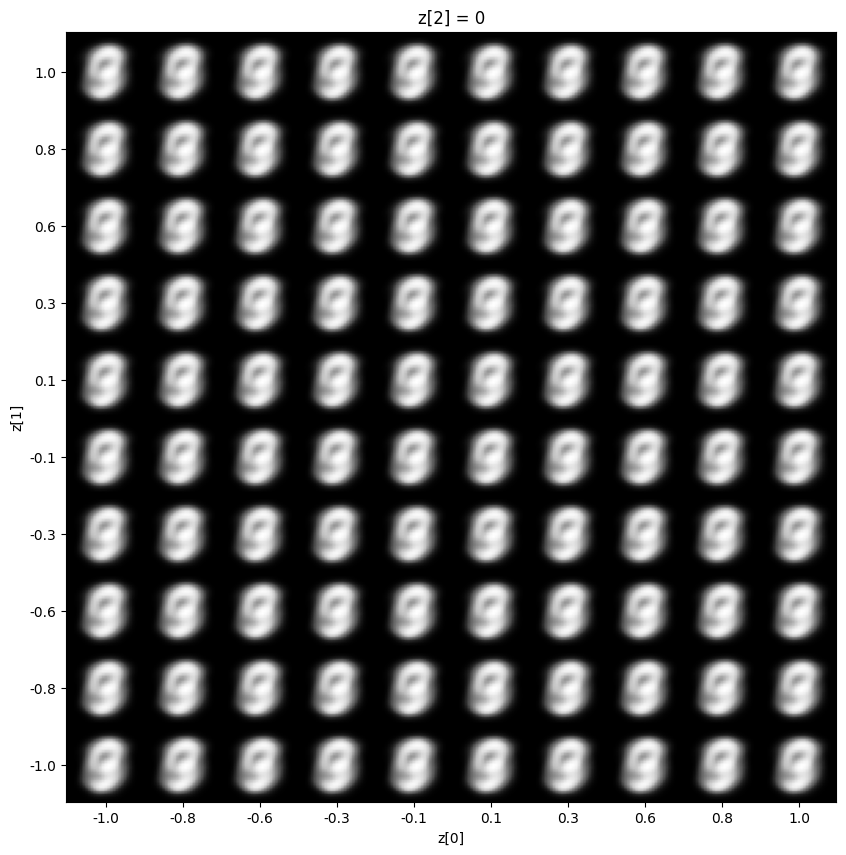

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


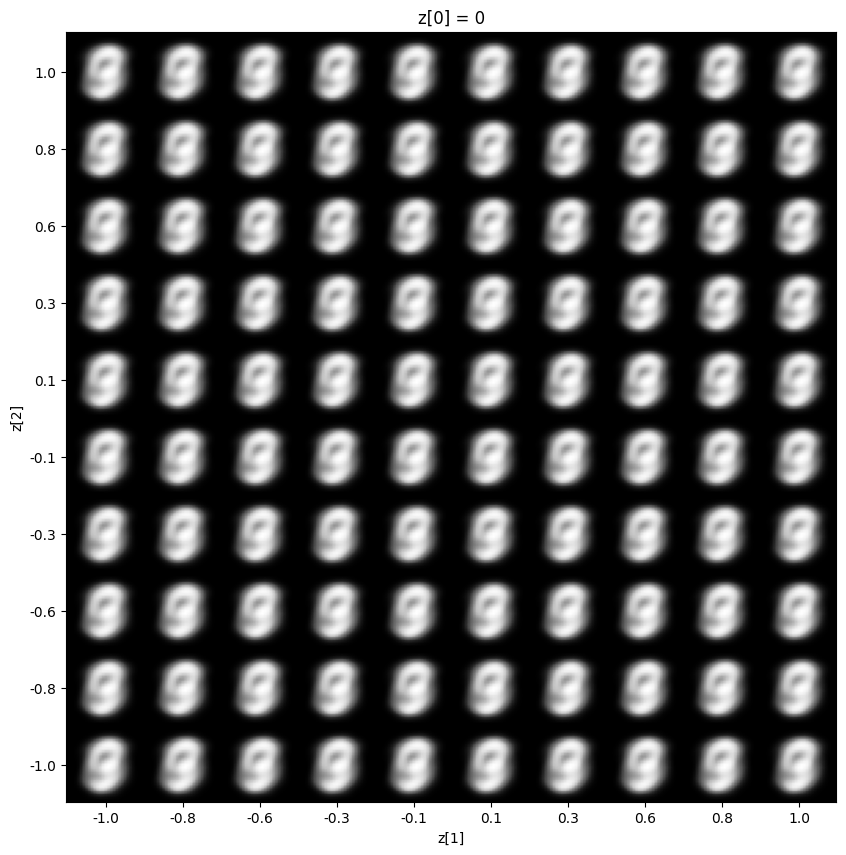

1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


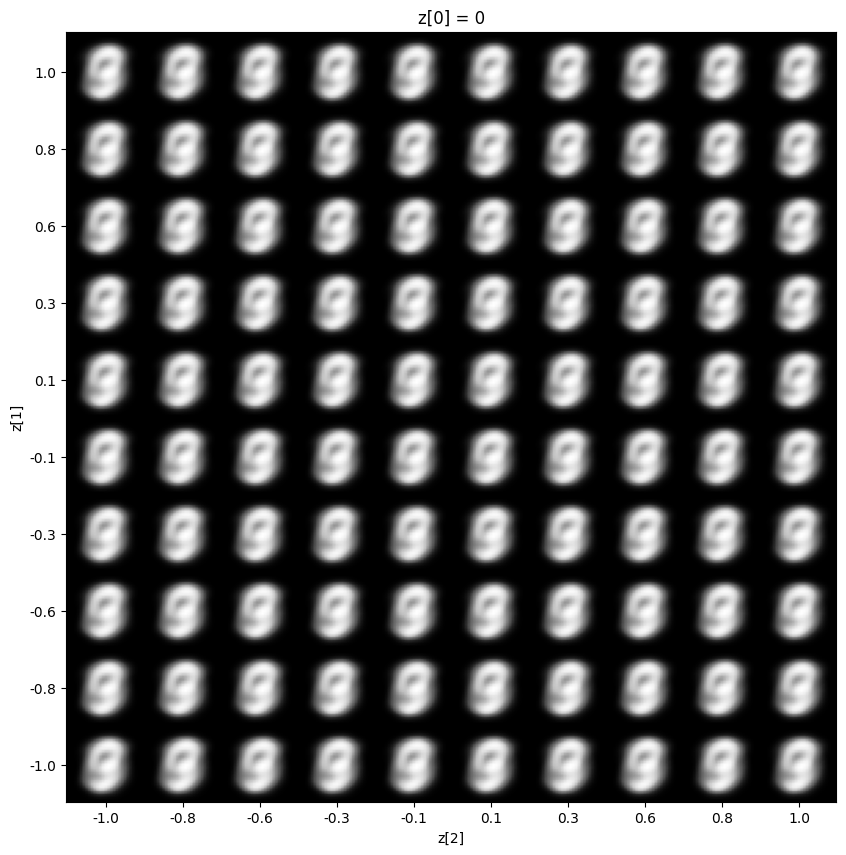

In [15]:
plot_latent_space(vae)

In [16]:
# Principal components
pca = PCA()
latents = vae.encoder.predict(X_train)[2]
pca.fit(latents)

kwargs = {'x_{}'.format(i): (-1., 1.) for i in range(latent_dim)}


@widgets.interact(**kwargs)
def explore_latent_space(**kwargs):
    """Widget to explore latent space from given start position
    """
    center_img = pca.transform(np.zeros([1,latent_dim]))

    latent_rep_pca =  center_img + np.array([[kwargs[key] for key in kwargs]])
    latent_rep = pca.inverse_transform(latent_rep_pca)
    img = vae.decoder(latent_rep).numpy().reshape(28, 28)

    fig, ax = plt.subplots()
    ax.axis('off')
    ax.axis('off')

    ax.imshow(img,cmap='gray', vmin=0, vmax=1)
    plt.show()

   1/1969 [..............................] - ETA: 55s

  68/1969 [>.............................] - ETA: 1s 

 138/1969 [=>............................] - ETA: 1s

 206/1969 [==>...........................] - ETA: 1s

 274/1969 [===>..........................] - ETA: 1s

 343/1969 [====>.........................] - ETA: 1s

 412/1969 [=====>........................] - ETA: 1s

 481/1969 [======>.......................] - ETA: 1s

 551/1969 [=======>......................] - ETA: 1s

 623/1969 [========>.....................] - ETA: 0s

 691/1969 [=========>....................] - ETA: 0s

 760/1969 [==========>...................] - ETA: 0s

 828/1969 [===========>..................] - ETA: 0s

 898/1969 [============>.................] - ETA: 0s

 968/1969 [=============>................] - ETA: 0s

1038/1969 [==============>...............] - ETA: 0s

1107/1969 [===============>..............] - ETA: 0s

1176/1969 [================>.............] - ETA: 0s

1246/1969 [=================>............] - ETA: 0s

1317/1969 [===================>..........] - ETA: 0s

1386/1969 [====================>.........] - ETA: 0s

1456/1969 [=====================>........] - ETA: 0s

1526/1969 [======================>.......] - ETA: 0s

1589/1969 [=======================>......] - ETA: 0s

1658/1969 [========================>.....] - ETA: 0s

1729/1969 [=========================>....] - ETA: 0s

1797/1969 [==========================>...] - ETA: 0s

1865/1969 [===========================>..] - ETA: 0s

1934/1969 [============================>.] - ETA: 0s

1969/1969 [==============================] - 1s 730us/step


interactive(children=(FloatSlider(value=0.0, description='x_0', max=1.0, min=-1.0), FloatSlider(value=0.0, des…

In [17]:
latents = vae.encoder.predict(X_train)[2]
scatter = px.scatter_3d(x=latents[:, 0], y=latents[:, 1], z=latents[:, 2], color=target_train)

scatter.show()

   1/1969 [..............................] - ETA: 16s

  67/1969 [>.............................] - ETA: 1s 

 136/1969 [=>............................] - ETA: 1s

 206/1969 [==>...........................] - ETA: 1s

 276/1969 [===>..........................] - ETA: 1s

 344/1969 [====>.........................] - ETA: 1s

 412/1969 [=====>........................] - ETA: 1s

 482/1969 [======>.......................] - ETA: 1s

 551/1969 [=======>......................] - ETA: 1s

 621/1969 [========>.....................] - ETA: 0s

 691/1969 [=========>....................] - ETA: 0s

 760/1969 [==========>...................] - ETA: 0s

 830/1969 [===========>..................] - ETA: 0s

 899/1969 [============>.................] - ETA: 0s

 968/1969 [=============>................] - ETA: 0s

1037/1969 [==============>...............] - ETA: 0s

1105/1969 [===============>..............] - ETA: 0s

1174/1969 [================>.............] - ETA: 0s

1243/1969 [=================>............] - ETA: 0s

1313/1969 [===================>..........] - ETA: 0s

1378/1969 [===================>..........] - ETA: 0s

1443/1969 [====================>.........] - ETA: 0s

1513/1969 [======================>.......] - ETA: 0s

1584/1969 [=======================>......] - ETA: 0s

1652/1969 [========================>.....] - ETA: 0s

1720/1969 [=========================>....] - ETA: 0s

1790/1969 [==========================>...] - ETA: 0s

1858/1969 [===========================>..] - ETA: 0s

1918/1969 [============================>.] - ETA: 0s

1969/1969 [==============================] - 1s 735us/step


In [18]:
latents = vae.encoder.predict(X_test)[2]
scatter = px.scatter_3d(x=latents[:, 0], y=latents[:, 1], z=latents[:, 2], color=y_test)

scatter.show()

  1/219 [..............................] - ETA: 1s

 64/219 [=======>......................] - ETA: 0s

130/219 [================>.............] - ETA: 0s

197/219 [=========================>....] - ETA: 0s

219/219 [==============================] - 0s 772us/step


In [19]:
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test)


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 8ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 7ms/step


1/1 [==============================] - ETA: 0s

1/1 [==============================] - 0s 6ms/step


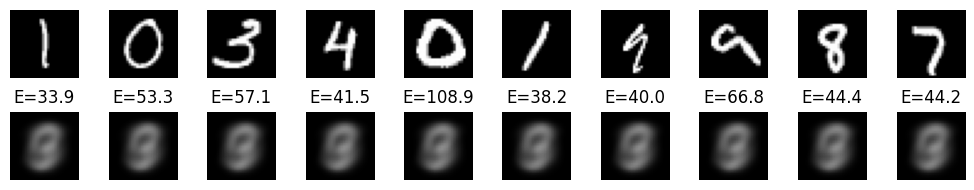

In [20]:
n_samples = 10

s = np.random.choice(range(len(X_val)), n_samples)
s = X_val[s]
#s = [X_train_img[i] for i in s]

fig, axes = plt.subplots(nrows=2, ncols=n_samples, figsize=(10, 2))
for img, ax_row in zip(s, axes.T):
    x = vae.decoder.predict(vae.encoder.predict(img.reshape(1, 28, 28, 1))[2]).reshape(28, 28)
    diff = x - img.reshape(28, 28)
    error = (diff * diff).sum()
    ax_row[0].axis('off')
    ax_row[1].axis('off')
    ax_row[0].imshow(img,cmap='gray', vmin=0, vmax=1)
    ax_row[1].imshow(x, cmap='gray', vmin=0, vmax=1)
    ax_row[1].set_title('E={:.1f}'.format(error))

plt.tight_layout()
plt.show()

 1/55 [..............................] - ETA: 0s

11/55 [=====>........................] - ETA: 0s

21/55 [==========>...................] - ETA: 0s

33/55 [=================>............] - ETA: 0s

44/55 [=======================>......] - ETA: 0s

55/55 [==============================] - ETA: 0s

55/55 [==============================] - 0s 5ms/step


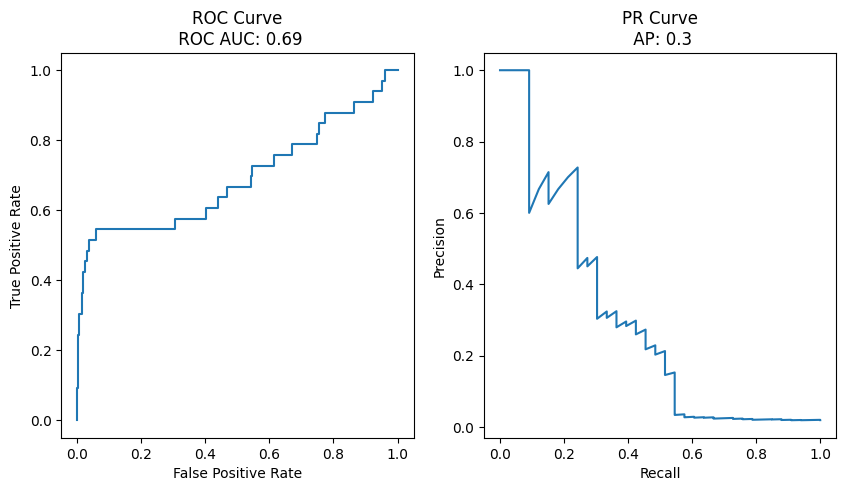

Optimal threshold: 103.85885094252916


  1/165 [..............................] - ETA: 1s

 19/165 [==>...........................] - ETA: 0s

 37/165 [=====>........................] - ETA: 0s

 51/165 [========>.....................] - ETA: 0s

 68/165 [===========>..................] - ETA: 0s

 85/165 [==============>...............] - ETA: 0s

101/165 [=================>............] - ETA: 0s

115/165 [===================>..........] - ETA: 0s

132/165 [=======================>......] - ETA: 0s

149/165 [==========================>...] - ETA: 0s

162/165 [============================>.] - ETA: 0s

165/165 [==============================] - 1s 3ms/step


Precision: 0.4074074074074074
Recall: 0.20754716981132076
F1: 0.275


In [21]:
from sklearn import metrics
y_test_bin = y_test.copy()
y_test_bin[y_test != 0] = 1
y_val_bin = y_val.copy()
y_val_bin[y_val != 0] = 1
# Evaluate
reconstruction = vae.decoder.predict(vae.encoder(X_val)[2])
rerrors = (reconstruction - X_val).reshape(-1, 28*28)
rerrors = (rerrors * rerrors).sum(axis=1)

# Let's calculate scores if any anomaly is present
if np.any(y_val_bin == 1):
    eval = evaluate(y_val_bin.astype(int), rerrors.astype(float))
    pr, rec, thr = eval['PR']
    f1s = (2 * ((pr * rec)[:-1]/(pr + rec)[:-1]))
    threshold = thr[np.argmax(f1s)]
    print('Optimal threshold: {}'.format(threshold))

    reconstruction = vae.decoder.predict(vae.encoder(X_test)[2])
    reconstruction_error = (reconstruction - X_test).reshape(-1, 28*28)
    reconstruction_error = (reconstruction_error * reconstruction_error).sum(axis=1)


    classification = (reconstruction_error > threshold).astype(int)

    print('Precision: {}'.format(metrics.precision_score(y_test_bin, classification)))
    print('Recall: {}'.format(metrics.recall_score(y_test_bin, classification)))
    print('F1: {}'.format(metrics.f1_score(y_test_bin, classification)))

    metrics.confusion_matrix(y_test_bin, classification)
else:
    reconstruction_error = None


## Sort Data by Reconstruction Error

In [22]:
if reconstruction_error is not None:
    combined = list(zip(X_test, reconstruction_error))
    combined.sort(key = lambda x: x[1])


## Show Top Autoencoder Outliers

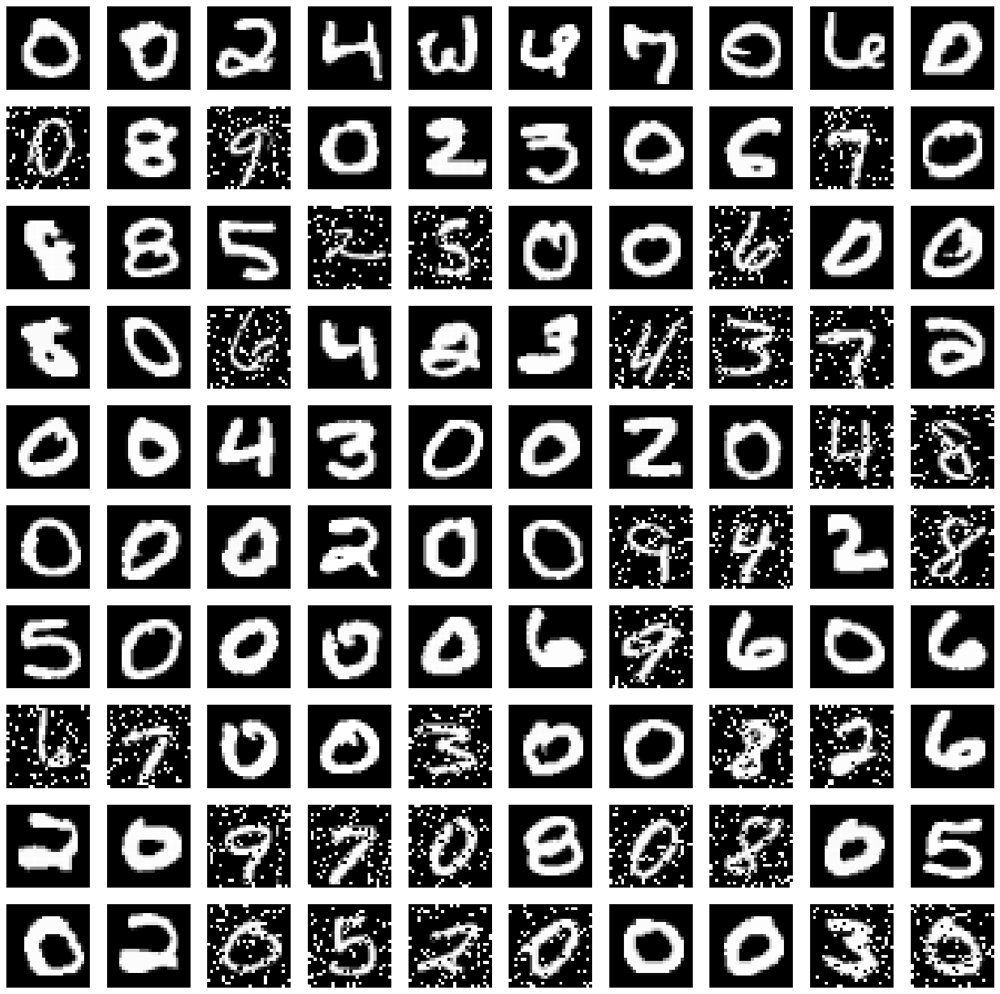

In [23]:
if reconstruction_error is not None:
    n_rows = 10
    n_cols = 10
    n_samples = n_rows*n_cols

    samples = [c[0] for c in combined[-n_samples:]]

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(2*n_cols, 2*n_rows))
    for img, ax in zip(samples, axes.reshape(-1)):
        ax.axis('off')
        ax.imshow(img.reshape((28,28)), cmap='gray', vmin=0, vmax=1)

    plt.show()


# Summary
- Autoencoders are the most prominent reconstruction error based anomaly detection method.
- Can provide high quality results on high dimensional data.
- Architecture is highly adaptable to the data (fully connected, CNN, attention,...).
- Sensitive to contamination.
- Variational autoencoder are an important variant the improves the interpretability of the latent space.

## Implementations
- Keras: see vae.py or [here](https://keras.io/examples/generative/vae/)
- Pytorch: [example implementation](https://colab.research.google.com/github/smartgeometry-ucl/dl4g/blob/master/variational_autoencoder.ipynb)
- Pyro (pytorch based probabilistic programming language): [example implementation](https://pyro.ai/examples/vae.html)

<img src="_static/images/aai_presentation_last_slide.svg" alt="Snow" style="width:100%;">